In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torch.optim as optim
import torchvision
import numpy as np 
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter

In [2]:
import torch
import torch.nn as nn


class Discriminator(nn.Module):
    def __init__(self, nc, d_s , num_classes , image_size):
        super(Discriminator, self).__init__()
        self.img_size = image_size
        self.disc_layer = nn.Sequential(nn.Conv2d(nc+1, d_s, 3, 2, 1),
                                    nn.LeakyReLU(0.2, inplace=True),
                                    
                                    nn.Conv2d(d_s, d_s * 2, 3, 2, 1),
                                    nn.BatchNorm2d(d_s * 2),
                                    nn.LeakyReLU(0.2, inplace=True),

                                    nn.Conv2d(d_s * 2, d_s * 4, 4, 2, 1),
                                    nn.BatchNorm2d(d_s * 4),
                                    nn.LeakyReLU(0.2, inplace=True),


                                    nn.Conv2d(d_s * 4, d_s * 8, 3, 2, 1),
                                    nn.BatchNorm2d(d_s * 8),
                                    nn.LeakyReLU(0.2, inplace=True),

                                    nn.Conv2d(d_s * 8, 1, 4, 1, 0),
                                    )

        self.embed = nn.Embedding(nums_classes , self.img_size * self.img_size)

    def forward(self, x , labels):
        embedding = self.embed(labels).view(labels.shape[0] , 1 , self.img_size , self.img_size)
        #print("here - 1")
        #print(embedding.size)
        x = torch.cat([x , embedding] , dim = 1)
        return self.disc_layer(x)




In [3]:
class Generator(nn.Module):
  def __init__(self, channels_noise, channels_img, features_g , nums_classes , img_size , embed_size , ):
    super(Generator, self).__init__()
    self.gen_layer = nn.Sequential(nn.ConvTranspose2d(channels_noise + embed_size, features_g  * 4 , 2),
                                   nn.ConvTranspose2d(features_g*4 , features_g *8 , 3),
                                   nn.BatchNorm2d(features_g * 8),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g*8 , features_g*6 , 1, 2),
                                   nn.ConvTranspose2d(features_g*6 , features_g*4 , 2, 1),
                                   nn.BatchNorm2d(features_g*4),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g * 4 , features_g*2 , 4, 2,1),
                                   nn.BatchNorm2d(features_g*2),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g*2 , features_g , 4, 2, 1),
                                   nn.BatchNorm2d(features_g),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g , channel_img , 4, 2, 1),
                                   nn.Tanh()        
                      )
    self.embed = nn.Embedding(nums_classes , embed_size)

  def forward(self,x,labels):
    embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
    x = torch.cat([x , embedding] , dim = 1)
    out = self.gen_layer(x)
    return out

                           

In [ ]:
class Generator(nn.Module):
  def __init__(self, channels_noise, channels_img, features_g , nums_classes , img_size , embed_size , ):
    super(Generator, self).__init__()
    self.gen_layer = nn.Sequential(nn.ConvTranspose2d(channels_noise + embed_size, features_g  * 4 , 2),
                                   nn.ConvTranspose2d(features_g*4 , features_g *8 , 3),
                                   nn.BatchNorm2d(features_g * 8),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g*8 , features_g*6 , 1, 2),
                                   nn.ConvTranspose2d(features_g*6 , features_g*4 , 2, 1),
                                   nn.BatchNorm2d(features_g*4),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g * 4 , features_g*2 , 4, 2,1),
                                   nn.BatchNorm2d(features_g*2),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g*2 , features_g , 4, 2, 1),
                                   nn.BatchNorm2d(features_g),
                                   nn.ReLU(True),

                                   nn.ConvTranspose2d(features_g , channel_img , 4, 2, 1),
                                   nn.Tanh()        
                      )
    self.embed = nn.Embedding(nums_classes , embed_size)

  def forward(self,x,labels):
    embedding = self.embed(labels).unsqueeze(2).unsqueeze(3)
    x = torch.cat([x , embedding] , dim = 1)
    out = self.gen_layer(x)
    return out

In [4]:
lr = 1e-4
batch_size = 64
image_size = 64
channel_img = 1
nums_classes = 10
gen_embedding = 100
z = 100
num_epochs = 50
feature_critic = 16
feature_gen = 16
critic_iterations = 5
lamba_gp = 10


In [5]:
t = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize(image_size),
        transforms.Normalize([0.5], [0.5])
])
dataset = datasets.MNIST(root = "dataset/" , train=True , transform = t , download = True)

100%|██████████| 9912422/9912422 [00:00<00:00, 110779939.37it/s]


Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 4866059.85it/s]


Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 62373882.98it/s]


Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 17101013.26it/s]

Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw



In [6]:
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
#channels_noise, channels_img, features_g , nums_classes , img_size , embed_size)
gen = Generator(z, channel_img , feature_gen, nums_classes , image_size , gen_embedding ).cuda()
#initialize_weights(gen)

In [7]:
# nc , ndf , img_size , nums_classes
#channels_img, features_d , num_classes , image_size
disc = Discriminator(channel_img , feature_critic , nums_classes , image_size).cuda()
#initialize_weights(disc)

In [8]:
opt_gen = optim.RMSprop(gen.parameters(), lr=lr)
opt_critic = optim.RMSprop(disc.parameters(), lr=lr)

In [9]:
def gradient_penalty(critic, labels , real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images , labels)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Epoch [0/50] Batch 100/938                   Loss D: -30.6872, loss G: 17.2717
tensor([2, 9, 0, 5, 9, 6, 6, 6, 7, 0, 2, 9, 7, 6, 1, 9, 1, 9, 4, 5, 3, 8, 6, 7,
        1, 4, 1, 7, 0, 0, 9, 7, 6, 9, 8, 4, 6, 1, 3, 7, 4, 0, 8, 5, 4, 4, 0, 2,
        6, 3, 0, 4, 0, 9, 4, 8, 8, 9, 5, 9, 6, 1, 0, 8], device='cuda:0')


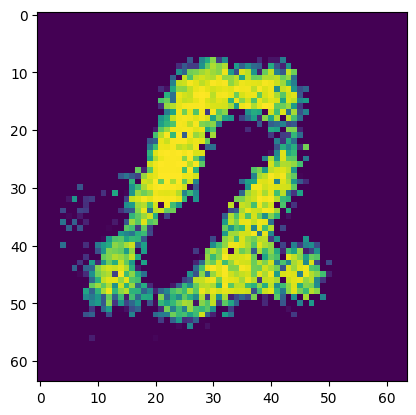

Epoch [0/50] Batch 200/938                   Loss D: -22.0264, loss G: 15.5817
tensor([0, 1, 7, 5, 2, 1, 7, 0, 3, 9, 6, 5, 4, 0, 9, 7, 1, 5, 7, 1, 2, 0, 3, 8,
        9, 4, 6, 5, 5, 2, 5, 4, 3, 6, 0, 5, 8, 1, 9, 9, 9, 1, 7, 2, 6, 1, 2, 6,
        9, 5, 3, 3, 3, 7, 1, 3, 1, 1, 6, 7, 8, 0, 1, 6], device='cuda:0')


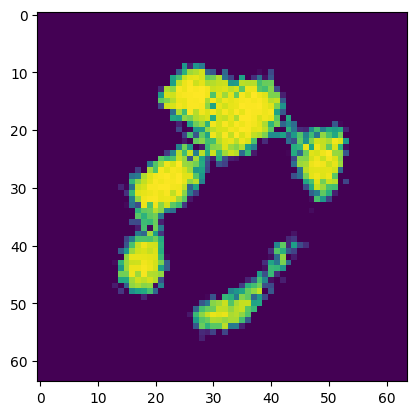

Epoch [0/50] Batch 300/938                   Loss D: -28.9164, loss G: 16.3647
tensor([3, 4, 2, 0, 7, 3, 0, 5, 8, 3, 7, 8, 4, 2, 3, 4, 7, 6, 3, 6, 1, 7, 9, 0,
        5, 5, 5, 0, 8, 7, 1, 1, 4, 9, 4, 6, 9, 9, 2, 7, 2, 8, 0, 2, 3, 1, 2, 9,
        5, 4, 2, 9, 8, 8, 7, 1, 1, 8, 7, 7, 0, 6, 5, 9], device='cuda:0')


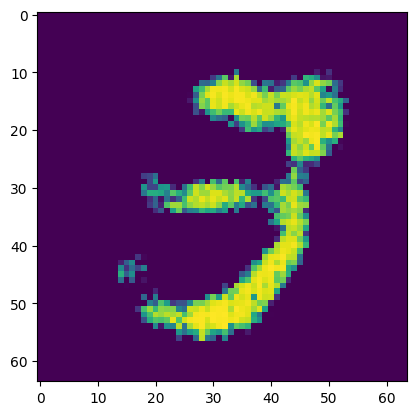

Epoch [0/50] Batch 400/938                   Loss D: -38.3042, loss G: 23.6355
tensor([0, 2, 1, 1, 8, 0, 4, 3, 8, 4, 2, 8, 8, 6, 5, 6, 9, 7, 3, 9, 2, 7, 3, 7,
        5, 3, 9, 2, 3, 7, 1, 3, 7, 6, 3, 4, 8, 4, 8, 2, 1, 4, 9, 9, 6, 7, 7, 7,
        4, 9, 7, 1, 1, 3, 5, 9, 4, 9, 4, 9, 2, 4, 3, 1], device='cuda:0')


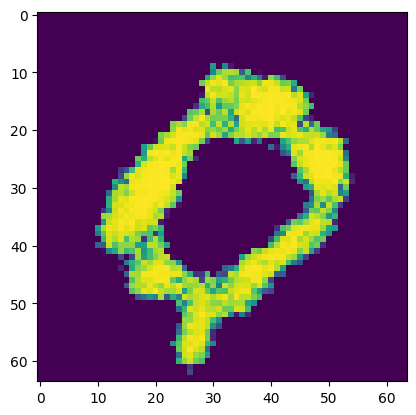

Epoch [0/50] Batch 500/938                   Loss D: -14.8241, loss G: 24.9084
tensor([5, 3, 1, 9, 1, 2, 0, 8, 3, 7, 5, 8, 3, 7, 1, 3, 9, 0, 7, 3, 6, 1, 5, 5,
        0, 7, 5, 0, 5, 7, 6, 6, 9, 3, 4, 0, 5, 2, 6, 2, 5, 4, 3, 8, 4, 4, 7, 2,
        8, 3, 6, 0, 2, 1, 8, 0, 2, 4, 4, 1, 3, 5, 1, 8], device='cuda:0')


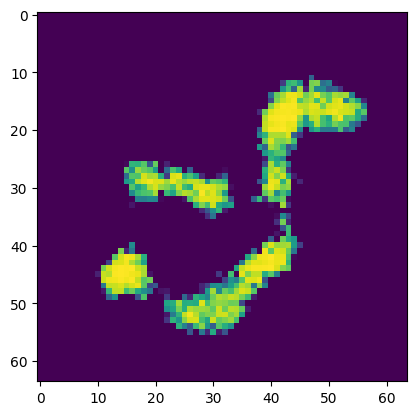

Epoch [0/50] Batch 600/938                   Loss D: -72.7339, loss G: 8.3783
tensor([2, 9, 3, 7, 6, 3, 1, 7, 5, 7, 3, 8, 9, 6, 3, 2, 1, 5, 3, 0, 8, 2, 1, 7,
        1, 1, 5, 6, 3, 0, 9, 3, 2, 3, 9, 0, 4, 9, 9, 0, 5, 5, 8, 6, 2, 7, 1, 7,
        8, 7, 6, 9, 5, 8, 7, 7, 7, 1, 3, 2, 1, 3, 3, 2], device='cuda:0')


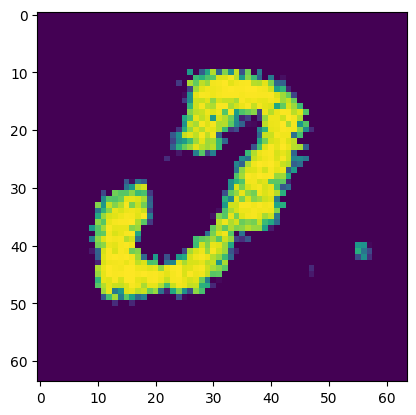

Epoch [0/50] Batch 700/938                   Loss D: -75.6890, loss G: 30.7334
tensor([1, 0, 2, 2, 7, 4, 5, 2, 3, 1, 0, 1, 7, 7, 9, 7, 6, 7, 9, 9, 4, 7, 8, 3,
        0, 2, 0, 4, 1, 9, 4, 9, 0, 6, 0, 5, 9, 4, 5, 6, 8, 6, 1, 1, 8, 6, 5, 1,
        5, 2, 7, 2, 9, 9, 4, 3, 6, 4, 6, 1, 3, 0, 6, 4], device='cuda:0')


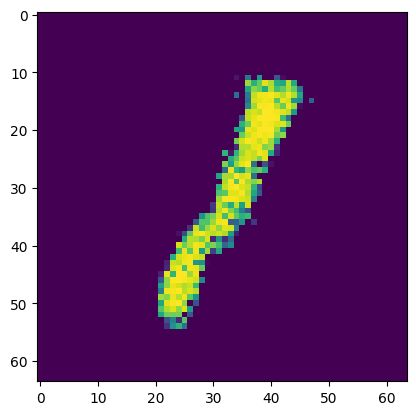

Epoch [0/50] Batch 800/938                   Loss D: -114.7049, loss G: 69.5324
tensor([9, 8, 4, 4, 1, 4, 6, 5, 2, 6, 6, 7, 9, 8, 7, 2, 7, 0, 8, 0, 1, 5, 1, 4,
        4, 6, 9, 4, 7, 9, 7, 8, 3, 3, 9, 5, 0, 9, 5, 1, 1, 5, 1, 7, 1, 9, 5, 3,
        9, 7, 8, 4, 2, 6, 3, 9, 7, 3, 4, 4, 0, 5, 3, 0], device='cuda:0')


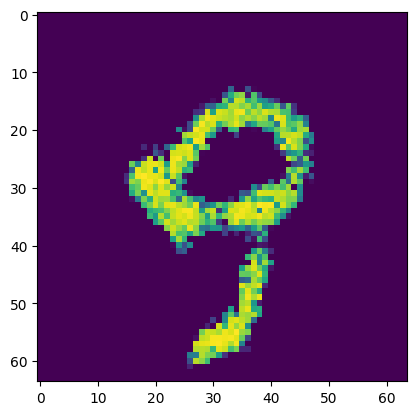

Epoch [0/50] Batch 900/938                   Loss D: -126.6615, loss G: 27.5964
tensor([1, 1, 3, 8, 0, 7, 8, 5, 2, 0, 6, 1, 5, 0, 6, 1, 4, 8, 7, 3, 6, 8, 4, 8,
        9, 1, 8, 9, 3, 6, 9, 4, 9, 0, 1, 0, 4, 5, 9, 8, 6, 0, 2, 1, 2, 3, 8, 9,
        5, 9, 3, 6, 6, 0, 8, 4, 1, 9, 5, 0, 8, 1, 9, 5], device='cuda:0')


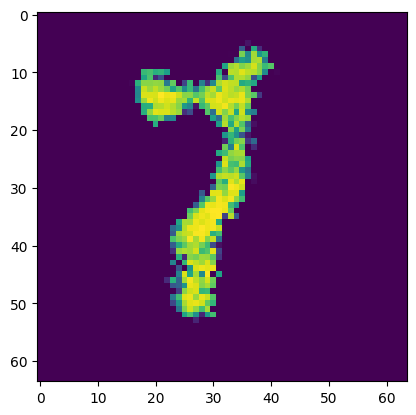

Epoch [1/50] Batch 100/938                   Loss D: -157.7478, loss G: 101.3285
tensor([0, 5, 8, 2, 5, 3, 5, 8, 5, 0, 7, 1, 6, 7, 4, 9, 1, 9, 5, 3, 3, 0, 3, 7,
        9, 9, 4, 5, 3, 7, 3, 1, 5, 9, 9, 8, 7, 2, 3, 3, 5, 7, 2, 1, 2, 9, 6, 0,
        8, 0, 5, 8, 6, 5, 1, 9, 7, 5, 4, 8, 3, 8, 4, 3], device='cuda:0')


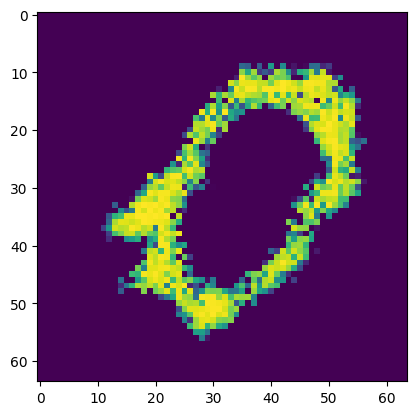

Epoch [1/50] Batch 200/938                   Loss D: -243.7310, loss G: 151.8853
tensor([7, 9, 4, 6, 0, 9, 4, 5, 2, 1, 0, 1, 7, 6, 3, 8, 4, 6, 2, 8, 8, 5, 6, 3,
        8, 5, 1, 2, 4, 6, 7, 6, 9, 6, 2, 6, 3, 3, 8, 5, 6, 4, 1, 8, 6, 6, 6, 7,
        9, 7, 0, 6, 9, 8, 0, 4, 7, 1, 1, 3, 9, 0, 1, 1], device='cuda:0')


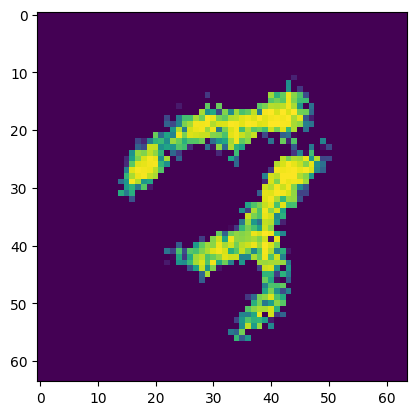

Epoch [1/50] Batch 300/938                   Loss D: -406.1602, loss G: 95.1584
tensor([1, 0, 5, 6, 6, 1, 4, 9, 3, 1, 4, 6, 0, 3, 9, 3, 6, 1, 6, 2, 3, 1, 5, 9,
        0, 0, 4, 4, 5, 4, 3, 8, 5, 5, 7, 9, 5, 1, 4, 1, 1, 0, 7, 7, 7, 9, 7, 8,
        4, 2, 0, 4, 9, 0, 8, 7, 8, 3, 3, 3, 0, 8, 2, 6], device='cuda:0')


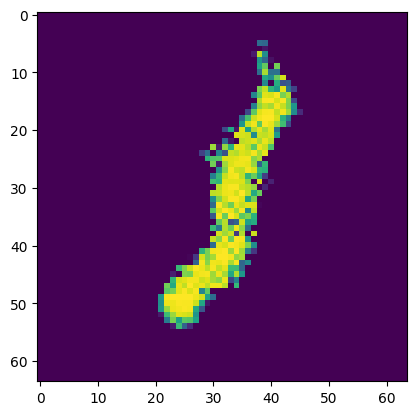

Epoch [1/50] Batch 400/938                   Loss D: -431.4464, loss G: 239.4116
tensor([2, 3, 0, 9, 2, 6, 3, 2, 6, 0, 4, 3, 2, 0, 6, 0, 6, 9, 1, 7, 9, 1, 9, 1,
        9, 1, 7, 5, 4, 1, 0, 5, 1, 1, 9, 3, 7, 3, 6, 7, 5, 0, 3, 3, 0, 7, 2, 4,
        5, 8, 6, 1, 5, 9, 8, 8, 4, 3, 1, 2, 4, 3, 9, 0], device='cuda:0')


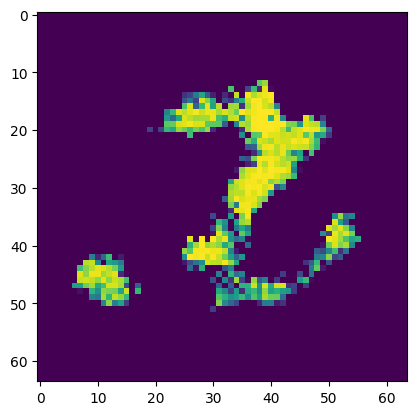

Epoch [1/50] Batch 500/938                   Loss D: -438.3649, loss G: 139.3224
tensor([1, 3, 2, 7, 9, 8, 9, 7, 6, 0, 8, 1, 8, 2, 9, 8, 4, 8, 4, 9, 6, 1, 4, 9,
        4, 9, 2, 4, 8, 6, 6, 5, 8, 8, 0, 4, 4, 5, 4, 9, 1, 8, 0, 7, 2, 1, 2, 2,
        8, 8, 2, 8, 4, 1, 8, 3, 1, 8, 2, 4, 8, 0, 7, 9], device='cuda:0')


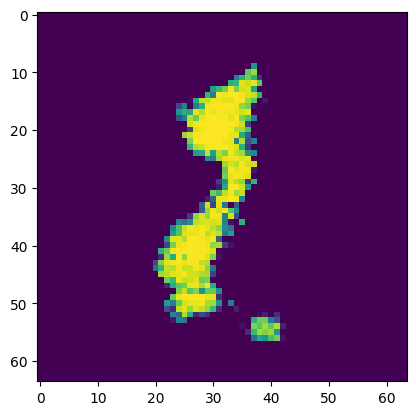

Epoch [1/50] Batch 600/938                   Loss D: -446.5789, loss G: 318.7586
tensor([1, 3, 7, 0, 7, 2, 4, 8, 9, 7, 1, 3, 7, 0, 5, 9, 8, 2, 5, 2, 4, 4, 7, 5,
        5, 9, 1, 6, 1, 5, 6, 5, 2, 7, 8, 0, 3, 7, 6, 1, 4, 4, 0, 7, 1, 5, 1, 2,
        5, 1, 8, 6, 1, 3, 5, 7, 2, 9, 6, 7, 2, 7, 1, 7], device='cuda:0')


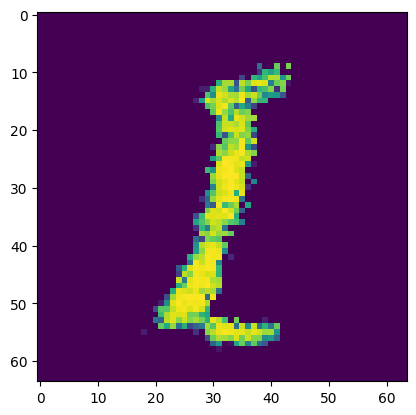

Epoch [1/50] Batch 700/938                   Loss D: -681.9956, loss G: 299.5132
tensor([3, 8, 7, 4, 3, 3, 7, 8, 8, 3, 3, 7, 7, 1, 9, 5, 6, 4, 1, 2, 6, 6, 7, 9,
        8, 7, 7, 8, 8, 6, 7, 8, 0, 0, 9, 7, 9, 1, 2, 0, 7, 5, 0, 7, 3, 5, 8, 6,
        6, 5, 8, 2, 1, 1, 4, 3, 0, 3, 5, 2, 2, 6, 3, 6], device='cuda:0')


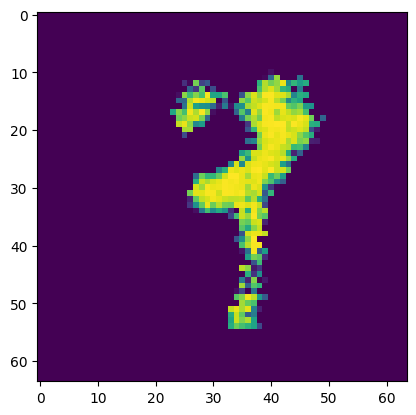

Epoch [1/50] Batch 800/938                   Loss D: -759.0943, loss G: 295.9146
tensor([2, 5, 1, 0, 3, 5, 7, 5, 0, 2, 4, 7, 3, 3, 2, 3, 8, 1, 3, 1, 8, 5, 0, 2,
        0, 8, 7, 1, 6, 6, 1, 6, 0, 2, 1, 7, 0, 4, 0, 2, 9, 4, 8, 1, 0, 5, 8, 3,
        0, 3, 1, 2, 6, 0, 9, 6, 2, 6, 4, 0, 7, 7, 3, 3], device='cuda:0')


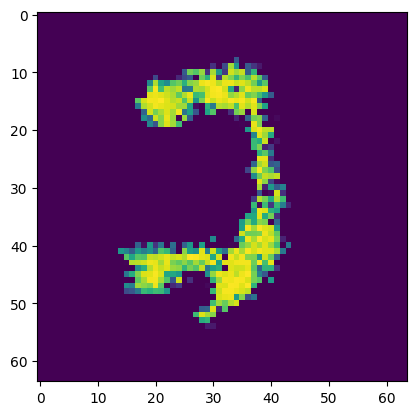

Epoch [1/50] Batch 900/938                   Loss D: -934.7976, loss G: 432.2150
tensor([9, 2, 8, 1, 5, 4, 8, 2, 2, 3, 4, 0, 1, 7, 4, 1, 9, 6, 3, 9, 7, 3, 0, 5,
        5, 3, 7, 7, 3, 7, 0, 0, 7, 6, 4, 5, 1, 0, 9, 4, 4, 4, 9, 8, 4, 7, 5, 4,
        9, 1, 2, 1, 0, 1, 7, 6, 1, 2, 0, 3, 2, 7, 2, 0], device='cuda:0')


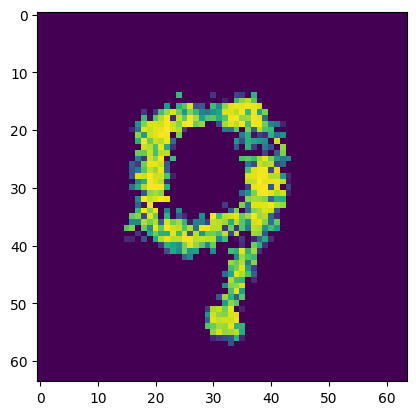

Epoch [2/50] Batch 100/938                   Loss D: -1102.0024, loss G: 440.0937
tensor([4, 4, 1, 2, 5, 8, 3, 0, 9, 1, 8, 3, 7, 2, 0, 9, 7, 0, 9, 9, 0, 2, 6, 9,
        7, 8, 1, 9, 4, 1, 3, 2, 9, 3, 7, 5, 0, 7, 7, 0, 7, 4, 4, 2, 1, 8, 9, 9,
        6, 2, 2, 0, 1, 2, 5, 6, 6, 6, 0, 3, 9, 2, 8, 8], device='cuda:0')


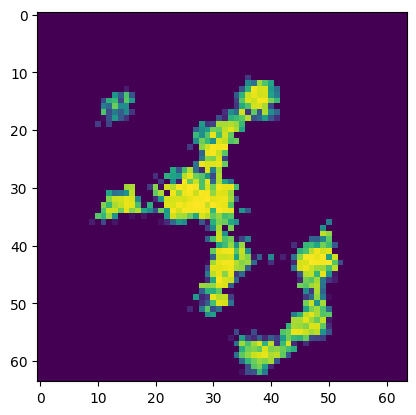

Epoch [2/50] Batch 200/938                   Loss D: -889.3602, loss G: 332.1375
tensor([1, 1, 3, 9, 7, 2, 0, 0, 7, 1, 1, 8, 2, 9, 2, 0, 2, 5, 0, 1, 7, 1, 2, 0,
        1, 2, 5, 9, 5, 2, 0, 2, 4, 2, 7, 8, 0, 4, 8, 8, 3, 8, 2, 4, 5, 9, 0, 5,
        0, 3, 7, 2, 3, 0, 9, 9, 8, 5, 5, 6, 7, 3, 6, 8], device='cuda:0')


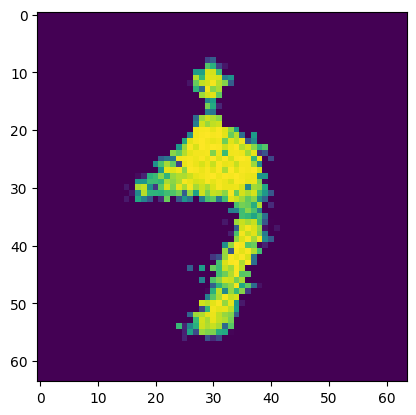

Epoch [2/50] Batch 300/938                   Loss D: -606.6630, loss G: 103.4333
tensor([5, 0, 3, 1, 8, 3, 3, 2, 6, 9, 2, 6, 7, 8, 7, 6, 1, 5, 7, 0, 7, 0, 0, 9,
        1, 1, 7, 3, 7, 8, 5, 0, 3, 8, 7, 2, 3, 2, 6, 1, 6, 1, 3, 4, 7, 0, 8, 4,
        2, 8, 8, 4, 3, 3, 1, 5, 5, 1, 4, 9, 0, 1, 3, 1], device='cuda:0')


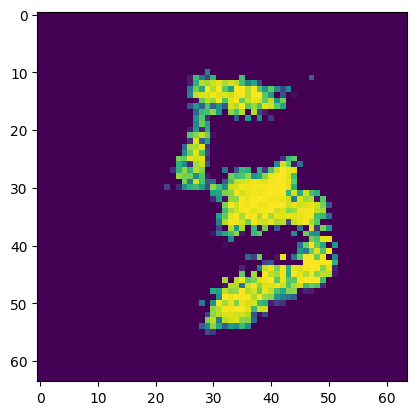

Epoch [2/50] Batch 400/938                   Loss D: -1313.3540, loss G: 590.1336
tensor([0, 1, 2, 2, 9, 1, 2, 3, 6, 2, 0, 8, 2, 2, 4, 4, 4, 6, 1, 2, 5, 4, 6, 3,
        5, 7, 1, 3, 3, 6, 2, 1, 4, 8, 8, 0, 7, 2, 3, 1, 8, 4, 3, 6, 0, 7, 2, 8,
        4, 3, 8, 7, 1, 1, 0, 9, 0, 3, 4, 6, 8, 7, 1, 8], device='cuda:0')


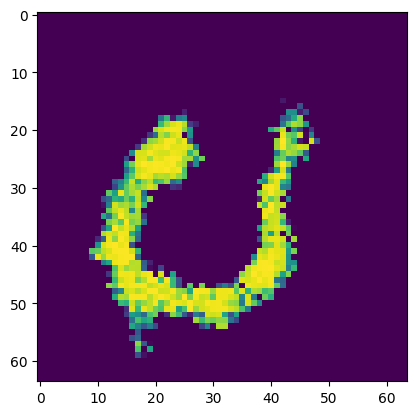

Epoch [2/50] Batch 500/938                   Loss D: -1380.6099, loss G: 830.7758
tensor([1, 6, 1, 9, 9, 8, 2, 9, 0, 9, 7, 5, 2, 2, 9, 6, 6, 7, 3, 5, 9, 3, 9, 8,
        7, 7, 7, 7, 1, 9, 4, 6, 1, 3, 2, 7, 1, 3, 4, 0, 6, 8, 3, 5, 2, 2, 5, 2,
        1, 8, 6, 8, 7, 8, 8, 0, 9, 5, 3, 8, 8, 4, 2, 1], device='cuda:0')


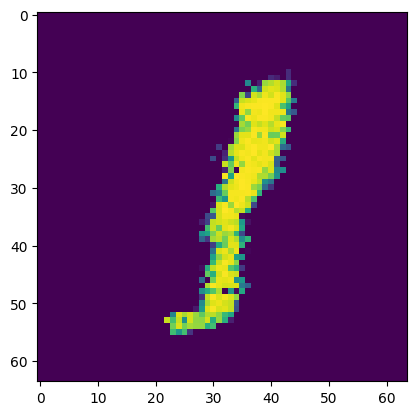

Epoch [2/50] Batch 600/938                   Loss D: -1739.1411, loss G: 910.5953
tensor([2, 1, 8, 8, 7, 3, 9, 5, 4, 3, 9, 4, 8, 2, 9, 2, 8, 3, 1, 3, 4, 2, 8, 3,
        4, 4, 7, 3, 7, 2, 9, 9, 5, 0, 4, 1, 7, 3, 4, 9, 6, 9, 3, 5, 9, 2, 4, 6,
        8, 4, 8, 9, 2, 5, 1, 6, 2, 3, 3, 7, 4, 7, 7, 9], device='cuda:0')


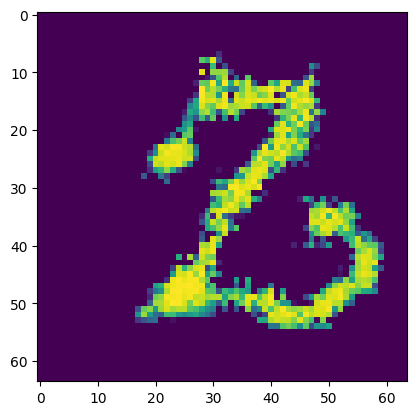

Epoch [2/50] Batch 700/938                   Loss D: -1918.3839, loss G: 743.1962
tensor([6, 3, 7, 9, 7, 3, 4, 4, 2, 9, 7, 2, 5, 7, 4, 1, 6, 7, 7, 6, 9, 3, 2, 6,
        1, 6, 6, 8, 2, 2, 8, 7, 9, 2, 6, 2, 2, 6, 8, 7, 0, 9, 6, 8, 9, 2, 7, 3,
        2, 8, 1, 0, 6, 9, 5, 2, 3, 8, 8, 1, 3, 4, 8, 5], device='cuda:0')


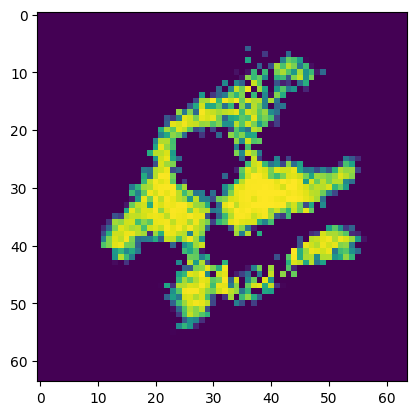

Epoch [2/50] Batch 800/938                   Loss D: -1328.2006, loss G: 689.6929
tensor([8, 8, 4, 9, 1, 4, 1, 8, 4, 8, 9, 2, 5, 0, 7, 5, 1, 1, 8, 6, 5, 7, 2, 8,
        4, 0, 4, 2, 7, 6, 2, 0, 4, 6, 3, 3, 7, 7, 2, 2, 4, 6, 2, 9, 6, 6, 1, 6,
        1, 9, 7, 0, 8, 5, 2, 9, 3, 6, 5, 5, 5, 2, 0, 1], device='cuda:0')


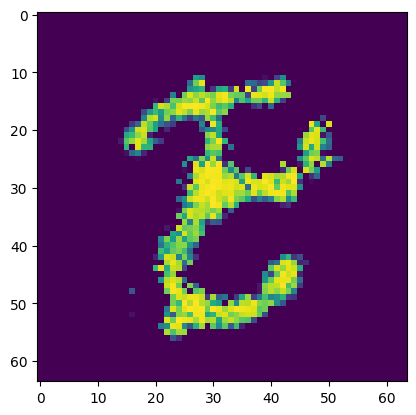

Epoch [2/50] Batch 900/938                   Loss D: -1639.5598, loss G: 1051.2443
tensor([4, 8, 9, 4, 0, 9, 8, 8, 4, 0, 7, 5, 0, 8, 5, 8, 4, 3, 4, 4, 8, 5, 4, 2,
        1, 6, 9, 4, 2, 9, 5, 9, 2, 4, 5, 0, 9, 4, 1, 5, 1, 0, 6, 7, 0, 0, 4, 2,
        5, 7, 1, 3, 7, 3, 2, 2, 0, 2, 2, 1, 8, 1, 4, 4], device='cuda:0')


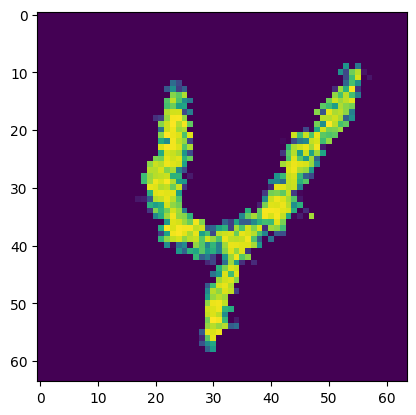

Epoch [3/50] Batch 100/938                   Loss D: -1665.2267, loss G: 1223.6946
tensor([7, 8, 6, 8, 4, 0, 3, 0, 1, 3, 0, 9, 1, 7, 3, 4, 9, 8, 6, 4, 7, 6, 7, 0,
        6, 4, 5, 9, 5, 9, 7, 7, 4, 5, 6, 3, 2, 1, 8, 7, 4, 5, 4, 5, 2, 3, 8, 1,
        1, 6, 7, 0, 3, 4, 5, 0, 4, 2, 8, 3, 8, 2, 6, 4], device='cuda:0')


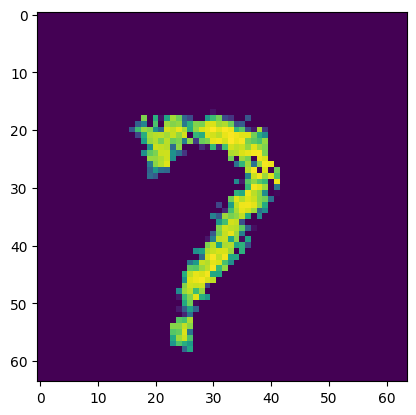

Epoch [3/50] Batch 200/938                   Loss D: -1882.4374, loss G: 1019.7496
tensor([8, 4, 5, 7, 0, 7, 1, 4, 0, 7, 3, 2, 1, 1, 9, 1, 5, 4, 2, 5, 7, 2, 9, 9,
        1, 2, 1, 5, 3, 7, 3, 3, 0, 9, 3, 7, 3, 6, 5, 7, 5, 8, 1, 0, 5, 4, 8, 6,
        9, 0, 8, 6, 2, 4, 9, 0, 4, 4, 8, 4, 3, 2, 0, 0], device='cuda:0')


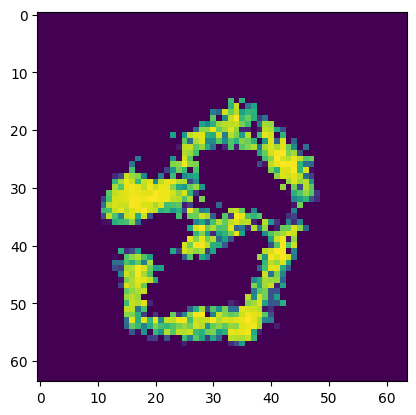

Epoch [3/50] Batch 300/938                   Loss D: -2859.5437, loss G: 1014.4187
tensor([2, 9, 9, 7, 5, 5, 0, 1, 6, 9, 9, 1, 3, 4, 7, 2, 2, 1, 6, 8, 6, 2, 0, 8,
        4, 6, 2, 0, 0, 4, 1, 9, 6, 8, 4, 6, 6, 0, 8, 0, 4, 2, 4, 5, 7, 6, 7, 4,
        6, 7, 6, 9, 1, 0, 6, 7, 0, 0, 0, 6, 9, 8, 6, 0], device='cuda:0')


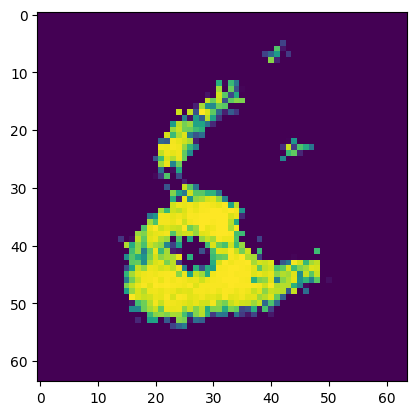

Epoch [3/50] Batch 400/938                   Loss D: -480.1278, loss G: 1297.9482
tensor([3, 2, 9, 0, 7, 4, 7, 5, 0, 8, 9, 7, 9, 1, 0, 5, 0, 4, 6, 8, 9, 4, 6, 3,
        4, 2, 8, 2, 5, 6, 9, 1, 3, 6, 0, 4, 6, 4, 0, 5, 1, 3, 9, 6, 7, 4, 2, 3,
        3, 4, 4, 0, 1, 6, 9, 1, 7, 1, 4, 7, 3, 5, 0, 6], device='cuda:0')


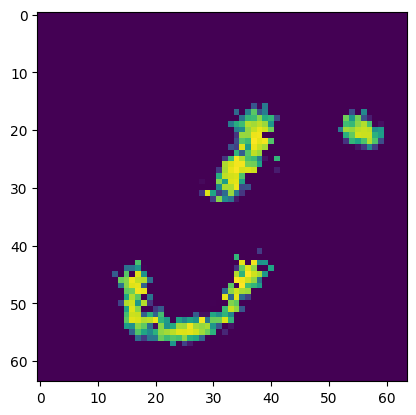

Epoch [3/50] Batch 500/938                   Loss D: -2380.9731, loss G: 1222.7166
tensor([0, 6, 8, 6, 4, 2, 0, 1, 5, 4, 2, 1, 9, 1, 1, 4, 9, 9, 4, 6, 7, 4, 9, 7,
        4, 1, 0, 0, 8, 9, 9, 2, 2, 0, 6, 7, 3, 9, 5, 0, 4, 2, 8, 9, 6, 9, 3, 9,
        6, 7, 0, 0, 1, 1, 5, 3, 7, 3, 7, 6, 8, 8, 0, 7], device='cuda:0')


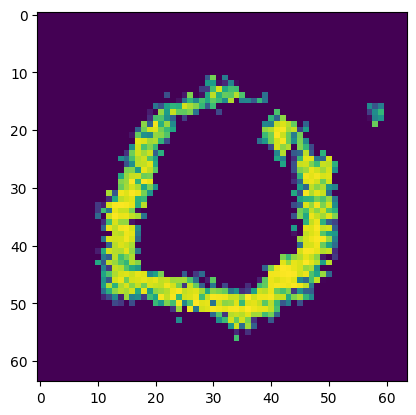

Epoch [3/50] Batch 600/938                   Loss D: -3356.5342, loss G: 1631.1741
tensor([5, 3, 9, 2, 3, 1, 1, 8, 5, 8, 1, 1, 6, 9, 3, 0, 4, 3, 0, 8, 7, 7, 9, 1,
        0, 1, 8, 1, 1, 5, 6, 9, 8, 6, 0, 7, 6, 8, 0, 7, 6, 1, 1, 4, 5, 3, 6, 1,
        8, 9, 2, 4, 0, 8, 5, 3, 2, 7, 9, 8, 1, 1, 8, 0], device='cuda:0')


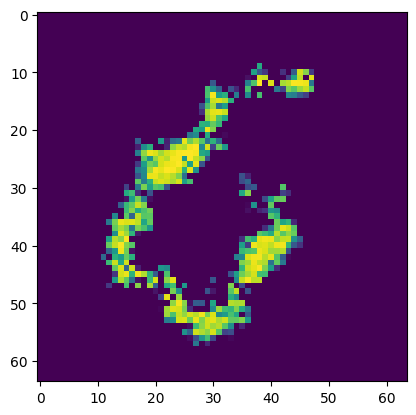

Epoch [3/50] Batch 700/938                   Loss D: -2939.2222, loss G: 1578.1011
tensor([2, 8, 7, 6, 2, 9, 5, 1, 7, 4, 3, 6, 5, 3, 5, 0, 0, 0, 1, 9, 9, 7, 2, 1,
        8, 7, 9, 7, 1, 4, 0, 3, 7, 7, 6, 7, 8, 2, 8, 9, 5, 6, 9, 9, 3, 3, 2, 2,
        3, 5, 9, 9, 6, 1, 8, 9, 9, 7, 1, 7, 2, 3, 1, 3], device='cuda:0')


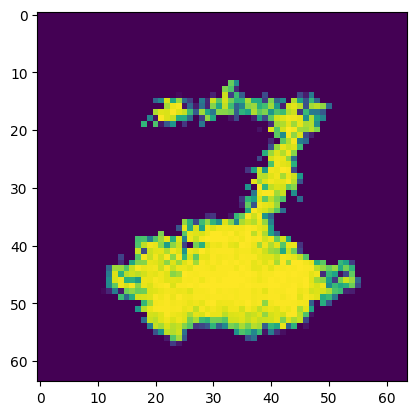

Epoch [3/50] Batch 800/938                   Loss D: -2869.0688, loss G: 1753.4768
tensor([0, 4, 7, 6, 0, 8, 9, 6, 0, 6, 6, 7, 8, 1, 7, 1, 7, 0, 8, 5, 8, 0, 1, 9,
        4, 4, 8, 8, 0, 0, 7, 1, 8, 6, 9, 6, 7, 6, 1, 4, 9, 2, 8, 2, 6, 4, 1, 7,
        5, 5, 6, 8, 3, 2, 5, 7, 4, 3, 0, 7, 9, 6, 3, 4], device='cuda:0')


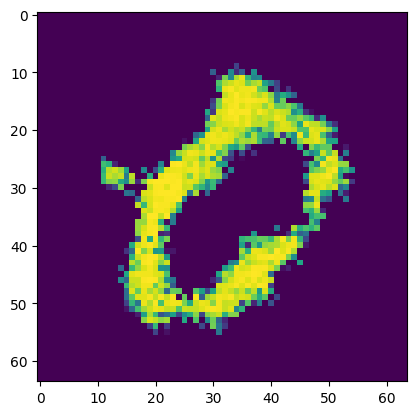

Epoch [3/50] Batch 900/938                   Loss D: -3410.3645, loss G: 1770.5283
tensor([9, 4, 1, 9, 2, 0, 0, 4, 7, 1, 2, 7, 4, 2, 6, 4, 2, 5, 4, 4, 3, 0, 3, 8,
        6, 6, 2, 6, 2, 9, 1, 9, 7, 9, 1, 8, 3, 9, 0, 6, 3, 1, 7, 6, 4, 2, 0, 0,
        8, 0, 2, 5, 3, 6, 4, 6, 8, 9, 8, 3, 1, 9, 3, 1], device='cuda:0')


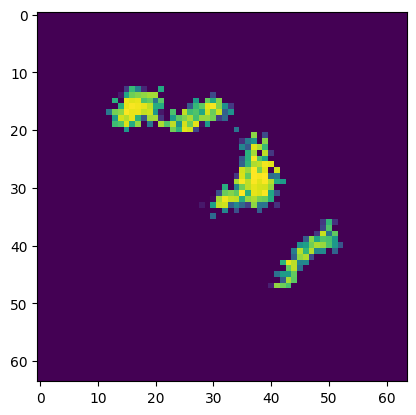

Epoch [4/50] Batch 100/938                   Loss D: -3177.5740, loss G: 1894.6316
tensor([2, 6, 5, 2, 9, 6, 1, 3, 7, 1, 2, 6, 1, 4, 7, 8, 3, 2, 5, 8, 4, 2, 3, 6,
        2, 1, 9, 5, 3, 1, 1, 0, 4, 5, 2, 5, 1, 3, 3, 3, 6, 4, 3, 7, 0, 3, 2, 5,
        3, 8, 7, 3, 6, 8, 3, 5, 4, 3, 3, 1, 1, 7, 3, 2], device='cuda:0')


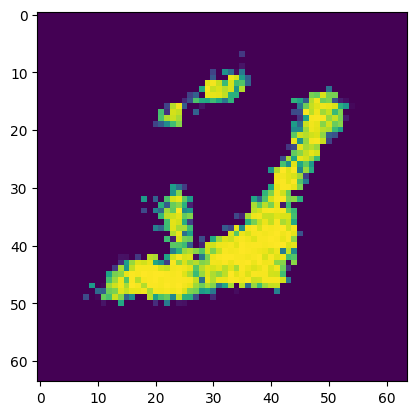

Epoch [4/50] Batch 200/938                   Loss D: -2667.7087, loss G: 1571.4299
tensor([8, 2, 7, 5, 4, 2, 5, 9, 5, 4, 6, 4, 4, 3, 3, 7, 5, 1, 9, 9, 7, 4, 2, 5,
        5, 3, 7, 9, 8, 9, 4, 0, 2, 1, 3, 1, 0, 5, 9, 8, 5, 9, 2, 1, 3, 0, 6, 6,
        9, 1, 8, 7, 8, 9, 1, 1, 0, 1, 4, 2, 9, 4, 5, 1], device='cuda:0')


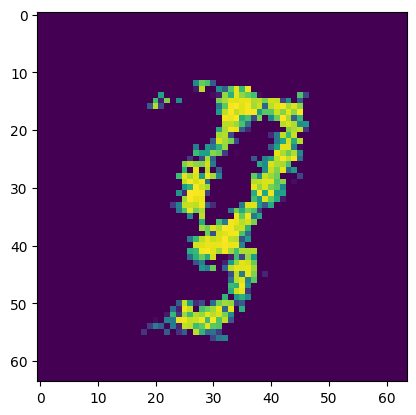

Epoch [4/50] Batch 300/938                   Loss D: -4281.6484, loss G: 2291.0391
tensor([1, 5, 0, 3, 2, 5, 7, 7, 9, 6, 9, 6, 9, 6, 7, 4, 8, 9, 0, 4, 5, 4, 1, 6,
        5, 9, 6, 9, 1, 1, 5, 2, 9, 6, 8, 6, 7, 9, 3, 4, 6, 1, 4, 4, 7, 1, 4, 8,
        1, 8, 0, 4, 1, 4, 3, 4, 9, 0, 5, 2, 6, 2, 7, 7], device='cuda:0')


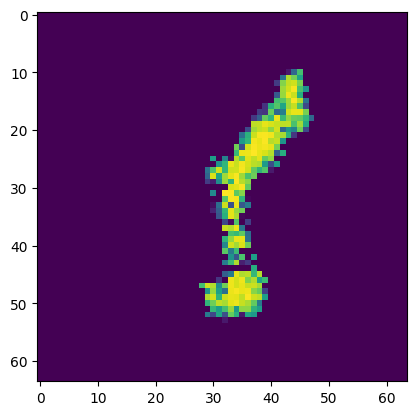

Epoch [4/50] Batch 400/938                   Loss D: -4135.7485, loss G: 1994.0914
tensor([3, 8, 5, 2, 8, 2, 2, 4, 6, 9, 1, 0, 5, 8, 5, 3, 2, 3, 1, 8, 1, 3, 4, 3,
        8, 6, 4, 8, 1, 6, 3, 7, 2, 7, 3, 4, 0, 8, 6, 8, 1, 4, 8, 2, 6, 8, 0, 2,
        9, 5, 2, 1, 8, 0, 6, 1, 9, 1, 4, 7, 1, 4, 6, 7], device='cuda:0')


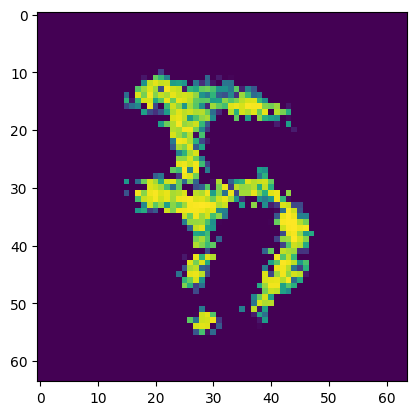

Epoch [4/50] Batch 500/938                   Loss D: -4880.0630, loss G: 1979.9348
tensor([1, 0, 5, 7, 6, 9, 7, 1, 0, 0, 1, 7, 6, 1, 2, 4, 2, 7, 1, 6, 1, 0, 3, 7,
        0, 5, 1, 1, 2, 9, 3, 1, 4, 4, 4, 8, 1, 3, 6, 2, 2, 0, 4, 1, 4, 2, 0, 5,
        0, 8, 5, 1, 3, 0, 9, 9, 5, 6, 3, 7, 1, 6, 9, 3], device='cuda:0')


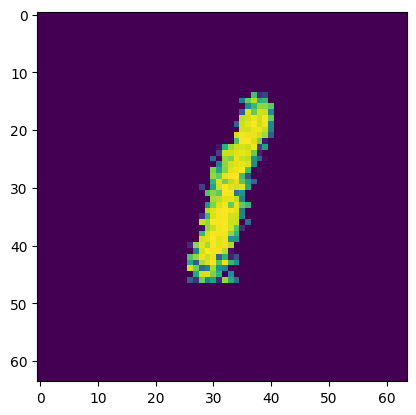

Epoch [4/50] Batch 600/938                   Loss D: -4760.7041, loss G: 2158.2378
tensor([5, 7, 6, 2, 8, 7, 4, 8, 6, 6, 7, 8, 6, 5, 4, 7, 4, 6, 6, 5, 2, 2, 5, 1,
        1, 5, 0, 1, 4, 8, 6, 7, 2, 7, 6, 5, 3, 3, 3, 5, 1, 5, 5, 7, 0, 6, 7, 4,
        7, 0, 1, 3, 0, 2, 5, 0, 4, 9, 6, 7, 2, 3, 0, 1], device='cuda:0')


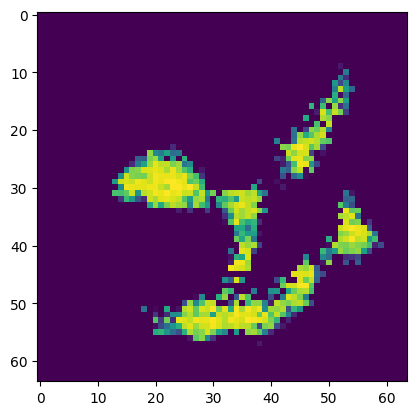

Epoch [4/50] Batch 700/938                   Loss D: -4847.1421, loss G: 2234.6172
tensor([3, 0, 7, 9, 1, 9, 7, 1, 8, 8, 6, 9, 2, 5, 8, 2, 5, 1, 9, 6, 2, 3, 0, 9,
        3, 4, 5, 1, 6, 0, 5, 2, 0, 8, 9, 7, 6, 3, 6, 0, 2, 1, 8, 5, 3, 3, 9, 8,
        6, 7, 5, 1, 7, 1, 4, 8, 2, 5, 5, 1, 0, 1, 2, 0], device='cuda:0')


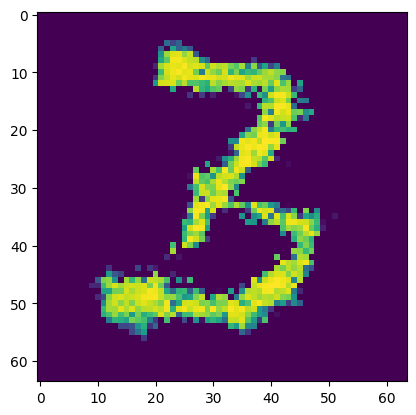

Epoch [4/50] Batch 800/938                   Loss D: -6251.0005, loss G: 2406.5542
tensor([6, 5, 8, 3, 1, 2, 7, 7, 3, 2, 2, 0, 8, 0, 2, 1, 3, 7, 7, 6, 5, 2, 1, 8,
        8, 7, 0, 9, 2, 6, 1, 6, 3, 2, 2, 5, 1, 7, 5, 9, 7, 6, 6, 4, 9, 3, 0, 9,
        1, 5, 5, 2, 9, 1, 6, 4, 7, 3, 9, 0, 7, 7, 3, 1], device='cuda:0')


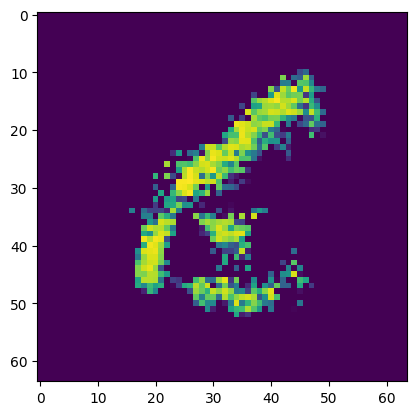

Epoch [4/50] Batch 900/938                   Loss D: -6886.7861, loss G: 2721.3665
tensor([5, 0, 8, 5, 2, 3, 8, 0, 7, 0, 6, 9, 2, 8, 4, 2, 5, 6, 7, 0, 9, 9, 9, 7,
        8, 2, 1, 5, 3, 3, 1, 8, 5, 2, 0, 4, 5, 7, 3, 9, 2, 5, 6, 3, 8, 2, 4, 7,
        3, 2, 6, 8, 0, 0, 1, 2, 2, 5, 4, 9, 8, 7, 7, 9], device='cuda:0')


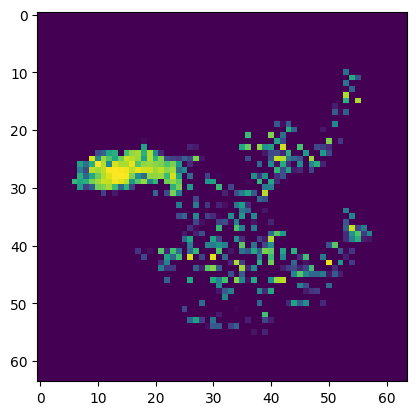

Epoch [5/50] Batch 100/938                   Loss D: -7753.6763, loss G: 3263.1743
tensor([6, 0, 2, 4, 0, 1, 8, 5, 1, 0, 2, 1, 5, 3, 1, 1, 5, 3, 2, 7, 2, 8, 5, 3,
        1, 7, 8, 1, 4, 5, 8, 1, 5, 7, 6, 8, 9, 9, 7, 0, 7, 4, 3, 9, 0, 6, 7, 0,
        0, 4, 2, 6, 6, 1, 7, 3, 8, 7, 2, 8, 7, 5, 8, 9], device='cuda:0')


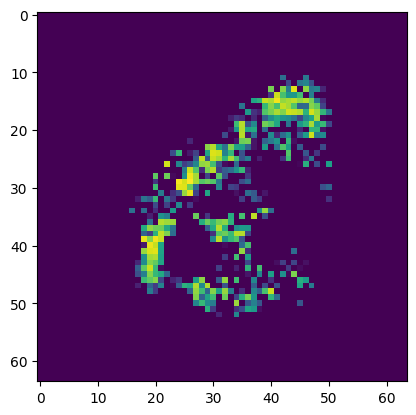

Epoch [5/50] Batch 200/938                   Loss D: -8432.3125, loss G: 3712.8960
tensor([4, 0, 4, 6, 1, 1, 3, 5, 3, 0, 1, 1, 0, 4, 9, 1, 7, 3, 3, 2, 0, 0, 8, 7,
        8, 3, 0, 2, 5, 6, 2, 2, 8, 6, 7, 4, 3, 4, 3, 2, 0, 8, 7, 4, 2, 1, 8, 3,
        8, 1, 5, 0, 5, 2, 1, 0, 6, 4, 0, 0, 6, 9, 0, 2], device='cuda:0')


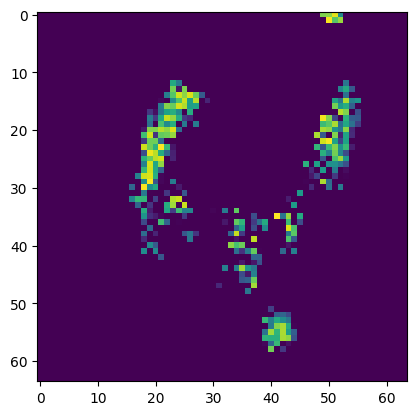

Epoch [5/50] Batch 300/938                   Loss D: -7367.9971, loss G: 3616.8218
tensor([0, 7, 2, 1, 5, 8, 8, 8, 6, 0, 1, 0, 9, 6, 1, 9, 6, 2, 4, 0, 9, 3, 7, 8,
        4, 2, 6, 0, 9, 0, 9, 4, 0, 1, 6, 9, 8, 5, 4, 4, 1, 6, 8, 5, 7, 9, 9, 0,
        8, 6, 5, 5, 0, 1, 5, 2, 6, 1, 5, 9, 2, 5, 8, 7], device='cuda:0')


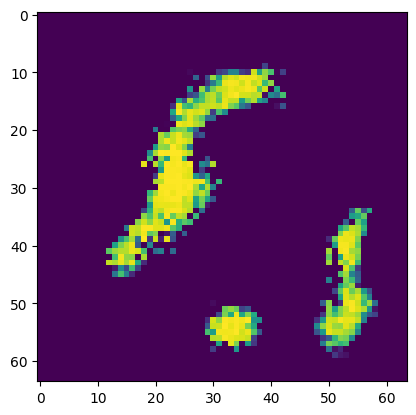

Epoch [5/50] Batch 400/938                   Loss D: -7015.0615, loss G: 3752.6807
tensor([9, 2, 2, 3, 2, 9, 5, 0, 3, 7, 5, 6, 7, 6, 2, 0, 6, 7, 7, 6, 2, 2, 6, 0,
        9, 7, 3, 8, 4, 2, 1, 1, 4, 9, 3, 3, 0, 2, 7, 5, 0, 7, 4, 2, 1, 0, 2, 7,
        5, 2, 2, 6, 8, 0, 1, 5, 4, 7, 4, 5, 9, 3, 2, 4], device='cuda:0')


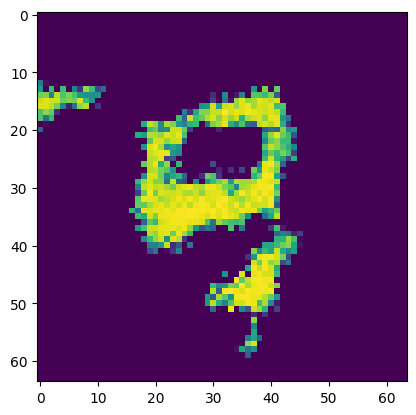

Epoch [5/50] Batch 500/938                   Loss D: -3341.8818, loss G: 2520.1619
tensor([0, 3, 1, 0, 3, 2, 6, 1, 3, 3, 1, 7, 4, 3, 3, 3, 1, 1, 6, 6, 3, 2, 0, 5,
        1, 0, 2, 1, 5, 4, 1, 7, 6, 7, 0, 1, 1, 0, 5, 9, 8, 9, 3, 6, 3, 2, 6, 4,
        2, 5, 1, 1, 7, 5, 0, 2, 7, 9, 7, 2, 5, 9, 6, 9], device='cuda:0')


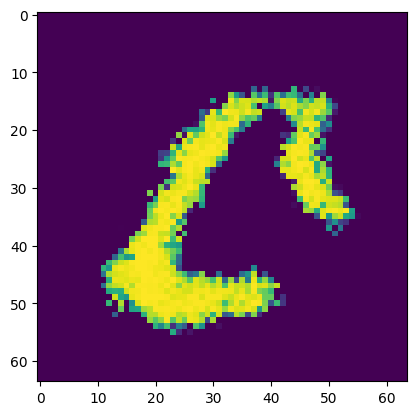

Epoch [5/50] Batch 600/938                   Loss D: -3813.6284, loss G: 3972.3262
tensor([7, 7, 1, 5, 2, 3, 6, 1, 3, 9, 4, 2, 7, 5, 2, 5, 9, 7, 7, 8, 0, 6, 7, 6,
        1, 3, 3, 9, 5, 0, 3, 6, 6, 3, 3, 7, 8, 1, 9, 8, 5, 8, 9, 9, 3, 6, 2, 6,
        9, 6, 9, 0, 8, 4, 2, 4, 1, 4, 5, 8, 9, 1, 9, 6], device='cuda:0')


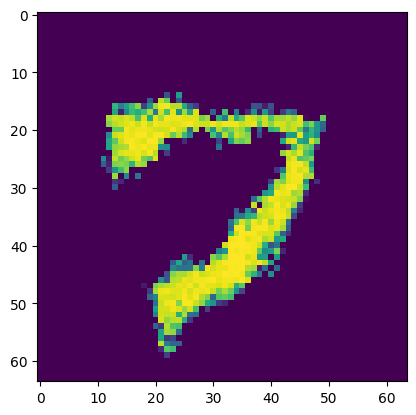

Epoch [5/50] Batch 700/938                   Loss D: -5420.2021, loss G: 4080.2610
tensor([2, 3, 1, 7, 2, 5, 2, 4, 6, 2, 8, 2, 4, 7, 1, 1, 9, 0, 3, 7, 7, 6, 8, 4,
        4, 1, 5, 9, 2, 6, 3, 5, 4, 6, 5, 3, 8, 6, 7, 7, 3, 1, 2, 4, 9, 2, 1, 8,
        5, 7, 6, 7, 6, 5, 8, 7, 9, 8, 0, 5, 4, 2, 8, 9], device='cuda:0')


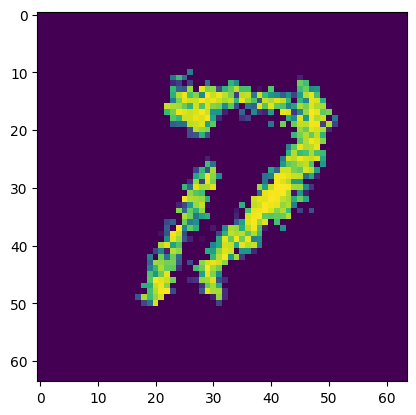

Epoch [5/50] Batch 800/938                   Loss D: -3374.5178, loss G: 3388.0303
tensor([6, 1, 2, 4, 3, 2, 9, 1, 9, 5, 7, 3, 8, 6, 8, 7, 7, 1, 3, 3, 8, 5, 1, 5,
        3, 6, 0, 0, 6, 9, 5, 4, 8, 1, 9, 7, 9, 2, 1, 2, 5, 1, 6, 4, 3, 8, 9, 1,
        8, 8, 6, 3, 4, 5, 6, 7, 6, 6, 4, 6, 7, 9, 2, 8], device='cuda:0')


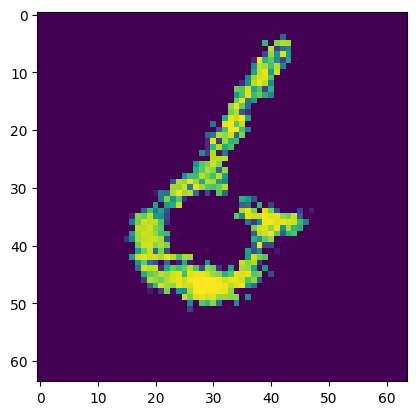

Epoch [5/50] Batch 900/938                   Loss D: -5528.9150, loss G: 4280.0254
tensor([1, 2, 9, 1, 5, 5, 6, 6, 0, 4, 2, 3, 5, 9, 2, 6, 6, 5, 5, 9, 4, 7, 3, 9,
        0, 8, 1, 7, 9, 4, 5, 7, 9, 9, 9, 8, 7, 9, 5, 3, 4, 0, 9, 6, 4, 2, 3, 8,
        2, 8, 3, 6, 4, 4, 8, 4, 5, 1, 7, 7, 3, 1, 8, 8], device='cuda:0')


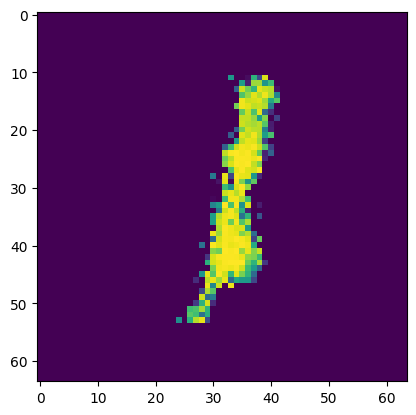

Epoch [6/50] Batch 100/938                   Loss D: -6787.1255, loss G: 4227.3169
tensor([2, 2, 7, 7, 9, 6, 7, 7, 7, 8, 0, 8, 1, 2, 6, 3, 4, 7, 5, 6, 9, 1, 7, 0,
        8, 4, 7, 3, 8, 6, 6, 8, 0, 5, 8, 6, 1, 3, 2, 4, 2, 6, 4, 1, 6, 2, 7, 6,
        5, 9, 7, 3, 9, 9, 2, 6, 6, 5, 9, 4, 4, 2, 4, 3], device='cuda:0')


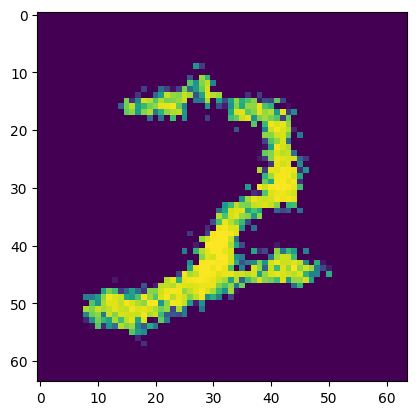

Epoch [6/50] Batch 200/938                   Loss D: -7242.0991, loss G: 4418.5225
tensor([5, 6, 5, 7, 4, 9, 2, 8, 2, 3, 1, 7, 1, 5, 1, 0, 8, 8, 2, 9, 0, 8, 2, 2,
        2, 0, 6, 7, 5, 8, 0, 3, 6, 4, 8, 0, 0, 6, 4, 8, 1, 4, 7, 9, 0, 3, 1, 6,
        0, 9, 2, 4, 0, 6, 2, 9, 1, 1, 2, 0, 5, 4, 7, 3], device='cuda:0')


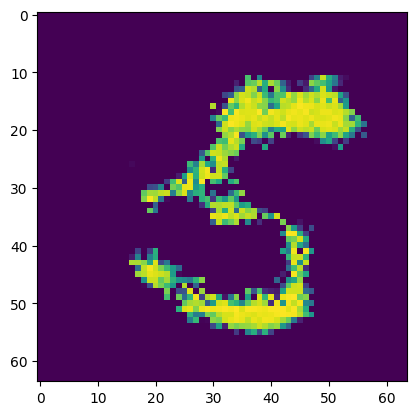

Epoch [6/50] Batch 300/938                   Loss D: -7207.8369, loss G: 4429.6211
tensor([6, 7, 7, 0, 3, 7, 3, 8, 2, 5, 5, 6, 3, 1, 3, 4, 6, 6, 4, 5, 6, 6, 4, 6,
        8, 2, 7, 1, 7, 1, 5, 5, 3, 1, 2, 2, 4, 6, 6, 2, 3, 2, 1, 7, 7, 9, 5, 6,
        1, 9, 9, 0, 4, 7, 2, 1, 1, 7, 8, 8, 8, 6, 2, 8], device='cuda:0')


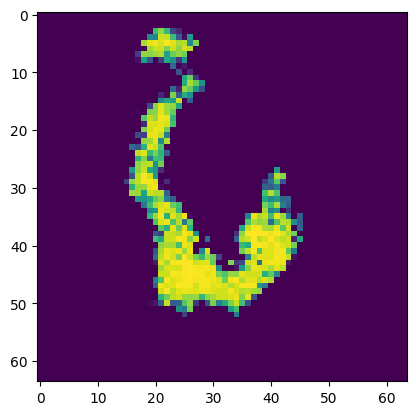

Epoch [6/50] Batch 400/938                   Loss D: -8161.5815, loss G: 4697.0186
tensor([8, 2, 5, 1, 6, 1, 2, 0, 6, 2, 9, 9, 9, 5, 9, 6, 8, 8, 8, 9, 3, 7, 0, 3,
        2, 9, 3, 4, 8, 8, 7, 7, 7, 1, 8, 5, 6, 7, 1, 7, 7, 8, 7, 9, 3, 3, 3, 5,
        2, 8, 5, 8, 8, 9, 5, 6, 2, 0, 3, 8, 8, 9, 2, 6], device='cuda:0')


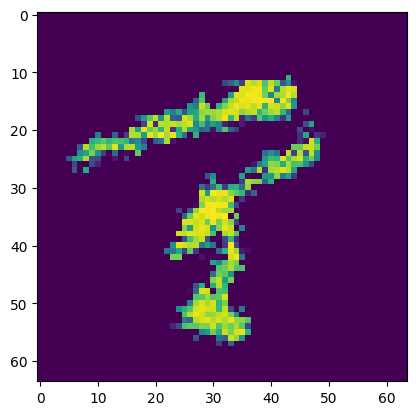

Epoch [6/50] Batch 500/938                   Loss D: -5237.4160, loss G: 5020.4932
tensor([1, 7, 6, 4, 7, 5, 4, 0, 8, 7, 3, 6, 8, 7, 8, 1, 0, 5, 1, 3, 1, 8, 1, 7,
        8, 8, 6, 3, 9, 1, 3, 5, 1, 4, 1, 2, 5, 8, 0, 2, 4, 6, 4, 8, 1, 9, 9, 6,
        7, 0, 2, 2, 0, 6, 4, 0, 2, 2, 9, 2, 6, 6, 6, 2], device='cuda:0')


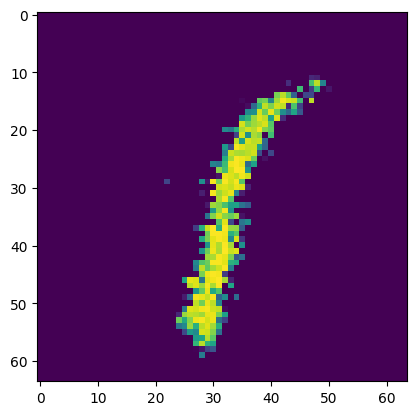

Epoch [6/50] Batch 600/938                   Loss D: -7922.0889, loss G: 4952.4512
tensor([0, 3, 9, 9, 4, 2, 0, 8, 2, 9, 4, 8, 7, 3, 1, 4, 7, 4, 8, 8, 2, 7, 0, 6,
        5, 7, 8, 6, 5, 2, 6, 4, 1, 9, 2, 1, 8, 7, 1, 4, 5, 9, 9, 0, 5, 7, 4, 2,
        9, 8, 7, 8, 1, 0, 5, 8, 8, 3, 4, 1, 7, 5, 8, 0], device='cuda:0')


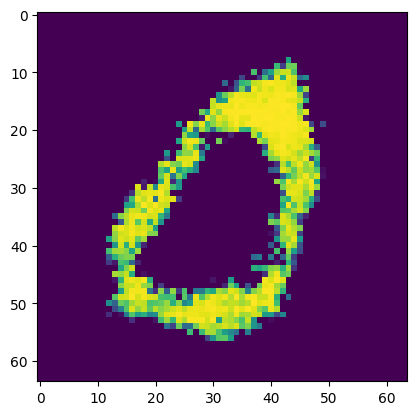

Epoch [6/50] Batch 700/938                   Loss D: -9432.2764, loss G: 5370.8613
tensor([9, 6, 5, 7, 6, 4, 7, 9, 9, 5, 6, 9, 6, 4, 6, 5, 3, 5, 5, 3, 1, 1, 8, 9,
        1, 1, 1, 1, 6, 5, 4, 3, 8, 9, 4, 8, 1, 1, 5, 9, 7, 3, 3, 7, 9, 9, 7, 6,
        3, 9, 0, 9, 3, 1, 2, 0, 6, 7, 7, 3, 1, 8, 4, 6], device='cuda:0')


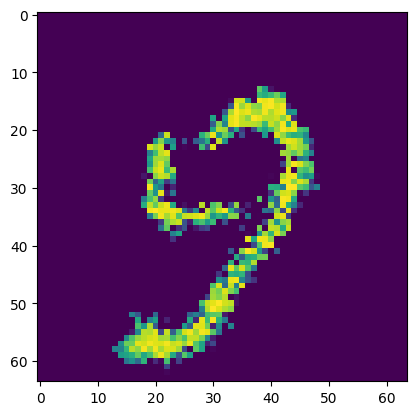

Epoch [6/50] Batch 800/938                   Loss D: -7693.9131, loss G: 4941.3945
tensor([3, 8, 3, 7, 0, 5, 3, 4, 7, 2, 9, 5, 3, 1, 7, 3, 6, 5, 9, 5, 1, 2, 0, 2,
        9, 2, 9, 7, 9, 0, 4, 1, 9, 4, 1, 1, 8, 3, 0, 2, 0, 5, 6, 6, 9, 3, 3, 8,
        4, 1, 8, 2, 2, 2, 6, 4, 9, 8, 7, 6, 7, 8, 2, 7], device='cuda:0')


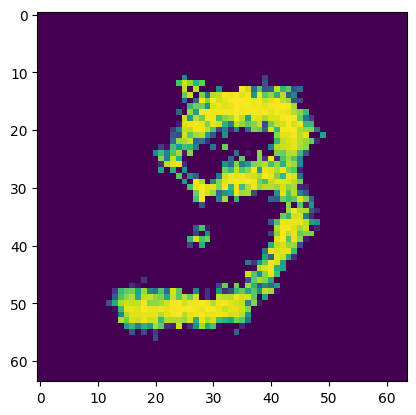

Epoch [6/50] Batch 900/938                   Loss D: -9924.9854, loss G: 5434.6973
tensor([3, 9, 3, 0, 5, 7, 0, 4, 1, 6, 4, 1, 0, 2, 5, 6, 5, 6, 3, 6, 6, 2, 6, 2,
        2, 2, 7, 9, 8, 2, 4, 9, 1, 8, 0, 8, 5, 4, 3, 5, 0, 8, 3, 3, 5, 8, 7, 0,
        4, 0, 4, 6, 3, 2, 4, 7, 2, 0, 5, 0, 5, 8, 9, 6], device='cuda:0')


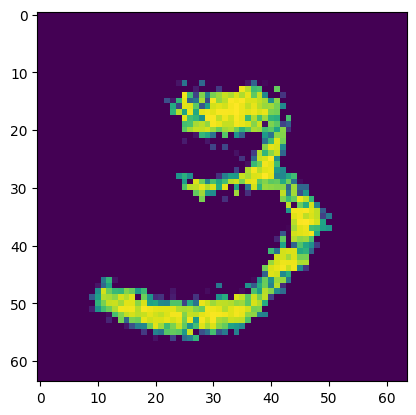

Epoch [7/50] Batch 100/938                   Loss D: -9155.5264, loss G: 5287.5845
tensor([7, 5, 3, 1, 1, 9, 0, 4, 5, 5, 7, 9, 7, 3, 2, 4, 4, 9, 4, 5, 7, 0, 6, 4,
        1, 6, 1, 4, 2, 5, 2, 8, 8, 9, 4, 2, 8, 9, 8, 2, 1, 2, 7, 8, 1, 6, 9, 3,
        1, 4, 6, 8, 4, 1, 3, 6, 1, 1, 1, 1, 6, 2, 3, 5], device='cuda:0')


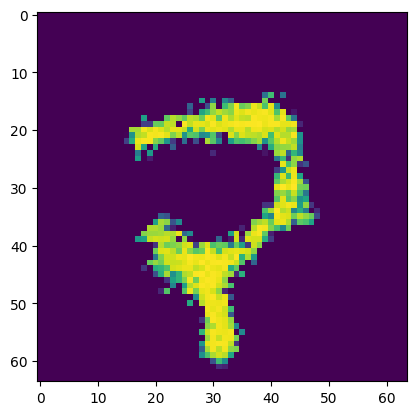

Epoch [7/50] Batch 200/938                   Loss D: -8552.5879, loss G: 5551.9883
tensor([4, 7, 1, 0, 3, 6, 8, 0, 2, 4, 3, 8, 4, 5, 0, 7, 6, 1, 4, 0, 8, 1, 2, 3,
        4, 9, 8, 4, 7, 8, 3, 8, 2, 2, 9, 6, 4, 1, 3, 9, 3, 1, 0, 6, 6, 3, 7, 1,
        5, 3, 6, 8, 5, 0, 0, 4, 9, 9, 2, 1, 1, 0, 5, 1], device='cuda:0')


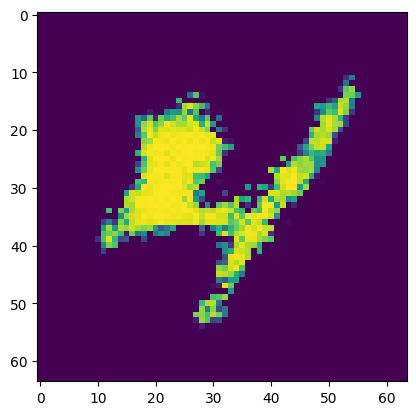

Epoch [7/50] Batch 300/938                   Loss D: -11121.5674, loss G: 6205.6484
tensor([3, 5, 4, 2, 5, 6, 5, 7, 6, 0, 3, 3, 0, 1, 1, 0, 7, 4, 7, 3, 0, 3, 0, 8,
        1, 0, 6, 4, 7, 2, 1, 9, 7, 9, 5, 9, 6, 3, 3, 9, 7, 2, 9, 4, 5, 9, 3, 0,
        0, 9, 6, 7, 9, 8, 2, 4, 7, 4, 2, 7, 8, 7, 9, 1], device='cuda:0')


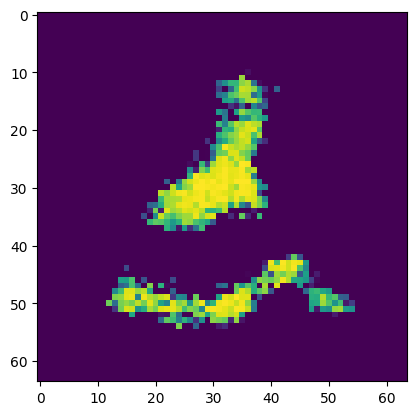

Epoch [7/50] Batch 400/938                   Loss D: -10566.4775, loss G: 6322.4468
tensor([6, 3, 2, 0, 1, 2, 4, 0, 8, 3, 0, 1, 3, 9, 8, 9, 7, 6, 5, 6, 7, 3, 6, 8,
        6, 7, 1, 4, 4, 1, 5, 9, 1, 8, 2, 1, 9, 2, 4, 8, 3, 4, 2, 7, 1, 9, 0, 7,
        7, 7, 2, 8, 2, 3, 0, 3, 1, 6, 5, 7, 7, 7, 9, 1], device='cuda:0')


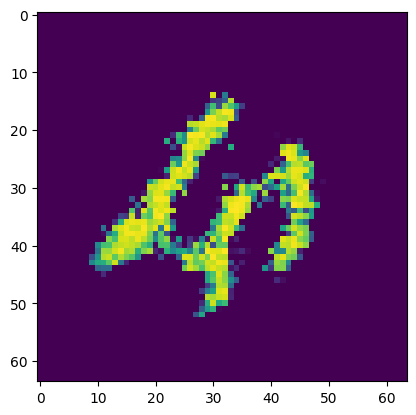

Epoch [7/50] Batch 500/938                   Loss D: -13023.4609, loss G: 6598.2378
tensor([9, 3, 8, 9, 7, 0, 9, 5, 9, 0, 2, 2, 6, 1, 1, 8, 6, 8, 0, 3, 3, 7, 7, 8,
        3, 5, 3, 1, 0, 9, 4, 4, 2, 0, 1, 5, 1, 7, 7, 1, 7, 7, 9, 0, 7, 1, 0, 5,
        7, 6, 4, 0, 4, 5, 7, 0, 1, 2, 0, 9, 6, 2, 8, 6], device='cuda:0')


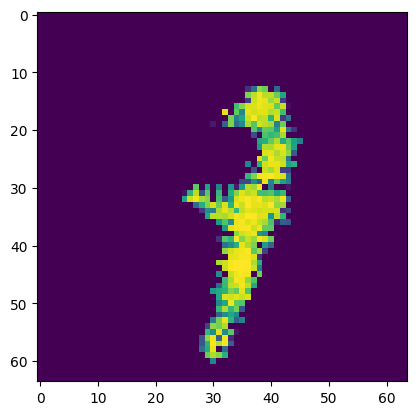

Epoch [7/50] Batch 600/938                   Loss D: -9160.3145, loss G: 5190.0615
tensor([3, 5, 1, 7, 7, 0, 9, 3, 2, 6, 8, 2, 2, 1, 5, 5, 9, 4, 1, 2, 1, 4, 1, 4,
        3, 6, 5, 5, 6, 3, 8, 0, 9, 7, 6, 6, 7, 2, 2, 7, 3, 0, 6, 2, 0, 3, 1, 8,
        9, 3, 7, 3, 8, 2, 9, 7, 1, 3, 1, 9, 8, 2, 1, 2], device='cuda:0')


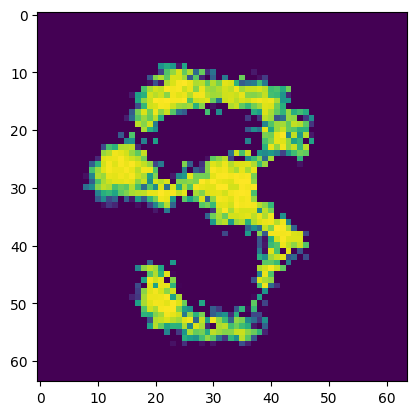

Epoch [7/50] Batch 700/938                   Loss D: -5595.5010, loss G: 6913.4424
tensor([0, 1, 2, 1, 4, 5, 5, 0, 8, 8, 2, 0, 9, 3, 2, 2, 4, 8, 7, 1, 1, 5, 6, 1,
        2, 4, 2, 3, 4, 2, 1, 3, 7, 1, 9, 0, 1, 4, 3, 5, 5, 7, 2, 3, 1, 6, 3, 7,
        0, 1, 9, 4, 9, 8, 3, 2, 8, 5, 7, 7, 2, 0, 2, 2], device='cuda:0')


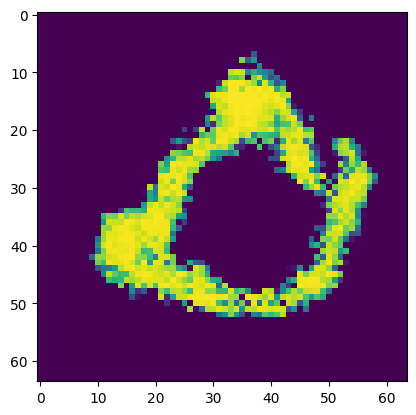

Epoch [7/50] Batch 800/938                   Loss D: -10996.3135, loss G: 6331.2495
tensor([5, 5, 7, 2, 4, 9, 1, 1, 9, 7, 7, 2, 0, 7, 2, 1, 4, 8, 4, 2, 0, 4, 0, 3,
        8, 4, 6, 0, 7, 4, 3, 2, 7, 1, 3, 5, 0, 7, 8, 9, 1, 1, 3, 0, 6, 6, 3, 7,
        6, 4, 4, 4, 3, 2, 1, 7, 3, 3, 5, 3, 1, 6, 0, 5], device='cuda:0')


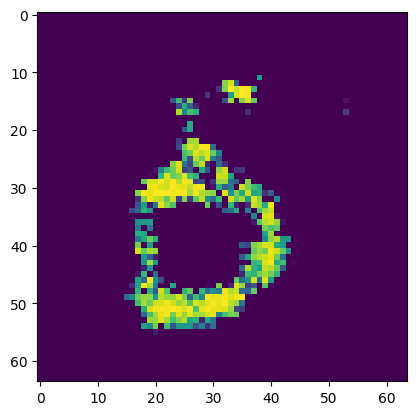

Epoch [7/50] Batch 900/938                   Loss D: -11410.7148, loss G: 7229.3833
tensor([7, 1, 3, 0, 0, 5, 3, 0, 1, 3, 5, 1, 9, 4, 0, 8, 8, 3, 7, 6, 1, 0, 1, 2,
        2, 0, 9, 2, 4, 0, 5, 3, 4, 7, 1, 9, 9, 9, 3, 6, 8, 2, 6, 0, 1, 3, 7, 2,
        2, 7, 2, 9, 7, 6, 6, 9, 5, 3, 4, 9, 0, 4, 4, 6], device='cuda:0')


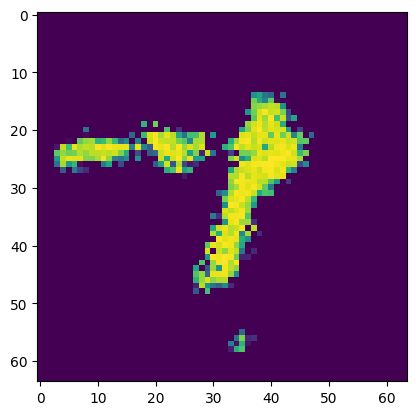

Epoch [8/50] Batch 100/938                   Loss D: -12091.3428, loss G: 6799.5195
tensor([1, 6, 4, 1, 9, 4, 4, 7, 5, 4, 0, 0, 7, 3, 9, 6, 5, 1, 9, 4, 0, 1, 1, 2,
        9, 3, 7, 5, 1, 2, 1, 8, 1, 2, 9, 3, 0, 8, 6, 1, 0, 7, 9, 1, 8, 8, 9, 8,
        0, 2, 3, 4, 2, 0, 9, 4, 1, 1, 9, 3, 3, 4, 5, 4], device='cuda:0')


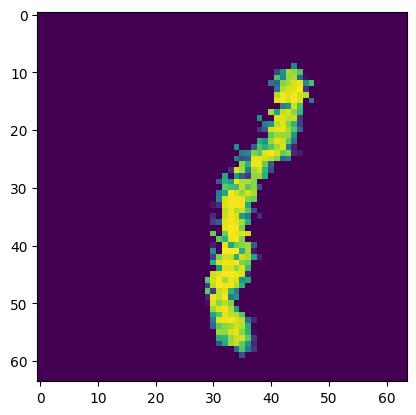

Epoch [8/50] Batch 200/938                   Loss D: -14049.7334, loss G: 7555.5205
tensor([1, 7, 5, 4, 6, 7, 7, 0, 7, 6, 2, 9, 3, 5, 1, 8, 5, 1, 1, 4, 2, 3, 4, 6,
        3, 5, 0, 0, 2, 1, 3, 7, 3, 3, 8, 1, 6, 5, 1, 1, 2, 0, 9, 5, 6, 0, 3, 1,
        3, 2, 7, 4, 9, 3, 7, 1, 8, 1, 2, 6, 9, 5, 1, 9], device='cuda:0')


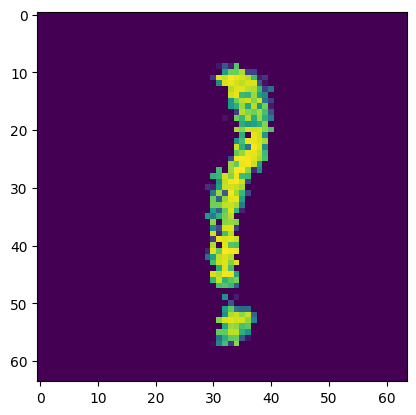

Epoch [8/50] Batch 300/938                   Loss D: -11582.6143, loss G: 7387.3359
tensor([3, 9, 4, 4, 1, 6, 4, 0, 7, 8, 5, 9, 0, 4, 1, 6, 7, 4, 0, 9, 7, 1, 5, 2,
        8, 7, 2, 3, 4, 7, 2, 7, 1, 3, 2, 7, 8, 8, 1, 2, 6, 2, 4, 5, 2, 2, 3, 9,
        5, 4, 2, 2, 2, 1, 1, 1, 1, 4, 8, 5, 5, 2, 4, 7], device='cuda:0')


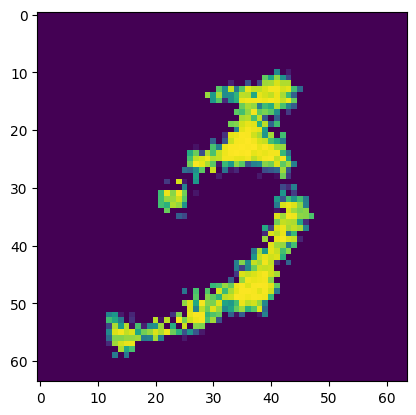

Epoch [8/50] Batch 400/938                   Loss D: -14616.0771, loss G: 7740.1602
tensor([3, 8, 8, 7, 6, 9, 0, 6, 7, 4, 0, 3, 3, 1, 7, 8, 1, 4, 5, 3, 4, 8, 5, 2,
        3, 5, 1, 2, 8, 7, 2, 0, 4, 3, 6, 9, 3, 9, 5, 6, 4, 8, 5, 4, 3, 5, 5, 2,
        6, 1, 9, 9, 0, 9, 7, 5, 3, 5, 6, 6, 2, 6, 8, 2], device='cuda:0')


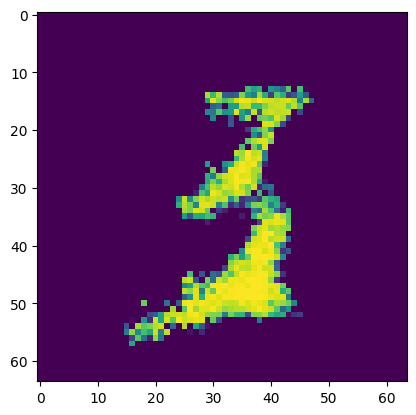

Epoch [8/50] Batch 500/938                   Loss D: -15574.1025, loss G: 8137.2988
tensor([6, 1, 3, 1, 7, 9, 2, 4, 8, 9, 2, 1, 6, 8, 0, 2, 4, 5, 2, 3, 7, 6, 0, 6,
        5, 1, 3, 4, 9, 4, 0, 4, 8, 5, 3, 3, 2, 0, 9, 5, 1, 6, 7, 5, 7, 3, 0, 1,
        6, 1, 5, 8, 1, 1, 5, 9, 6, 2, 2, 8, 2, 1, 0, 2], device='cuda:0')


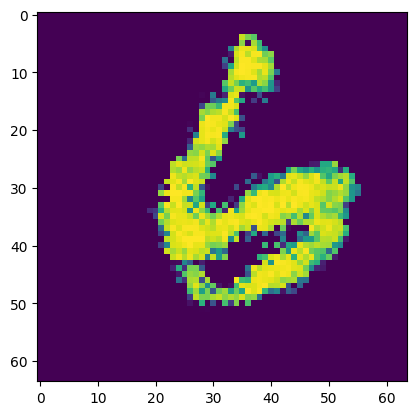

Epoch [8/50] Batch 600/938                   Loss D: -15408.3516, loss G: 8111.2949
tensor([0, 0, 4, 6, 1, 3, 5, 9, 7, 6, 9, 1, 5, 7, 1, 8, 6, 8, 3, 7, 5, 0, 8, 0,
        5, 8, 9, 2, 5, 7, 4, 2, 6, 8, 8, 4, 2, 3, 6, 5, 2, 8, 2, 8, 1, 5, 9, 8,
        8, 1, 2, 6, 9, 9, 2, 4, 1, 2, 6, 9, 4, 6, 8, 2], device='cuda:0')


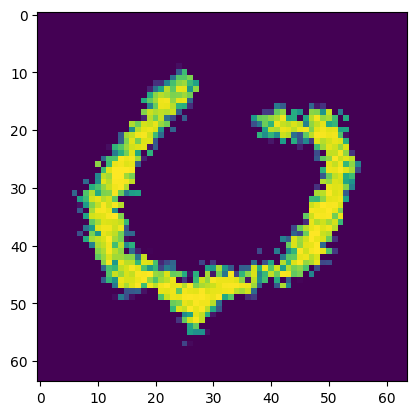

Epoch [8/50] Batch 700/938                   Loss D: -16080.3809, loss G: 8518.4609
tensor([9, 3, 6, 5, 0, 9, 5, 4, 6, 8, 8, 9, 2, 6, 2, 0, 4, 5, 1, 3, 2, 1, 8, 2,
        7, 1, 7, 0, 8, 8, 4, 7, 1, 8, 4, 0, 0, 7, 1, 1, 0, 7, 4, 3, 2, 7, 2, 0,
        6, 9, 2, 7, 0, 2, 5, 2, 1, 6, 9, 9, 5, 2, 0, 9], device='cuda:0')


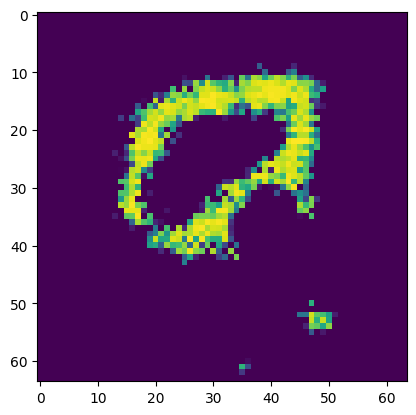

Epoch [8/50] Batch 800/938                   Loss D: -16153.8223, loss G: 8799.0742
tensor([7, 7, 2, 2, 1, 9, 5, 9, 4, 4, 5, 2, 4, 8, 2, 9, 9, 1, 3, 3, 7, 2, 8, 7,
        7, 5, 1, 8, 7, 3, 4, 6, 1, 0, 9, 5, 7, 4, 7, 6, 7, 4, 4, 3, 0, 8, 0, 2,
        1, 4, 4, 6, 6, 6, 8, 3, 2, 5, 6, 5, 2, 7, 8, 3], device='cuda:0')


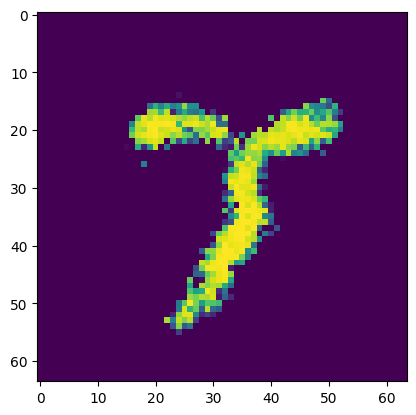

Epoch [8/50] Batch 900/938                   Loss D: -15113.7920, loss G: 7834.6821
tensor([8, 0, 7, 7, 4, 6, 4, 0, 6, 4, 2, 1, 6, 5, 9, 8, 6, 9, 4, 9, 8, 3, 9, 0,
        6, 1, 7, 6, 6, 3, 4, 8, 0, 9, 0, 5, 7, 9, 3, 8, 9, 4, 9, 7, 3, 5, 5, 8,
        1, 1, 1, 9, 8, 8, 5, 6, 6, 6, 3, 7, 6, 8, 1, 8], device='cuda:0')


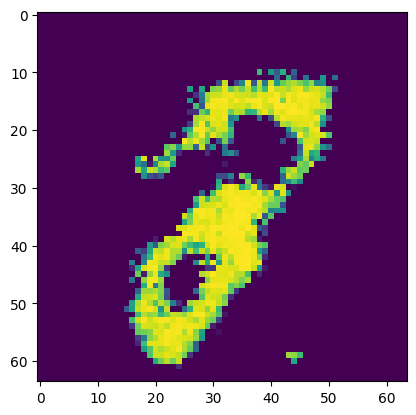

Epoch [9/50] Batch 100/938                   Loss D: -16008.8135, loss G: 8636.1934
tensor([6, 7, 7, 0, 0, 6, 1, 5, 7, 2, 3, 5, 1, 9, 0, 3, 2, 2, 4, 7, 0, 9, 7, 9,
        6, 9, 8, 1, 4, 1, 1, 6, 4, 6, 3, 9, 8, 3, 1, 8, 4, 6, 6, 5, 0, 3, 4, 1,
        2, 8, 6, 8, 4, 6, 2, 3, 1, 0, 8, 9, 0, 7, 0, 1], device='cuda:0')


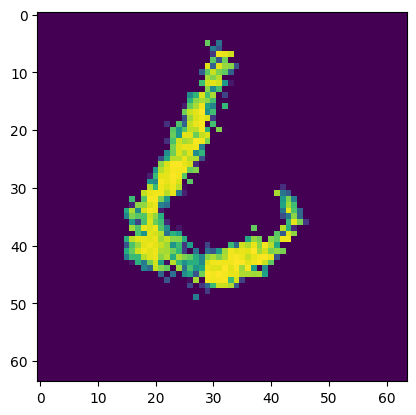

Epoch [9/50] Batch 200/938                   Loss D: -14122.1299, loss G: 6915.6030
tensor([3, 6, 6, 5, 2, 3, 9, 2, 5, 6, 0, 6, 0, 4, 1, 7, 7, 4, 3, 0, 8, 5, 9, 5,
        5, 0, 4, 3, 0, 6, 4, 8, 9, 7, 4, 7, 3, 2, 8, 9, 0, 4, 9, 0, 7, 9, 3, 5,
        5, 9, 2, 5, 8, 2, 7, 8, 2, 5, 5, 7, 0, 9, 7, 1], device='cuda:0')


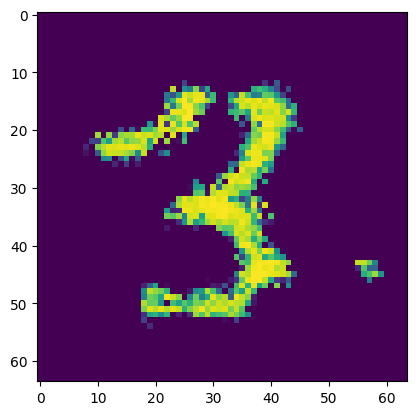

Epoch [9/50] Batch 300/938                   Loss D: -16154.7480, loss G: 8819.3887
tensor([8, 5, 5, 7, 7, 1, 5, 6, 5, 8, 3, 2, 3, 4, 3, 7, 7, 0, 7, 1, 5, 9, 6, 8,
        5, 2, 0, 2, 9, 3, 9, 2, 9, 8, 8, 0, 8, 5, 5, 1, 7, 1, 8, 8, 6, 1, 4, 2,
        8, 8, 2, 6, 6, 8, 1, 1, 6, 5, 3, 0, 6, 0, 2, 5], device='cuda:0')


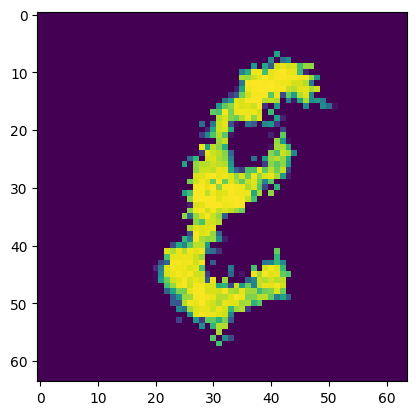

Epoch [9/50] Batch 400/938                   Loss D: -14481.2627, loss G: 9500.3809
tensor([6, 0, 7, 1, 7, 2, 3, 4, 7, 0, 6, 7, 2, 1, 6, 9, 5, 4, 5, 0, 2, 4, 8, 7,
        9, 6, 5, 2, 7, 5, 4, 8, 0, 5, 7, 9, 1, 5, 5, 4, 2, 6, 2, 0, 2, 1, 1, 7,
        2, 6, 5, 3, 7, 2, 7, 8, 3, 5, 4, 1, 4, 8, 4, 3], device='cuda:0')


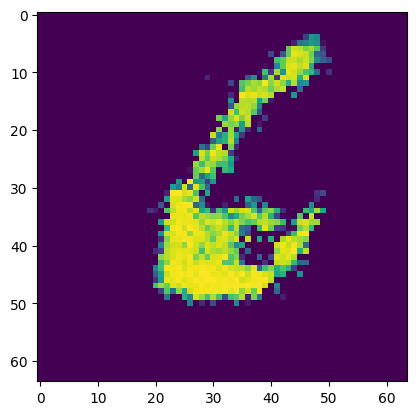

Epoch [9/50] Batch 500/938                   Loss D: -16776.0039, loss G: 9778.5996
tensor([1, 1, 6, 3, 1, 7, 9, 7, 2, 3, 0, 9, 3, 1, 7, 0, 0, 1, 2, 0, 0, 5, 6, 7,
        0, 7, 8, 8, 7, 1, 9, 1, 5, 9, 1, 3, 7, 8, 5, 4, 0, 1, 3, 9, 9, 4, 0, 5,
        4, 6, 9, 3, 2, 1, 4, 8, 2, 9, 2, 9, 4, 7, 8, 9], device='cuda:0')


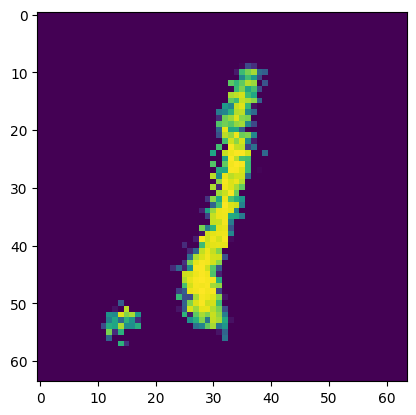

Epoch [9/50] Batch 600/938                   Loss D: -18663.7344, loss G: 9662.7715
tensor([3, 1, 8, 8, 3, 8, 3, 3, 9, 5, 0, 8, 0, 3, 7, 9, 5, 7, 5, 7, 7, 1, 4, 9,
        0, 4, 9, 0, 9, 3, 7, 1, 6, 7, 6, 0, 0, 2, 7, 2, 6, 6, 6, 0, 6, 4, 6, 0,
        8, 5, 6, 0, 7, 6, 1, 1, 8, 8, 9, 2, 4, 8, 0, 6], device='cuda:0')


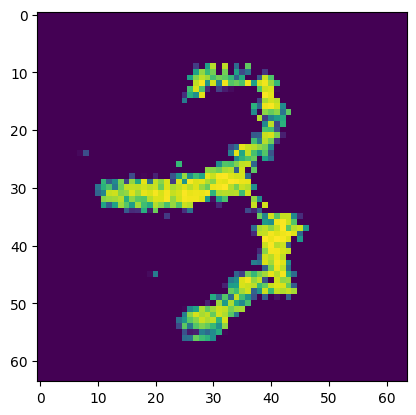

Epoch [9/50] Batch 700/938                   Loss D: -14898.8779, loss G: 7300.2397
tensor([6, 4, 3, 8, 9, 9, 1, 8, 1, 2, 6, 7, 8, 0, 8, 7, 0, 3, 0, 3, 8, 3, 0, 1,
        2, 4, 1, 8, 1, 7, 1, 9, 4, 9, 7, 2, 3, 0, 1, 1, 9, 8, 1, 9, 9, 9, 8, 9,
        9, 4, 1, 8, 9, 4, 3, 2, 1, 1, 9, 2, 8, 4, 5, 3], device='cuda:0')


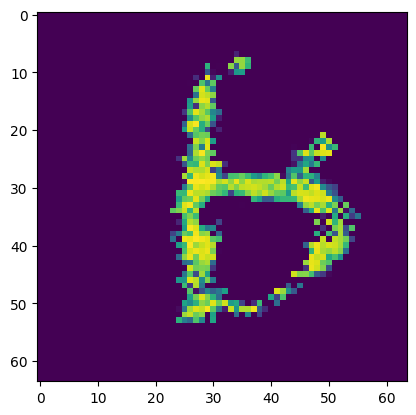

Epoch [9/50] Batch 800/938                   Loss D: -18642.5391, loss G: 10181.0195
tensor([5, 0, 0, 3, 1, 8, 2, 5, 0, 7, 9, 1, 8, 3, 3, 2, 5, 8, 6, 7, 3, 7, 1, 3,
        6, 2, 9, 6, 5, 7, 2, 7, 4, 7, 7, 7, 7, 4, 5, 4, 8, 3, 0, 2, 7, 5, 3, 7,
        8, 7, 2, 8, 1, 8, 9, 8, 2, 7, 2, 3, 4, 7, 0, 9], device='cuda:0')


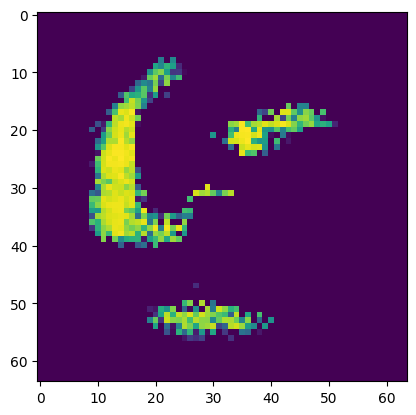

Epoch [9/50] Batch 900/938                   Loss D: -19074.4688, loss G: 9787.8770
tensor([4, 6, 7, 0, 5, 2, 2, 6, 9, 9, 0, 7, 0, 5, 8, 5, 7, 0, 4, 0, 3, 2, 3, 4,
        6, 3, 2, 3, 6, 5, 1, 0, 8, 0, 0, 8, 2, 3, 7, 1, 3, 7, 2, 3, 6, 5, 9, 9,
        5, 9, 7, 9, 3, 8, 6, 9, 5, 8, 6, 9, 0, 1, 5, 5], device='cuda:0')


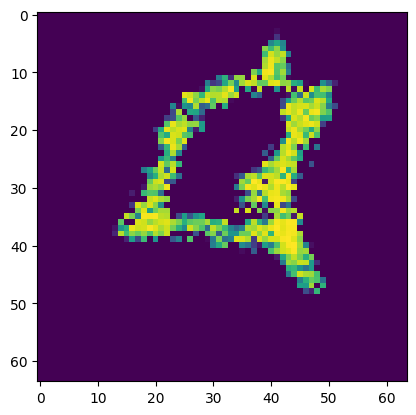

Epoch [10/50] Batch 100/938                   Loss D: -18723.1992, loss G: 10076.5020
tensor([3, 7, 3, 1, 3, 5, 4, 6, 0, 8, 8, 9, 8, 3, 9, 9, 6, 8, 2, 3, 9, 6, 5, 8,
        3, 4, 5, 8, 6, 5, 9, 9, 1, 1, 4, 2, 8, 2, 0, 6, 1, 1, 6, 6, 0, 2, 0, 9,
        8, 1, 1, 0, 0, 1, 1, 8, 8, 1, 4, 6, 1, 9, 1, 0], device='cuda:0')


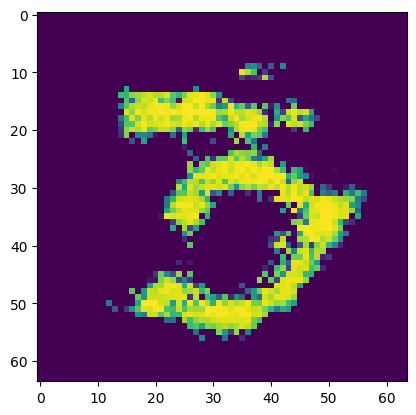

Epoch [10/50] Batch 200/938                   Loss D: -22589.6426, loss G: 11313.8105
tensor([4, 5, 1, 8, 2, 2, 5, 6, 8, 8, 1, 5, 3, 7, 3, 3, 2, 8, 5, 3, 4, 3, 2, 3,
        1, 8, 4, 0, 8, 8, 3, 7, 5, 3, 9, 5, 3, 5, 8, 7, 3, 2, 6, 1, 7, 3, 6, 3,
        2, 0, 7, 8, 5, 0, 4, 9, 5, 5, 2, 3, 3, 9, 6, 6], device='cuda:0')


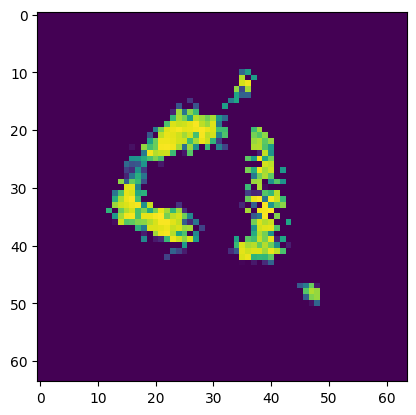

Epoch [10/50] Batch 300/938                   Loss D: -10957.1572, loss G: 10223.3154
tensor([2, 0, 0, 7, 3, 2, 4, 7, 6, 0, 3, 2, 0, 4, 0, 8, 2, 9, 4, 4, 5, 2, 0, 5,
        7, 4, 3, 8, 5, 9, 1, 5, 3, 1, 0, 8, 4, 8, 2, 9, 2, 3, 4, 3, 9, 4, 9, 4,
        3, 0, 3, 9, 7, 7, 0, 7, 0, 2, 2, 4, 7, 9, 1, 6], device='cuda:0')


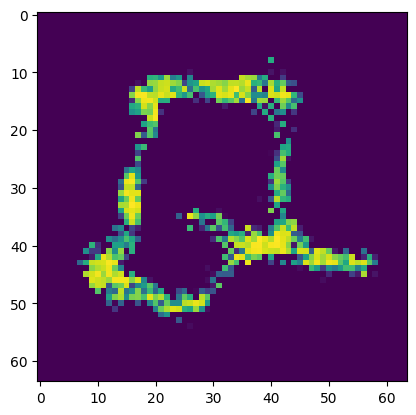

Epoch [10/50] Batch 400/938                   Loss D: -23640.7070, loss G: 11786.0361
tensor([2, 2, 4, 2, 4, 3, 9, 7, 1, 9, 1, 0, 9, 7, 4, 1, 2, 2, 0, 2, 6, 9, 8, 4,
        9, 3, 2, 2, 4, 3, 7, 8, 2, 2, 2, 7, 5, 4, 2, 3, 9, 8, 9, 5, 0, 9, 0, 8,
        8, 0, 7, 6, 4, 3, 0, 3, 6, 6, 6, 6, 6, 0, 9, 2], device='cuda:0')


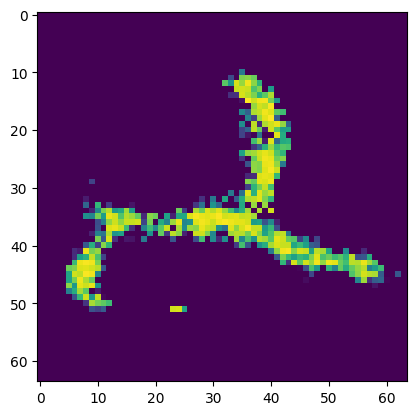

Epoch [10/50] Batch 500/938                   Loss D: -23394.6270, loss G: 11999.0107
tensor([0, 7, 2, 1, 1, 5, 2, 0, 8, 8, 5, 0, 3, 1, 4, 3, 4, 8, 0, 1, 9, 8, 5, 0,
        8, 8, 2, 5, 7, 0, 1, 5, 2, 9, 7, 4, 0, 3, 7, 3, 8, 9, 5, 1, 5, 4, 6, 5,
        0, 0, 7, 4, 0, 4, 5, 6, 8, 3, 9, 4, 9, 1, 4, 8], device='cuda:0')


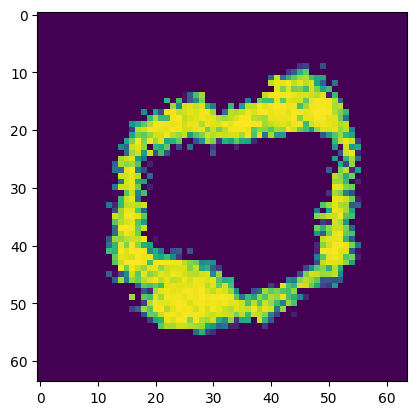

Epoch [10/50] Batch 600/938                   Loss D: -26107.9512, loss G: 12247.8652
tensor([1, 5, 4, 7, 7, 7, 4, 3, 7, 2, 2, 3, 7, 1, 2, 4, 0, 7, 1, 9, 4, 7, 9, 7,
        5, 4, 5, 0, 5, 5, 8, 3, 0, 1, 2, 4, 3, 2, 4, 4, 1, 1, 4, 0, 9, 9, 0, 5,
        8, 3, 4, 8, 5, 0, 3, 3, 1, 7, 5, 0, 8, 3, 5, 1], device='cuda:0')


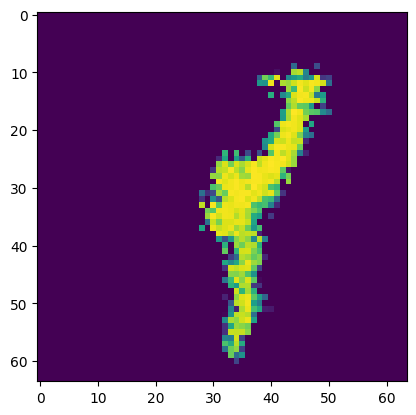

Epoch [10/50] Batch 700/938                   Loss D: -20516.6562, loss G: 10657.7393
tensor([6, 3, 2, 4, 1, 9, 0, 5, 9, 2, 4, 0, 8, 9, 0, 9, 5, 4, 1, 0, 8, 4, 3, 5,
        8, 3, 6, 5, 1, 1, 5, 1, 1, 9, 2, 2, 0, 0, 1, 7, 9, 1, 8, 2, 4, 1, 9, 6,
        3, 4, 5, 7, 7, 2, 9, 9, 2, 8, 8, 0, 5, 7, 8, 1], device='cuda:0')


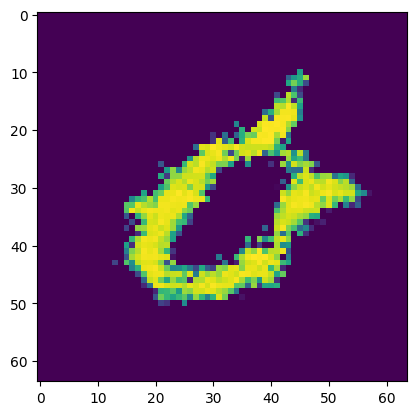

Epoch [10/50] Batch 800/938                   Loss D: -24492.3887, loss G: 12392.2490
tensor([6, 1, 1, 3, 5, 7, 5, 2, 0, 1, 4, 8, 5, 8, 8, 4, 0, 5, 9, 0, 7, 1, 8, 1,
        1, 5, 8, 1, 2, 6, 4, 1, 8, 3, 0, 1, 2, 2, 1, 7, 5, 3, 0, 7, 7, 2, 0, 8,
        5, 0, 3, 4, 6, 9, 1, 5, 3, 6, 3, 9, 3, 5, 1, 0], device='cuda:0')


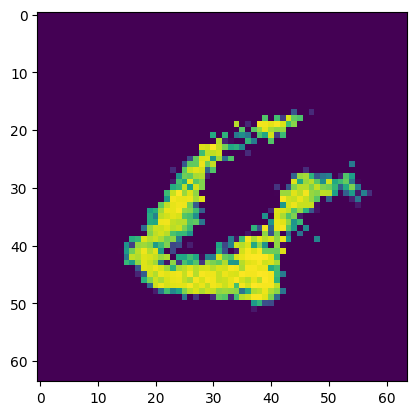

Epoch [10/50] Batch 900/938                   Loss D: -22863.1895, loss G: 12791.6475
tensor([3, 3, 4, 9, 9, 9, 1, 0, 6, 5, 9, 7, 3, 8, 9, 2, 2, 2, 2, 8, 6, 9, 4, 9,
        4, 7, 7, 1, 0, 9, 1, 1, 9, 9, 5, 0, 7, 9, 5, 1, 1, 5, 7, 9, 5, 9, 4, 0,
        4, 7, 4, 7, 5, 2, 1, 7, 1, 4, 3, 3, 4, 4, 4, 3], device='cuda:0')


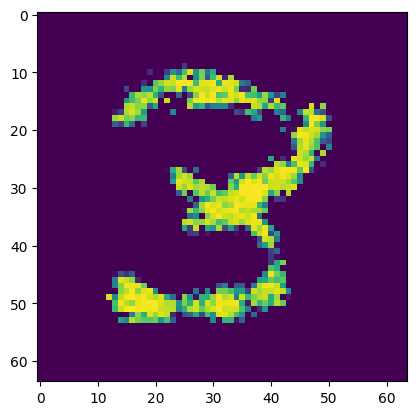

Epoch [11/50] Batch 100/938                   Loss D: -20029.5586, loss G: 12825.5098
tensor([0, 7, 6, 6, 9, 3, 7, 4, 9, 9, 9, 9, 3, 9, 1, 3, 6, 0, 0, 6, 1, 7, 1, 9,
        0, 9, 2, 6, 0, 7, 4, 2, 7, 0, 4, 5, 4, 7, 0, 2, 5, 1, 0, 2, 8, 7, 8, 6,
        6, 2, 1, 5, 7, 7, 5, 9, 6, 1, 1, 4, 3, 6, 3, 6], device='cuda:0')


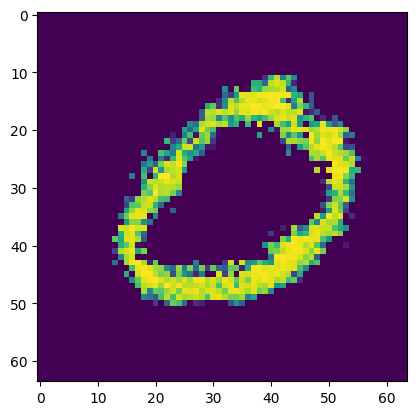

Epoch [11/50] Batch 200/938                   Loss D: -22949.9570, loss G: 11860.3730
tensor([1, 6, 0, 0, 0, 0, 2, 2, 6, 1, 3, 5, 1, 1, 0, 9, 6, 4, 9, 2, 2, 1, 9, 7,
        2, 8, 2, 4, 3, 2, 7, 8, 7, 8, 1, 7, 5, 1, 9, 2, 8, 5, 9, 6, 6, 7, 7, 0,
        4, 7, 1, 7, 8, 7, 6, 7, 8, 7, 4, 6, 6, 1, 4, 4], device='cuda:0')


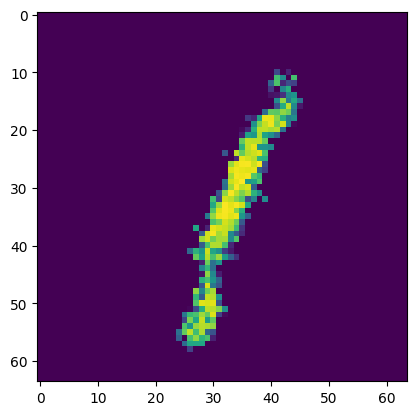

Epoch [11/50] Batch 300/938                   Loss D: 1074.1544, loss G: 13410.2998
tensor([4, 7, 5, 4, 7, 5, 4, 1, 6, 5, 6, 5, 0, 7, 3, 7, 8, 1, 2, 4, 5, 2, 5, 9,
        0, 8, 9, 9, 2, 1, 3, 4, 1, 5, 7, 7, 4, 5, 8, 3, 4, 1, 6, 1, 4, 8, 8, 1,
        5, 9, 0, 1, 1, 5, 3, 5, 3, 5, 5, 0, 3, 0, 8, 3], device='cuda:0')


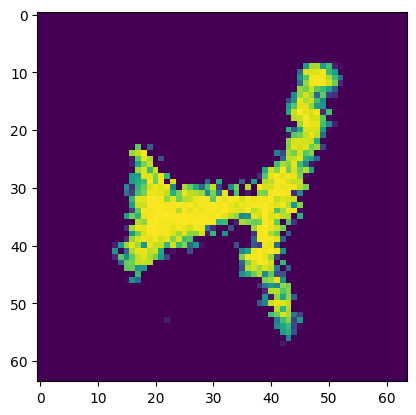

Epoch [11/50] Batch 400/938                   Loss D: -28877.5156, loss G: 13866.5430
tensor([2, 0, 7, 5, 2, 7, 0, 9, 0, 7, 6, 4, 1, 4, 6, 8, 8, 3, 0, 5, 0, 4, 4, 8,
        0, 6, 2, 5, 0, 7, 0, 7, 5, 9, 5, 4, 9, 9, 7, 0, 1, 8, 3, 8, 2, 2, 9, 6,
        8, 0, 4, 9, 0, 4, 9, 9, 9, 4, 8, 5, 9, 3, 5, 8], device='cuda:0')


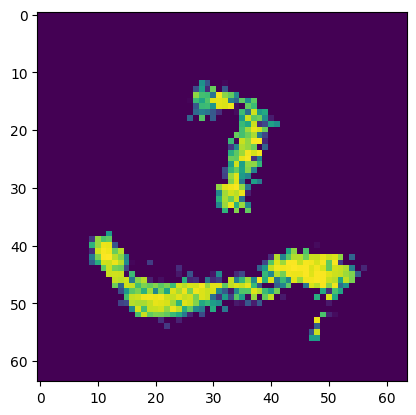

Epoch [11/50] Batch 500/938                   Loss D: -28184.2441, loss G: 13625.2773
tensor([1, 6, 9, 7, 3, 4, 8, 1, 1, 1, 4, 2, 0, 9, 1, 1, 9, 1, 8, 5, 0, 0, 5, 7,
        3, 2, 1, 4, 1, 8, 8, 9, 0, 8, 7, 7, 6, 5, 5, 1, 7, 7, 3, 6, 8, 3, 9, 6,
        5, 6, 8, 1, 3, 5, 7, 8, 5, 6, 5, 3, 1, 1, 0, 8], device='cuda:0')


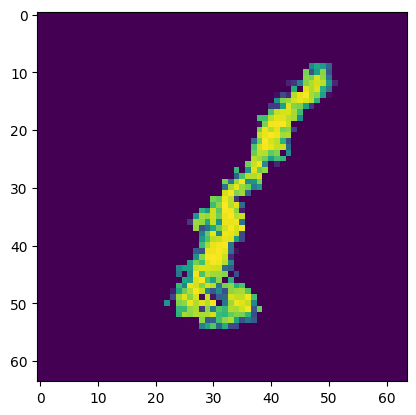

Epoch [11/50] Batch 600/938                   Loss D: -27600.2637, loss G: 14041.8926
tensor([1, 1, 0, 7, 2, 8, 8, 8, 7, 3, 6, 4, 0, 8, 2, 0, 4, 5, 3, 6, 2, 9, 4, 6,
        8, 0, 6, 0, 4, 4, 5, 7, 7, 1, 4, 1, 3, 8, 3, 5, 1, 1, 7, 3, 9, 6, 7, 4,
        5, 6, 6, 0, 1, 1, 3, 3, 1, 0, 2, 6, 9, 3, 4, 4], device='cuda:0')


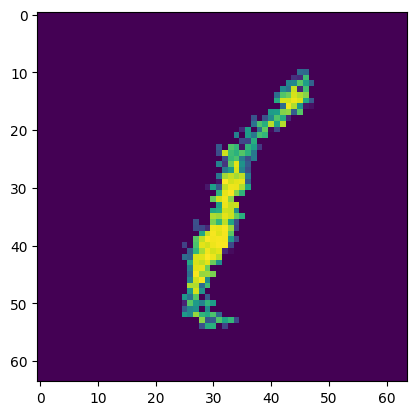

Epoch [11/50] Batch 700/938                   Loss D: -26533.7344, loss G: 13323.7793
tensor([2, 2, 1, 0, 7, 7, 4, 2, 8, 6, 3, 4, 1, 4, 4, 0, 3, 2, 8, 4, 1, 0, 3, 8,
        4, 9, 5, 0, 1, 1, 3, 0, 4, 3, 5, 9, 3, 6, 6, 7, 0, 1, 1, 1, 2, 6, 0, 1,
        1, 5, 9, 0, 4, 0, 3, 6, 5, 7, 2, 2, 8, 7, 1, 1], device='cuda:0')


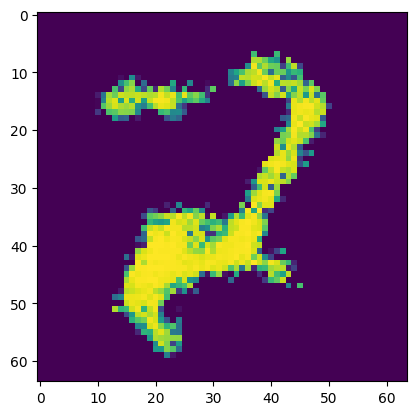

Epoch [11/50] Batch 800/938                   Loss D: -31264.2656, loss G: 14703.2588
tensor([2, 8, 9, 4, 6, 7, 3, 4, 6, 1, 0, 7, 8, 1, 9, 4, 2, 1, 7, 4, 4, 9, 9, 3,
        3, 2, 4, 1, 4, 8, 7, 5, 8, 3, 7, 5, 4, 0, 6, 3, 4, 9, 4, 0, 7, 4, 4, 6,
        8, 4, 0, 5, 5, 2, 6, 3, 1, 1, 8, 1, 9, 0, 6, 7], device='cuda:0')


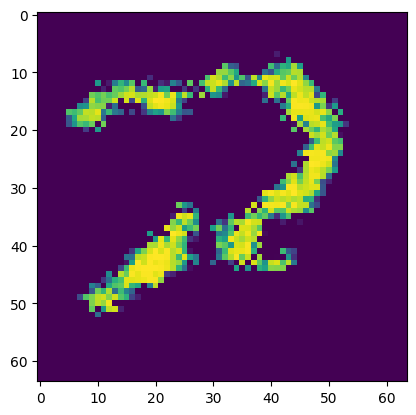

Epoch [11/50] Batch 900/938                   Loss D: -28805.5762, loss G: 14142.8125
tensor([7, 6, 8, 3, 0, 2, 5, 2, 6, 3, 3, 5, 1, 0, 9, 1, 6, 9, 7, 8, 0, 7, 2, 0,
        1, 8, 8, 1, 4, 3, 0, 1, 7, 1, 3, 7, 6, 8, 5, 3, 9, 4, 5, 3, 7, 4, 0, 4,
        3, 0, 2, 0, 4, 9, 4, 5, 4, 1, 7, 4, 8, 9, 8, 2], device='cuda:0')


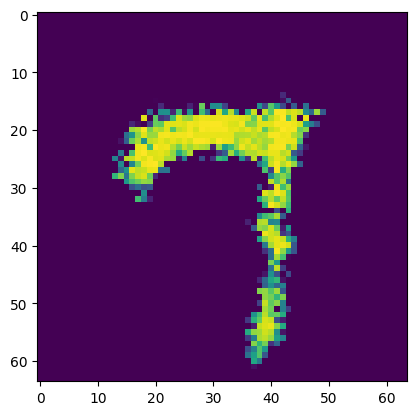

Epoch [12/50] Batch 100/938                   Loss D: -29538.0664, loss G: 15387.0039
tensor([7, 6, 1, 6, 6, 1, 3, 5, 5, 2, 3, 8, 4, 9, 8, 2, 3, 3, 9, 4, 4, 1, 7, 9,
        7, 7, 3, 8, 6, 0, 0, 3, 3, 9, 0, 2, 7, 9, 1, 6, 7, 0, 3, 0, 5, 0, 2, 2,
        2, 7, 3, 4, 1, 9, 2, 2, 1, 7, 1, 7, 6, 5, 4, 3], device='cuda:0')


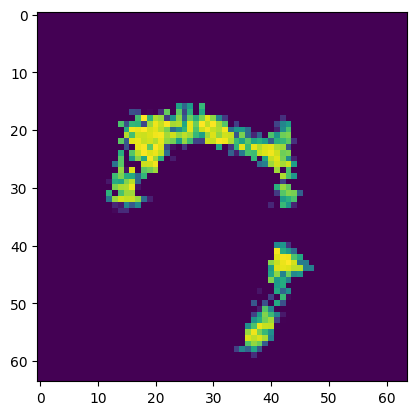

Epoch [12/50] Batch 200/938                   Loss D: -24069.1328, loss G: 13297.1543
tensor([7, 9, 2, 1, 5, 2, 3, 1, 6, 1, 6, 4, 6, 4, 5, 2, 5, 0, 4, 5, 6, 9, 5, 6,
        2, 4, 2, 9, 3, 3, 1, 2, 2, 0, 8, 4, 1, 5, 1, 0, 7, 0, 4, 8, 6, 9, 9, 1,
        9, 0, 1, 8, 7, 5, 1, 2, 9, 9, 5, 4, 8, 6, 5, 4], device='cuda:0')


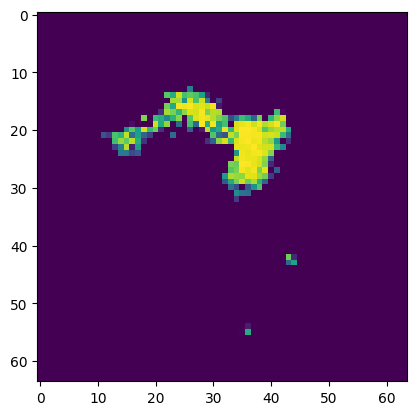

Epoch [12/50] Batch 300/938                   Loss D: -30978.7773, loss G: 15242.4902
tensor([5, 1, 6, 7, 6, 1, 6, 1, 9, 3, 1, 2, 3, 2, 8, 4, 8, 2, 7, 4, 9, 1, 1, 0,
        9, 1, 0, 8, 1, 6, 1, 6, 7, 3, 4, 9, 9, 9, 8, 0, 3, 9, 7, 0, 3, 2, 2, 1,
        1, 8, 4, 0, 5, 7, 1, 4, 8, 4, 7, 7, 7, 1, 9, 8], device='cuda:0')


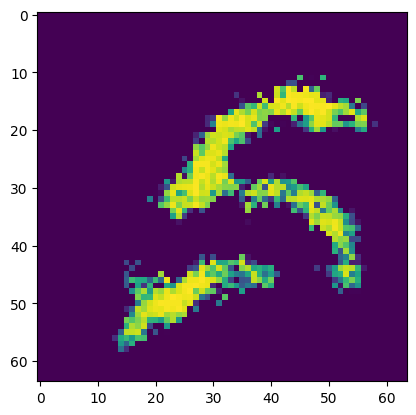

Epoch [12/50] Batch 400/938                   Loss D: -33139.9609, loss G: 16315.9688
tensor([3, 2, 9, 8, 7, 4, 3, 5, 2, 3, 6, 4, 0, 0, 4, 7, 3, 7, 3, 5, 9, 0, 1, 8,
        0, 8, 8, 3, 4, 3, 8, 3, 1, 5, 1, 3, 8, 2, 4, 6, 2, 7, 0, 0, 3, 0, 0, 1,
        0, 6, 1, 2, 4, 5, 8, 3, 5, 9, 7, 8, 8, 5, 9, 5], device='cuda:0')


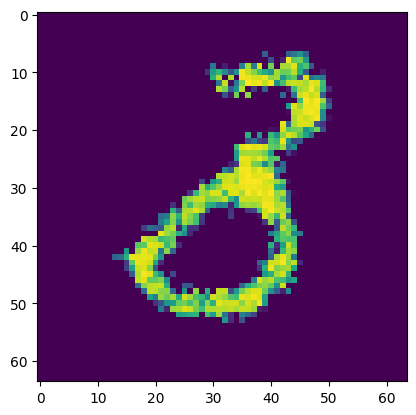

Epoch [12/50] Batch 500/938                   Loss D: -35551.7695, loss G: 16758.4648
tensor([8, 8, 0, 2, 8, 8, 9, 3, 7, 3, 5, 4, 4, 6, 8, 2, 1, 3, 1, 2, 6, 6, 7, 1,
        2, 7, 3, 0, 9, 3, 6, 6, 2, 0, 5, 7, 2, 7, 8, 2, 0, 8, 3, 0, 1, 4, 3, 5,
        4, 3, 1, 0, 2, 1, 0, 1, 6, 0, 7, 1, 7, 4, 0, 4], device='cuda:0')


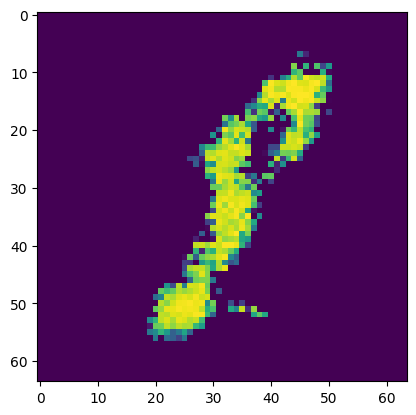

Epoch [12/50] Batch 600/938                   Loss D: -35912.4922, loss G: 16840.8359
tensor([5, 9, 6, 3, 3, 9, 1, 6, 8, 3, 1, 0, 6, 9, 2, 0, 0, 0, 0, 7, 2, 5, 9, 7,
        6, 7, 0, 4, 0, 1, 6, 7, 1, 9, 5, 8, 9, 5, 8, 5, 8, 2, 2, 8, 3, 6, 9, 6,
        1, 6, 5, 6, 6, 3, 1, 3, 5, 5, 4, 7, 1, 2, 3, 6], device='cuda:0')


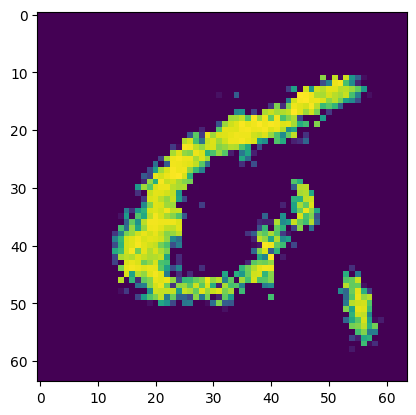

Epoch [12/50] Batch 700/938                   Loss D: 64521.3203, loss G: 16557.1172
tensor([3, 8, 6, 6, 6, 9, 0, 8, 1, 3, 5, 0, 8, 6, 2, 9, 1, 9, 7, 4, 6, 3, 3, 6,
        1, 8, 8, 4, 9, 0, 9, 2, 0, 5, 9, 2, 3, 7, 4, 9, 9, 4, 5, 1, 3, 0, 4, 4,
        7, 4, 4, 3, 4, 1, 3, 3, 7, 7, 8, 4, 2, 7, 6, 4], device='cuda:0')


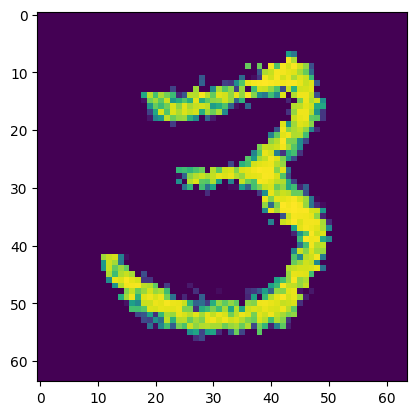

Epoch [12/50] Batch 800/938                   Loss D: -36102.2578, loss G: 17349.7422
tensor([8, 3, 4, 5, 0, 9, 9, 0, 1, 9, 3, 2, 2, 6, 3, 9, 4, 2, 5, 5, 4, 6, 1, 6,
        6, 1, 9, 2, 5, 9, 3, 3, 3, 1, 5, 3, 6, 2, 1, 4, 9, 6, 2, 1, 5, 7, 4, 6,
        4, 3, 6, 8, 1, 2, 8, 2, 4, 9, 5, 7, 7, 9, 7, 8], device='cuda:0')


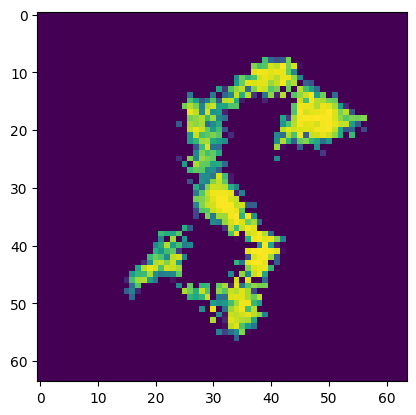

Epoch [12/50] Batch 900/938                   Loss D: -33037.2734, loss G: 16293.6670
tensor([7, 8, 7, 3, 7, 8, 1, 8, 8, 9, 1, 6, 0, 6, 2, 9, 6, 2, 6, 7, 8, 8, 1, 6,
        1, 4, 0, 1, 2, 6, 4, 8, 6, 4, 3, 7, 2, 6, 3, 9, 7, 5, 9, 4, 6, 6, 4, 6,
        8, 6, 2, 6, 7, 3, 6, 7, 7, 6, 2, 7, 4, 0, 8, 1], device='cuda:0')


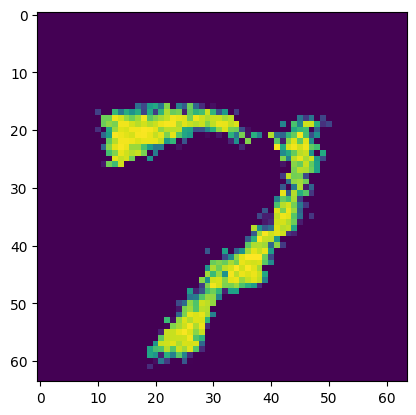

Epoch [13/50] Batch 100/938                   Loss D: -31955.5391, loss G: 13992.6152
tensor([7, 7, 4, 2, 3, 2, 2, 1, 0, 5, 2, 5, 3, 3, 1, 4, 1, 7, 2, 9, 1, 7, 8, 1,
        1, 8, 0, 8, 8, 6, 5, 7, 6, 2, 3, 2, 7, 0, 2, 5, 1, 0, 3, 1, 0, 1, 1, 1,
        6, 0, 2, 6, 1, 7, 8, 4, 9, 1, 8, 4, 3, 9, 0, 7], device='cuda:0')


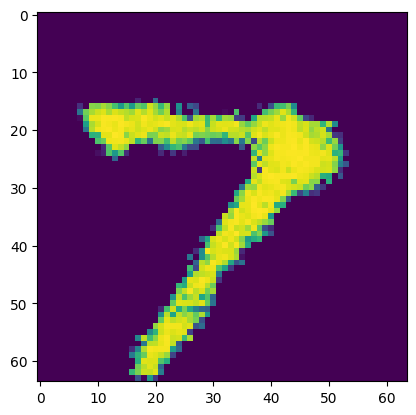

Epoch [13/50] Batch 200/938                   Loss D: -40143.9648, loss G: 18969.2676
tensor([2, 1, 1, 4, 5, 8, 1, 6, 8, 8, 5, 0, 6, 5, 4, 6, 3, 5, 0, 6, 2, 3, 0, 4,
        6, 5, 3, 0, 4, 6, 1, 5, 3, 4, 6, 2, 0, 5, 2, 2, 4, 0, 0, 5, 7, 3, 1, 7,
        6, 7, 7, 1, 2, 1, 4, 6, 7, 3, 9, 0, 8, 0, 2, 5], device='cuda:0')


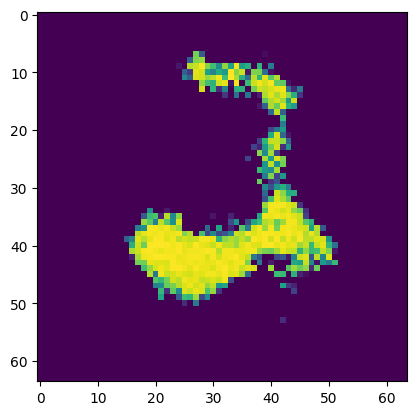

Epoch [13/50] Batch 300/938                   Loss D: -40891.2344, loss G: 18665.2969
tensor([1, 9, 5, 8, 2, 8, 0, 2, 5, 8, 8, 9, 7, 6, 8, 2, 6, 6, 9, 2, 4, 2, 7, 5,
        5, 6, 8, 3, 9, 2, 2, 5, 3, 8, 7, 3, 7, 3, 0, 1, 3, 3, 2, 5, 7, 9, 5, 2,
        0, 6, 3, 4, 1, 7, 8, 7, 6, 4, 5, 9, 4, 5, 7, 2], device='cuda:0')


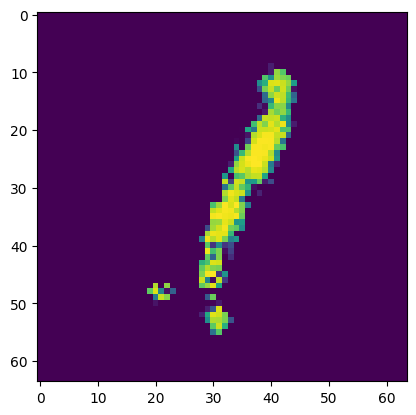

Epoch [13/50] Batch 400/938                   Loss D: -39386.3555, loss G: 19242.3652
tensor([2, 0, 4, 9, 7, 7, 0, 1, 9, 1, 0, 3, 8, 3, 6, 3, 2, 3, 2, 5, 0, 9, 2, 9,
        7, 8, 8, 3, 5, 7, 8, 1, 2, 5, 6, 9, 3, 6, 3, 5, 6, 7, 1, 1, 1, 8, 7, 7,
        2, 0, 1, 2, 6, 9, 9, 6, 2, 8, 1, 6, 0, 2, 0, 0], device='cuda:0')


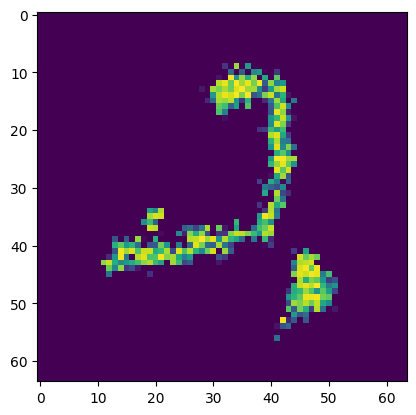

Epoch [13/50] Batch 500/938                   Loss D: -39372.2031, loss G: 18863.2324
tensor([9, 4, 3, 3, 9, 5, 2, 9, 9, 0, 6, 5, 3, 1, 5, 8, 2, 1, 0, 4, 4, 9, 7, 4,
        3, 8, 9, 3, 1, 6, 8, 8, 6, 9, 2, 7, 4, 3, 2, 7, 4, 6, 6, 1, 1, 0, 7, 7,
        0, 4, 0, 8, 6, 6, 8, 2, 8, 3, 5, 1, 6, 8, 4, 2], device='cuda:0')


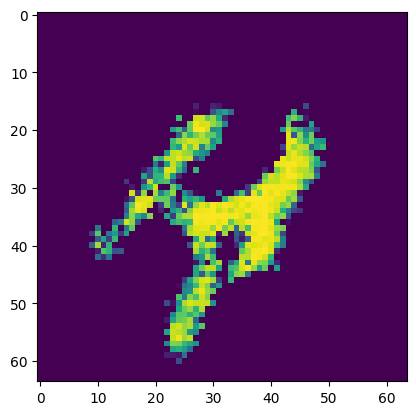

Epoch [13/50] Batch 600/938                   Loss D: -32573.2422, loss G: 17632.3203
tensor([4, 8, 2, 8, 6, 5, 4, 4, 7, 8, 6, 6, 4, 3, 6, 2, 6, 8, 8, 4, 3, 4, 7, 3,
        4, 5, 8, 8, 9, 5, 2, 9, 1, 9, 7, 2, 2, 1, 4, 1, 0, 6, 1, 7, 6, 2, 1, 9,
        3, 6, 8, 6, 2, 5, 1, 3, 8, 5, 6, 7, 6, 4, 1, 1], device='cuda:0')


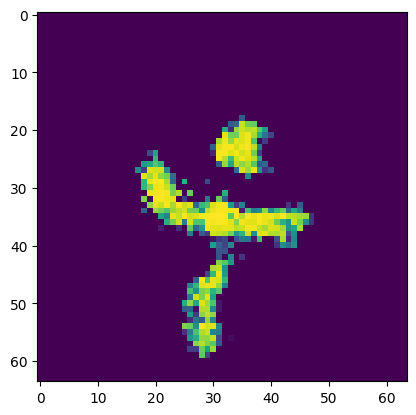

Epoch [13/50] Batch 700/938                   Loss D: -41363.0312, loss G: 20338.9336
tensor([4, 3, 8, 5, 5, 8, 0, 4, 7, 5, 7, 1, 3, 1, 1, 9, 8, 3, 4, 3, 2, 3, 9, 3,
        8, 2, 9, 7, 1, 6, 0, 9, 1, 7, 3, 2, 3, 0, 1, 7, 2, 3, 0, 7, 0, 1, 0, 9,
        9, 8, 3, 2, 0, 6, 2, 1, 6, 8, 1, 9, 0, 4, 0, 9], device='cuda:0')


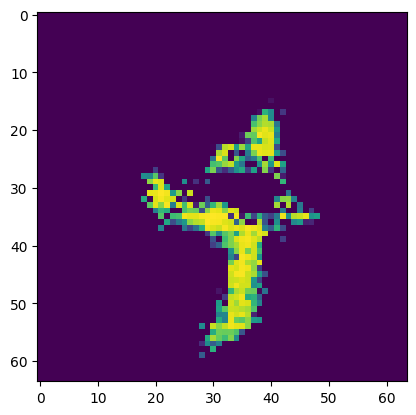

Epoch [13/50] Batch 800/938                   Loss D: -41084.1562, loss G: 20214.7422
tensor([4, 8, 8, 1, 5, 8, 0, 7, 2, 1, 4, 4, 1, 3, 4, 0, 8, 7, 1, 3, 6, 7, 8, 8,
        6, 3, 3, 9, 6, 1, 7, 9, 4, 5, 8, 0, 7, 5, 7, 9, 2, 2, 5, 2, 4, 1, 3, 9,
        0, 8, 6, 8, 8, 2, 8, 7, 6, 8, 7, 7, 7, 1, 2, 8], device='cuda:0')


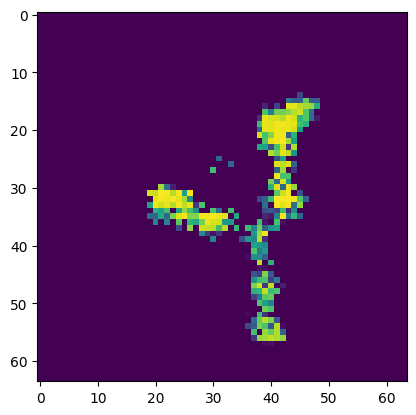

Epoch [13/50] Batch 900/938                   Loss D: -35585.1055, loss G: 20782.0469
tensor([7, 8, 6, 2, 2, 1, 0, 1, 4, 6, 5, 7, 8, 7, 8, 9, 9, 1, 8, 0, 2, 9, 5, 5,
        5, 0, 3, 3, 5, 1, 8, 8, 3, 0, 3, 2, 3, 0, 9, 4, 5, 7, 0, 5, 3, 3, 1, 6,
        7, 6, 9, 6, 9, 3, 4, 4, 1, 6, 2, 5, 7, 3, 4, 8], device='cuda:0')


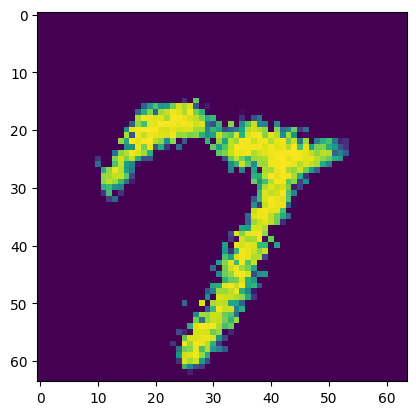

Epoch [14/50] Batch 100/938                   Loss D: -45008.1016, loss G: 21238.9258
tensor([2, 0, 5, 6, 0, 3, 0, 3, 3, 5, 0, 6, 1, 4, 7, 8, 9, 6, 5, 2, 0, 6, 5, 7,
        8, 0, 1, 8, 9, 0, 9, 5, 5, 2, 2, 6, 2, 1, 4, 7, 1, 9, 1, 0, 0, 8, 2, 7,
        3, 3, 0, 2, 0, 9, 6, 0, 0, 1, 9, 3, 2, 3, 6, 5], device='cuda:0')


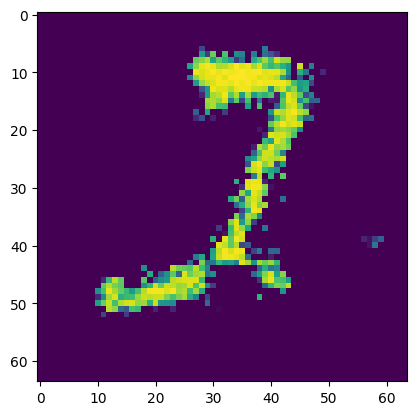

Epoch [14/50] Batch 200/938                   Loss D: -45445.1406, loss G: 21463.6426
tensor([0, 9, 9, 1, 7, 0, 7, 4, 4, 6, 2, 8, 3, 7, 1, 2, 7, 4, 8, 1, 3, 0, 0, 2,
        7, 4, 0, 8, 7, 0, 7, 6, 0, 7, 5, 2, 4, 9, 4, 8, 1, 8, 3, 8, 9, 9, 2, 2,
        4, 6, 0, 2, 5, 0, 8, 9, 3, 4, 1, 7, 3, 7, 0, 4], device='cuda:0')


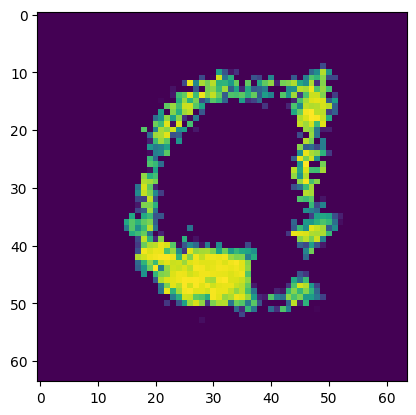

Epoch [14/50] Batch 300/938                   Loss D: -43198.3984, loss G: 21681.6172
tensor([0, 3, 0, 5, 8, 8, 1, 4, 6, 5, 2, 8, 7, 2, 5, 1, 8, 4, 1, 6, 2, 3, 8, 3,
        8, 6, 3, 0, 5, 4, 1, 3, 2, 6, 6, 0, 5, 9, 2, 3, 5, 2, 3, 4, 6, 9, 1, 9,
        8, 2, 3, 8, 6, 2, 1, 3, 1, 7, 9, 7, 8, 9, 8, 7], device='cuda:0')


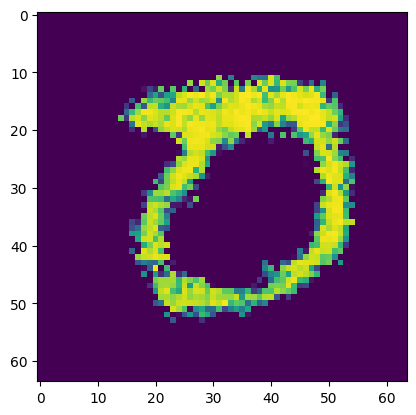

Epoch [14/50] Batch 400/938                   Loss D: -41324.4609, loss G: 20305.7129
tensor([0, 1, 0, 1, 6, 8, 4, 8, 6, 3, 8, 7, 3, 9, 0, 7, 7, 0, 2, 8, 8, 5, 1, 0,
        4, 0, 9, 9, 6, 8, 1, 0, 5, 9, 3, 4, 6, 3, 4, 1, 9, 9, 0, 3, 5, 3, 1, 5,
        1, 1, 5, 2, 8, 7, 4, 0, 1, 3, 6, 2, 2, 9, 0, 2], device='cuda:0')


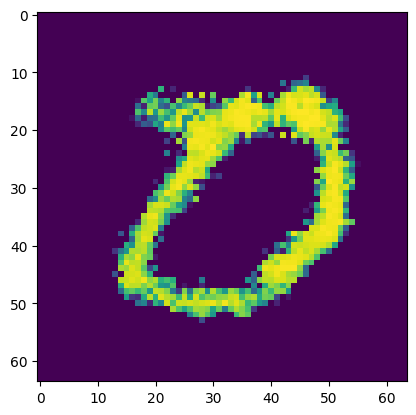

Epoch [14/50] Batch 500/938                   Loss D: -72.8993, loss G: 23187.0781
tensor([0, 2, 9, 4, 8, 2, 8, 4, 8, 9, 3, 4, 4, 3, 3, 4, 1, 2, 8, 8, 3, 9, 3, 8,
        5, 2, 4, 6, 5, 7, 4, 2, 8, 2, 3, 6, 4, 3, 7, 9, 4, 9, 1, 5, 9, 2, 6, 8,
        3, 8, 6, 8, 2, 2, 7, 1, 8, 9, 8, 6, 2, 4, 3, 1], device='cuda:0')


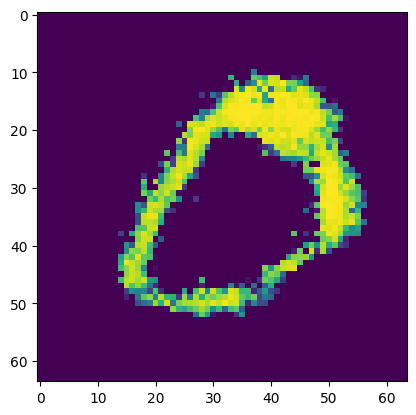

Epoch [14/50] Batch 600/938                   Loss D: -46112.7891, loss G: 21929.0156
tensor([0, 3, 9, 3, 0, 1, 6, 7, 0, 9, 9, 7, 1, 8, 5, 9, 6, 5, 0, 3, 7, 5, 2, 2,
        7, 7, 8, 1, 1, 2, 7, 3, 2, 0, 2, 4, 2, 9, 4, 9, 5, 8, 5, 6, 7, 9, 0, 8,
        8, 9, 4, 1, 2, 3, 3, 4, 2, 8, 9, 8, 9, 2, 0, 1], device='cuda:0')


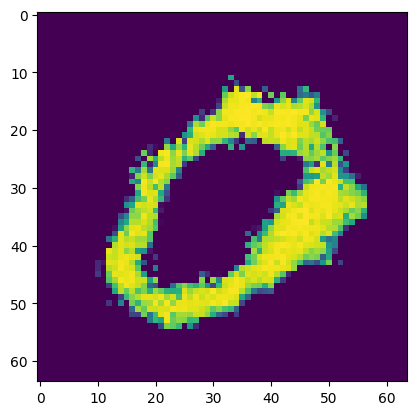

Epoch [14/50] Batch 700/938                   Loss D: -48248.4844, loss G: 22706.6289
tensor([3, 6, 4, 1, 1, 3, 5, 5, 5, 4, 8, 1, 3, 8, 1, 1, 5, 2, 6, 8, 3, 9, 0, 8,
        1, 7, 3, 6, 1, 9, 9, 3, 8, 9, 8, 2, 1, 5, 2, 6, 2, 3, 6, 2, 5, 4, 8, 3,
        3, 8, 3, 3, 0, 4, 1, 0, 1, 8, 7, 0, 8, 2, 0, 2], device='cuda:0')


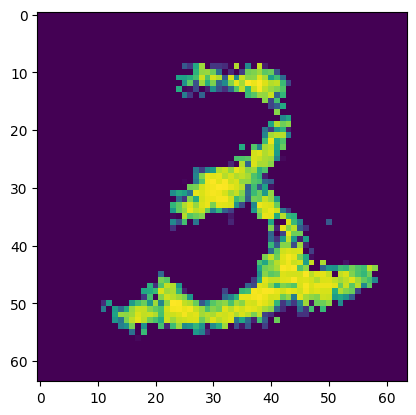

Epoch [14/50] Batch 800/938                   Loss D: -46172.2578, loss G: 22545.7656
tensor([9, 6, 3, 3, 2, 2, 3, 2, 7, 7, 0, 0, 2, 1, 8, 4, 1, 1, 0, 1, 8, 7, 0, 5,
        1, 1, 5, 8, 8, 4, 1, 3, 6, 0, 1, 7, 3, 7, 6, 9, 2, 3, 0, 6, 5, 4, 2, 0,
        0, 3, 2, 2, 8, 7, 5, 0, 2, 8, 8, 3, 3, 3, 5, 5], device='cuda:0')


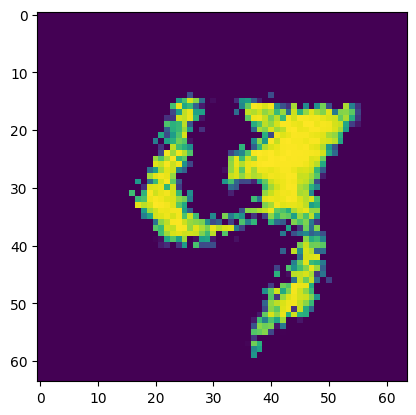

Epoch [14/50] Batch 900/938                   Loss D: -51033.8711, loss G: 24198.8516
tensor([3, 1, 9, 4, 8, 9, 9, 8, 7, 1, 3, 7, 8, 2, 4, 1, 6, 4, 2, 9, 7, 8, 8, 8,
        4, 4, 8, 8, 4, 0, 6, 7, 6, 3, 4, 6, 9, 8, 2, 0, 5, 1, 9, 2, 7, 2, 2, 4,
        3, 1, 0, 2, 7, 3, 5, 8, 4, 0, 7, 3, 9, 1, 4, 6], device='cuda:0')


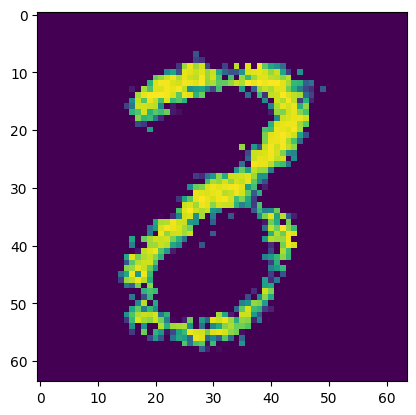

Epoch [15/50] Batch 100/938                   Loss D: -46702.1094, loss G: 23804.1074
tensor([6, 7, 1, 2, 5, 7, 7, 9, 7, 1, 7, 2, 5, 8, 3, 4, 6, 5, 1, 8, 2, 3, 1, 3,
        1, 6, 5, 2, 6, 5, 7, 7, 1, 8, 4, 7, 2, 6, 4, 3, 7, 0, 9, 8, 4, 3, 4, 9,
        2, 3, 6, 8, 0, 2, 5, 2, 7, 8, 9, 7, 9, 0, 2, 8], device='cuda:0')


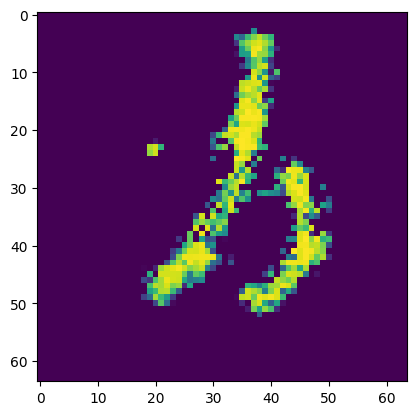

Epoch [15/50] Batch 200/938                   Loss D: -43251.4102, loss G: 23848.6250
tensor([0, 5, 4, 9, 6, 9, 1, 1, 3, 1, 8, 4, 9, 4, 1, 9, 8, 3, 8, 9, 7, 2, 9, 3,
        0, 9, 2, 3, 0, 3, 9, 0, 3, 7, 3, 1, 2, 0, 7, 8, 0, 9, 4, 5, 3, 6, 0, 8,
        0, 7, 0, 8, 3, 9, 6, 7, 3, 7, 2, 3, 5, 8, 4, 3], device='cuda:0')


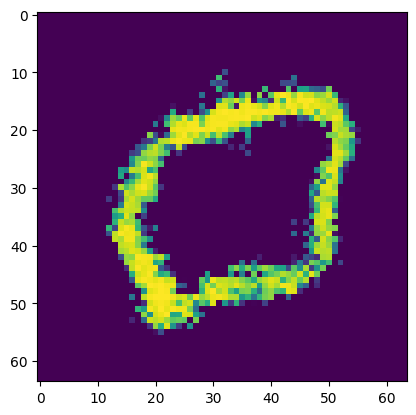

Epoch [15/50] Batch 300/938                   Loss D: -48514.0156, loss G: 24017.8984
tensor([4, 2, 3, 4, 2, 4, 8, 9, 1, 0, 2, 6, 6, 6, 2, 5, 0, 9, 1, 6, 9, 6, 8, 6,
        0, 6, 1, 3, 2, 7, 6, 8, 1, 1, 2, 4, 2, 8, 1, 0, 2, 0, 1, 5, 1, 0, 7, 5,
        4, 3, 1, 3, 9, 0, 5, 5, 9, 3, 8, 1, 2, 5, 9, 2], device='cuda:0')


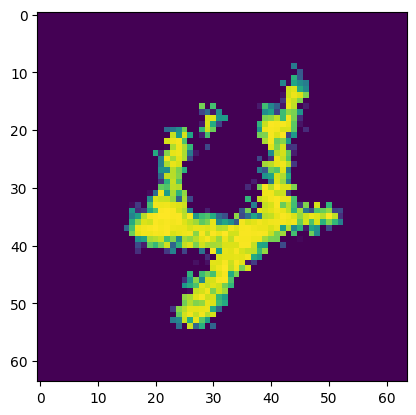

Epoch [15/50] Batch 400/938                   Loss D: -12328.8828, loss G: 24988.1367
tensor([0, 7, 9, 9, 7, 0, 0, 1, 6, 8, 7, 8, 1, 1, 7, 9, 2, 5, 8, 2, 9, 0, 9, 6,
        6, 3, 3, 1, 2, 2, 9, 5, 6, 6, 7, 2, 7, 1, 1, 3, 7, 4, 5, 4, 7, 4, 7, 2,
        2, 2, 3, 3, 5, 9, 6, 1, 0, 8, 6, 2, 9, 1, 3, 9], device='cuda:0')


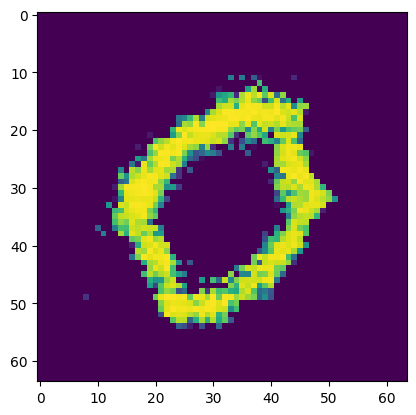

Epoch [15/50] Batch 500/938                   Loss D: -52635.0117, loss G: 24796.9492
tensor([5, 5, 7, 7, 4, 1, 4, 3, 4, 6, 3, 6, 2, 3, 5, 8, 7, 9, 3, 9, 3, 8, 4, 7,
        3, 3, 5, 9, 6, 2, 0, 2, 1, 4, 4, 8, 8, 5, 6, 5, 9, 3, 9, 7, 6, 0, 8, 4,
        2, 8, 3, 5, 7, 3, 3, 4, 9, 0, 3, 2, 2, 4, 4, 8], device='cuda:0')


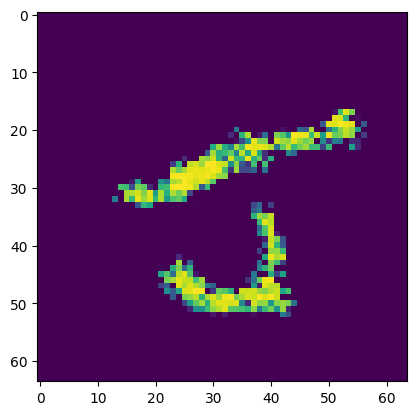

Epoch [15/50] Batch 600/938                   Loss D: -574.3555, loss G: 27319.1328
tensor([1, 8, 8, 6, 2, 2, 4, 1, 2, 7, 0, 1, 4, 2, 4, 8, 9, 2, 0, 1, 8, 2, 5, 4,
        1, 6, 5, 0, 8, 9, 9, 1, 0, 4, 8, 3, 8, 1, 0, 7, 0, 4, 7, 2, 4, 2, 1, 9,
        2, 4, 7, 5, 2, 3, 2, 7, 0, 8, 8, 2, 6, 3, 7, 4], device='cuda:0')


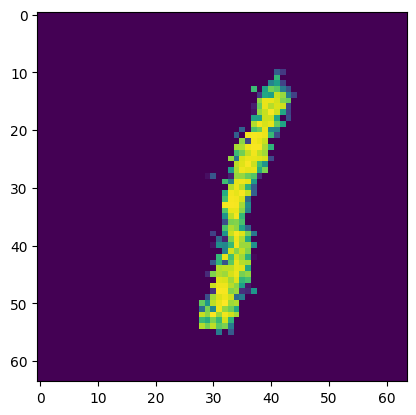

Epoch [15/50] Batch 700/938                   Loss D: -54002.6797, loss G: 26341.7383
tensor([7, 6, 8, 8, 9, 7, 2, 4, 4, 7, 4, 2, 3, 2, 1, 1, 7, 8, 0, 5, 7, 8, 1, 0,
        1, 0, 3, 2, 8, 8, 6, 4, 1, 6, 3, 6, 4, 2, 8, 3, 3, 6, 5, 2, 2, 2, 4, 1,
        9, 2, 1, 7, 2, 4, 3, 8, 2, 6, 4, 1, 9, 1, 0, 6], device='cuda:0')


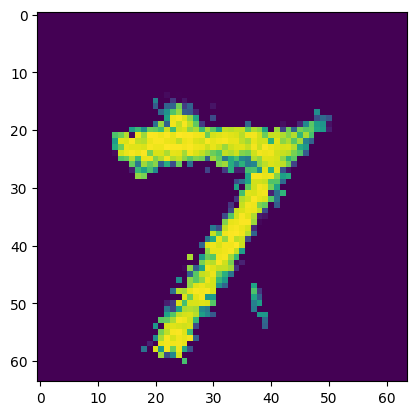

Epoch [15/50] Batch 800/938                   Loss D: -52884.8516, loss G: 26652.3066
tensor([4, 1, 4, 6, 0, 6, 7, 3, 4, 9, 6, 7, 8, 9, 6, 2, 9, 1, 8, 6, 1, 8, 3, 1,
        2, 7, 6, 1, 7, 3, 4, 6, 4, 7, 3, 8, 4, 8, 4, 6, 3, 5, 0, 2, 0, 8, 1, 2,
        7, 4, 7, 6, 7, 3, 1, 1, 5, 4, 7, 5, 3, 3, 1, 8], device='cuda:0')


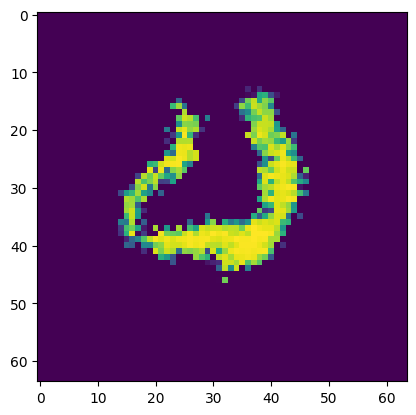

Epoch [15/50] Batch 900/938                   Loss D: -54378.2344, loss G: 26907.8477
tensor([0, 9, 4, 3, 7, 6, 9, 4, 5, 4, 0, 8, 2, 6, 4, 0, 1, 4, 0, 9, 5, 9, 4, 1,
        6, 1, 0, 2, 8, 0, 4, 3, 5, 7, 9, 0, 0, 0, 5, 1, 3, 5, 8, 8, 5, 7, 2, 0,
        8, 8, 0, 6, 4, 7, 2, 7, 2, 7, 2, 6, 1, 1, 1, 8], device='cuda:0')


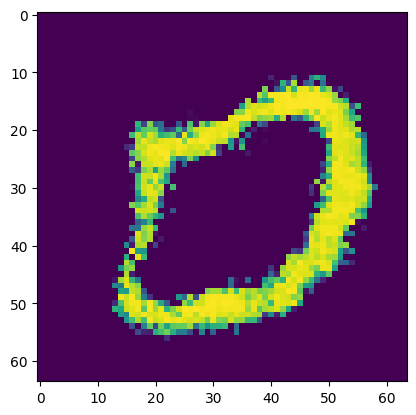

Epoch [16/50] Batch 100/938                   Loss D: -54586.2070, loss G: 28360.9766
tensor([3, 8, 7, 8, 4, 4, 8, 9, 0, 9, 9, 9, 5, 1, 0, 3, 5, 4, 7, 8, 5, 7, 2, 0,
        7, 1, 1, 2, 0, 5, 7, 9, 1, 4, 6, 1, 0, 9, 3, 2, 6, 6, 0, 9, 1, 9, 6, 1,
        3, 6, 7, 0, 6, 3, 7, 9, 0, 3, 0, 5, 7, 5, 5, 9], device='cuda:0')


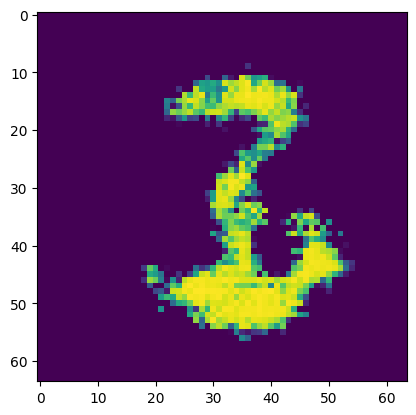

Epoch [16/50] Batch 200/938                   Loss D: -58330.2500, loss G: 27285.3320
tensor([5, 1, 4, 2, 0, 1, 0, 5, 0, 0, 1, 5, 8, 7, 0, 0, 0, 1, 4, 8, 3, 5, 2, 1,
        5, 4, 9, 7, 3, 7, 4, 0, 9, 2, 6, 9, 0, 0, 8, 8, 2, 1, 7, 3, 8, 9, 0, 0,
        7, 6, 7, 9, 7, 9, 6, 0, 2, 5, 3, 4, 9, 0, 8, 8], device='cuda:0')


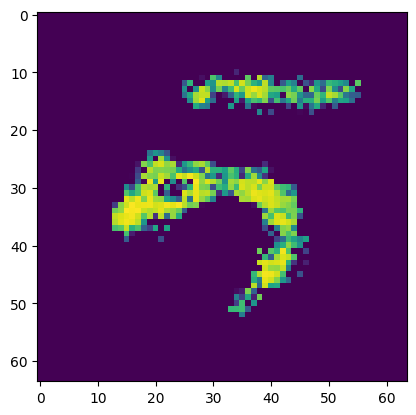

Epoch [16/50] Batch 300/938                   Loss D: 380.1826, loss G: 29369.3301
tensor([9, 9, 0, 8, 1, 9, 4, 7, 6, 1, 6, 0, 8, 0, 1, 7, 8, 9, 2, 5, 9, 6, 6, 2,
        2, 8, 2, 7, 4, 6, 5, 0, 3, 7, 1, 1, 9, 1, 9, 7, 4, 4, 9, 0, 7, 8, 6, 1,
        9, 1, 8, 4, 4, 7, 0, 1, 7, 1, 4, 3, 1, 7, 2, 3], device='cuda:0')


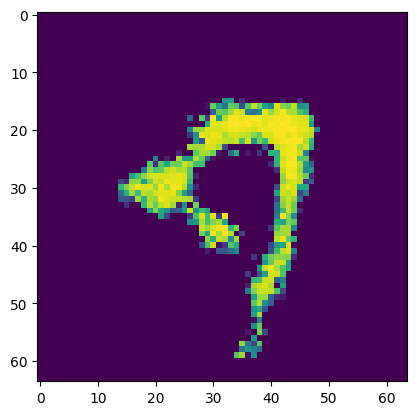

Epoch [16/50] Batch 400/938                   Loss D: -63564.9766, loss G: 28998.6250
tensor([3, 5, 1, 2, 2, 1, 8, 8, 3, 2, 0, 3, 7, 6, 8, 0, 4, 3, 9, 3, 6, 6, 5, 9,
        5, 2, 9, 5, 8, 5, 1, 9, 2, 4, 5, 7, 0, 9, 5, 5, 1, 3, 1, 8, 2, 1, 4, 0,
        2, 6, 3, 5, 3, 8, 0, 6, 0, 7, 3, 7, 5, 7, 6, 4], device='cuda:0')


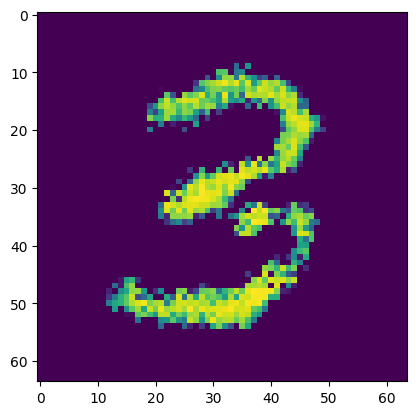

Epoch [16/50] Batch 500/938                   Loss D: -64063.6289, loss G: 29982.9180
tensor([7, 3, 2, 7, 5, 2, 0, 7, 9, 3, 5, 6, 9, 8, 2, 7, 3, 5, 6, 9, 8, 1, 6, 5,
        9, 0, 1, 4, 1, 6, 2, 6, 7, 3, 2, 6, 2, 5, 5, 4, 8, 6, 4, 8, 8, 9, 3, 7,
        2, 3, 2, 7, 9, 6, 9, 1, 1, 7, 5, 6, 2, 3, 5, 1], device='cuda:0')


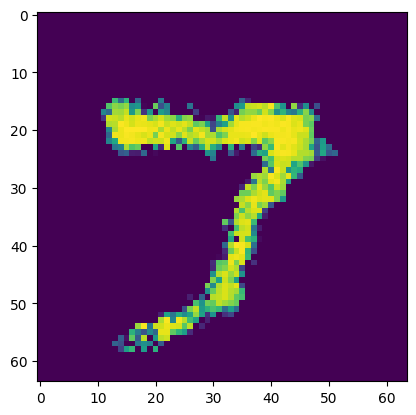

Epoch [16/50] Batch 600/938                   Loss D: -65001.9883, loss G: 30332.1816
tensor([8, 8, 6, 7, 5, 2, 9, 0, 7, 9, 9, 2, 7, 8, 7, 6, 7, 5, 5, 6, 5, 5, 2, 8,
        8, 3, 3, 2, 2, 8, 2, 9, 3, 2, 3, 7, 8, 0, 4, 4, 7, 0, 8, 6, 6, 2, 4, 0,
        8, 7, 6, 5, 5, 4, 6, 1, 0, 2, 5, 7, 3, 2, 1, 3], device='cuda:0')


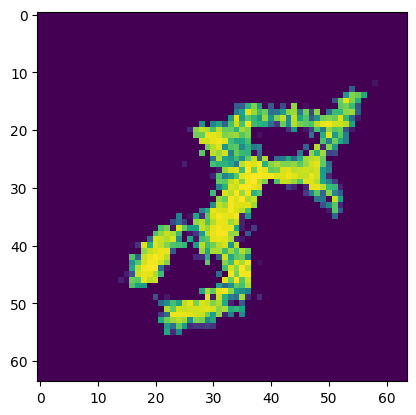

Epoch [16/50] Batch 700/938                   Loss D: -62121.4297, loss G: 30035.9453
tensor([6, 4, 9, 2, 2, 5, 9, 4, 8, 6, 2, 1, 4, 4, 7, 8, 3, 2, 4, 8, 7, 7, 2, 4,
        7, 4, 6, 8, 5, 7, 3, 1, 1, 8, 6, 3, 1, 8, 7, 3, 4, 9, 0, 9, 0, 7, 7, 3,
        6, 7, 0, 1, 5, 9, 2, 7, 9, 6, 5, 0, 9, 4, 6, 8], device='cuda:0')


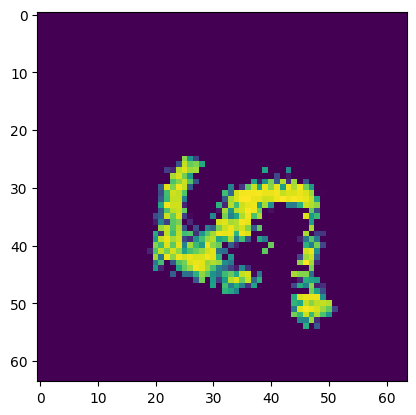

Epoch [16/50] Batch 800/938                   Loss D: -68420.0000, loss G: 31213.9629
tensor([3, 4, 3, 2, 8, 0, 0, 6, 1, 3, 5, 2, 3, 6, 9, 8, 6, 7, 3, 5, 6, 2, 8, 2,
        0, 5, 3, 2, 8, 9, 8, 5, 2, 8, 4, 1, 3, 2, 8, 5, 8, 8, 7, 0, 3, 1, 8, 9,
        2, 7, 3, 4, 5, 7, 8, 0, 4, 3, 2, 8, 7, 0, 5, 1], device='cuda:0')


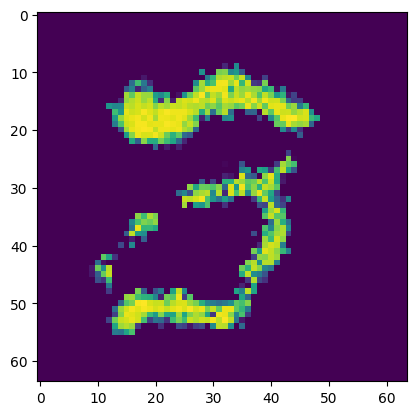

Epoch [16/50] Batch 900/938                   Loss D: -69942.6250, loss G: 32043.8906
tensor([8, 7, 0, 3, 4, 6, 6, 2, 7, 1, 3, 5, 6, 7, 4, 0, 3, 8, 8, 9, 0, 0, 4, 7,
        2, 4, 6, 0, 0, 2, 8, 7, 8, 1, 9, 1, 7, 9, 6, 8, 8, 5, 8, 7, 2, 9, 2, 6,
        0, 5, 1, 4, 9, 4, 5, 7, 9, 7, 7, 0, 8, 2, 3, 1], device='cuda:0')


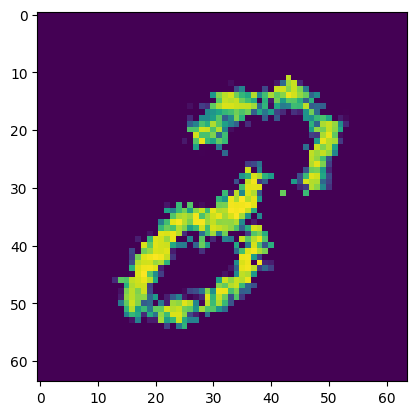

Epoch [17/50] Batch 100/938                   Loss D: -65882.0859, loss G: 32361.7188
tensor([7, 8, 6, 7, 3, 4, 5, 4, 1, 9, 2, 7, 1, 0, 6, 9, 0, 8, 0, 4, 5, 2, 2, 9,
        8, 4, 8, 8, 7, 4, 4, 0, 1, 9, 1, 8, 4, 9, 5, 2, 6, 3, 5, 5, 4, 0, 3, 9,
        7, 3, 2, 5, 9, 7, 2, 8, 6, 7, 5, 9, 8, 2, 1, 4], device='cuda:0')


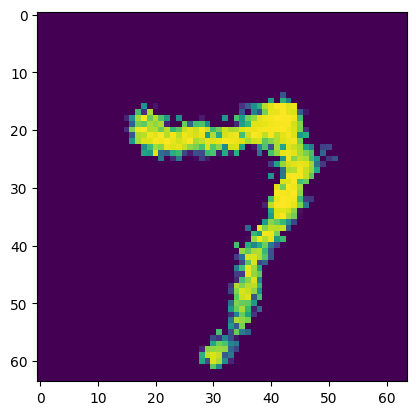

Epoch [17/50] Batch 200/938                   Loss D: -71246.5312, loss G: 32454.0508
tensor([0, 8, 0, 3, 9, 8, 9, 2, 8, 0, 9, 0, 6, 4, 6, 1, 0, 0, 2, 3, 5, 1, 0, 0,
        2, 5, 7, 0, 3, 2, 2, 2, 2, 4, 7, 3, 8, 8, 5, 9, 6, 9, 8, 4, 3, 2, 2, 3,
        8, 5, 9, 5, 2, 9, 8, 1, 1, 4, 7, 3, 7, 1, 9, 3], device='cuda:0')


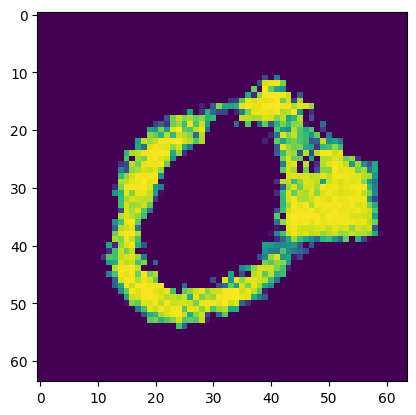

Epoch [17/50] Batch 300/938                   Loss D: -69817.9141, loss G: 32286.9609
tensor([6, 7, 0, 0, 3, 0, 0, 2, 6, 3, 1, 4, 2, 2, 7, 3, 5, 4, 6, 2, 0, 6, 9, 6,
        0, 6, 1, 7, 9, 8, 8, 9, 3, 0, 3, 3, 4, 5, 1, 8, 5, 5, 3, 7, 1, 3, 3, 5,
        7, 3, 0, 4, 8, 6, 3, 2, 3, 3, 0, 7, 3, 7, 5, 8], device='cuda:0')


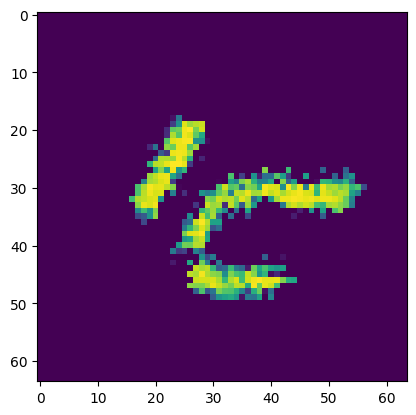

Epoch [17/50] Batch 400/938                   Loss D: -75888.7969, loss G: 33970.5078
tensor([8, 5, 3, 9, 4, 7, 6, 1, 0, 6, 5, 3, 6, 7, 4, 1, 0, 7, 0, 4, 4, 9, 0, 6,
        2, 0, 2, 8, 0, 8, 9, 4, 1, 8, 8, 7, 8, 9, 9, 5, 1, 3, 2, 0, 8, 8, 9, 3,
        9, 2, 4, 8, 4, 9, 2, 4, 8, 6, 6, 1, 2, 7, 3, 5], device='cuda:0')


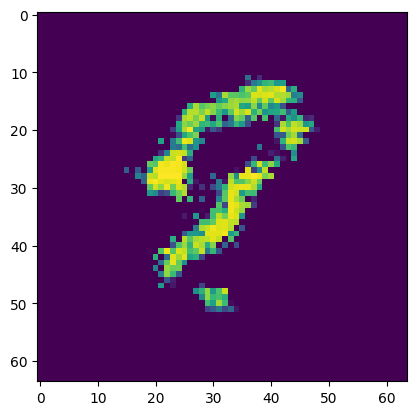

Epoch [17/50] Batch 500/938                   Loss D: -78.9590, loss G: 34536.1797
tensor([3, 8, 7, 0, 4, 2, 3, 5, 2, 0, 0, 2, 4, 9, 7, 1, 4, 0, 6, 1, 7, 3, 1, 5,
        6, 3, 1, 1, 3, 7, 7, 3, 4, 2, 2, 0, 2, 9, 6, 6, 4, 9, 4, 2, 5, 4, 6, 9,
        4, 6, 7, 6, 1, 1, 1, 0, 1, 9, 0, 3, 6, 5, 2, 2], device='cuda:0')


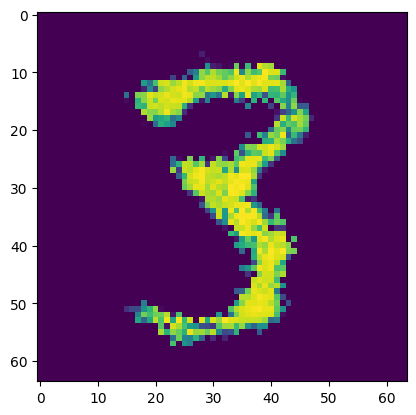

Epoch [17/50] Batch 600/938                   Loss D: -72662.7031, loss G: 34237.9375
tensor([1, 9, 1, 4, 6, 8, 7, 5, 6, 7, 5, 3, 0, 2, 8, 1, 9, 7, 8, 6, 7, 5, 1, 0,
        3, 7, 8, 3, 6, 6, 4, 0, 3, 2, 8, 7, 4, 3, 9, 2, 3, 5, 1, 3, 9, 1, 9, 2,
        5, 5, 1, 3, 5, 5, 2, 5, 3, 7, 6, 4, 8, 2, 8, 4], device='cuda:0')


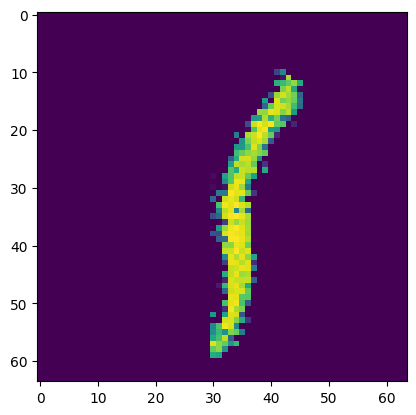

Epoch [17/50] Batch 700/938                   Loss D: -67657.1719, loss G: 33105.2891
tensor([5, 5, 1, 7, 3, 3, 1, 8, 3, 7, 9, 8, 1, 3, 6, 9, 1, 7, 3, 7, 2, 2, 2, 4,
        3, 2, 6, 2, 7, 4, 3, 6, 9, 4, 4, 7, 6, 9, 6, 1, 2, 8, 7, 8, 5, 5, 3, 9,
        6, 2, 6, 6, 1, 0, 8, 7, 8, 5, 8, 6, 1, 5, 3, 0], device='cuda:0')


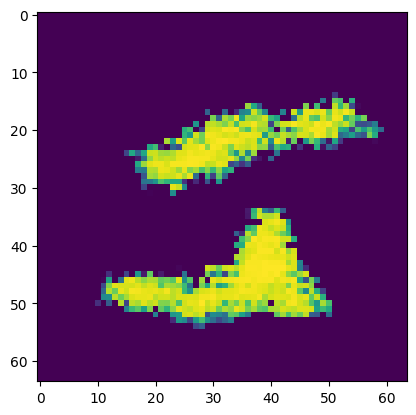

Epoch [17/50] Batch 800/938                   Loss D: -71850.4297, loss G: 34004.1016
tensor([7, 9, 5, 2, 1, 5, 5, 0, 7, 7, 8, 8, 6, 7, 2, 9, 1, 5, 4, 0, 1, 7, 2, 2,
        3, 9, 0, 1, 1, 1, 3, 4, 4, 0, 6, 2, 6, 2, 2, 6, 2, 5, 0, 7, 2, 0, 6, 9,
        9, 9, 8, 5, 1, 8, 5, 4, 4, 6, 8, 3, 7, 0, 0, 4], device='cuda:0')


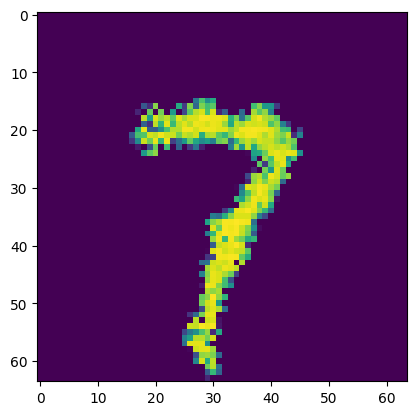

Epoch [17/50] Batch 900/938                   Loss D: -73318.2500, loss G: 34405.3438
tensor([6, 9, 3, 3, 1, 8, 3, 4, 1, 7, 6, 4, 0, 5, 5, 7, 6, 7, 5, 9, 2, 2, 8, 3,
        1, 1, 3, 3, 6, 6, 1, 5, 7, 0, 0, 9, 8, 2, 5, 2, 1, 7, 1, 1, 8, 4, 2, 0,
        6, 7, 1, 1, 5, 2, 6, 7, 6, 8, 0, 5, 1, 8, 5, 0], device='cuda:0')


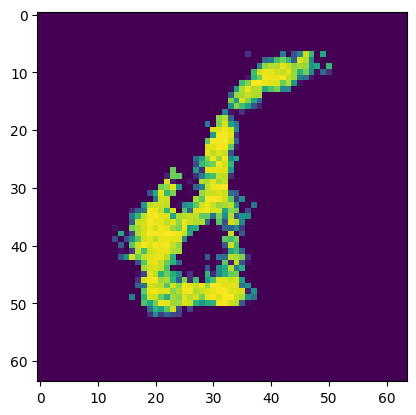

Epoch [18/50] Batch 100/938                   Loss D: -75295.6406, loss G: 35469.0469
tensor([9, 1, 8, 1, 7, 0, 5, 2, 9, 5, 5, 6, 6, 0, 8, 5, 7, 5, 3, 9, 8, 0, 7, 0,
        7, 2, 4, 2, 6, 1, 5, 4, 0, 1, 4, 5, 3, 8, 0, 7, 4, 1, 1, 7, 6, 0, 9, 4,
        8, 6, 9, 3, 4, 0, 2, 3, 0, 7, 5, 2, 8, 4, 8, 8], device='cuda:0')


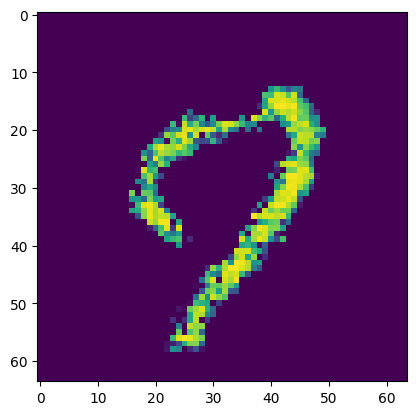

Epoch [18/50] Batch 200/938                   Loss D: -68819.2812, loss G: 35819.9609
tensor([5, 9, 7, 3, 5, 1, 4, 2, 8, 6, 3, 1, 9, 1, 6, 4, 1, 5, 0, 0, 3, 5, 3, 9,
        5, 9, 9, 6, 4, 6, 3, 3, 5, 6, 2, 0, 5, 9, 4, 6, 2, 7, 0, 3, 5, 5, 7, 8,
        0, 3, 2, 5, 7, 7, 2, 5, 0, 8, 4, 2, 8, 5, 2, 0], device='cuda:0')


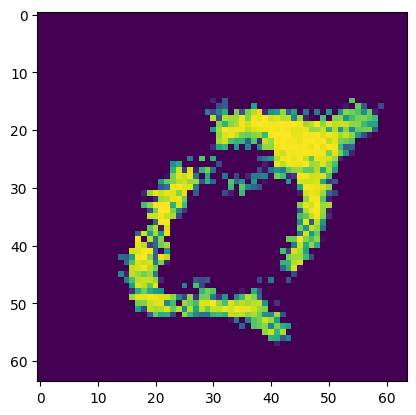

Epoch [18/50] Batch 300/938                   Loss D: -75554.3125, loss G: 36807.7656
tensor([6, 3, 2, 0, 9, 2, 8, 3, 1, 9, 1, 2, 5, 8, 9, 4, 7, 0, 0, 4, 8, 1, 2, 9,
        1, 8, 2, 8, 4, 2, 0, 7, 6, 9, 5, 4, 6, 2, 7, 8, 5, 1, 9, 3, 7, 5, 3, 6,
        0, 0, 8, 2, 0, 2, 9, 6, 0, 8, 6, 7, 2, 8, 2, 0], device='cuda:0')


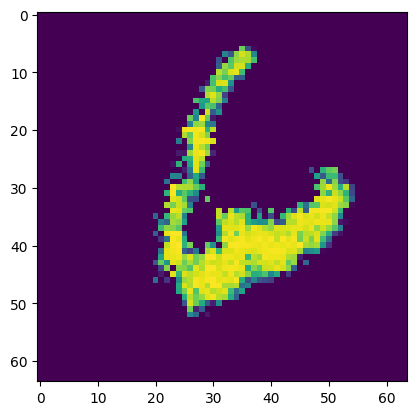

Epoch [18/50] Batch 400/938                   Loss D: -80946.4219, loss G: 37894.3125
tensor([7, 6, 6, 0, 7, 8, 3, 7, 0, 5, 7, 8, 7, 5, 9, 8, 3, 2, 5, 6, 2, 5, 8, 1,
        1, 6, 7, 4, 7, 6, 0, 7, 4, 4, 4, 3, 1, 7, 9, 1, 5, 2, 7, 8, 6, 6, 6, 1,
        5, 2, 2, 8, 8, 4, 5, 3, 4, 8, 3, 9, 9, 0, 3, 6], device='cuda:0')


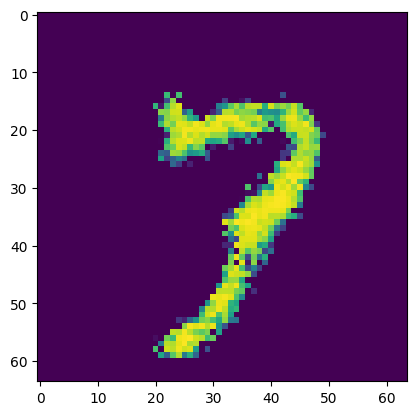

Epoch [18/50] Batch 500/938                   Loss D: -80826.4922, loss G: 38069.2930
tensor([2, 5, 2, 3, 4, 7, 8, 6, 0, 5, 5, 0, 4, 2, 9, 0, 9, 6, 8, 3, 7, 9, 3, 2,
        0, 0, 4, 3, 1, 2, 1, 0, 6, 3, 9, 1, 8, 9, 3, 5, 9, 8, 8, 5, 1, 1, 2, 8,
        8, 5, 8, 2, 6, 2, 7, 4, 4, 5, 2, 5, 4, 2, 1, 9], device='cuda:0')


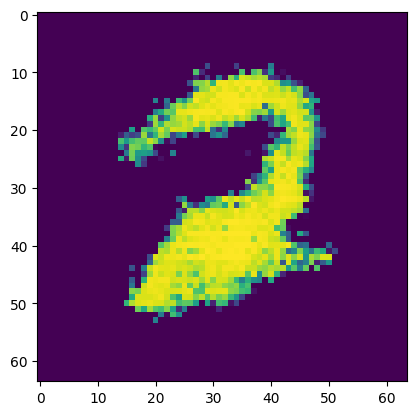

Epoch [18/50] Batch 600/938                   Loss D: -89761.5000, loss G: 39726.4688
tensor([3, 0, 4, 3, 4, 2, 0, 6, 1, 7, 8, 3, 3, 4, 5, 4, 4, 3, 1, 3, 3, 6, 1, 4,
        5, 5, 6, 3, 9, 4, 3, 5, 8, 2, 0, 2, 1, 2, 9, 5, 8, 3, 4, 7, 3, 7, 1, 1,
        3, 8, 3, 9, 9, 3, 1, 2, 5, 0, 3, 5, 2, 1, 5, 4], device='cuda:0')


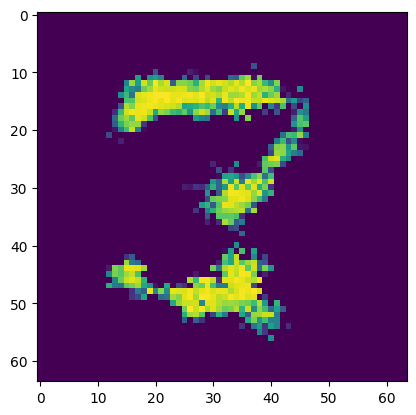

Epoch [18/50] Batch 700/938                   Loss D: -92150.8828, loss G: 40620.5781
tensor([0, 8, 6, 6, 3, 8, 1, 7, 2, 1, 7, 3, 9, 2, 0, 4, 7, 0, 6, 2, 1, 3, 4, 4,
        7, 9, 0, 0, 2, 1, 4, 0, 4, 6, 5, 5, 7, 8, 2, 0, 2, 0, 7, 5, 4, 9, 4, 3,
        0, 1, 3, 0, 4, 3, 0, 5, 2, 3, 7, 8, 0, 9, 1, 6], device='cuda:0')


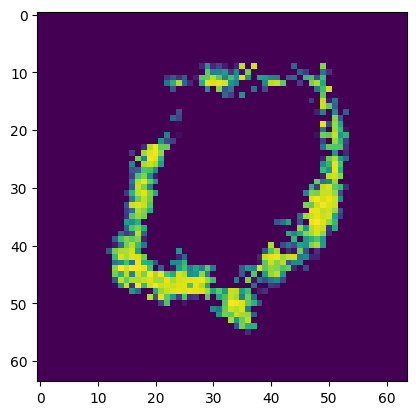

Epoch [18/50] Batch 800/938                   Loss D: -94056.7500, loss G: 41618.4336
tensor([4, 9, 7, 3, 9, 4, 6, 4, 1, 3, 0, 4, 0, 6, 6, 2, 2, 9, 8, 5, 6, 6, 2, 9,
        6, 8, 5, 7, 1, 4, 6, 9, 7, 0, 3, 8, 0, 8, 3, 1, 8, 4, 3, 0, 7, 7, 6, 4,
        6, 8, 9, 6, 6, 8, 5, 8, 8, 4, 7, 1, 8, 5, 9, 4], device='cuda:0')


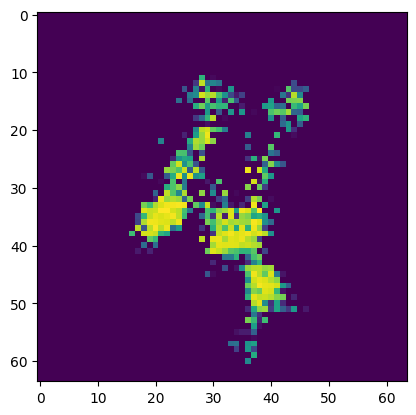

Epoch [18/50] Batch 900/938                   Loss D: -96042.8594, loss G: 42544.3164
tensor([3, 4, 3, 2, 4, 7, 5, 2, 3, 1, 8, 4, 3, 4, 6, 7, 1, 0, 9, 5, 0, 9, 0, 0,
        2, 9, 6, 1, 4, 9, 0, 8, 5, 7, 4, 9, 9, 5, 0, 0, 0, 1, 7, 4, 9, 9, 4, 2,
        7, 0, 7, 4, 9, 8, 5, 7, 1, 9, 7, 0, 4, 0, 8, 9], device='cuda:0')


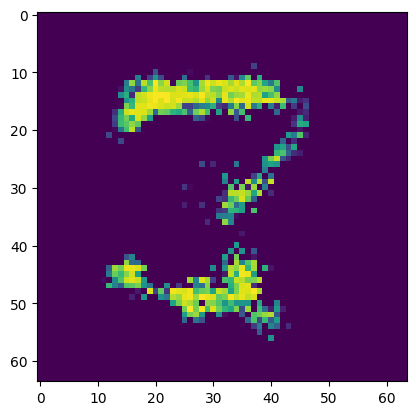

Epoch [19/50] Batch 100/938                   Loss D: -98593.3125, loss G: 43865.6953
tensor([4, 2, 6, 5, 2, 2, 2, 6, 9, 2, 1, 2, 4, 5, 1, 2, 1, 1, 0, 9, 8, 0, 2, 3,
        0, 0, 3, 1, 9, 2, 3, 7, 1, 0, 2, 8, 5, 4, 8, 4, 1, 4, 1, 0, 5, 9, 1, 2,
        6, 4, 6, 9, 3, 4, 2, 9, 7, 6, 1, 7, 3, 1, 8, 3], device='cuda:0')


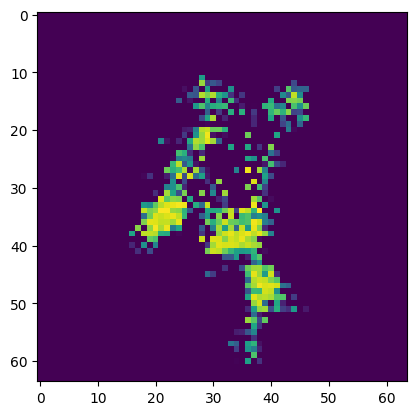

Epoch [19/50] Batch 200/938                   Loss D: -100401.4375, loss G: 44824.2031
tensor([8, 6, 0, 9, 8, 0, 4, 4, 8, 7, 3, 8, 1, 2, 1, 1, 1, 6, 0, 1, 8, 8, 3, 8,
        1, 4, 3, 7, 8, 3, 0, 1, 2, 3, 4, 7, 7, 0, 6, 5, 8, 5, 6, 9, 6, 1, 8, 5,
        2, 8, 7, 1, 7, 3, 5, 4, 0, 9, 6, 7, 6, 1, 8, 2], device='cuda:0')


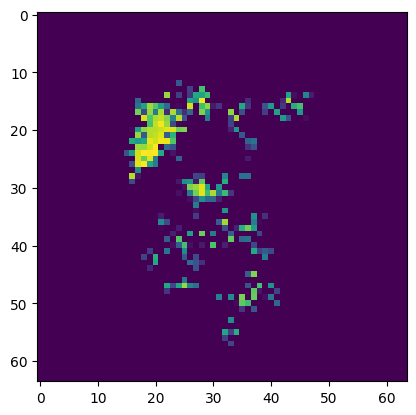

Epoch [19/50] Batch 300/938                   Loss D: -102205.0312, loss G: 45798.0469
tensor([4, 0, 9, 6, 6, 9, 4, 9, 4, 6, 6, 3, 2, 8, 1, 3, 8, 6, 9, 9, 3, 9, 1, 6,
        5, 1, 1, 3, 0, 2, 3, 3, 2, 8, 0, 6, 0, 2, 7, 4, 1, 4, 1, 1, 2, 4, 1, 4,
        1, 5, 1, 6, 6, 8, 5, 0, 9, 0, 2, 9, 9, 6, 8, 7], device='cuda:0')


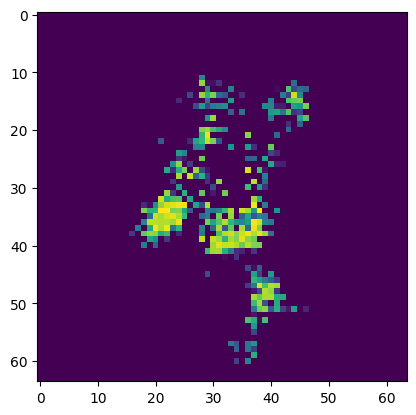

Epoch [19/50] Batch 400/938                   Loss D: -70612.1797, loss G: 19939.9961
tensor([4, 0, 2, 8, 4, 3, 5, 2, 2, 3, 3, 3, 6, 1, 4, 6, 2, 2, 7, 4, 0, 5, 1, 4,
        5, 6, 3, 4, 1, 7, 4, 4, 9, 0, 7, 3, 1, 6, 9, 1, 3, 4, 1, 2, 0, 1, 1, 5,
        5, 7, 6, 3, 1, 8, 9, 1, 2, 9, 8, 1, 8, 7, 0, 6], device='cuda:0')


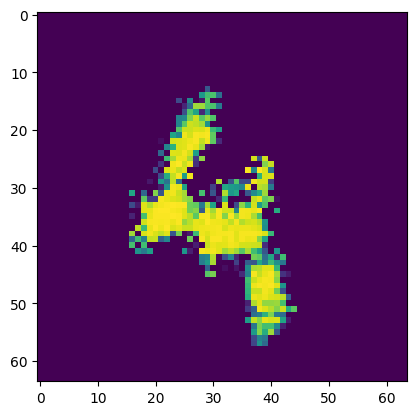

Epoch [19/50] Batch 500/938                   Loss D: -97817.0234, loss G: 46211.4180
tensor([7, 2, 6, 8, 6, 4, 5, 9, 9, 0, 3, 0, 6, 3, 3, 2, 6, 0, 2, 7, 5, 4, 2, 1,
        3, 4, 8, 5, 1, 0, 9, 7, 7, 6, 9, 5, 0, 4, 6, 1, 3, 4, 7, 7, 1, 1, 5, 5,
        0, 4, 3, 4, 2, 6, 3, 7, 9, 3, 9, 5, 4, 3, 3, 3], device='cuda:0')


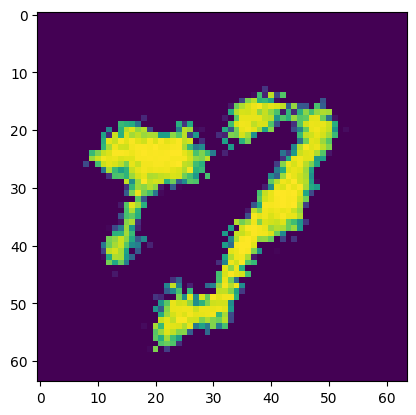

Epoch [19/50] Batch 600/938                   Loss D: -105883.3516, loss G: 47959.9492
tensor([3, 8, 5, 1, 4, 8, 7, 1, 2, 7, 7, 6, 4, 9, 1, 6, 1, 1, 3, 5, 6, 2, 8, 4,
        0, 6, 4, 5, 4, 7, 2, 8, 8, 5, 0, 6, 8, 2, 9, 9, 7, 2, 4, 8, 8, 5, 5, 1,
        9, 3, 9, 1, 3, 8, 2, 2, 8, 7, 8, 4, 6, 6, 2, 9], device='cuda:0')


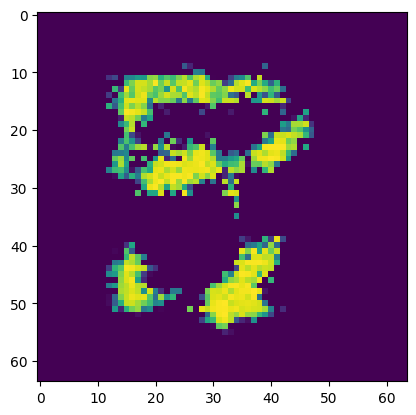

Epoch [19/50] Batch 700/938                   Loss D: 241.2888, loss G: 48488.5547
tensor([1, 3, 9, 8, 0, 1, 5, 3, 9, 6, 0, 1, 0, 1, 8, 7, 3, 2, 9, 5, 6, 1, 6, 4,
        6, 8, 3, 4, 4, 6, 9, 6, 4, 9, 6, 5, 0, 1, 4, 0, 1, 1, 9, 7, 6, 8, 9, 7,
        8, 4, 2, 4, 2, 1, 7, 5, 5, 2, 4, 7, 4, 9, 0, 5], device='cuda:0')


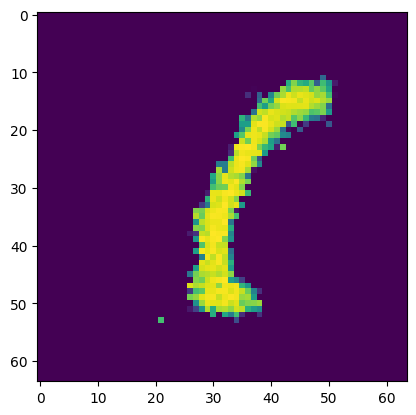

Epoch [19/50] Batch 800/938                   Loss D: -106211.8438, loss G: 48827.2188
tensor([7, 9, 1, 7, 9, 4, 6, 8, 0, 2, 5, 8, 6, 2, 6, 6, 6, 3, 2, 3, 7, 3, 5, 8,
        7, 6, 7, 5, 9, 9, 8, 2, 5, 4, 0, 1, 0, 5, 7, 1, 9, 1, 2, 6, 2, 4, 3, 9,
        7, 0, 5, 5, 8, 4, 9, 7, 4, 2, 4, 3, 0, 4, 4, 2], device='cuda:0')


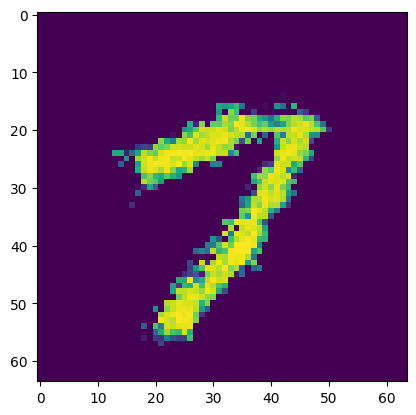

Epoch [19/50] Batch 900/938                   Loss D: -109169.3906, loss G: 49802.1953
tensor([5, 1, 9, 9, 9, 2, 8, 6, 2, 2, 4, 3, 5, 2, 0, 1, 6, 7, 3, 4, 1, 4, 0, 5,
        5, 3, 1, 9, 7, 7, 1, 7, 9, 3, 1, 8, 1, 1, 1, 0, 6, 6, 4, 6, 1, 8, 3, 6,
        7, 2, 6, 8, 7, 8, 3, 3, 8, 2, 8, 4, 2, 6, 6, 3], device='cuda:0')


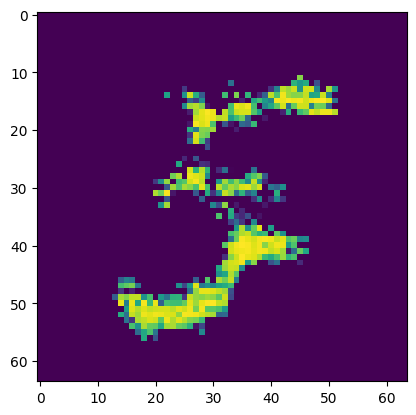

Epoch [20/50] Batch 100/938                   Loss D: -92337.6328, loss G: 44696.6406
tensor([5, 2, 7, 0, 1, 7, 0, 6, 8, 8, 7, 9, 2, 7, 5, 2, 0, 2, 8, 5, 9, 2, 1, 3,
        5, 3, 8, 7, 2, 3, 7, 8, 3, 1, 2, 7, 8, 3, 3, 1, 9, 2, 1, 1, 6, 2, 6, 9,
        2, 3, 6, 1, 9, 9, 7, 8, 1, 0, 7, 1, 1, 9, 5, 0], device='cuda:0')


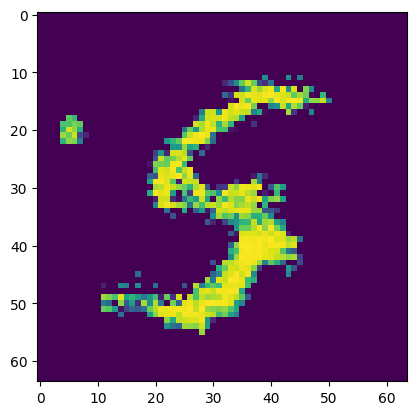

Epoch [20/50] Batch 200/938                   Loss D: -103370.6953, loss G: 48868.6250
tensor([2, 1, 0, 2, 3, 8, 5, 1, 0, 7, 2, 7, 5, 8, 6, 5, 1, 6, 1, 2, 9, 4, 1, 5,
        3, 8, 1, 9, 4, 4, 8, 7, 8, 4, 6, 0, 6, 1, 3, 4, 9, 0, 3, 9, 6, 4, 8, 7,
        9, 8, 0, 2, 1, 3, 6, 1, 0, 9, 3, 2, 6, 4, 1, 6], device='cuda:0')


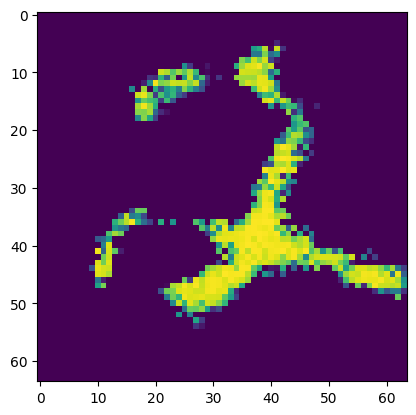

Epoch [20/50] Batch 300/938                   Loss D: -101611.3516, loss G: 49292.3438
tensor([7, 0, 2, 5, 9, 3, 2, 7, 2, 1, 8, 4, 9, 8, 4, 0, 2, 4, 1, 7, 1, 0, 4, 2,
        8, 6, 2, 4, 6, 1, 1, 3, 5, 5, 2, 7, 8, 0, 5, 1, 2, 3, 7, 1, 3, 7, 6, 2,
        4, 2, 4, 1, 2, 2, 8, 4, 4, 6, 4, 3, 4, 1, 1, 4], device='cuda:0')


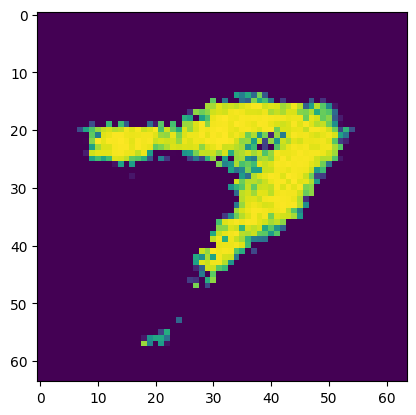

Epoch [20/50] Batch 400/938                   Loss D: -106044.0781, loss G: 50380.9531
tensor([9, 1, 0, 0, 6, 6, 5, 3, 1, 6, 1, 0, 9, 9, 6, 2, 0, 4, 7, 7, 8, 0, 7, 4,
        0, 3, 8, 2, 7, 9, 4, 5, 8, 1, 0, 9, 7, 2, 5, 6, 7, 7, 3, 1, 2, 2, 9, 8,
        4, 7, 2, 3, 4, 8, 7, 5, 8, 4, 5, 1, 7, 9, 6, 5], device='cuda:0')


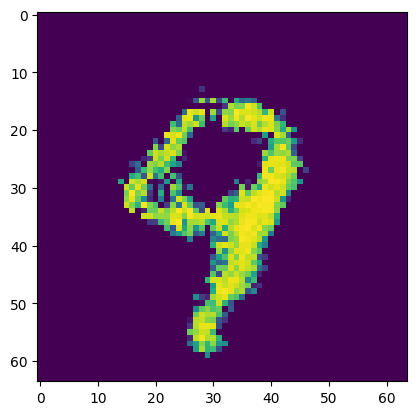

Epoch [20/50] Batch 500/938                   Loss D: -112012.5703, loss G: 52363.6719
tensor([8, 5, 9, 8, 2, 0, 4, 6, 5, 7, 5, 4, 6, 6, 2, 2, 0, 1, 1, 7, 7, 6, 3, 6,
        1, 5, 4, 5, 2, 0, 1, 4, 4, 6, 0, 7, 9, 9, 9, 7, 2, 4, 3, 0, 5, 3, 3, 0,
        8, 3, 0, 9, 4, 5, 6, 9, 3, 9, 6, 7, 6, 1, 2, 8], device='cuda:0')


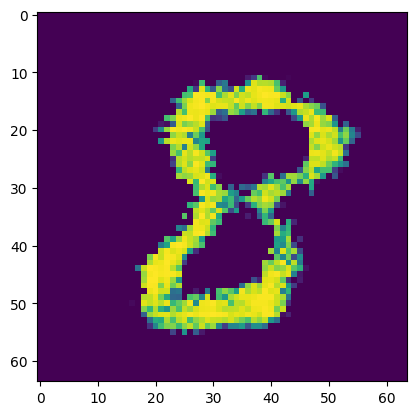

Epoch [20/50] Batch 600/938                   Loss D: -114610.4688, loss G: 53171.8906
tensor([5, 8, 2, 5, 0, 1, 1, 9, 5, 7, 5, 7, 3, 4, 0, 2, 4, 0, 2, 8, 8, 0, 2, 4,
        8, 6, 3, 3, 3, 3, 9, 1, 1, 2, 2, 0, 4, 7, 1, 0, 3, 8, 3, 3, 8, 8, 0, 3,
        1, 9, 6, 9, 8, 8, 4, 2, 5, 7, 8, 2, 3, 4, 4, 4], device='cuda:0')


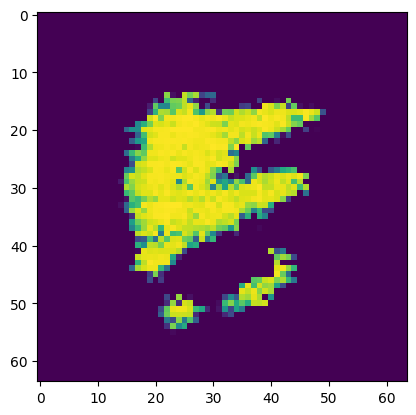

Epoch [20/50] Batch 700/938                   Loss D: -116445.1484, loss G: 54104.8906
tensor([8, 5, 4, 9, 1, 5, 4, 8, 7, 8, 3, 1, 6, 4, 9, 8, 1, 7, 8, 0, 2, 9, 4, 6,
        4, 0, 5, 4, 3, 2, 9, 0, 9, 7, 7, 1, 6, 4, 3, 6, 2, 0, 4, 0, 0, 3, 5, 7,
        8, 1, 9, 2, 6, 5, 9, 1, 3, 2, 2, 4, 7, 6, 4, 1], device='cuda:0')


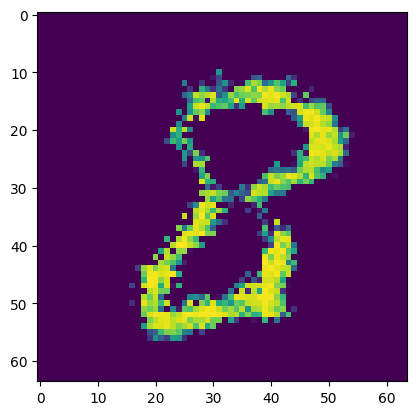

Epoch [20/50] Batch 800/938                   Loss D: -116060.5859, loss G: 54122.5547
tensor([9, 1, 8, 4, 8, 0, 9, 3, 3, 4, 2, 5, 0, 9, 7, 7, 2, 7, 7, 0, 2, 7, 2, 1,
        4, 3, 8, 9, 0, 6, 1, 9, 5, 0, 8, 1, 1, 0, 6, 0, 2, 3, 0, 9, 4, 2, 2, 4,
        8, 2, 2, 3, 0, 6, 5, 2, 2, 6, 1, 2, 0, 1, 8, 9], device='cuda:0')


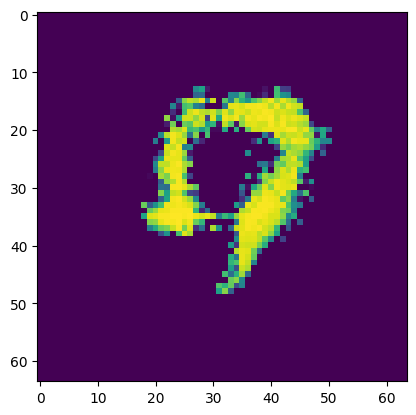

Epoch [20/50] Batch 900/938                   Loss D: -115247.5000, loss G: 53681.2031
tensor([6, 2, 8, 0, 7, 7, 8, 7, 1, 9, 7, 3, 8, 0, 9, 7, 9, 4, 2, 1, 3, 9, 7, 4,
        9, 4, 4, 3, 0, 4, 7, 5, 6, 0, 7, 7, 9, 5, 6, 8, 3, 2, 7, 5, 7, 2, 1, 3,
        5, 4, 8, 4, 9, 7, 7, 0, 9, 5, 2, 6, 7, 5, 2, 8], device='cuda:0')


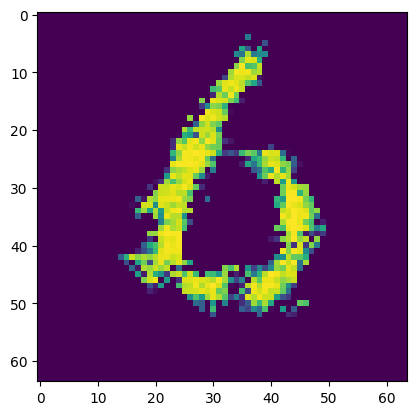

Epoch [21/50] Batch 100/938                   Loss D: -112879.1953, loss G: 54408.1953
tensor([4, 8, 5, 6, 1, 3, 9, 4, 7, 3, 7, 5, 8, 3, 6, 8, 7, 7, 3, 6, 8, 3, 0, 9,
        9, 9, 8, 9, 0, 6, 0, 8, 6, 4, 3, 0, 1, 6, 0, 7, 8, 5, 6, 8, 3, 1, 5, 5,
        7, 7, 9, 2, 2, 6, 5, 8, 0, 3, 6, 4, 4, 4, 1, 3], device='cuda:0')


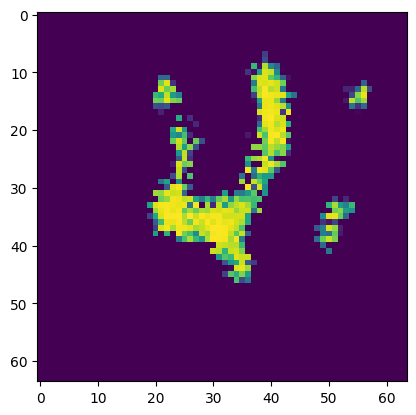

Epoch [21/50] Batch 200/938                   Loss D: -114848.3047, loss G: 54395.5234
tensor([2, 3, 3, 1, 2, 4, 0, 9, 0, 6, 2, 0, 6, 5, 5, 8, 0, 5, 0, 1, 2, 6, 5, 9,
        9, 0, 9, 9, 1, 9, 0, 3, 7, 0, 7, 6, 4, 6, 2, 6, 1, 2, 9, 9, 6, 7, 3, 9,
        6, 1, 2, 2, 6, 8, 3, 2, 5, 5, 6, 4, 7, 0, 4, 9], device='cuda:0')


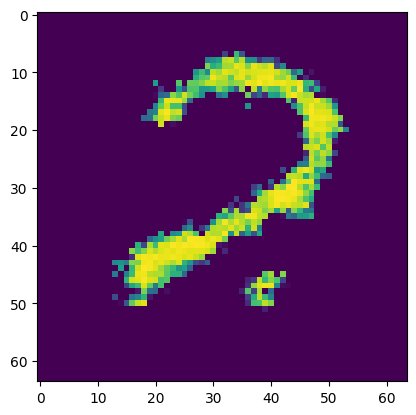

Epoch [21/50] Batch 300/938                   Loss D: -112651.8125, loss G: 55433.9375
tensor([8, 5, 7, 1, 8, 3, 4, 1, 9, 6, 4, 4, 7, 4, 8, 2, 4, 6, 8, 8, 5, 5, 0, 5,
        8, 2, 3, 7, 8, 2, 1, 7, 7, 7, 2, 1, 0, 4, 2, 2, 4, 4, 0, 1, 6, 0, 1, 3,
        1, 0, 4, 4, 6, 4, 2, 0, 1, 2, 3, 5, 7, 4, 0, 4], device='cuda:0')


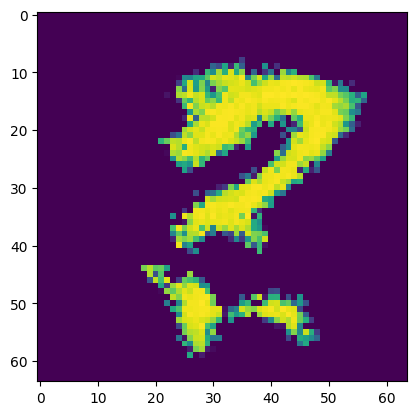

Epoch [21/50] Batch 400/938                   Loss D: -120485.1953, loss G: 56790.2734
tensor([3, 5, 8, 1, 2, 4, 3, 7, 7, 4, 3, 9, 1, 0, 2, 4, 1, 8, 4, 7, 1, 9, 2, 6,
        1, 9, 2, 0, 9, 0, 0, 2, 2, 9, 6, 5, 5, 3, 7, 9, 8, 7, 0, 2, 6, 0, 1, 0,
        1, 4, 2, 7, 7, 5, 3, 5, 7, 7, 3, 2, 7, 6, 2, 5], device='cuda:0')


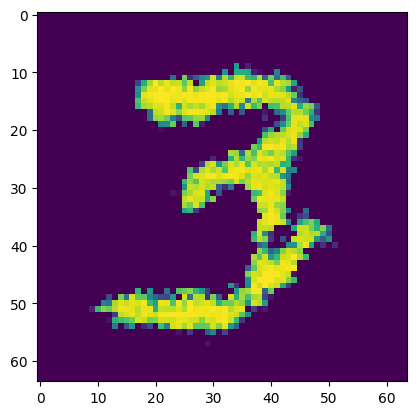

Epoch [21/50] Batch 500/938                   Loss D: -125604.3906, loss G: 58544.4922
tensor([3, 2, 5, 6, 0, 2, 9, 9, 7, 0, 2, 1, 7, 7, 2, 8, 0, 8, 7, 9, 3, 1, 0, 4,
        4, 7, 4, 1, 7, 9, 9, 6, 3, 3, 6, 3, 8, 1, 4, 2, 7, 9, 5, 7, 1, 3, 8, 0,
        7, 8, 3, 9, 8, 6, 5, 3, 0, 2, 9, 2, 3, 8, 4, 5], device='cuda:0')


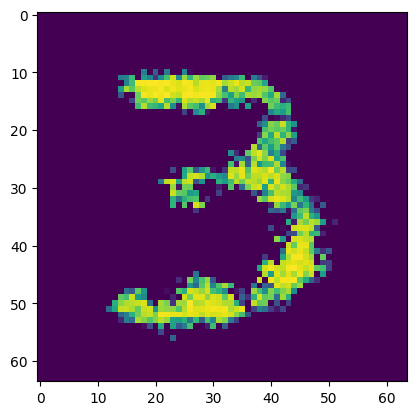

Epoch [21/50] Batch 600/938                   Loss D: -118740.7188, loss G: 57154.8672
tensor([8, 8, 5, 8, 5, 8, 8, 0, 9, 5, 2, 3, 0, 4, 7, 9, 0, 0, 4, 0, 3, 8, 0, 7,
        7, 6, 9, 5, 4, 1, 4, 1, 1, 4, 4, 8, 0, 1, 8, 1, 4, 8, 8, 8, 9, 3, 9, 3,
        9, 7, 5, 3, 3, 8, 8, 9, 7, 3, 5, 9, 0, 6, 5, 3], device='cuda:0')


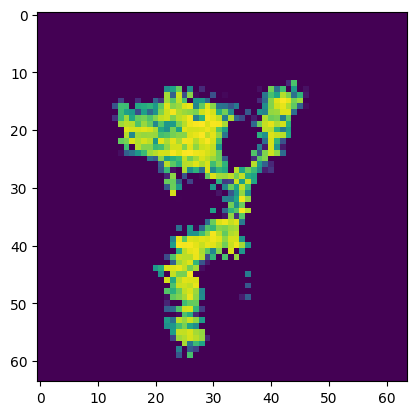

Epoch [21/50] Batch 700/938                   Loss D: -128503.8125, loss G: 59675.3164
tensor([0, 4, 5, 2, 8, 9, 6, 0, 8, 2, 8, 0, 1, 0, 8, 0, 2, 7, 1, 6, 5, 9, 3, 3,
        6, 6, 6, 7, 8, 1, 0, 0, 5, 0, 2, 8, 3, 5, 0, 9, 5, 6, 3, 5, 4, 7, 3, 9,
        5, 4, 2, 8, 5, 8, 1, 1, 6, 7, 3, 6, 2, 3, 4, 7], device='cuda:0')


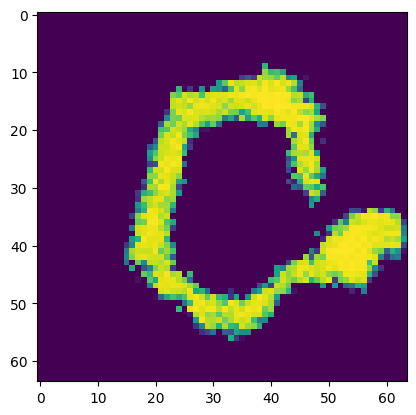

Epoch [21/50] Batch 800/938                   Loss D: -126571.7188, loss G: 58896.3047
tensor([9, 1, 7, 8, 5, 1, 2, 5, 6, 3, 0, 5, 3, 2, 0, 1, 4, 5, 7, 7, 4, 2, 8, 0,
        8, 7, 6, 0, 4, 3, 5, 5, 4, 6, 2, 6, 0, 8, 5, 0, 4, 8, 3, 6, 4, 3, 1, 3,
        1, 7, 5, 0, 0, 6, 9, 3, 0, 5, 1, 5, 0, 3, 7, 7], device='cuda:0')


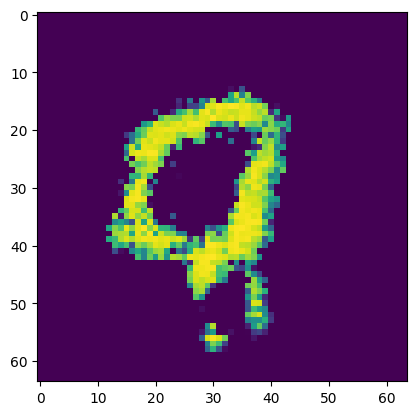

Epoch [21/50] Batch 900/938                   Loss D: -132510.1719, loss G: 61038.0469
tensor([0, 0, 4, 6, 0, 1, 8, 9, 2, 3, 5, 5, 8, 7, 5, 4, 0, 6, 0, 6, 6, 8, 8, 7,
        8, 1, 1, 4, 1, 0, 1, 3, 0, 3, 2, 5, 1, 5, 8, 5, 6, 6, 2, 8, 8, 8, 4, 4,
        0, 9, 7, 9, 6, 0, 7, 3, 5, 8, 1, 8, 2, 6, 7, 4], device='cuda:0')


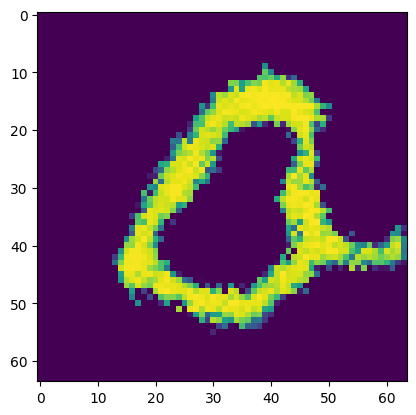

Epoch [22/50] Batch 100/938                   Loss D: -130543.2344, loss G: 61186.2422
tensor([7, 9, 8, 0, 3, 7, 8, 7, 0, 3, 7, 2, 6, 8, 1, 5, 0, 7, 6, 7, 1, 4, 7, 2,
        9, 4, 1, 1, 1, 0, 3, 0, 1, 7, 8, 8, 4, 1, 3, 2, 4, 6, 1, 1, 3, 9, 3, 0,
        2, 5, 3, 1, 1, 3, 3, 5, 8, 0, 2, 9, 0, 4, 6, 1], device='cuda:0')


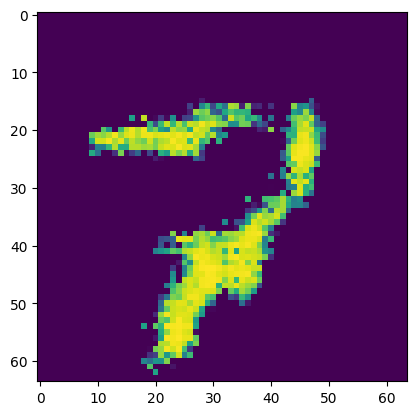

Epoch [22/50] Batch 200/938                   Loss D: -136989.3281, loss G: 63149.3281
tensor([8, 3, 8, 5, 2, 3, 1, 5, 8, 0, 9, 3, 7, 7, 8, 0, 5, 3, 0, 6, 5, 8, 7, 1,
        2, 5, 0, 9, 2, 7, 8, 4, 1, 5, 8, 5, 1, 0, 7, 2, 4, 5, 4, 7, 3, 4, 5, 7,
        1, 4, 8, 8, 5, 4, 7, 6, 0, 3, 4, 3, 3, 6, 2, 8], device='cuda:0')


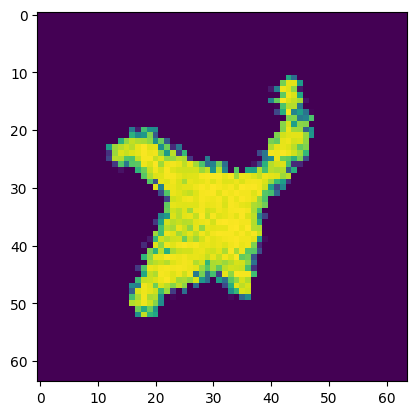

Epoch [22/50] Batch 300/938                   Loss D: -137583.1562, loss G: 63457.2305
tensor([2, 5, 7, 4, 9, 4, 7, 6, 9, 5, 5, 6, 9, 1, 3, 7, 0, 8, 2, 5, 1, 6, 9, 5,
        6, 3, 1, 1, 4, 3, 2, 4, 4, 8, 5, 1, 6, 8, 9, 8, 7, 4, 3, 5, 6, 4, 3, 0,
        3, 3, 1, 3, 0, 3, 9, 9, 1, 2, 6, 9, 5, 5, 7, 9], device='cuda:0')


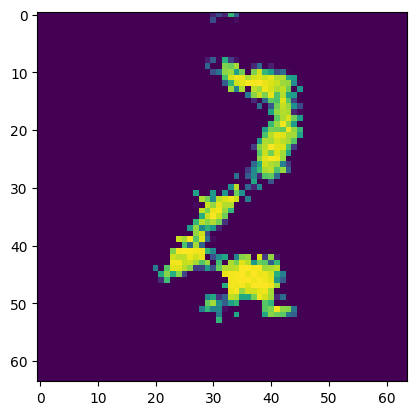

Epoch [22/50] Batch 400/938                   Loss D: -140095.7188, loss G: 64337.0039
tensor([4, 0, 6, 1, 5, 2, 5, 8, 3, 8, 2, 6, 5, 8, 9, 3, 2, 4, 4, 8, 5, 3, 9, 0,
        8, 7, 8, 5, 3, 4, 0, 8, 3, 9, 0, 6, 2, 8, 9, 7, 8, 8, 5, 5, 2, 5, 8, 9,
        2, 2, 3, 3, 3, 3, 7, 7, 0, 7, 8, 7, 3, 9, 8, 1], device='cuda:0')


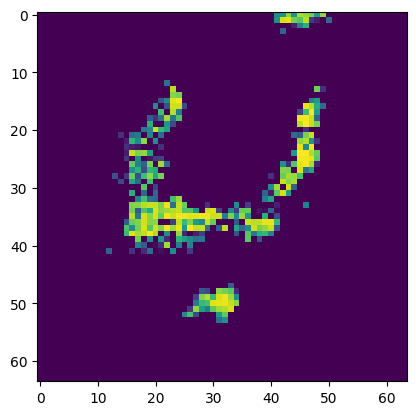

Epoch [22/50] Batch 500/938                   Loss D: -127114.8203, loss G: 61606.7695
tensor([9, 7, 8, 4, 5, 2, 4, 3, 0, 7, 9, 0, 5, 0, 8, 1, 6, 7, 7, 2, 5, 1, 3, 0,
        3, 0, 8, 5, 9, 4, 6, 7, 8, 0, 8, 5, 4, 2, 4, 7, 1, 1, 2, 7, 3, 6, 7, 5,
        9, 2, 8, 3, 1, 1, 4, 0, 4, 1, 7, 7, 8, 9, 0, 5], device='cuda:0')


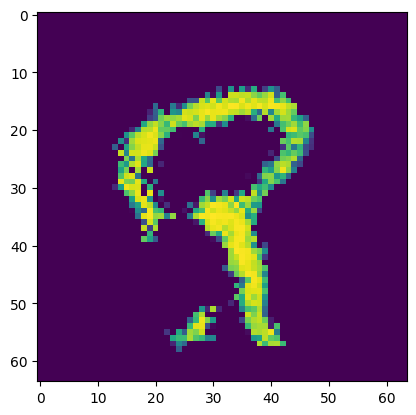

Epoch [22/50] Batch 600/938                   Loss D: -118403.3516, loss G: 61724.0391
tensor([4, 9, 7, 2, 3, 8, 7, 5, 8, 4, 2, 9, 9, 4, 0, 3, 6, 5, 0, 3, 3, 4, 8, 3,
        4, 3, 5, 7, 4, 1, 3, 4, 1, 1, 0, 0, 7, 3, 9, 5, 7, 1, 5, 7, 6, 3, 6, 1,
        5, 7, 6, 6, 3, 8, 3, 9, 1, 5, 9, 9, 3, 3, 5, 3], device='cuda:0')


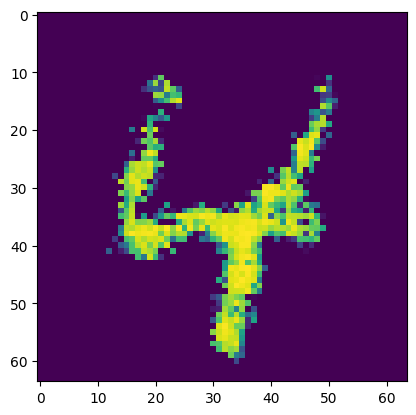

Epoch [22/50] Batch 700/938                   Loss D: -141572.3594, loss G: 65859.7656
tensor([2, 2, 1, 4, 5, 5, 4, 7, 8, 8, 7, 0, 7, 6, 6, 2, 5, 2, 1, 8, 3, 0, 1, 6,
        6, 2, 0, 7, 0, 1, 4, 7, 4, 2, 7, 7, 0, 0, 8, 7, 0, 3, 8, 1, 2, 1, 9, 6,
        2, 5, 1, 6, 7, 1, 8, 0, 0, 2, 0, 6, 7, 0, 4, 3], device='cuda:0')


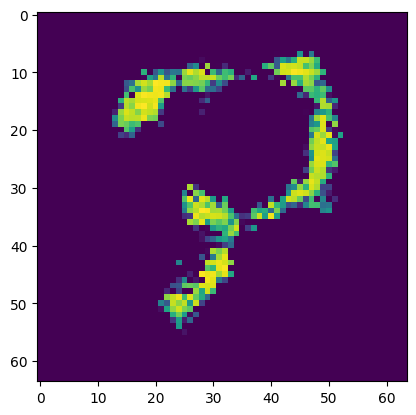

Epoch [22/50] Batch 800/938                   Loss D: -134821.0781, loss G: 63460.3594
tensor([5, 6, 0, 1, 5, 5, 8, 1, 3, 2, 3, 6, 0, 2, 6, 2, 8, 7, 2, 8, 6, 8, 1, 2,
        7, 8, 8, 2, 7, 7, 0, 4, 2, 8, 2, 3, 9, 1, 3, 9, 8, 5, 7, 4, 8, 3, 7, 6,
        2, 4, 6, 3, 3, 8, 8, 9, 9, 5, 1, 5, 1, 6, 4, 9], device='cuda:0')


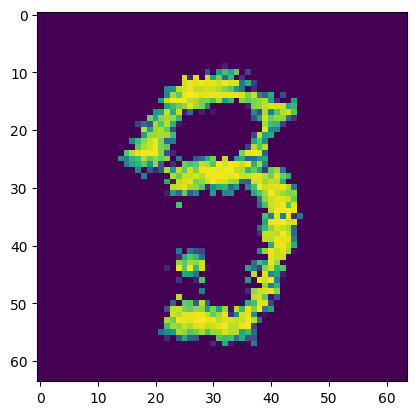

Epoch [22/50] Batch 900/938                   Loss D: -140082.1719, loss G: 65863.8438
tensor([7, 5, 7, 3, 7, 9, 0, 5, 1, 2, 5, 0, 9, 0, 0, 5, 8, 0, 4, 3, 3, 1, 7, 1,
        6, 9, 3, 0, 7, 9, 1, 5, 8, 1, 8, 7, 8, 3, 4, 6, 3, 2, 6, 5, 7, 4, 1, 3,
        8, 4, 6, 1, 6, 2, 4, 2, 0, 8, 7, 0, 5, 3, 8, 6], device='cuda:0')


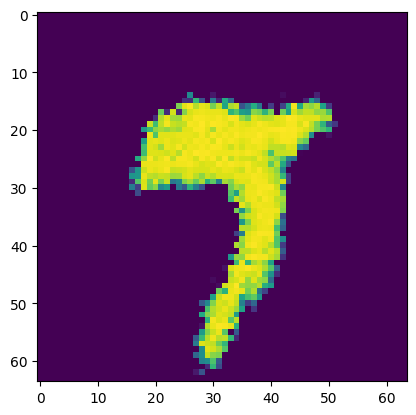

Epoch [23/50] Batch 100/938                   Loss D: -144164.2812, loss G: 67498.0078
tensor([3, 2, 6, 6, 8, 1, 3, 3, 6, 7, 7, 5, 3, 7, 8, 1, 8, 5, 6, 7, 0, 7, 8, 0,
        5, 9, 2, 5, 0, 6, 9, 7, 8, 4, 7, 7, 9, 5, 1, 3, 3, 7, 3, 3, 7, 1, 8, 2,
        7, 6, 2, 0, 2, 8, 5, 0, 0, 8, 0, 4, 3, 9, 0, 4], device='cuda:0')


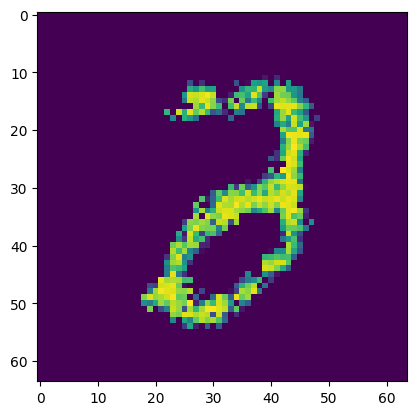

Epoch [23/50] Batch 200/938                   Loss D: -143620.5156, loss G: 67412.2188
tensor([8, 3, 4, 5, 0, 4, 2, 9, 3, 8, 3, 9, 9, 0, 9, 4, 6, 7, 9, 3, 7, 6, 7, 1,
        2, 2, 2, 0, 1, 7, 8, 1, 5, 7, 8, 0, 9, 7, 2, 3, 5, 5, 7, 7, 4, 5, 7, 3,
        1, 3, 4, 0, 1, 8, 3, 7, 9, 1, 8, 2, 5, 1, 3, 2], device='cuda:0')


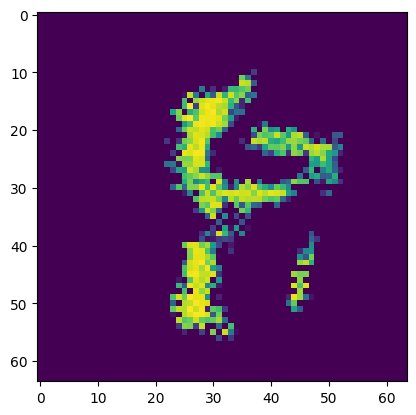

Epoch [23/50] Batch 300/938                   Loss D: -149758.6875, loss G: 69565.9844
tensor([5, 1, 8, 7, 7, 0, 4, 3, 0, 8, 8, 9, 7, 2, 1, 5, 0, 0, 9, 7, 8, 8, 3, 0,
        3, 7, 3, 9, 6, 7, 4, 5, 8, 3, 6, 1, 4, 1, 8, 2, 6, 9, 8, 6, 2, 1, 9, 6,
        1, 1, 3, 8, 2, 6, 8, 0, 8, 0, 2, 5, 4, 4, 1, 6], device='cuda:0')


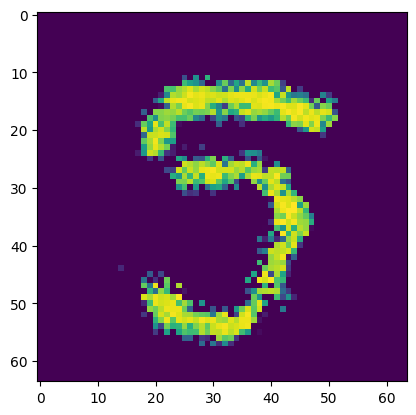

Epoch [23/50] Batch 400/938                   Loss D: -215.2606, loss G: 70980.6250
tensor([4, 6, 4, 2, 1, 9, 6, 7, 5, 6, 7, 6, 0, 5, 8, 1, 2, 3, 0, 0, 2, 1, 1, 1,
        2, 9, 8, 9, 3, 0, 5, 2, 6, 0, 2, 1, 0, 1, 2, 7, 6, 0, 1, 4, 2, 2, 6, 4,
        6, 1, 3, 1, 1, 8, 0, 5, 0, 0, 3, 6, 4, 5, 6, 7], device='cuda:0')


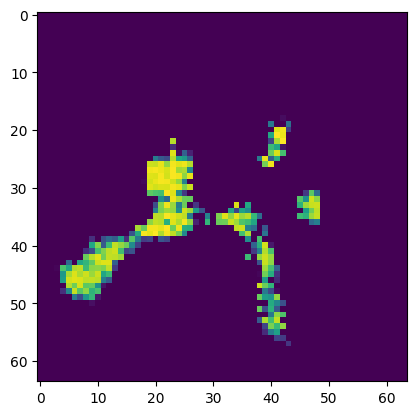

Epoch [23/50] Batch 500/938                   Loss D: -7948.8066, loss G: 70594.3281
tensor([9, 9, 5, 2, 3, 1, 9, 2, 5, 0, 3, 3, 8, 8, 2, 1, 6, 3, 1, 7, 6, 8, 3, 5,
        6, 4, 2, 3, 9, 2, 2, 2, 5, 0, 7, 5, 9, 4, 2, 5, 5, 7, 0, 3, 1, 4, 0, 0,
        7, 1, 8, 0, 6, 8, 1, 9, 2, 7, 6, 0, 1, 7, 7, 8], device='cuda:0')


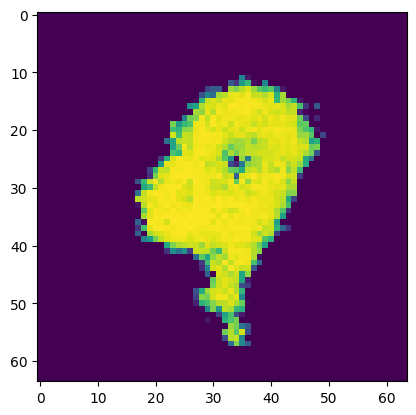

Epoch [23/50] Batch 600/938                   Loss D: -152367.2344, loss G: 71764.2578
tensor([2, 0, 0, 9, 1, 1, 8, 7, 2, 3, 3, 9, 6, 3, 8, 7, 9, 9, 2, 6, 3, 4, 9, 7,
        3, 6, 8, 7, 2, 0, 2, 1, 9, 9, 8, 5, 6, 7, 7, 7, 1, 3, 4, 1, 9, 2, 7, 4,
        8, 4, 5, 1, 3, 2, 3, 9, 5, 6, 7, 3, 9, 0, 3, 8], device='cuda:0')


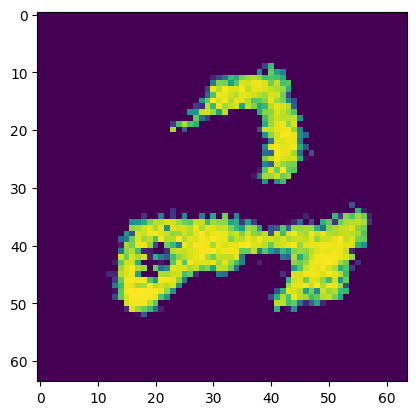

Epoch [23/50] Batch 700/938                   Loss D: -152108.8438, loss G: 72137.3047
tensor([6, 7, 6, 0, 4, 8, 3, 3, 7, 7, 1, 3, 5, 6, 6, 5, 5, 4, 0, 9, 6, 8, 1, 2,
        0, 5, 3, 2, 5, 4, 9, 7, 7, 1, 5, 8, 3, 3, 1, 6, 1, 8, 2, 0, 7, 4, 7, 9,
        8, 7, 8, 0, 7, 9, 2, 2, 6, 8, 1, 1, 7, 5, 0, 0], device='cuda:0')


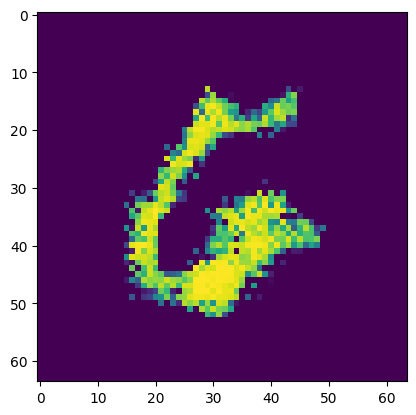

Epoch [23/50] Batch 800/938                   Loss D: -153734.2500, loss G: 72552.8359
tensor([1, 7, 6, 9, 8, 4, 8, 9, 9, 5, 5, 5, 3, 6, 5, 7, 6, 9, 1, 9, 7, 3, 5, 8,
        8, 7, 0, 8, 1, 6, 1, 8, 3, 9, 1, 0, 9, 6, 8, 8, 6, 7, 9, 3, 4, 1, 7, 9,
        7, 8, 3, 5, 5, 6, 5, 9, 2, 7, 2, 7, 3, 4, 1, 9], device='cuda:0')


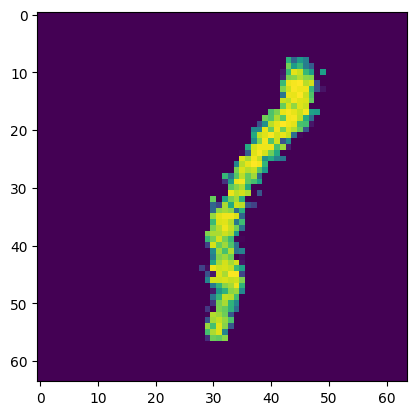

Epoch [23/50] Batch 900/938                   Loss D: 321.9707, loss G: 74580.8594
tensor([0, 9, 8, 6, 1, 6, 1, 9, 6, 1, 2, 2, 4, 4, 2, 9, 7, 3, 1, 1, 0, 1, 3, 7,
        9, 7, 2, 5, 7, 0, 6, 0, 4, 8, 1, 1, 9, 3, 8, 1, 6, 7, 5, 8, 3, 3, 3, 0,
        8, 5, 5, 9, 5, 5, 1, 9, 7, 9, 0, 1, 4, 8, 0, 6], device='cuda:0')


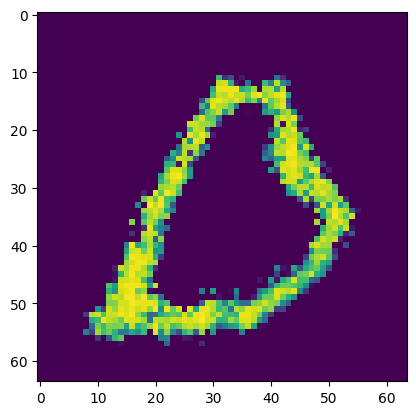

Epoch [24/50] Batch 100/938                   Loss D: -326.6626, loss G: 74899.7734
tensor([3, 0, 3, 8, 4, 4, 4, 1, 3, 2, 8, 6, 2, 7, 8, 3, 3, 3, 8, 2, 7, 9, 9, 3,
        5, 6, 0, 0, 9, 6, 5, 2, 9, 0, 1, 0, 0, 0, 1, 1, 8, 0, 9, 0, 0, 2, 2, 9,
        5, 9, 6, 3, 0, 8, 5, 1, 6, 5, 8, 6, 5, 0, 1, 5], device='cuda:0')


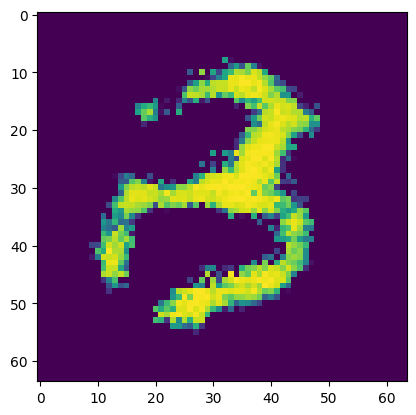

Epoch [24/50] Batch 200/938                   Loss D: -144736.3906, loss G: 72719.3594
tensor([9, 6, 0, 3, 5, 8, 4, 6, 1, 6, 4, 3, 6, 8, 7, 8, 6, 1, 2, 8, 9, 1, 1, 3,
        6, 6, 0, 7, 8, 3, 0, 0, 7, 0, 7, 6, 5, 3, 3, 8, 3, 6, 9, 2, 5, 3, 5, 4,
        8, 0, 9, 4, 1, 2, 0, 9, 3, 5, 2, 9, 1, 6, 9, 4], device='cuda:0')


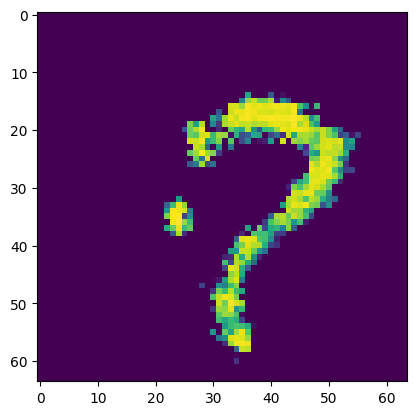

Epoch [24/50] Batch 300/938                   Loss D: -163146.4219, loss G: 76510.7812
tensor([6, 5, 9, 8, 6, 6, 9, 8, 4, 4, 5, 5, 5, 3, 1, 5, 9, 8, 8, 8, 0, 0, 9, 1,
        6, 1, 0, 1, 1, 4, 8, 8, 7, 5, 7, 5, 4, 5, 8, 1, 1, 6, 5, 6, 9, 9, 1, 2,
        4, 7, 4, 0, 6, 7, 6, 5, 2, 5, 1, 6, 6, 8, 8, 7], device='cuda:0')


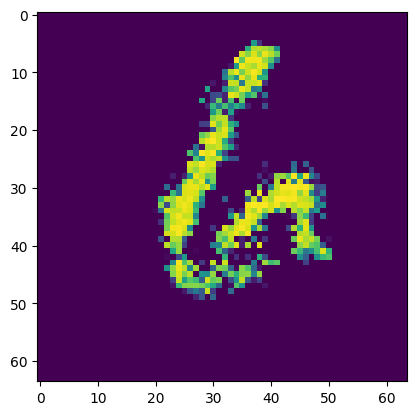

Epoch [24/50] Batch 400/938                   Loss D: -158147.6250, loss G: 74935.9141
tensor([2, 3, 1, 0, 0, 1, 5, 7, 1, 7, 9, 2, 6, 6, 4, 6, 8, 1, 9, 4, 0, 6, 7, 1,
        3, 8, 5, 0, 9, 1, 5, 6, 5, 7, 1, 7, 3, 3, 6, 8, 5, 0, 7, 3, 4, 2, 5, 6,
        5, 1, 7, 0, 4, 6, 8, 2, 3, 3, 1, 4, 9, 3, 6, 8], device='cuda:0')


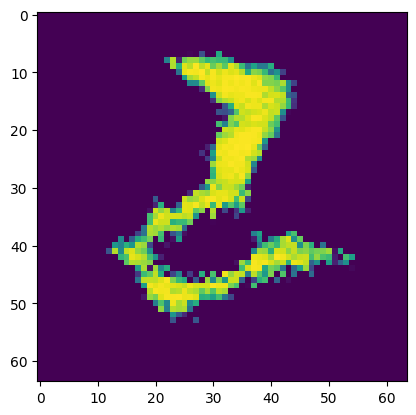

Epoch [24/50] Batch 500/938                   Loss D: -151363.2969, loss G: 75112.7031
tensor([4, 7, 1, 5, 8, 8, 4, 8, 4, 8, 0, 8, 7, 0, 7, 5, 0, 3, 1, 3, 5, 3, 2, 4,
        3, 1, 6, 9, 4, 7, 4, 9, 6, 2, 6, 1, 6, 0, 7, 7, 8, 5, 5, 7, 3, 8, 2, 6,
        9, 8, 3, 2, 7, 0, 7, 9, 5, 5, 9, 3, 1, 9, 8, 6], device='cuda:0')


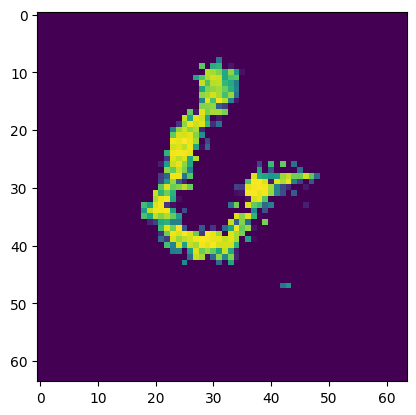

Epoch [24/50] Batch 600/938                   Loss D: -173795.1562, loss G: 79736.8984
tensor([2, 6, 6, 0, 3, 5, 5, 5, 5, 7, 5, 3, 7, 3, 0, 0, 3, 7, 0, 4, 7, 7, 3, 0,
        9, 0, 4, 9, 6, 9, 7, 4, 8, 9, 4, 5, 6, 6, 8, 8, 4, 9, 6, 9, 7, 1, 0, 6,
        7, 8, 0, 5, 3, 6, 6, 9, 7, 1, 5, 4, 5, 6, 1, 2], device='cuda:0')


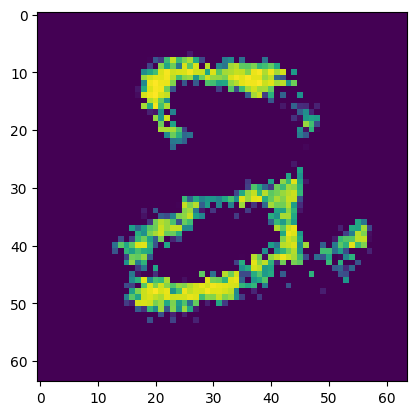

Epoch [24/50] Batch 700/938                   Loss D: -178199.8125, loss G: 81185.8594
tensor([2, 1, 0, 7, 0, 9, 5, 9, 6, 4, 0, 1, 0, 4, 4, 0, 3, 6, 3, 3, 4, 7, 3, 6,
        4, 8, 2, 3, 1, 6, 4, 6, 9, 4, 6, 7, 2, 0, 4, 1, 7, 0, 5, 1, 5, 1, 9, 4,
        4, 4, 9, 3, 5, 2, 1, 6, 6, 8, 5, 2, 9, 9, 7, 3], device='cuda:0')


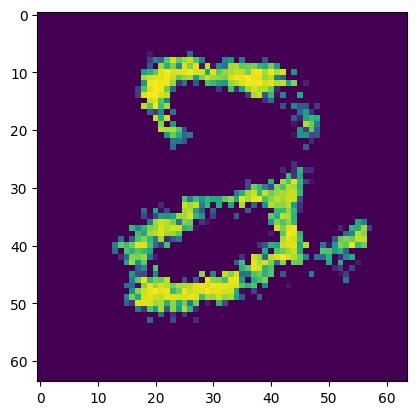

Epoch [24/50] Batch 800/938                   Loss D: -153501.1094, loss G: 79209.9297
tensor([0, 4, 4, 2, 1, 5, 2, 1, 5, 5, 0, 7, 6, 4, 5, 4, 2, 2, 3, 3, 0, 6, 2, 4,
        9, 7, 5, 1, 9, 7, 9, 7, 4, 2, 3, 9, 1, 8, 5, 8, 2, 6, 4, 4, 0, 0, 1, 8,
        0, 7, 8, 0, 9, 6, 9, 7, 5, 9, 0, 2, 0, 8, 4, 2], device='cuda:0')


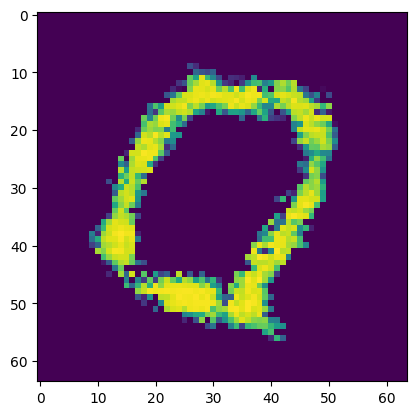

Epoch [24/50] Batch 900/938                   Loss D: -171601.1094, loss G: 82055.3203
tensor([8, 8, 0, 3, 4, 9, 4, 0, 5, 9, 8, 8, 0, 9, 7, 3, 1, 6, 4, 8, 1, 5, 5, 0,
        6, 7, 1, 6, 1, 1, 6, 9, 5, 8, 6, 7, 7, 8, 1, 8, 1, 1, 2, 7, 2, 0, 7, 0,
        4, 6, 0, 8, 4, 4, 3, 5, 4, 9, 1, 5, 5, 7, 3, 1], device='cuda:0')


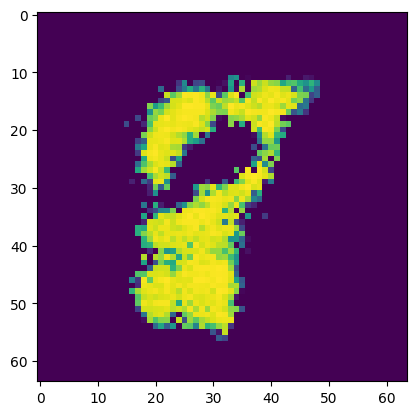

Epoch [25/50] Batch 100/938                   Loss D: -166884.4531, loss G: 82139.8203
tensor([8, 3, 6, 7, 0, 0, 2, 4, 0, 3, 0, 0, 5, 9, 8, 6, 7, 8, 2, 4, 8, 2, 7, 4,
        0, 2, 3, 0, 9, 2, 8, 0, 5, 0, 1, 4, 5, 8, 7, 8, 2, 6, 5, 7, 8, 8, 3, 7,
        5, 9, 9, 5, 0, 4, 0, 1, 4, 7, 6, 2, 7, 6, 4, 6], device='cuda:0')


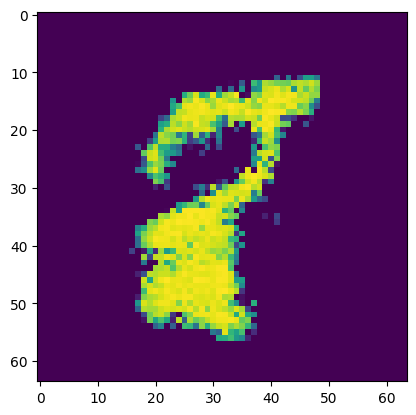

Epoch [25/50] Batch 200/938                   Loss D: -171083.8594, loss G: 81561.5859
tensor([7, 0, 6, 8, 7, 3, 6, 3, 3, 6, 6, 9, 3, 7, 7, 4, 2, 3, 5, 8, 3, 4, 7, 1,
        0, 1, 2, 6, 2, 2, 9, 2, 7, 5, 7, 3, 8, 1, 4, 3, 7, 0, 0, 0, 2, 2, 8, 1,
        4, 6, 2, 2, 6, 4, 1, 8, 6, 7, 7, 3, 1, 1, 5, 5], device='cuda:0')


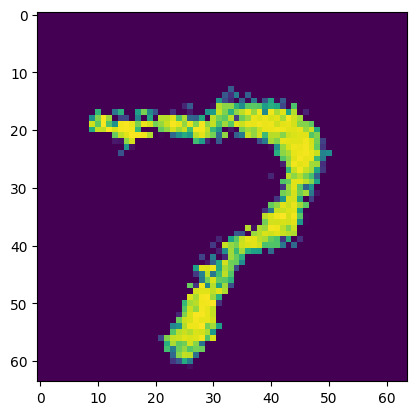

Epoch [25/50] Batch 300/938                   Loss D: -180996.0625, loss G: 84555.4766
tensor([7, 5, 0, 7, 9, 7, 0, 6, 6, 5, 6, 7, 4, 1, 2, 4, 3, 5, 5, 1, 0, 5, 1, 5,
        2, 1, 6, 3, 9, 9, 3, 1, 3, 3, 5, 3, 4, 9, 1, 1, 0, 7, 2, 3, 2, 4, 8, 4,
        7, 5, 5, 8, 8, 6, 2, 1, 9, 9, 1, 2, 4, 9, 8, 2], device='cuda:0')


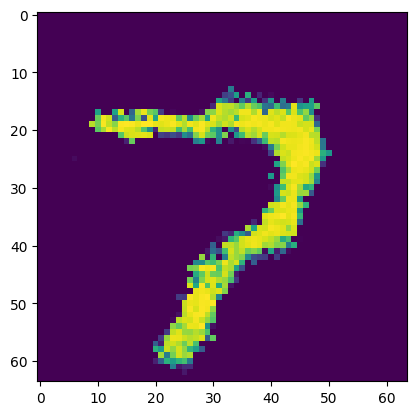

Epoch [25/50] Batch 400/938                   Loss D: -187418.4375, loss G: 86384.2578
tensor([4, 5, 5, 5, 1, 2, 2, 7, 1, 1, 3, 1, 7, 6, 0, 0, 8, 0, 7, 4, 1, 5, 2, 4,
        3, 8, 2, 4, 4, 1, 8, 2, 3, 5, 5, 0, 4, 9, 0, 0, 8, 4, 2, 1, 1, 0, 6, 6,
        2, 4, 8, 5, 0, 3, 1, 4, 3, 3, 9, 9, 2, 7, 7, 0], device='cuda:0')


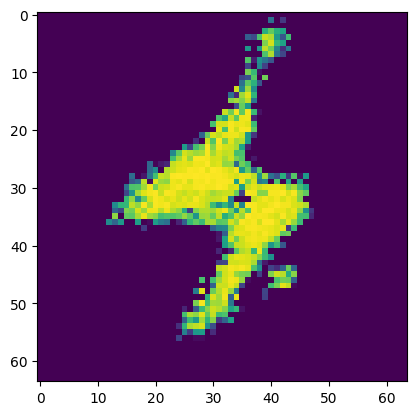

Epoch [25/50] Batch 500/938                   Loss D: -100768.7422, loss G: 84486.9922
tensor([2, 8, 5, 5, 0, 1, 8, 2, 7, 9, 6, 9, 7, 0, 3, 0, 2, 0, 3, 2, 1, 4, 1, 5,
        8, 1, 2, 2, 2, 8, 6, 6, 8, 5, 5, 5, 2, 0, 6, 6, 5, 3, 0, 7, 9, 8, 7, 6,
        6, 6, 6, 8, 6, 5, 9, 5, 2, 6, 5, 7, 1, 0, 8, 1], device='cuda:0')


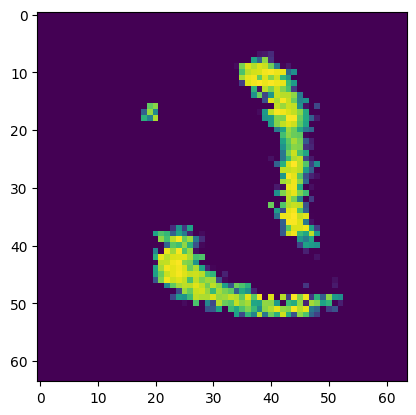

Epoch [25/50] Batch 600/938                   Loss D: -186959.2500, loss G: 87190.1719
tensor([3, 1, 4, 6, 8, 2, 2, 4, 4, 7, 9, 5, 7, 7, 1, 7, 7, 1, 2, 8, 9, 1, 5, 4,
        9, 4, 0, 6, 3, 5, 8, 6, 1, 6, 8, 1, 8, 6, 6, 4, 9, 8, 5, 3, 9, 6, 2, 4,
        2, 9, 3, 6, 9, 1, 7, 2, 7, 8, 5, 5, 0, 9, 7, 2], device='cuda:0')


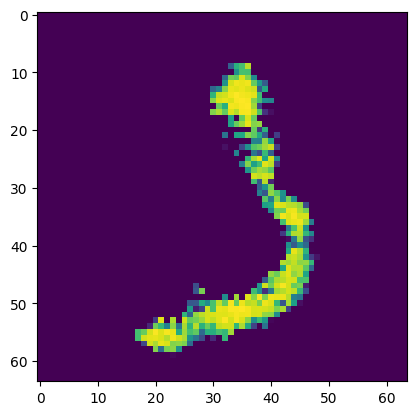

Epoch [25/50] Batch 700/938                   Loss D: -188055.7969, loss G: 88286.0938
tensor([6, 6, 6, 8, 9, 7, 6, 3, 9, 5, 4, 1, 6, 9, 6, 9, 3, 7, 5, 8, 8, 6, 5, 5,
        5, 5, 0, 9, 6, 6, 9, 0, 7, 7, 4, 7, 2, 4, 7, 5, 1, 4, 9, 8, 4, 2, 3, 4,
        7, 6, 3, 5, 5, 7, 0, 3, 5, 4, 4, 4, 5, 6, 3, 3], device='cuda:0')


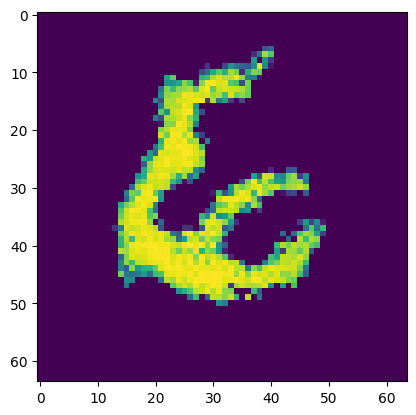

Epoch [25/50] Batch 800/938                   Loss D: -185915.4688, loss G: 88016.7969
tensor([2, 4, 4, 2, 8, 7, 4, 8, 8, 2, 9, 7, 3, 2, 3, 7, 1, 4, 0, 8, 3, 5, 3, 7,
        8, 3, 8, 5, 0, 4, 1, 1, 0, 9, 6, 0, 7, 3, 5, 0, 0, 1, 9, 2, 0, 0, 1, 1,
        4, 9, 9, 3, 8, 3, 0, 1, 4, 2, 2, 2, 9, 7, 9, 0], device='cuda:0')


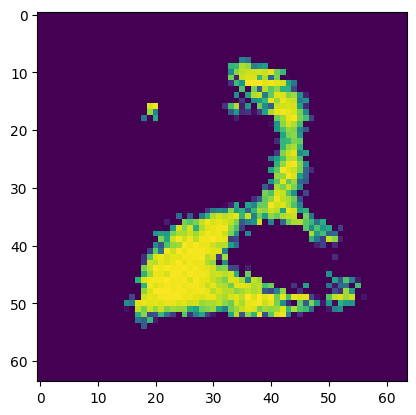

Epoch [25/50] Batch 900/938                   Loss D: -192818.8906, loss G: 90241.5156
tensor([5, 9, 3, 5, 9, 1, 4, 4, 4, 5, 4, 7, 1, 1, 9, 6, 2, 4, 0, 4, 6, 9, 6, 3,
        4, 6, 9, 6, 8, 2, 1, 8, 2, 1, 1, 5, 3, 0, 5, 6, 8, 5, 4, 2, 8, 5, 1, 2,
        9, 6, 9, 5, 5, 9, 3, 8, 6, 9, 8, 7, 8, 5, 6, 0], device='cuda:0')


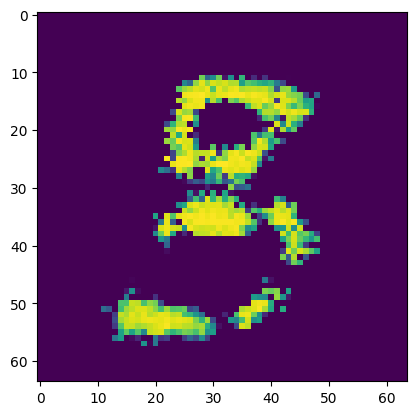

Epoch [26/50] Batch 100/938                   Loss D: -107930.6406, loss G: -20051.0352
tensor([9, 2, 5, 5, 0, 4, 3, 2, 5, 7, 3, 8, 4, 3, 9, 6, 8, 5, 9, 8, 4, 9, 9, 1,
        5, 3, 7, 2, 4, 1, 1, 9, 7, 4, 8, 0, 8, 2, 7, 6, 7, 5, 8, 7, 9, 1, 4, 2,
        2, 5, 0, 6, 1, 9, 7, 0, 4, 5, 4, 6, 9, 2, 8, 5], device='cuda:0')


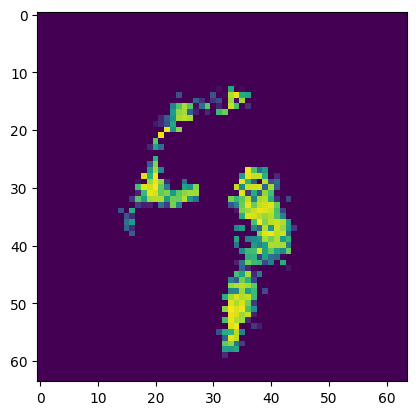

Epoch [26/50] Batch 200/938                   Loss D: -4569.3594, loss G: 91645.6719
tensor([4, 9, 9, 6, 1, 2, 5, 9, 6, 2, 6, 8, 8, 7, 2, 2, 0, 4, 0, 6, 5, 2, 8, 1,
        1, 7, 2, 6, 6, 3, 5, 4, 6, 2, 8, 0, 7, 7, 6, 0, 3, 4, 1, 8, 0, 5, 8, 8,
        9, 9, 4, 9, 3, 1, 4, 7, 5, 2, 3, 5, 3, 3, 1, 0], device='cuda:0')


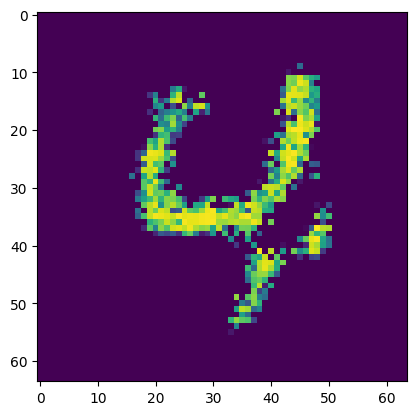

Epoch [26/50] Batch 300/938                   Loss D: -180649.6875, loss G: 87764.8281
tensor([2, 5, 2, 6, 1, 5, 4, 7, 2, 0, 1, 1, 5, 3, 0, 4, 9, 4, 6, 5, 6, 6, 3, 3,
        3, 5, 8, 3, 4, 7, 9, 0, 6, 7, 1, 8, 4, 7, 7, 9, 8, 7, 3, 7, 5, 4, 6, 9,
        2, 3, 7, 0, 5, 7, 9, 7, 5, 0, 5, 5, 4, 1, 2, 3], device='cuda:0')


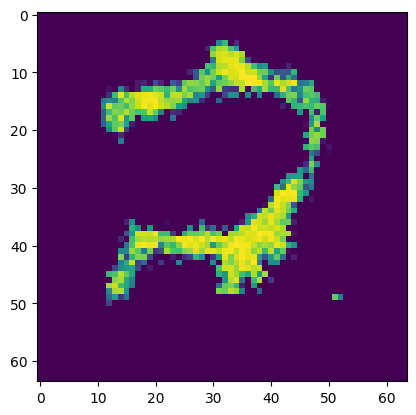

Epoch [26/50] Batch 400/938                   Loss D: -177335.9062, loss G: 88406.2656
tensor([6, 1, 7, 0, 6, 3, 7, 3, 7, 7, 9, 6, 1, 7, 4, 0, 1, 2, 0, 1, 0, 6, 8, 1,
        5, 9, 5, 2, 5, 7, 8, 5, 2, 9, 2, 4, 3, 2, 0, 4, 7, 8, 9, 4, 4, 6, 3, 3,
        7, 5, 4, 0, 8, 1, 7, 3, 0, 1, 3, 2, 7, 3, 6, 7], device='cuda:0')


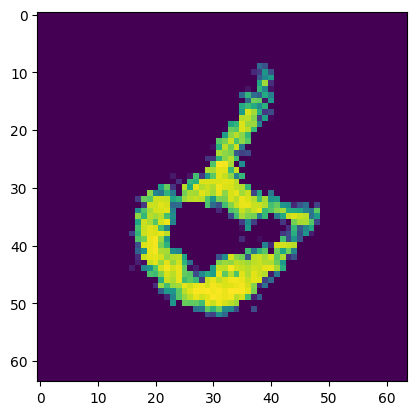

Epoch [26/50] Batch 500/938                   Loss D: -185978.6406, loss G: 89096.7266
tensor([1, 4, 1, 7, 7, 0, 2, 4, 2, 8, 2, 1, 1, 3, 4, 0, 9, 5, 5, 4, 0, 7, 8, 6,
        6, 4, 7, 7, 6, 4, 4, 5, 1, 7, 3, 2, 9, 3, 2, 9, 8, 0, 1, 6, 6, 4, 9, 5,
        2, 0, 1, 0, 8, 6, 6, 7, 6, 7, 8, 0, 3, 9, 7, 9], device='cuda:0')


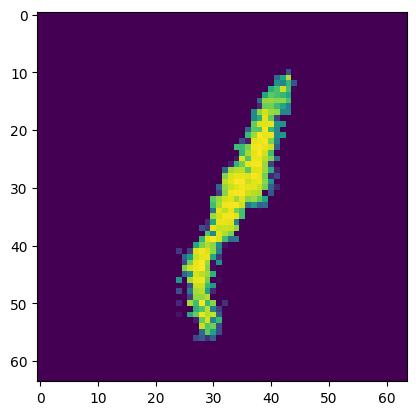

Epoch [26/50] Batch 600/938                   Loss D: -203324.8906, loss G: 95085.3359
tensor([2, 8, 3, 8, 6, 6, 4, 6, 7, 1, 3, 3, 6, 3, 9, 2, 7, 1, 1, 0, 7, 8, 3, 3,
        7, 9, 3, 8, 2, 3, 3, 0, 1, 0, 0, 1, 7, 5, 3, 0, 2, 0, 4, 4, 6, 6, 0, 9,
        2, 0, 6, 5, 3, 2, 1, 5, 2, 0, 1, 4, 2, 5, 3, 0], device='cuda:0')


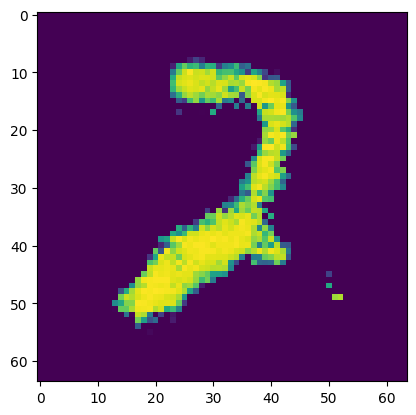

Epoch [26/50] Batch 700/938                   Loss D: -194509.3906, loss G: 92851.8672
tensor([2, 4, 1, 3, 8, 8, 9, 5, 0, 9, 9, 7, 0, 0, 0, 7, 9, 7, 3, 8, 2, 2, 7, 7,
        0, 9, 2, 6, 6, 8, 3, 2, 2, 4, 0, 3, 7, 8, 0, 5, 4, 0, 1, 9, 3, 6, 1, 9,
        1, 7, 0, 3, 6, 7, 8, 7, 4, 9, 7, 2, 9, 5, 1, 4], device='cuda:0')


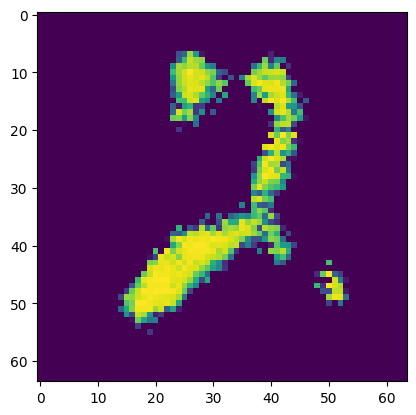

Epoch [26/50] Batch 800/938                   Loss D: -200026.6875, loss G: 95169.4453
tensor([2, 9, 6, 3, 3, 6, 4, 5, 8, 1, 0, 8, 7, 7, 4, 3, 7, 1, 1, 3, 6, 1, 4, 0,
        6, 0, 6, 3, 2, 7, 7, 5, 6, 2, 7, 4, 6, 0, 9, 3, 3, 8, 8, 6, 2, 2, 1, 5,
        2, 0, 6, 0, 6, 9, 2, 8, 2, 2, 1, 0, 1, 8, 4, 5], device='cuda:0')


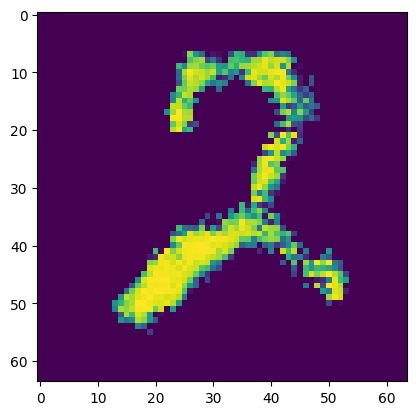

Epoch [26/50] Batch 900/938                   Loss D: -34363.4336, loss G: 92217.2656
tensor([7, 7, 4, 7, 7, 4, 8, 9, 9, 5, 1, 0, 4, 7, 3, 6, 4, 3, 2, 9, 8, 0, 9, 2,
        6, 4, 7, 8, 0, 8, 2, 5, 8, 7, 9, 9, 4, 5, 3, 7, 0, 9, 7, 3, 5, 7, 7, 1,
        2, 4, 9, 7, 2, 7, 3, 7, 4, 0, 3, 3, 3, 7, 6, 6], device='cuda:0')


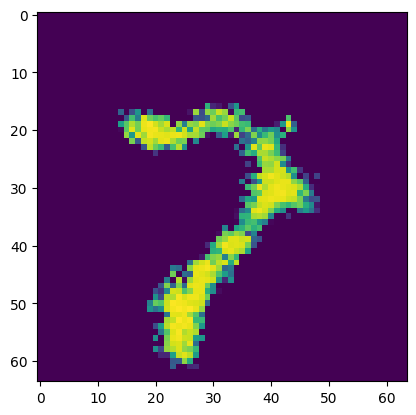

Epoch [27/50] Batch 100/938                   Loss D: -197885.4688, loss G: 95159.5000
tensor([2, 1, 5, 9, 8, 8, 2, 8, 7, 1, 6, 5, 0, 6, 9, 6, 9, 5, 4, 6, 3, 8, 6, 5,
        7, 6, 9, 1, 2, 6, 2, 3, 4, 3, 5, 2, 3, 1, 6, 5, 3, 5, 5, 9, 8, 4, 3, 4,
        6, 9, 4, 3, 0, 2, 7, 4, 9, 7, 4, 6, 1, 7, 5, 1], device='cuda:0')


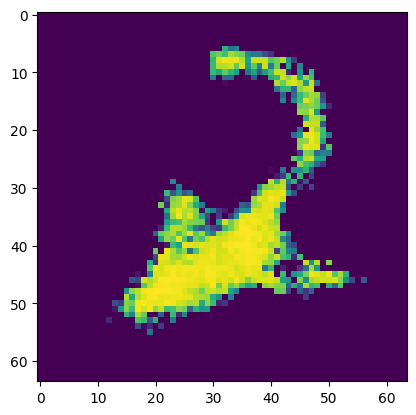

Epoch [27/50] Batch 200/938                   Loss D: 913.5793, loss G: 98357.0078
tensor([9, 5, 6, 3, 9, 7, 3, 3, 0, 7, 5, 1, 5, 6, 0, 0, 8, 5, 1, 2, 7, 3, 3, 0,
        5, 2, 2, 1, 3, 9, 5, 8, 3, 0, 0, 0, 3, 5, 4, 1, 9, 9, 8, 9, 2, 9, 3, 2,
        8, 6, 9, 6, 2, 0, 4, 9, 3, 0, 3, 5, 7, 2, 3, 0], device='cuda:0')


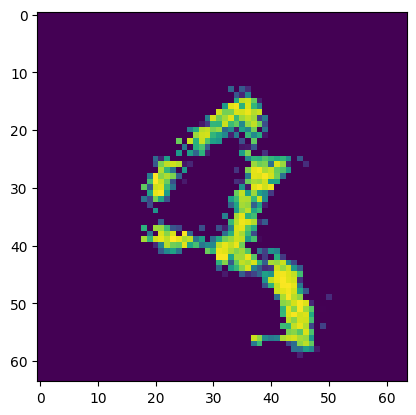

Epoch [27/50] Batch 300/938                   Loss D: -181751.0625, loss G: 96423.6641
tensor([4, 7, 3, 8, 5, 5, 3, 2, 6, 7, 5, 1, 7, 1, 3, 6, 7, 7, 2, 8, 2, 5, 2, 2,
        8, 9, 0, 4, 1, 7, 0, 1, 7, 7, 7, 3, 3, 2, 2, 3, 7, 8, 4, 3, 9, 5, 6, 1,
        3, 8, 4, 8, 3, 0, 7, 0, 3, 0, 8, 8, 1, 3, 1, 3], device='cuda:0')


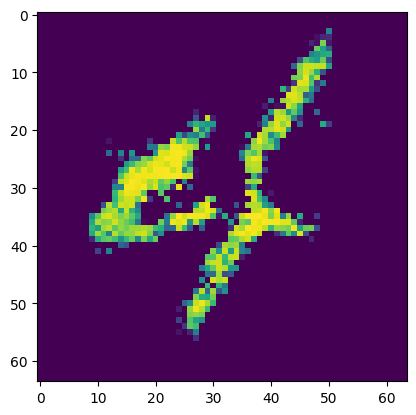

Epoch [27/50] Batch 400/938                   Loss D: -216975.5312, loss G: 100612.9375
tensor([9, 9, 0, 1, 6, 7, 2, 5, 6, 1, 7, 2, 4, 6, 8, 3, 5, 9, 0, 5, 3, 1, 0, 3,
        2, 1, 8, 5, 0, 2, 6, 9, 2, 3, 5, 7, 4, 0, 5, 3, 8, 9, 9, 4, 8, 2, 7, 9,
        8, 0, 8, 9, 8, 9, 7, 6, 0, 3, 7, 0, 1, 2, 4, 1], device='cuda:0')


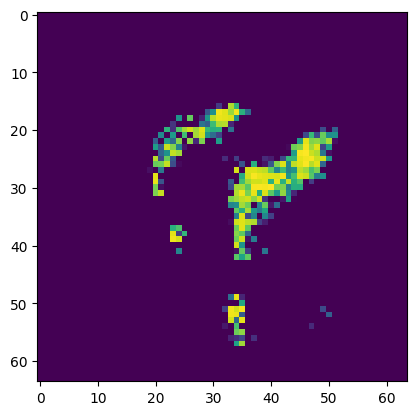

Epoch [27/50] Batch 500/938                   Loss D: -3058.5430, loss G: 71421.6562
tensor([9, 3, 9, 3, 7, 1, 1, 4, 7, 3, 5, 5, 3, 2, 1, 7, 4, 6, 3, 9, 3, 4, 6, 7,
        8, 8, 7, 6, 2, 0, 4, 2, 1, 0, 1, 1, 3, 0, 3, 7, 5, 1, 8, 9, 1, 0, 0, 6,
        8, 5, 4, 7, 8, 7, 7, 8, 3, 0, 3, 9, 2, 2, 8, 6], device='cuda:0')


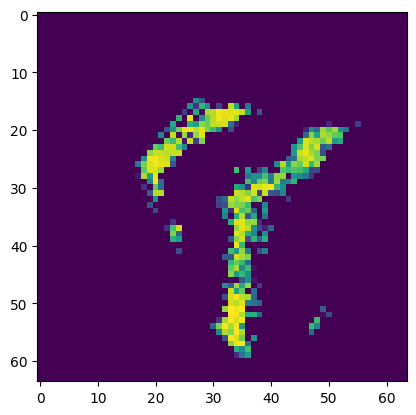

Epoch [27/50] Batch 600/938                   Loss D: -211097.1094, loss G: 99275.0781
tensor([3, 4, 1, 9, 1, 0, 0, 8, 9, 5, 3, 9, 0, 6, 4, 8, 0, 7, 6, 3, 7, 9, 9, 9,
        4, 9, 8, 9, 6, 5, 4, 1, 0, 2, 0, 4, 7, 8, 1, 2, 9, 9, 4, 2, 0, 3, 1, 8,
        3, 2, 5, 8, 3, 6, 7, 1, 1, 2, 1, 2, 5, 7, 8, 1], device='cuda:0')


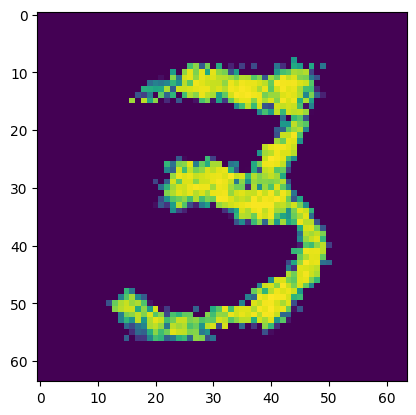

Epoch [27/50] Batch 700/938                   Loss D: -223217.0156, loss G: 103967.5000
tensor([2, 6, 5, 7, 7, 8, 7, 2, 4, 3, 3, 6, 2, 3, 7, 0, 4, 1, 7, 6, 2, 8, 3, 8,
        2, 9, 7, 6, 4, 9, 3, 4, 9, 3, 2, 8, 0, 9, 5, 9, 8, 3, 4, 7, 0, 8, 7, 3,
        9, 1, 1, 2, 0, 9, 0, 2, 3, 4, 1, 4, 7, 4, 7, 0], device='cuda:0')


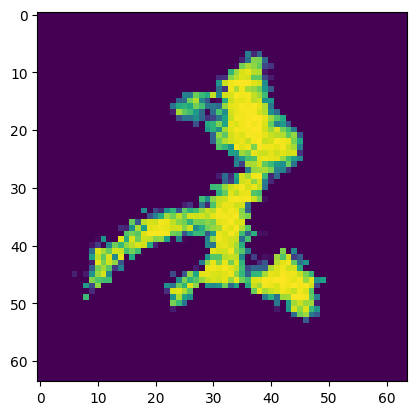

Epoch [27/50] Batch 800/938                   Loss D: -214033.3750, loss G: 102048.0156
tensor([6, 1, 9, 2, 6, 3, 4, 0, 7, 1, 1, 4, 8, 4, 5, 2, 7, 1, 1, 3, 5, 9, 1, 8,
        2, 1, 0, 4, 8, 8, 1, 2, 3, 4, 6, 2, 8, 1, 1, 4, 0, 4, 1, 0, 6, 9, 3, 0,
        2, 1, 7, 7, 5, 4, 8, 8, 6, 3, 7, 5, 7, 8, 2, 0], device='cuda:0')


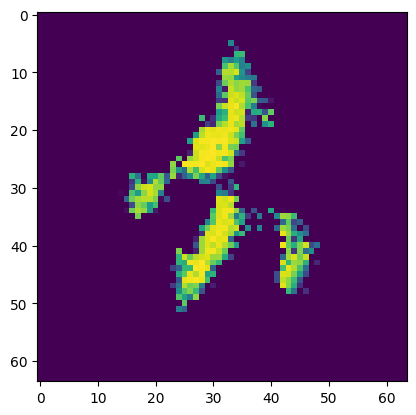

Epoch [27/50] Batch 900/938                   Loss D: -216794.8906, loss G: 102152.7734
tensor([5, 1, 6, 6, 4, 5, 4, 8, 5, 6, 0, 2, 9, 1, 9, 7, 6, 6, 5, 4, 9, 0, 3, 1,
        7, 8, 4, 3, 3, 2, 8, 3, 3, 4, 2, 4, 8, 4, 3, 0, 4, 7, 6, 7, 2, 2, 6, 2,
        5, 3, 2, 2, 8, 8, 3, 3, 6, 9, 3, 7, 7, 7, 4, 7], device='cuda:0')


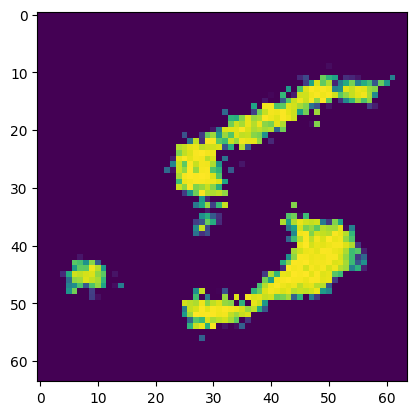

Epoch [28/50] Batch 100/938                   Loss D: -225307.6875, loss G: 105735.9375
tensor([8, 1, 5, 9, 1, 6, 1, 1, 2, 0, 0, 8, 8, 2, 0, 2, 4, 7, 6, 1, 6, 7, 0, 1,
        6, 4, 4, 1, 8, 6, 8, 1, 1, 3, 2, 1, 9, 9, 4, 5, 9, 0, 2, 6, 6, 8, 8, 0,
        4, 6, 1, 0, 9, 4, 2, 9, 7, 7, 5, 9, 4, 5, 6, 1], device='cuda:0')


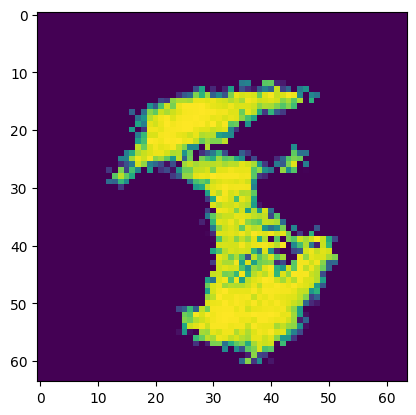

Epoch [28/50] Batch 200/938                   Loss D: -234672.7812, loss G: 107611.4688
tensor([8, 1, 5, 4, 9, 2, 4, 8, 6, 7, 8, 5, 3, 1, 7, 3, 8, 4, 9, 0, 3, 7, 4, 2,
        1, 7, 6, 0, 7, 4, 8, 1, 6, 5, 0, 4, 8, 9, 4, 9, 6, 2, 6, 5, 2, 7, 8, 3,
        5, 4, 6, 4, 2, 2, 4, 4, 4, 3, 4, 8, 3, 2, 0, 9], device='cuda:0')


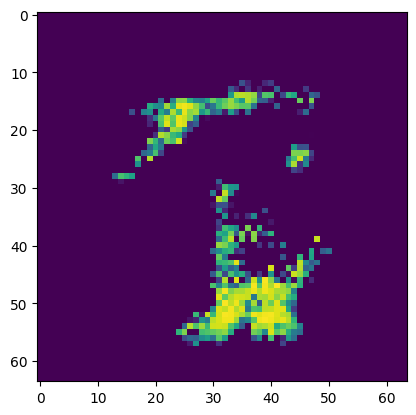

Epoch [28/50] Batch 300/938                   Loss D: -236432.1094, loss G: 108566.5391
tensor([7, 1, 7, 6, 8, 1, 7, 5, 4, 3, 3, 1, 6, 7, 0, 8, 2, 1, 2, 6, 8, 1, 6, 2,
        4, 2, 4, 6, 7, 1, 2, 5, 3, 2, 1, 8, 1, 4, 8, 5, 1, 1, 9, 8, 9, 8, 7, 1,
        0, 0, 1, 7, 0, 2, 3, 2, 8, 2, 0, 1, 1, 8, 8, 4], device='cuda:0')


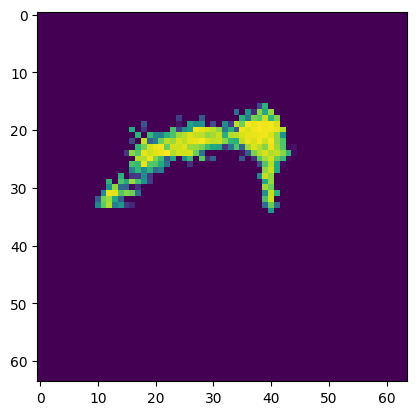

Epoch [28/50] Batch 400/938                   Loss D: -234584.1094, loss G: 109260.7812
tensor([1, 6, 6, 3, 5, 4, 9, 2, 9, 3, 4, 2, 4, 3, 1, 3, 4, 7, 7, 8, 0, 0, 4, 1,
        4, 6, 9, 5, 0, 9, 7, 5, 7, 1, 3, 8, 9, 8, 7, 1, 2, 4, 1, 6, 7, 8, 8, 5,
        9, 7, 5, 5, 1, 3, 9, 7, 4, 3, 8, 6, 0, 2, 2, 1], device='cuda:0')


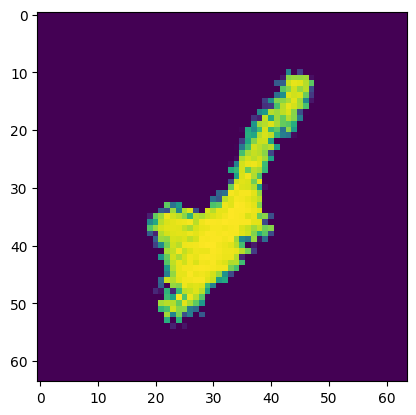

Epoch [28/50] Batch 500/938                   Loss D: -235409.2031, loss G: 110538.7656
tensor([3, 1, 0, 8, 0, 3, 2, 5, 7, 3, 7, 1, 9, 3, 1, 1, 8, 4, 4, 9, 5, 6, 4, 3,
        2, 6, 6, 7, 5, 5, 0, 4, 4, 6, 6, 6, 2, 4, 9, 1, 9, 4, 1, 6, 2, 7, 8, 7,
        1, 2, 9, 6, 5, 9, 8, 6, 9, 2, 1, 2, 5, 6, 7, 7], device='cuda:0')


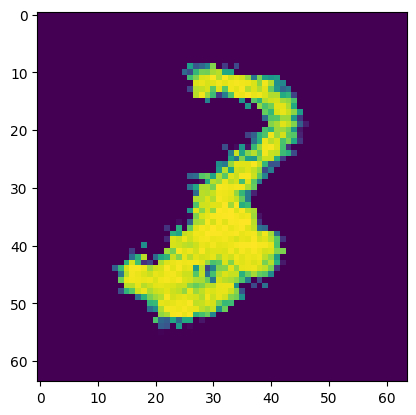

Epoch [28/50] Batch 600/938                   Loss D: -221838.2656, loss G: 98381.4609
tensor([2, 1, 1, 3, 6, 2, 4, 3, 1, 9, 7, 8, 1, 6, 7, 2, 2, 9, 8, 8, 5, 0, 4, 1,
        0, 5, 6, 2, 5, 2, 5, 5, 3, 7, 4, 5, 2, 8, 8, 7, 5, 6, 2, 5, 4, 9, 6, 3,
        6, 9, 9, 1, 3, 4, 2, 7, 1, 8, 8, 7, 5, 7, 2, 8], device='cuda:0')


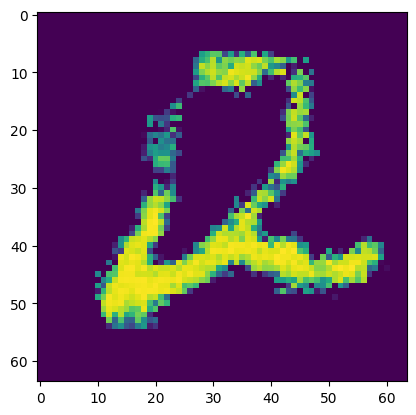

Epoch [28/50] Batch 700/938                   Loss D: 733.1592, loss G: 109346.8125
tensor([7, 4, 9, 9, 7, 4, 4, 0, 7, 6, 8, 1, 7, 0, 6, 4, 9, 3, 6, 2, 1, 8, 9, 0,
        5, 7, 1, 4, 2, 0, 3, 3, 8, 7, 0, 7, 4, 7, 0, 0, 9, 5, 7, 1, 8, 5, 1, 7,
        1, 0, 8, 9, 5, 6, 9, 3, 7, 3, 6, 7, 3, 6, 1, 8], device='cuda:0')


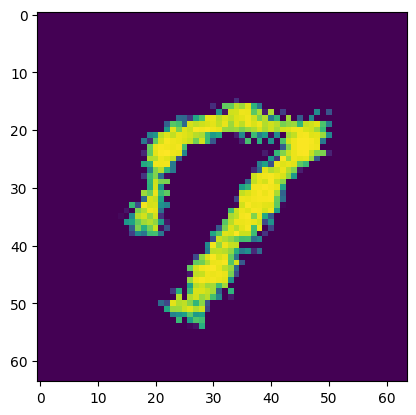

Epoch [28/50] Batch 800/938                   Loss D: 5341.4238, loss G: 112971.5859
tensor([4, 2, 2, 2, 3, 4, 1, 7, 4, 9, 6, 1, 3, 2, 6, 5, 3, 8, 7, 6, 0, 8, 2, 2,
        5, 2, 3, 9, 8, 9, 2, 9, 7, 1, 0, 8, 2, 3, 1, 1, 4, 3, 1, 6, 8, 2, 9, 2,
        0, 3, 9, 3, 8, 6, 6, 8, 8, 0, 7, 9, 2, 9, 9, 7], device='cuda:0')


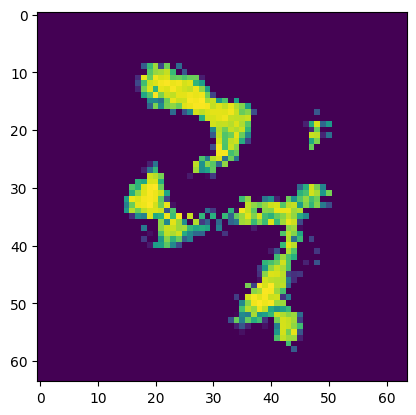

Epoch [28/50] Batch 900/938                   Loss D: -249863.1875, loss G: 115007.9297
tensor([5, 9, 5, 7, 3, 6, 5, 4, 1, 6, 4, 7, 4, 5, 8, 0, 4, 9, 8, 5, 6, 7, 6, 8,
        9, 8, 9, 9, 5, 2, 7, 9, 3, 4, 0, 8, 7, 8, 2, 2, 4, 9, 6, 4, 8, 8, 9, 6,
        3, 7, 6, 8, 1, 3, 3, 9, 1, 8, 0, 9, 1, 0, 2, 7], device='cuda:0')


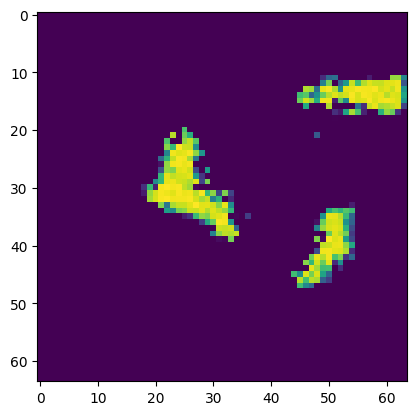

Epoch [29/50] Batch 100/938                   Loss D: -245266.7500, loss G: 114611.8125
tensor([0, 8, 6, 3, 3, 2, 3, 4, 4, 0, 6, 8, 6, 6, 7, 0, 3, 8, 1, 8, 8, 2, 5, 5,
        8, 9, 7, 0, 3, 1, 8, 0, 8, 0, 4, 5, 1, 1, 6, 2, 4, 6, 1, 3, 0, 2, 5, 2,
        5, 8, 2, 2, 6, 5, 0, 7, 2, 5, 6, 3, 9, 9, 6, 2], device='cuda:0')


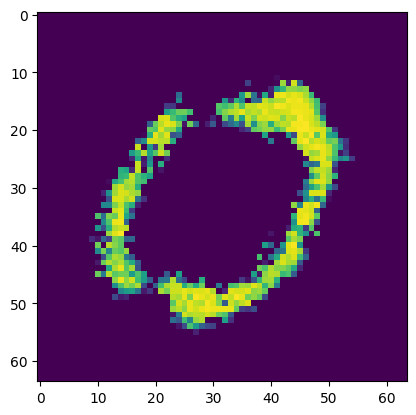

Epoch [29/50] Batch 200/938                   Loss D: -256670.4688, loss G: 117358.2969
tensor([4, 5, 6, 6, 0, 0, 0, 5, 0, 1, 5, 2, 1, 7, 6, 5, 8, 8, 8, 9, 0, 8, 8, 5,
        6, 0, 4, 4, 3, 1, 7, 4, 9, 6, 4, 8, 2, 3, 8, 4, 4, 0, 4, 8, 9, 6, 8, 2,
        2, 9, 9, 2, 0, 9, 2, 2, 1, 3, 3, 8, 4, 6, 5, 4], device='cuda:0')


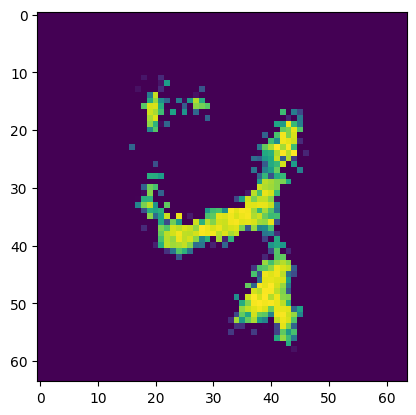

Epoch [29/50] Batch 300/938                   Loss D: -259243.1406, loss G: 118941.4531
tensor([1, 3, 8, 3, 3, 8, 5, 3, 4, 4, 0, 8, 7, 1, 3, 1, 7, 6, 4, 1, 6, 8, 6, 3,
        0, 4, 0, 3, 3, 9, 8, 0, 4, 5, 5, 4, 9, 1, 3, 9, 0, 3, 5, 3, 4, 7, 0, 2,
        7, 9, 6, 4, 9, 4, 5, 7, 1, 1, 6, 2, 1, 8, 4, 2], device='cuda:0')


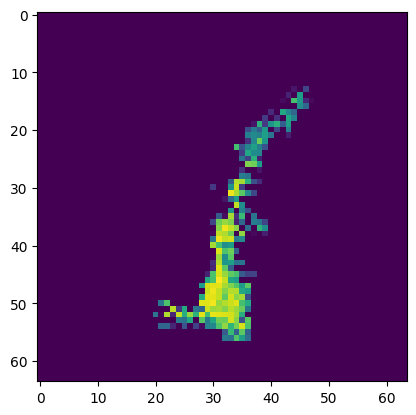

Epoch [29/50] Batch 400/938                   Loss D: -176472.5938, loss G: 106729.2109
tensor([6, 4, 7, 9, 5, 7, 0, 8, 8, 5, 1, 1, 9, 9, 6, 9, 8, 7, 8, 9, 3, 0, 3, 2,
        4, 4, 8, 8, 4, 1, 3, 7, 0, 7, 9, 4, 5, 9, 8, 8, 2, 0, 7, 5, 7, 2, 9, 8,
        3, 7, 1, 1, 4, 4, 0, 9, 4, 1, 7, 7, 3, 8, 7, 6], device='cuda:0')


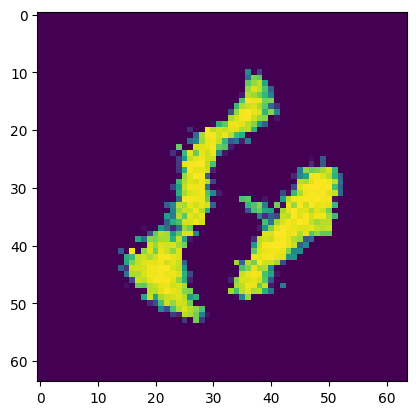

Epoch [29/50] Batch 500/938                   Loss D: -261044.3438, loss G: 120775.2031
tensor([6, 1, 9, 7, 3, 1, 4, 7, 4, 4, 6, 1, 9, 8, 3, 3, 1, 5, 1, 4, 6, 5, 7, 8,
        9, 7, 4, 3, 1, 5, 2, 4, 2, 8, 5, 8, 9, 6, 3, 0, 3, 1, 4, 6, 6, 1, 2, 6,
        6, 5, 0, 3, 2, 2, 5, 1, 6, 4, 0, 0, 8, 4, 2, 6], device='cuda:0')


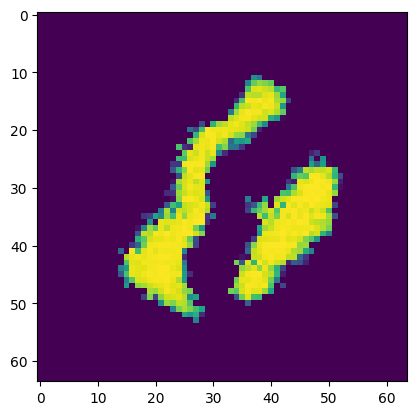

Epoch [29/50] Batch 600/938                   Loss D: -261250.7969, loss G: 121652.3594
tensor([4, 7, 5, 9, 0, 4, 4, 5, 4, 2, 6, 9, 7, 1, 4, 6, 5, 6, 5, 1, 8, 1, 3, 5,
        6, 7, 0, 2, 9, 3, 2, 8, 3, 9, 3, 8, 9, 3, 5, 5, 7, 7, 6, 9, 7, 7, 0, 4,
        4, 3, 4, 3, 4, 1, 2, 9, 1, 5, 9, 7, 2, 7, 4, 7], device='cuda:0')


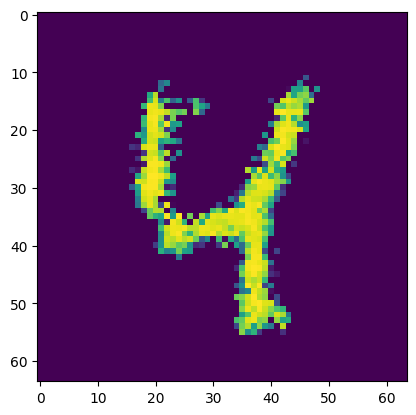

Epoch [29/50] Batch 700/938                   Loss D: -263031.3438, loss G: 122904.2344
tensor([8, 5, 9, 2, 2, 1, 6, 6, 3, 3, 7, 4, 6, 4, 4, 0, 8, 7, 8, 7, 9, 0, 5, 3,
        9, 0, 2, 1, 0, 5, 8, 8, 0, 6, 3, 5, 3, 1, 1, 5, 8, 6, 0, 4, 7, 4, 4, 4,
        5, 5, 3, 9, 4, 9, 7, 6, 5, 3, 9, 0, 2, 5, 9, 6], device='cuda:0')


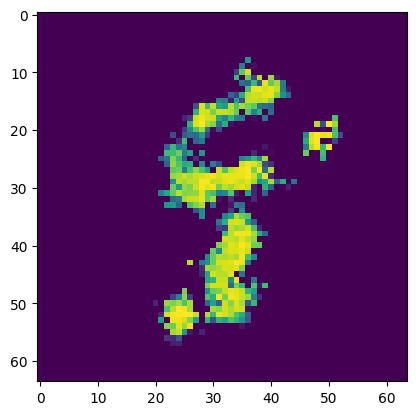

Epoch [29/50] Batch 800/938                   Loss D: -265837.2812, loss G: 123758.7422
tensor([6, 2, 6, 6, 7, 0, 8, 7, 0, 1, 7, 0, 7, 4, 7, 4, 0, 2, 1, 4, 3, 9, 4, 7,
        9, 9, 6, 2, 9, 7, 0, 3, 3, 2, 3, 3, 3, 6, 3, 1, 9, 5, 3, 9, 0, 6, 6, 3,
        8, 3, 0, 7, 7, 5, 3, 4, 7, 4, 1, 5, 0, 7, 4, 0], device='cuda:0')


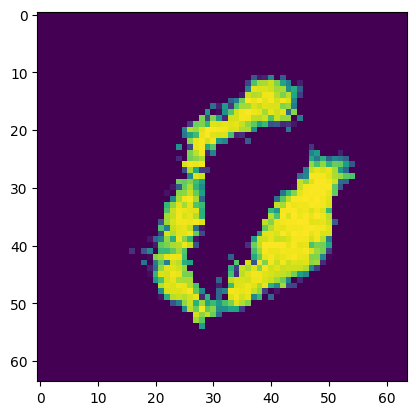

Epoch [29/50] Batch 900/938                   Loss D: -271962.1875, loss G: 125304.7031
tensor([4, 3, 1, 3, 0, 1, 2, 4, 0, 1, 2, 0, 6, 1, 2, 4, 0, 5, 0, 9, 8, 1, 0, 9,
        3, 0, 3, 7, 5, 6, 4, 9, 6, 5, 5, 4, 5, 0, 0, 8, 6, 8, 5, 3, 5, 9, 8, 1,
        6, 5, 7, 9, 1, 4, 9, 7, 7, 9, 2, 4, 1, 5, 2, 6], device='cuda:0')


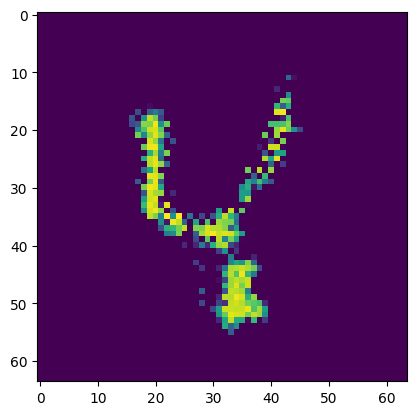

Epoch [30/50] Batch 100/938                   Loss D: -278025.3438, loss G: 127602.8125
tensor([7, 0, 8, 1, 5, 8, 3, 2, 1, 2, 9, 2, 4, 9, 0, 5, 8, 0, 0, 6, 7, 7, 0, 9,
        8, 1, 6, 9, 2, 5, 7, 5, 8, 6, 0, 9, 4, 4, 5, 8, 4, 9, 6, 3, 1, 4, 9, 2,
        1, 6, 4, 2, 8, 5, 9, 8, 3, 4, 9, 8, 7, 6, 5, 9], device='cuda:0')


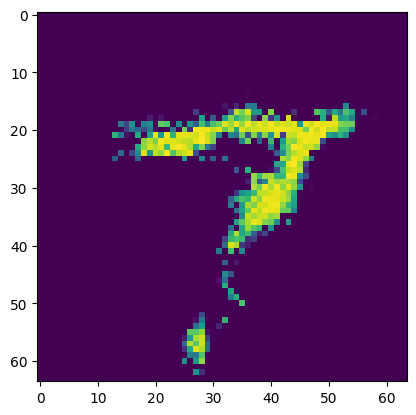

Epoch [30/50] Batch 200/938                   Loss D: -275904.7188, loss G: 129093.1094
tensor([7, 7, 0, 5, 9, 1, 6, 0, 9, 9, 6, 8, 6, 3, 8, 6, 3, 0, 9, 0, 6, 4, 3, 4,
        4, 7, 2, 6, 6, 5, 1, 4, 6, 5, 3, 9, 2, 9, 1, 0, 7, 2, 7, 6, 6, 7, 8, 6,
        0, 5, 1, 3, 0, 9, 2, 2, 6, 2, 7, 6, 8, 3, 2, 6], device='cuda:0')


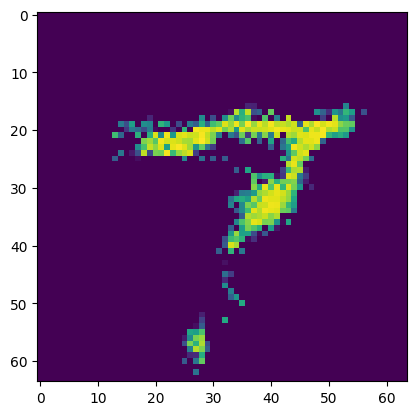

Epoch [30/50] Batch 300/938                   Loss D: -272434.2188, loss G: 127325.2891
tensor([0, 3, 9, 7, 4, 7, 7, 3, 9, 0, 2, 6, 2, 2, 9, 4, 1, 6, 2, 7, 0, 9, 5, 9,
        1, 4, 2, 7, 3, 1, 6, 2, 3, 1, 1, 8, 1, 3, 5, 9, 5, 8, 4, 7, 8, 3, 6, 4,
        5, 1, 5, 4, 7, 0, 5, 4, 5, 3, 8, 5, 3, 0, 8, 1], device='cuda:0')


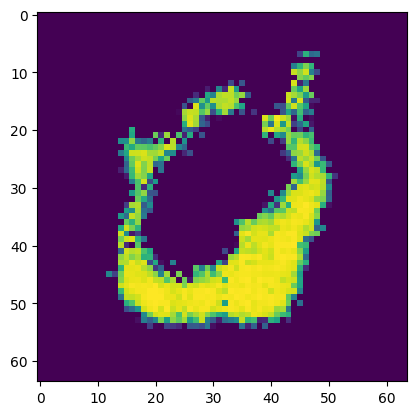

Epoch [30/50] Batch 400/938                   Loss D: -280354.5625, loss G: 130564.3438
tensor([2, 6, 8, 4, 3, 3, 2, 8, 0, 8, 2, 1, 4, 2, 9, 0, 5, 7, 7, 3, 8, 8, 2, 6,
        4, 2, 1, 1, 1, 7, 6, 4, 5, 2, 0, 3, 3, 5, 0, 9, 0, 8, 2, 6, 6, 7, 2, 3,
        6, 1, 6, 3, 2, 7, 2, 8, 4, 0, 8, 8, 8, 3, 4, 3], device='cuda:0')


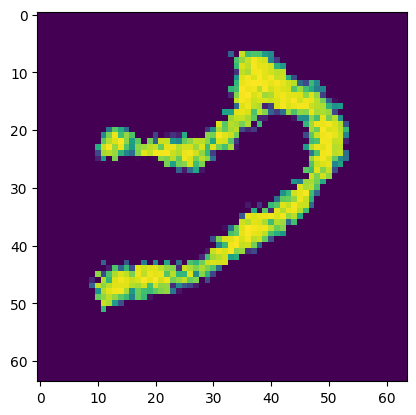

Epoch [30/50] Batch 500/938                   Loss D: -279353.0625, loss G: 130468.5156
tensor([2, 6, 0, 4, 0, 1, 8, 2, 2, 3, 9, 0, 7, 8, 9, 7, 1, 8, 5, 3, 4, 9, 6, 9,
        5, 8, 5, 9, 4, 4, 9, 9, 4, 9, 6, 9, 1, 4, 0, 7, 1, 2, 3, 4, 6, 2, 6, 3,
        5, 9, 3, 0, 5, 1, 3, 1, 9, 4, 3, 9, 0, 8, 6, 0], device='cuda:0')


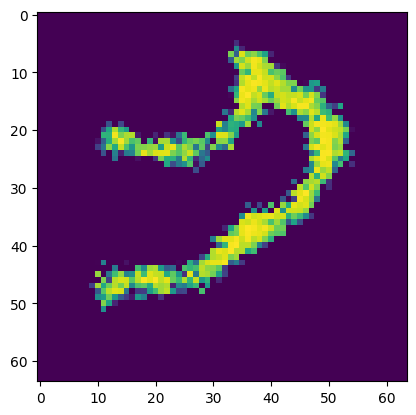

Epoch [30/50] Batch 600/938                   Loss D: -288989.4375, loss G: 133328.1250
tensor([6, 3, 0, 3, 0, 1, 0, 3, 3, 0, 3, 7, 4, 5, 2, 2, 8, 6, 3, 7, 9, 4, 2, 5,
        4, 9, 0, 9, 7, 5, 1, 0, 4, 2, 1, 9, 8, 6, 5, 7, 4, 2, 1, 7, 3, 8, 2, 5,
        5, 4, 5, 7, 7, 2, 4, 6, 4, 5, 3, 9, 1, 8, 7, 9], device='cuda:0')


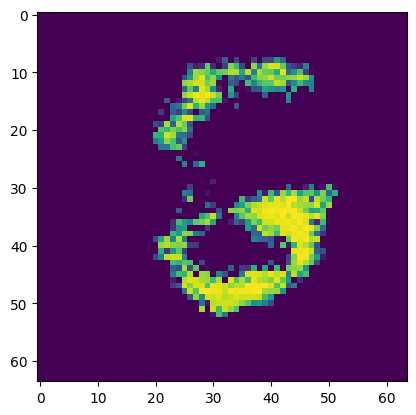

Epoch [30/50] Batch 700/938                   Loss D: -281494.3125, loss G: 132716.7969
tensor([9, 2, 7, 7, 6, 4, 2, 0, 6, 1, 6, 2, 4, 9, 4, 2, 4, 6, 0, 2, 3, 5, 7, 7,
        2, 1, 7, 3, 7, 7, 7, 8, 0, 2, 7, 5, 0, 9, 6, 7, 7, 5, 9, 7, 3, 1, 7, 3,
        3, 9, 6, 4, 6, 2, 5, 8, 3, 5, 3, 3, 6, 1, 2, 6], device='cuda:0')


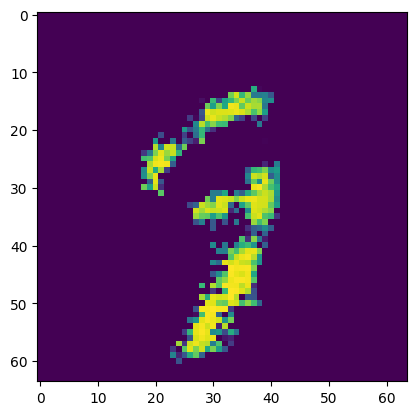

Epoch [30/50] Batch 800/938                   Loss D: -288484.4062, loss G: 135095.7812
tensor([3, 9, 5, 2, 5, 7, 6, 1, 7, 5, 3, 1, 6, 8, 2, 0, 3, 4, 4, 7, 6, 6, 3, 6,
        1, 3, 4, 7, 7, 5, 3, 7, 4, 4, 8, 9, 0, 7, 0, 3, 9, 7, 6, 2, 2, 3, 9, 3,
        6, 0, 4, 8, 7, 0, 4, 3, 2, 4, 5, 6, 5, 5, 6, 9], device='cuda:0')


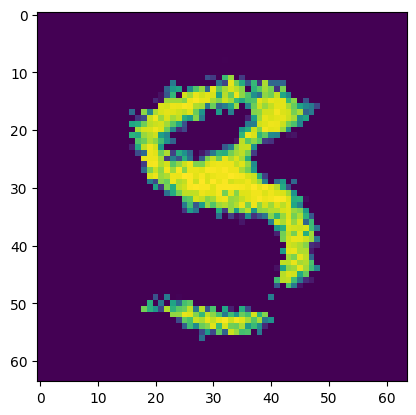

Epoch [30/50] Batch 900/938                   Loss D: -294980.3125, loss G: 136624.0469
tensor([4, 3, 1, 1, 4, 1, 1, 9, 2, 9, 2, 6, 1, 6, 1, 0, 2, 9, 2, 6, 2, 1, 0, 2,
        6, 5, 4, 5, 2, 0, 7, 7, 6, 9, 2, 9, 0, 9, 7, 8, 5, 5, 5, 0, 9, 1, 7, 8,
        0, 7, 0, 9, 2, 6, 4, 3, 7, 1, 7, 0, 6, 1, 0, 5], device='cuda:0')


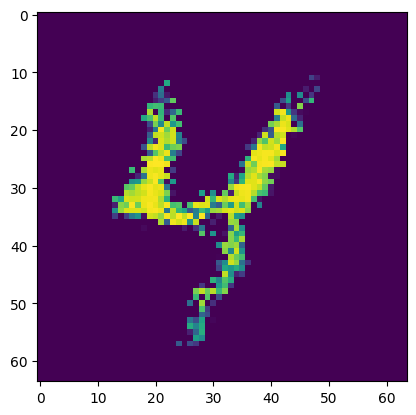

Epoch [31/50] Batch 100/938                   Loss D: -291925.4375, loss G: 137074.0156
tensor([2, 4, 1, 0, 9, 9, 3, 5, 2, 8, 3, 8, 7, 4, 0, 6, 2, 2, 2, 2, 1, 6, 1, 3,
        1, 1, 0, 6, 1, 9, 7, 7, 3, 2, 5, 4, 8, 9, 9, 3, 7, 5, 7, 3, 0, 1, 5, 2,
        4, 1, 0, 0, 5, 4, 2, 4, 5, 9, 8, 6, 7, 2, 5, 2], device='cuda:0')


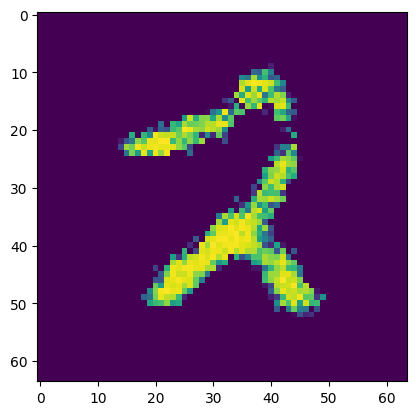

Epoch [31/50] Batch 200/938                   Loss D: -296717.0312, loss G: 138985.6094
tensor([2, 6, 9, 1, 9, 7, 7, 4, 7, 9, 7, 2, 1, 1, 8, 0, 7, 2, 7, 1, 1, 9, 9, 4,
        8, 7, 3, 5, 8, 1, 9, 2, 5, 6, 5, 5, 2, 2, 0, 1, 9, 1, 7, 1, 5, 8, 6, 3,
        4, 1, 9, 2, 1, 1, 3, 6, 5, 3, 9, 4, 9, 0, 8, 2], device='cuda:0')


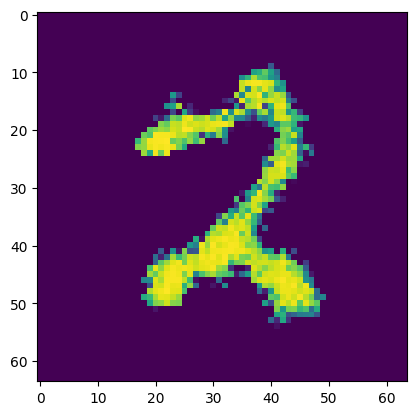

Epoch [31/50] Batch 300/938                   Loss D: -300590.0938, loss G: 140161.6406
tensor([0, 6, 7, 6, 9, 7, 5, 4, 8, 1, 2, 7, 6, 7, 7, 0, 3, 1, 1, 5, 4, 2, 5, 2,
        4, 7, 5, 4, 3, 0, 2, 8, 0, 8, 1, 4, 9, 8, 1, 4, 7, 6, 0, 5, 3, 7, 0, 2,
        6, 8, 6, 1, 1, 1, 5, 0, 1, 6, 3, 2, 2, 1, 1, 0], device='cuda:0')


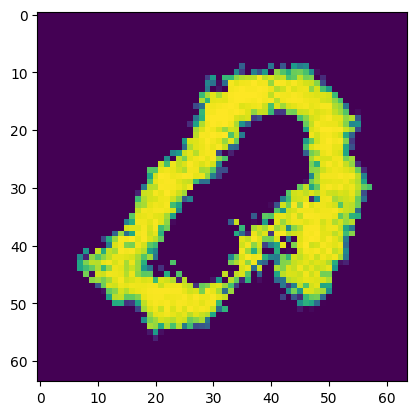

Epoch [31/50] Batch 400/938                   Loss D: 12.4468, loss G: 141427.8750
tensor([9, 4, 7, 3, 1, 7, 6, 5, 3, 6, 7, 2, 4, 1, 9, 5, 9, 1, 7, 5, 8, 1, 6, 2,
        3, 6, 7, 4, 4, 5, 9, 6, 9, 1, 8, 4, 3, 8, 8, 3, 8, 1, 8, 4, 9, 9, 1, 2,
        6, 2, 0, 7, 8, 2, 6, 0, 0, 9, 0, 5, 1, 5, 3, 4], device='cuda:0')


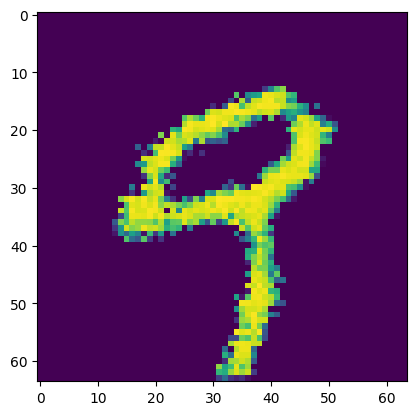

Epoch [31/50] Batch 500/938                   Loss D: 1044.9319, loss G: 141424.2344
tensor([6, 1, 1, 5, 7, 4, 7, 3, 1, 7, 3, 4, 9, 8, 6, 9, 2, 7, 7, 8, 4, 7, 7, 9,
        7, 2, 5, 3, 2, 3, 7, 3, 1, 1, 8, 6, 7, 0, 9, 8, 7, 3, 8, 3, 0, 3, 9, 6,
        4, 0, 7, 1, 3, 9, 3, 6, 2, 5, 9, 8, 6, 5, 5, 3], device='cuda:0')


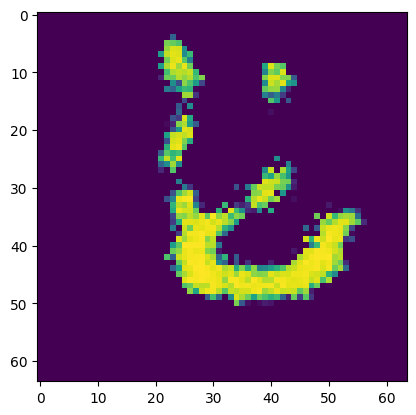

Epoch [31/50] Batch 600/938                   Loss D: -28005.7695, loss G: 134383.4688
tensor([9, 9, 4, 1, 8, 7, 2, 0, 8, 1, 7, 4, 7, 3, 1, 8, 4, 9, 0, 1, 0, 9, 4, 9,
        3, 3, 9, 2, 1, 8, 9, 6, 9, 2, 8, 4, 5, 4, 0, 8, 5, 4, 3, 3, 4, 7, 1, 8,
        7, 0, 3, 1, 7, 3, 9, 4, 8, 0, 7, 0, 2, 6, 7, 0], device='cuda:0')


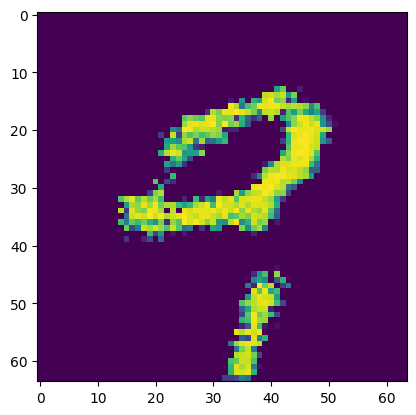

Epoch [31/50] Batch 700/938                   Loss D: -311040.5000, loss G: 143656.2344
tensor([6, 3, 6, 3, 5, 5, 6, 8, 0, 4, 8, 5, 6, 8, 8, 0, 9, 7, 6, 3, 0, 1, 2, 6,
        9, 7, 6, 7, 3, 8, 8, 1, 5, 7, 2, 8, 9, 3, 1, 6, 3, 6, 9, 9, 8, 4, 7, 8,
        1, 3, 1, 5, 4, 2, 9, 7, 2, 0, 1, 5, 0, 5, 3, 0], device='cuda:0')


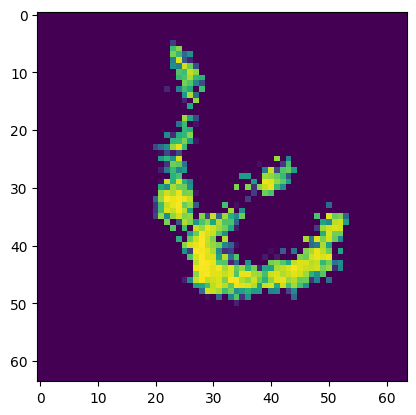

Epoch [31/50] Batch 800/938                   Loss D: -315096.0625, loss G: 145265.5938
tensor([8, 6, 7, 8, 4, 9, 5, 0, 4, 8, 7, 8, 1, 2, 6, 7, 5, 2, 3, 1, 2, 6, 3, 4,
        8, 1, 6, 1, 3, 9, 5, 6, 9, 3, 4, 0, 4, 6, 0, 0, 7, 4, 1, 6, 6, 7, 6, 4,
        6, 2, 8, 2, 8, 2, 7, 0, 8, 3, 6, 4, 8, 6, 3, 1], device='cuda:0')


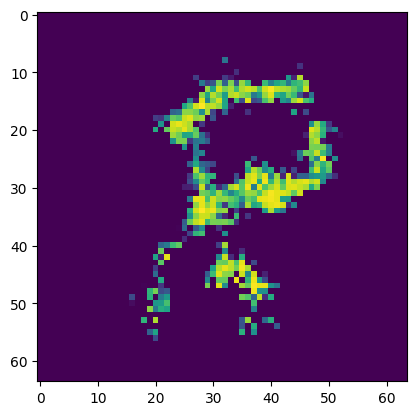

Epoch [31/50] Batch 900/938                   Loss D: -14116.6514, loss G: 141639.6562
tensor([4, 7, 3, 5, 3, 5, 2, 0, 6, 7, 0, 6, 4, 5, 3, 5, 6, 9, 1, 6, 0, 8, 7, 6,
        4, 7, 5, 8, 2, 1, 1, 7, 5, 4, 2, 6, 9, 5, 1, 4, 4, 7, 4, 1, 6, 7, 7, 8,
        9, 7, 2, 3, 1, 5, 6, 8, 7, 6, 4, 3, 0, 4, 6, 1], device='cuda:0')


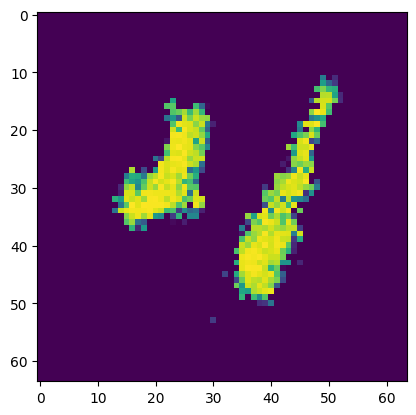

Epoch [32/50] Batch 100/938                   Loss D: -320474.9062, loss G: 148234.7500
tensor([0, 7, 1, 3, 1, 6, 3, 4, 4, 1, 6, 0, 9, 2, 6, 5, 0, 3, 0, 7, 5, 6, 0, 4,
        9, 1, 7, 9, 8, 2, 0, 9, 3, 2, 6, 7, 1, 3, 8, 2, 8, 6, 6, 4, 2, 0, 7, 1,
        0, 7, 4, 7, 2, 9, 3, 2, 6, 1, 7, 2, 5, 0, 2, 8], device='cuda:0')


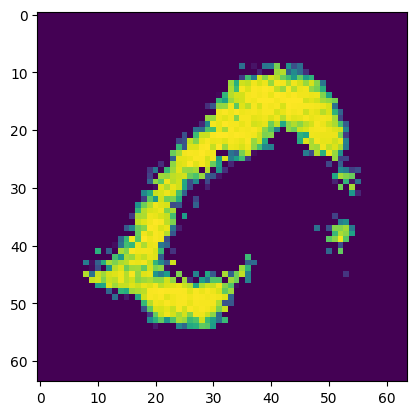

Epoch [32/50] Batch 200/938                   Loss D: -322798.8750, loss G: 149403.3125
tensor([4, 1, 6, 0, 0, 6, 0, 2, 0, 2, 4, 7, 3, 1, 4, 8, 7, 9, 6, 5, 0, 3, 0, 1,
        9, 4, 2, 1, 2, 4, 8, 2, 7, 7, 7, 0, 8, 5, 5, 5, 0, 2, 1, 6, 2, 2, 5, 7,
        4, 5, 9, 1, 9, 6, 0, 7, 3, 4, 4, 8, 1, 9, 6, 8], device='cuda:0')


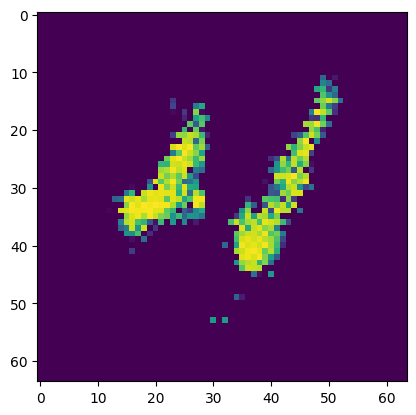

Epoch [32/50] Batch 300/938                   Loss D: 1566.3337, loss G: 149672.4688
tensor([3, 2, 2, 0, 1, 2, 1, 3, 6, 6, 5, 4, 8, 2, 2, 0, 5, 4, 2, 1, 0, 5, 2, 1,
        8, 6, 5, 1, 5, 6, 5, 8, 6, 7, 1, 6, 4, 4, 4, 9, 7, 6, 0, 1, 2, 6, 0, 5,
        7, 7, 1, 1, 9, 4, 7, 5, 2, 9, 7, 2, 2, 3, 4, 5], device='cuda:0')


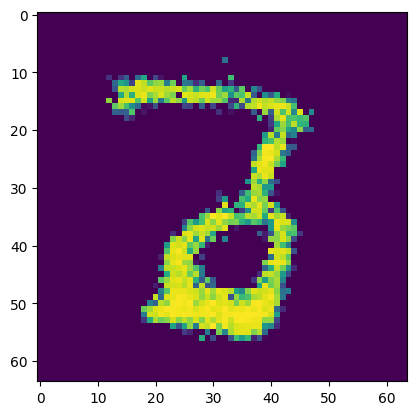

Epoch [32/50] Batch 400/938                   Loss D: -325840.6875, loss G: 151669.5938
tensor([0, 2, 4, 3, 1, 2, 3, 7, 8, 2, 8, 7, 9, 3, 9, 5, 0, 8, 3, 7, 3, 0, 9, 7,
        6, 6, 4, 5, 5, 3, 0, 1, 7, 0, 4, 8, 2, 1, 2, 5, 1, 5, 4, 6, 8, 2, 1, 6,
        4, 2, 1, 5, 1, 3, 1, 4, 4, 3, 2, 4, 6, 0, 5, 9], device='cuda:0')


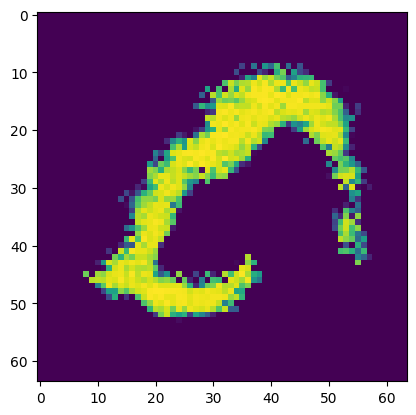

Epoch [32/50] Batch 500/938                   Loss D: -5137.0757, loss G: 152017.1406
tensor([5, 3, 2, 7, 8, 3, 7, 1, 4, 2, 4, 1, 0, 3, 3, 1, 1, 0, 1, 5, 5, 8, 8, 0,
        1, 6, 6, 5, 0, 7, 6, 1, 6, 3, 5, 4, 5, 3, 7, 6, 7, 0, 0, 7, 0, 6, 6, 7,
        7, 6, 4, 0, 3, 5, 5, 7, 7, 5, 1, 1, 8, 0, 7, 6], device='cuda:0')


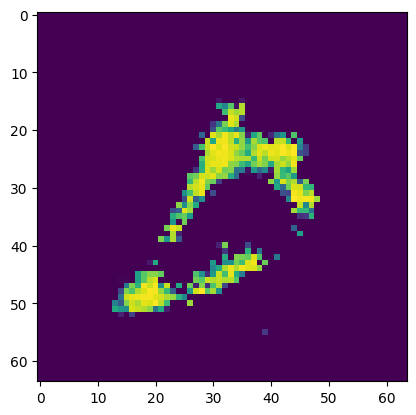

Epoch [32/50] Batch 600/938                   Loss D: -3117.2476, loss G: 152917.3750
tensor([8, 3, 7, 9, 4, 4, 4, 5, 8, 9, 1, 0, 1, 2, 8, 3, 1, 1, 4, 3, 9, 1, 9, 7,
        2, 7, 2, 8, 0, 1, 6, 0, 1, 7, 9, 6, 7, 0, 8, 5, 3, 3, 7, 6, 4, 3, 1, 7,
        9, 3, 0, 2, 6, 3, 1, 3, 1, 1, 1, 2, 0, 4, 8, 4], device='cuda:0')


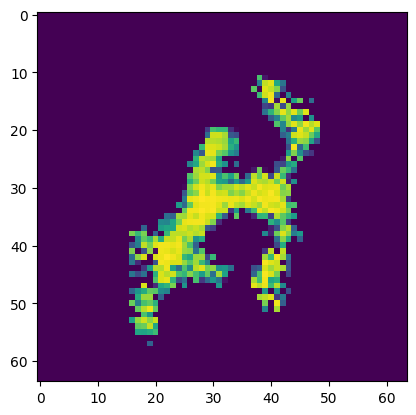

Epoch [32/50] Batch 700/938                   Loss D: -327106.2812, loss G: 154266.0312
tensor([1, 3, 4, 1, 5, 0, 1, 0, 8, 5, 7, 2, 4, 8, 7, 4, 5, 7, 1, 4, 0, 9, 5, 6,
        2, 9, 4, 0, 4, 5, 8, 3, 1, 2, 4, 7, 4, 0, 9, 0, 2, 3, 7, 8, 4, 2, 0, 7,
        0, 1, 8, 9, 2, 3, 4, 0, 3, 6, 7, 9, 7, 8, 2, 7], device='cuda:0')


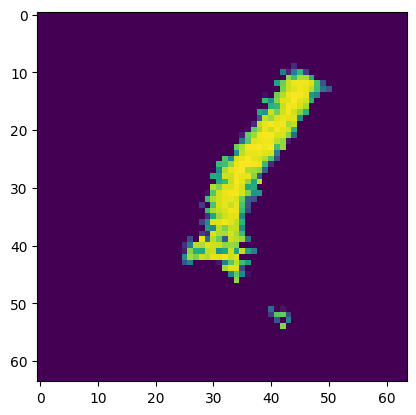

Epoch [32/50] Batch 800/938                   Loss D: -335615.0312, loss G: 156516.2500
tensor([2, 8, 2, 9, 1, 9, 1, 7, 0, 1, 7, 0, 1, 4, 8, 0, 3, 7, 9, 4, 5, 3, 5, 7,
        8, 7, 4, 1, 1, 5, 4, 5, 5, 5, 7, 1, 9, 9, 8, 5, 8, 9, 2, 4, 9, 7, 8, 4,
        8, 6, 1, 3, 1, 9, 3, 5, 2, 0, 4, 6, 2, 0, 7, 7], device='cuda:0')


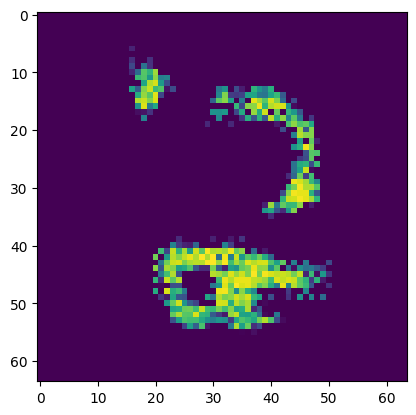

Epoch [32/50] Batch 900/938                   Loss D: -337047.7188, loss G: 157400.6250
tensor([0, 3, 8, 1, 6, 4, 3, 9, 2, 9, 7, 7, 1, 4, 8, 4, 5, 1, 1, 9, 1, 5, 7, 5,
        4, 7, 5, 8, 2, 8, 8, 5, 0, 3, 2, 1, 7, 7, 6, 7, 2, 5, 3, 2, 6, 7, 3, 2,
        4, 7, 7, 2, 8, 1, 8, 4, 6, 8, 3, 8, 4, 4, 2, 6], device='cuda:0')


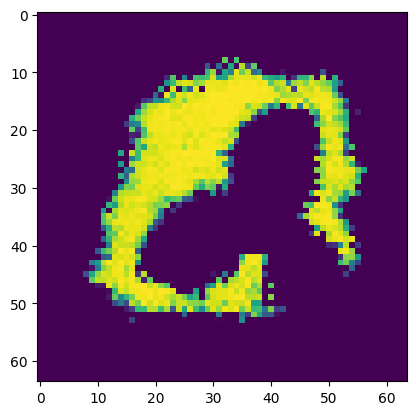

Epoch [33/50] Batch 100/938                   Loss D: -340133.1875, loss G: 158869.9375
tensor([7, 1, 7, 7, 9, 0, 5, 9, 1, 9, 9, 5, 3, 5, 2, 4, 9, 4, 0, 6, 3, 6, 7, 8,
        1, 7, 3, 7, 7, 1, 3, 1, 5, 7, 9, 0, 4, 6, 9, 1, 8, 8, 5, 7, 6, 4, 8, 6,
        3, 0, 6, 3, 7, 3, 4, 5, 9, 1, 3, 7, 6, 3, 3, 8], device='cuda:0')


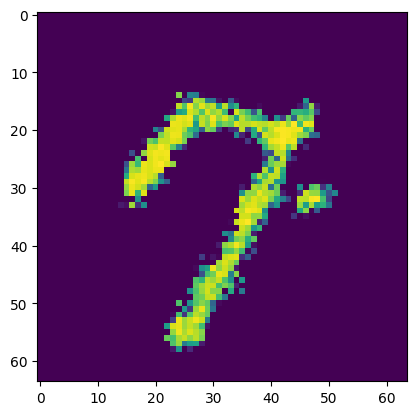

Epoch [33/50] Batch 200/938                   Loss D: -88953.3047, loss G: 160232.4688
tensor([4, 4, 0, 6, 5, 8, 4, 2, 0, 6, 7, 7, 7, 7, 4, 9, 5, 4, 9, 0, 7, 8, 7, 8,
        9, 9, 1, 6, 5, 6, 7, 0, 9, 2, 4, 8, 2, 6, 0, 7, 9, 1, 4, 6, 7, 7, 0, 3,
        1, 5, 7, 2, 5, 1, 5, 2, 2, 7, 7, 0, 5, 9, 0, 7], device='cuda:0')


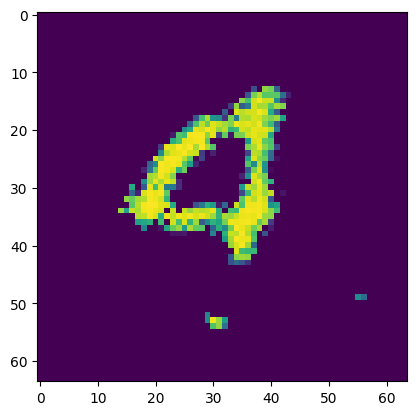

Epoch [33/50] Batch 300/938                   Loss D: -347598.3125, loss G: 162026.2812
tensor([1, 1, 5, 5, 4, 0, 9, 8, 0, 3, 5, 4, 5, 0, 7, 6, 2, 1, 0, 9, 0, 7, 0, 8,
        1, 3, 9, 4, 1, 8, 9, 2, 1, 9, 5, 6, 1, 1, 5, 0, 4, 7, 5, 6, 9, 9, 4, 9,
        9, 5, 9, 0, 7, 2, 5, 9, 6, 2, 7, 7, 9, 1, 1, 8], device='cuda:0')


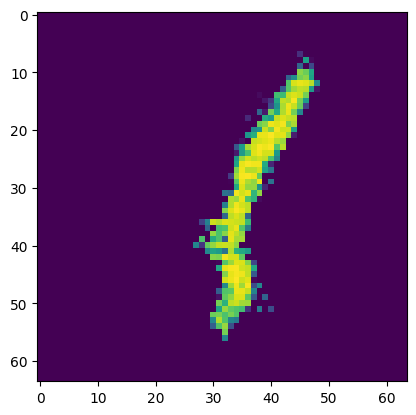

Epoch [33/50] Batch 400/938                   Loss D: -387.5614, loss G: 161606.1875
tensor([7, 6, 6, 8, 1, 7, 6, 0, 2, 0, 8, 9, 0, 5, 3, 6, 0, 1, 7, 6, 8, 6, 7, 5,
        5, 1, 5, 4, 8, 7, 4, 2, 6, 3, 4, 0, 5, 2, 8, 4, 7, 4, 5, 3, 1, 3, 7, 3,
        3, 9, 4, 7, 8, 9, 6, 9, 2, 5, 0, 4, 4, 6, 1, 1], device='cuda:0')


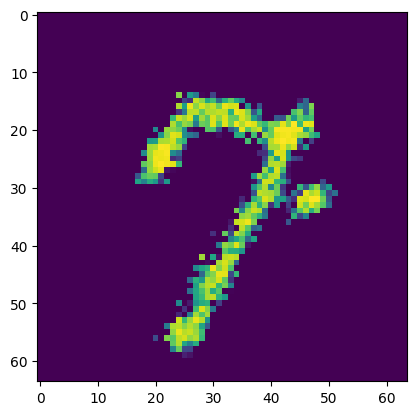

Epoch [33/50] Batch 500/938                   Loss D: -346386.0938, loss G: 163030.8750
tensor([9, 1, 7, 9, 7, 6, 4, 1, 2, 2, 0, 8, 2, 2, 9, 8, 9, 5, 1, 9, 4, 5, 4, 5,
        7, 0, 8, 2, 7, 2, 9, 2, 1, 0, 3, 4, 9, 0, 5, 8, 4, 7, 9, 4, 7, 3, 5, 9,
        8, 2, 6, 0, 3, 1, 4, 5, 8, 9, 1, 0, 5, 6, 4, 8], device='cuda:0')


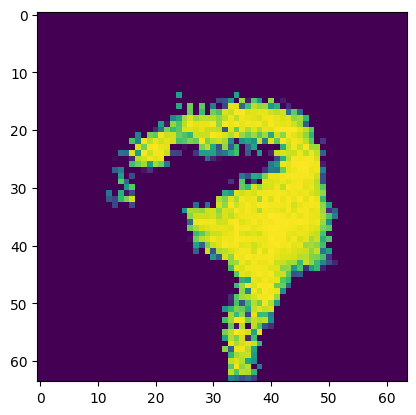

Epoch [33/50] Batch 600/938                   Loss D: -328142.6250, loss G: 162817.6875
tensor([9, 4, 2, 5, 6, 6, 7, 6, 4, 8, 1, 3, 7, 8, 3, 0, 7, 2, 0, 5, 5, 5, 6, 3,
        4, 0, 3, 2, 7, 9, 1, 7, 1, 6, 8, 4, 3, 4, 7, 2, 0, 9, 3, 8, 5, 1, 3, 0,
        1, 1, 9, 3, 3, 8, 6, 8, 7, 7, 2, 1, 2, 1, 2, 0], device='cuda:0')


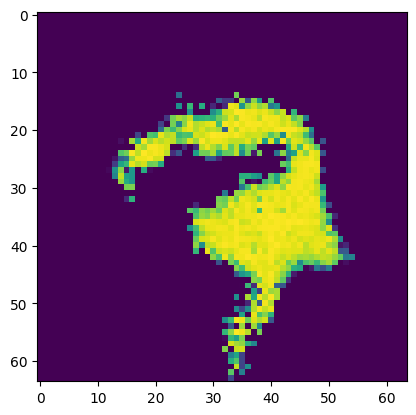

Epoch [33/50] Batch 700/938                   Loss D: -359660.0938, loss G: 166886.7656
tensor([2, 6, 8, 5, 0, 2, 6, 5, 1, 3, 6, 1, 4, 4, 0, 1, 2, 3, 4, 4, 5, 6, 0, 4,
        7, 2, 4, 4, 0, 2, 9, 1, 4, 4, 5, 7, 0, 0, 0, 8, 0, 8, 6, 1, 7, 0, 1, 7,
        7, 7, 9, 0, 6, 3, 9, 6, 9, 8, 9, 5, 5, 5, 9, 9], device='cuda:0')


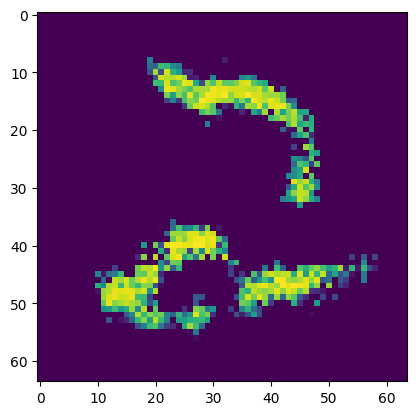

Epoch [33/50] Batch 800/938                   Loss D: -336112.2812, loss G: 163155.5938
tensor([6, 1, 7, 5, 4, 4, 4, 0, 2, 2, 6, 7, 8, 9, 6, 6, 6, 4, 5, 7, 6, 2, 9, 2,
        3, 6, 0, 1, 1, 0, 2, 5, 6, 5, 1, 5, 7, 9, 5, 3, 8, 7, 4, 3, 4, 6, 8, 3,
        3, 1, 2, 8, 0, 1, 5, 0, 6, 6, 9, 7, 4, 1, 1, 9], device='cuda:0')


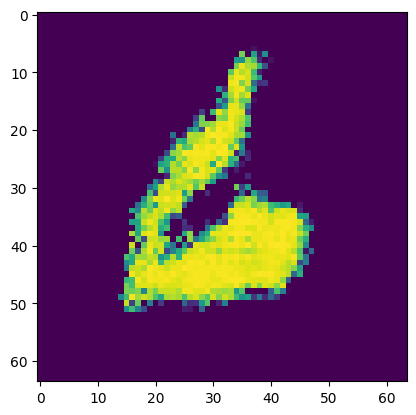

Epoch [33/50] Batch 900/938                   Loss D: 541.1742, loss G: 167144.0625
tensor([9, 7, 5, 9, 3, 9, 9, 7, 5, 9, 3, 9, 0, 1, 3, 0, 1, 4, 0, 3, 2, 6, 1, 7,
        0, 6, 1, 3, 0, 3, 4, 7, 0, 2, 3, 7, 6, 7, 1, 6, 2, 0, 8, 1, 1, 7, 9, 5,
        5, 0, 9, 9, 7, 9, 2, 5, 2, 1, 2, 9, 1, 5, 3, 1], device='cuda:0')


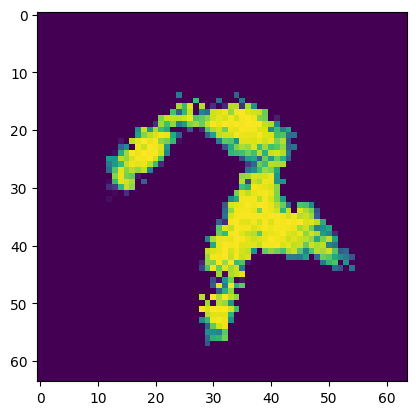

Epoch [34/50] Batch 100/938                   Loss D: -357665.0625, loss G: 168818.3750
tensor([9, 7, 9, 2, 1, 8, 5, 4, 2, 0, 7, 7, 2, 6, 5, 0, 2, 4, 9, 2, 4, 9, 2, 0,
        3, 8, 1, 8, 2, 2, 4, 2, 9, 6, 6, 1, 6, 1, 4, 1, 3, 6, 1, 6, 1, 3, 6, 8,
        9, 0, 4, 3, 7, 2, 6, 9, 2, 0, 1, 8, 0, 9, 5, 0], device='cuda:0')


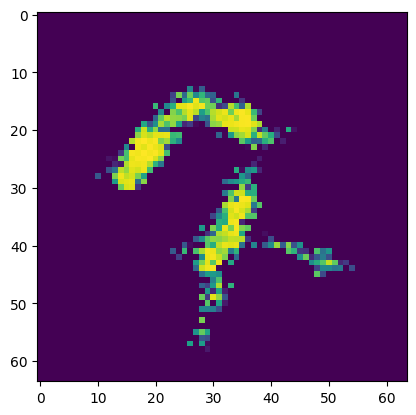

Epoch [34/50] Batch 200/938                   Loss D: -364225.5000, loss G: 170539.7188
tensor([3, 3, 4, 4, 1, 6, 7, 3, 6, 6, 4, 7, 1, 1, 9, 0, 9, 7, 6, 5, 1, 1, 6, 1,
        8, 6, 1, 0, 5, 1, 7, 3, 0, 2, 8, 3, 3, 2, 5, 5, 7, 7, 2, 1, 2, 5, 7, 1,
        3, 2, 4, 7, 2, 0, 2, 8, 2, 0, 5, 7, 9, 7, 9, 1], device='cuda:0')


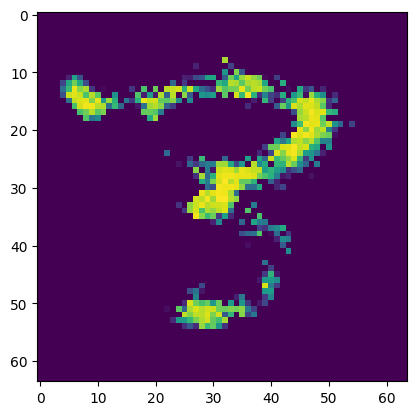

Epoch [34/50] Batch 300/938                   Loss D: -340497.6562, loss G: 162663.9688
tensor([7, 6, 3, 7, 7, 5, 1, 9, 3, 8, 4, 0, 3, 7, 0, 2, 5, 6, 0, 2, 5, 6, 6, 2,
        7, 4, 8, 5, 3, 6, 9, 6, 0, 9, 3, 2, 4, 5, 4, 6, 2, 7, 0, 7, 1, 0, 5, 4,
        6, 3, 7, 3, 2, 8, 7, 7, 9, 5, 2, 8, 6, 2, 7, 2], device='cuda:0')


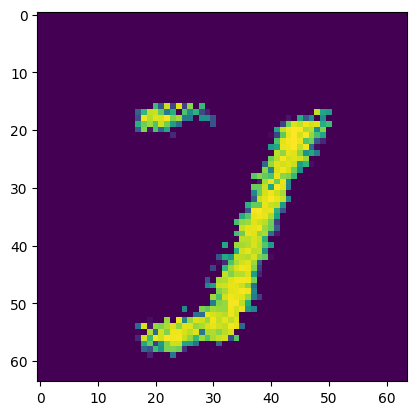

Epoch [34/50] Batch 400/938                   Loss D: 1347.3347, loss G: 173133.2500
tensor([0, 6, 5, 4, 2, 4, 1, 3, 9, 1, 1, 8, 7, 6, 4, 2, 4, 0, 1, 0, 2, 9, 0, 8,
        1, 1, 8, 9, 4, 2, 8, 2, 1, 1, 5, 2, 1, 3, 1, 2, 2, 3, 3, 2, 2, 1, 1, 1,
        2, 1, 1, 3, 0, 7, 7, 7, 9, 5, 2, 7, 1, 7, 5, 4], device='cuda:0')


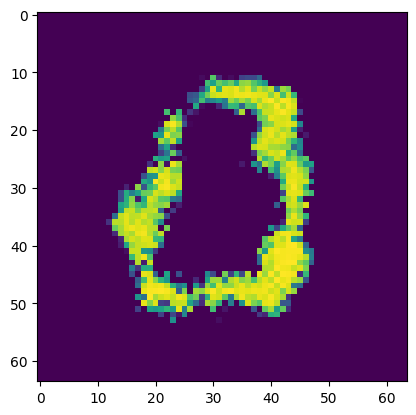

Epoch [34/50] Batch 500/938                   Loss D: -368975.8438, loss G: 173798.7031
tensor([9, 9, 7, 1, 8, 2, 9, 5, 9, 8, 5, 8, 4, 9, 0, 5, 8, 0, 9, 0, 2, 4, 0, 8,
        7, 5, 0, 4, 1, 2, 7, 6, 3, 1, 6, 5, 3, 2, 6, 8, 0, 2, 5, 1, 5, 7, 0, 4,
        3, 7, 3, 8, 4, 7, 0, 3, 9, 1, 1, 1, 8, 9, 8, 2], device='cuda:0')


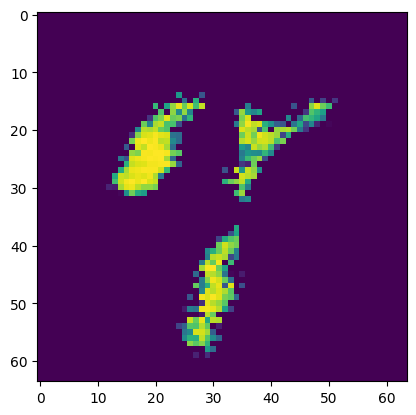

Epoch [34/50] Batch 600/938                   Loss D: -366746.7188, loss G: 174219.0000
tensor([6, 1, 8, 1, 2, 5, 4, 0, 5, 0, 5, 7, 9, 7, 5, 2, 3, 9, 2, 3, 3, 3, 8, 1,
        0, 8, 3, 2, 1, 9, 2, 4, 0, 1, 6, 0, 4, 5, 2, 3, 9, 7, 6, 8, 3, 1, 8, 5,
        6, 6, 3, 1, 1, 7, 5, 9, 4, 5, 1, 9, 0, 7, 3, 7], device='cuda:0')


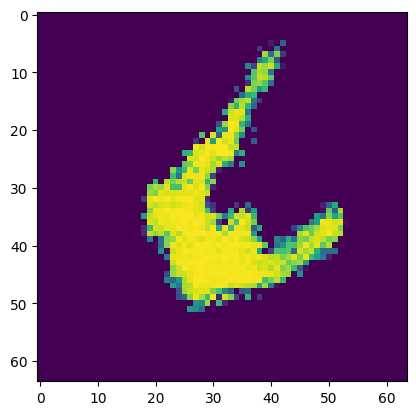

Epoch [34/50] Batch 700/938                   Loss D: -348665.3125, loss G: 169847.4688
tensor([5, 3, 8, 9, 4, 1, 3, 1, 2, 1, 6, 1, 1, 8, 1, 4, 3, 4, 7, 2, 2, 0, 3, 3,
        2, 4, 8, 9, 2, 1, 5, 9, 0, 0, 5, 0, 5, 7, 6, 7, 1, 3, 6, 8, 6, 2, 2, 5,
        2, 7, 7, 1, 2, 8, 3, 1, 2, 9, 7, 6, 2, 5, 4, 8], device='cuda:0')


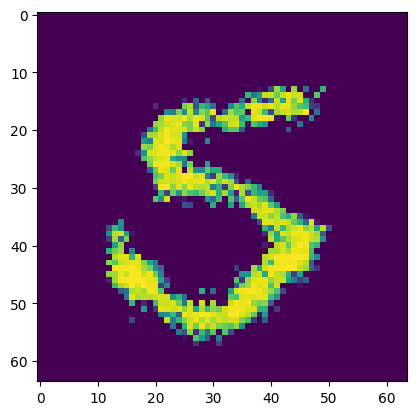

Epoch [34/50] Batch 800/938                   Loss D: -379665.7188, loss G: 177446.1719
tensor([9, 6, 2, 5, 2, 5, 3, 4, 4, 6, 2, 7, 0, 6, 6, 7, 7, 6, 5, 3, 8, 3, 1, 1,
        5, 2, 6, 3, 4, 2, 1, 8, 0, 1, 3, 0, 8, 9, 3, 9, 0, 2, 0, 7, 9, 2, 8, 1,
        6, 1, 5, 4, 2, 2, 7, 4, 9, 8, 4, 9, 1, 4, 3, 8], device='cuda:0')


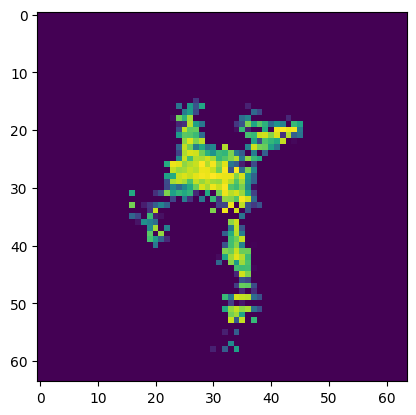

Epoch [34/50] Batch 900/938                   Loss D: -357843.0312, loss G: 172013.7500
tensor([9, 4, 3, 4, 8, 2, 8, 8, 9, 6, 9, 0, 5, 3, 7, 6, 4, 7, 2, 4, 5, 8, 9, 9,
        1, 5, 0, 9, 5, 3, 7, 4, 9, 7, 2, 4, 7, 1, 3, 2, 0, 5, 6, 2, 9, 2, 8, 4,
        0, 8, 1, 6, 7, 9, 9, 1, 6, 5, 2, 3, 3, 5, 2, 4], device='cuda:0')


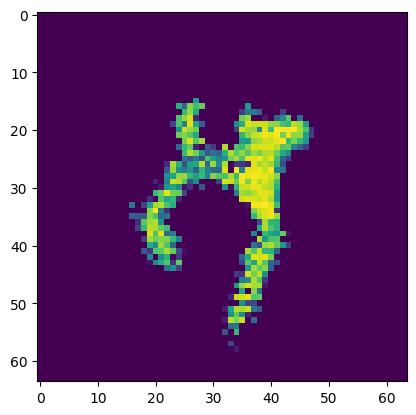

Epoch [35/50] Batch 100/938                   Loss D: -379653.6875, loss G: 179763.4375
tensor([9, 5, 2, 9, 3, 8, 7, 6, 8, 4, 8, 6, 7, 5, 1, 1, 4, 0, 3, 2, 5, 5, 1, 3,
        5, 1, 7, 3, 3, 4, 8, 5, 9, 3, 2, 5, 6, 8, 1, 2, 8, 6, 1, 5, 6, 8, 3, 7,
        0, 9, 2, 2, 1, 1, 5, 3, 0, 0, 8, 7, 8, 9, 3, 3], device='cuda:0')


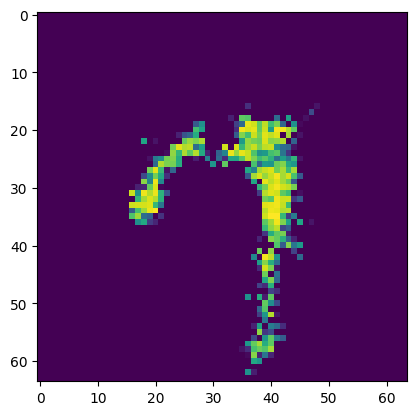

Epoch [35/50] Batch 200/938                   Loss D: -391873.6250, loss G: 181997.8281
tensor([0, 0, 5, 1, 6, 8, 8, 2, 4, 1, 8, 1, 7, 4, 5, 1, 0, 8, 8, 6, 2, 1, 9, 8,
        4, 8, 0, 6, 9, 8, 3, 2, 8, 5, 2, 5, 4, 1, 9, 3, 2, 9, 1, 4, 1, 6, 6, 8,
        1, 4, 0, 8, 2, 8, 1, 0, 9, 9, 9, 5, 1, 2, 1, 4], device='cuda:0')


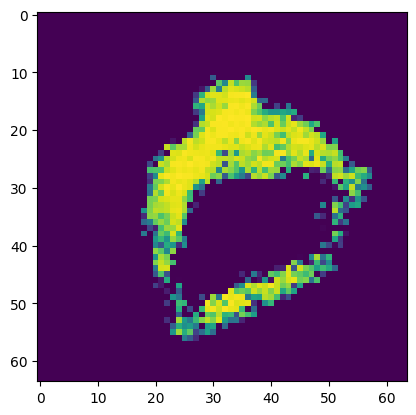

Epoch [35/50] Batch 300/938                   Loss D: -396454.6875, loss G: 183950.4688
tensor([6, 0, 8, 1, 8, 6, 3, 8, 9, 6, 0, 9, 2, 0, 2, 1, 8, 5, 8, 8, 3, 7, 1, 1,
        2, 5, 8, 3, 2, 5, 8, 3, 9, 2, 5, 0, 5, 8, 9, 4, 6, 8, 6, 7, 2, 4, 5, 0,
        6, 3, 9, 9, 7, 0, 5, 8, 8, 7, 1, 5, 3, 6, 0, 4], device='cuda:0')


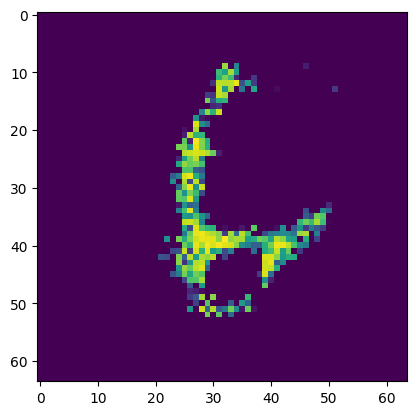

Epoch [35/50] Batch 400/938                   Loss D: -389582.1562, loss G: 184171.0000
tensor([9, 6, 6, 7, 2, 8, 5, 8, 0, 5, 5, 9, 4, 7, 9, 4, 8, 8, 2, 1, 5, 1, 7, 6,
        3, 9, 2, 4, 2, 2, 9, 1, 0, 5, 1, 9, 0, 4, 5, 4, 7, 8, 2, 8, 4, 7, 1, 4,
        2, 0, 9, 1, 8, 7, 4, 2, 8, 3, 8, 2, 7, 9, 7, 0], device='cuda:0')


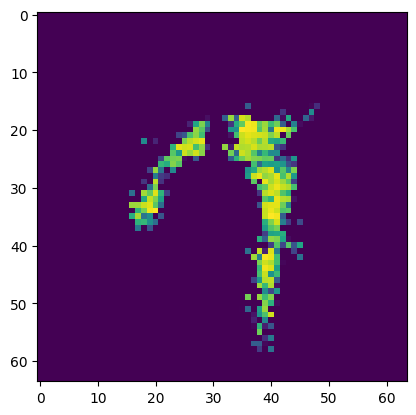

Epoch [35/50] Batch 500/938                   Loss D: -401320.5312, loss G: 186382.2812
tensor([1, 9, 9, 3, 5, 3, 3, 2, 5, 9, 2, 9, 7, 1, 1, 8, 3, 1, 9, 8, 6, 0, 7, 0,
        5, 5, 2, 2, 2, 7, 9, 3, 5, 8, 9, 2, 6, 3, 0, 2, 4, 1, 3, 5, 4, 5, 8, 3,
        1, 6, 2, 6, 2, 0, 6, 3, 8, 3, 8, 7, 2, 7, 1, 2], device='cuda:0')


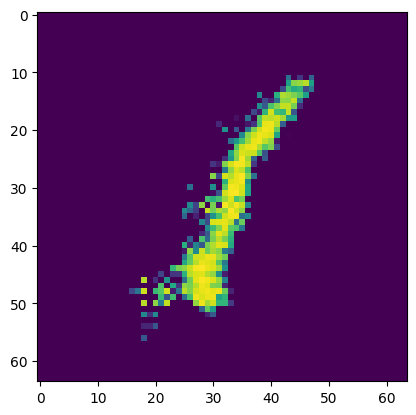

Epoch [35/50] Batch 600/938                   Loss D: -396129.7500, loss G: 186660.4375
tensor([6, 8, 3, 7, 2, 5, 8, 9, 7, 3, 3, 6, 8, 5, 8, 4, 5, 5, 0, 4, 9, 4, 5, 3,
        5, 7, 1, 1, 4, 6, 7, 8, 0, 6, 4, 0, 0, 1, 5, 5, 9, 4, 3, 7, 3, 9, 2, 1,
        1, 5, 7, 4, 6, 6, 1, 7, 7, 8, 4, 7, 2, 8, 4, 5], device='cuda:0')


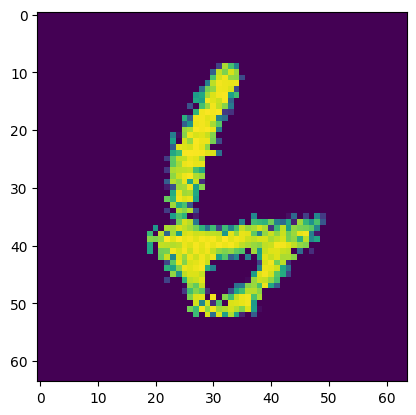

Epoch [35/50] Batch 700/938                   Loss D: -392765.2500, loss G: 185818.0938
tensor([7, 1, 7, 4, 6, 8, 5, 9, 7, 0, 1, 0, 3, 0, 8, 2, 9, 2, 3, 3, 7, 0, 0, 6,
        9, 5, 9, 2, 8, 5, 2, 6, 2, 1, 2, 0, 8, 0, 8, 8, 7, 9, 6, 5, 0, 8, 6, 3,
        8, 4, 0, 5, 6, 4, 4, 8, 7, 1, 0, 9, 4, 0, 4, 1], device='cuda:0')


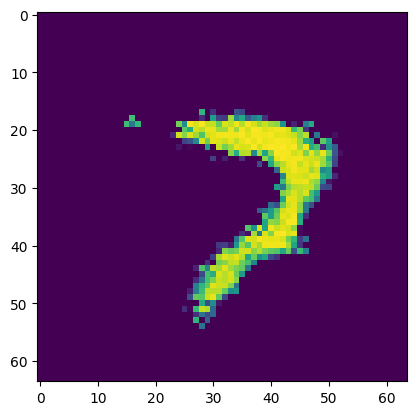

Epoch [35/50] Batch 800/938                   Loss D: -181.1663, loss G: -210797.5625
tensor([7, 3, 5, 7, 0, 1, 9, 4, 2, 9, 9, 0, 4, 2, 2, 6, 1, 6, 5, 2, 7, 5, 8, 9,
        2, 2, 3, 6, 2, 8, 5, 4, 4, 9, 6, 6, 0, 2, 5, 2, 9, 3, 1, 3, 1, 0, 9, 9,
        8, 4, 6, 9, 4, 7, 3, 9, 9, 1, 8, 8, 5, 8, 7, 2], device='cuda:0')


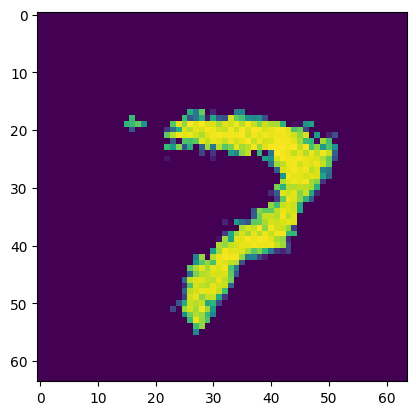

Epoch [35/50] Batch 900/938                   Loss D: -397878.8750, loss G: 187886.9062
tensor([2, 0, 3, 1, 4, 9, 4, 8, 7, 7, 7, 8, 1, 1, 1, 1, 9, 3, 2, 4, 4, 0, 7, 6,
        0, 8, 0, 5, 7, 1, 9, 4, 7, 5, 5, 0, 8, 4, 8, 6, 6, 2, 9, 8, 5, 6, 6, 9,
        7, 3, 9, 1, 2, 1, 5, 3, 0, 8, 1, 0, 1, 2, 6, 4], device='cuda:0')


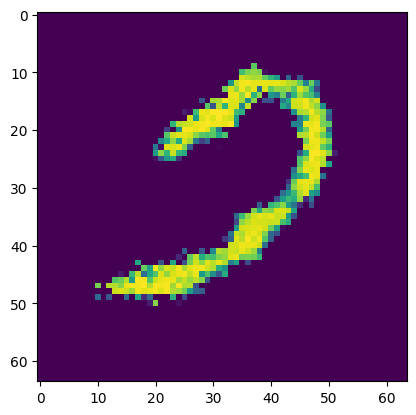

Epoch [36/50] Batch 100/938                   Loss D: -416136.9375, loss G: 193468.2188
tensor([6, 6, 1, 0, 8, 1, 9, 3, 1, 3, 4, 8, 9, 0, 6, 5, 6, 4, 5, 5, 3, 3, 3, 3,
        6, 7, 4, 9, 7, 6, 8, 3, 9, 1, 4, 6, 2, 7, 7, 4, 9, 5, 6, 9, 8, 8, 8, 8,
        8, 8, 6, 4, 3, 3, 4, 6, 2, 3, 7, 3, 6, 9, 6, 2], device='cuda:0')


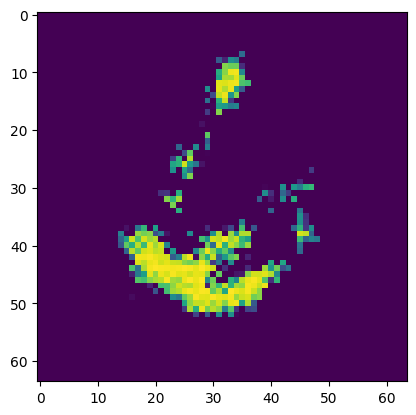

Epoch [36/50] Batch 200/938                   Loss D: -370.9331, loss G: 193108.8594
tensor([5, 0, 4, 6, 2, 8, 8, 3, 1, 6, 4, 8, 6, 0, 9, 2, 1, 0, 8, 0, 6, 3, 8, 2,
        0, 8, 3, 7, 5, 1, 4, 2, 3, 9, 6, 0, 6, 8, 2, 6, 9, 3, 7, 4, 3, 2, 1, 5,
        8, 6, 6, 9, 7, 6, 4, 5, 8, 2, 2, 9, 1, 6, 3, 1], device='cuda:0')


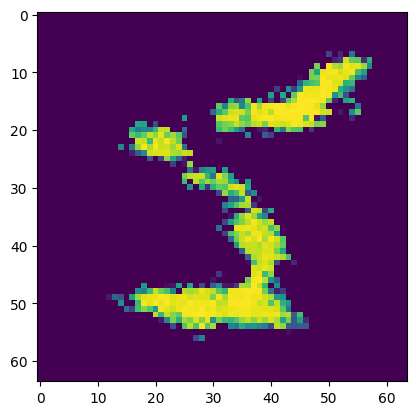

Epoch [36/50] Batch 300/938                   Loss D: -418871.0625, loss G: 196276.0000
tensor([0, 8, 8, 2, 2, 5, 1, 7, 8, 6, 6, 5, 0, 0, 2, 9, 6, 4, 9, 4, 7, 1, 0, 6,
        1, 8, 6, 3, 0, 6, 0, 7, 2, 1, 0, 7, 1, 9, 5, 1, 3, 6, 3, 7, 0, 0, 4, 9,
        5, 9, 1, 6, 3, 1, 4, 0, 4, 2, 2, 4, 1, 6, 8, 9], device='cuda:0')


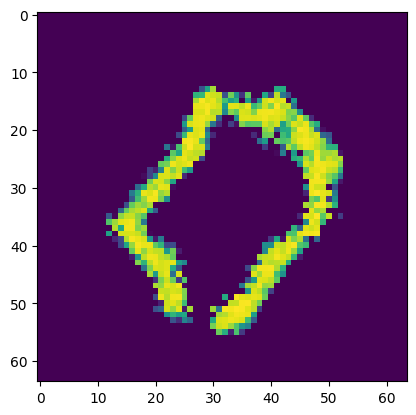

Epoch [36/50] Batch 400/938                   Loss D: -424722.6562, loss G: 197722.9688
tensor([0, 1, 1, 0, 9, 5, 9, 1, 3, 3, 3, 0, 3, 4, 3, 8, 9, 2, 6, 9, 7, 1, 3, 1,
        8, 2, 9, 0, 5, 6, 1, 8, 1, 4, 7, 1, 1, 2, 9, 1, 5, 1, 0, 2, 0, 2, 3, 6,
        5, 2, 9, 9, 5, 8, 1, 8, 1, 3, 0, 7, 9, 1, 3, 3], device='cuda:0')


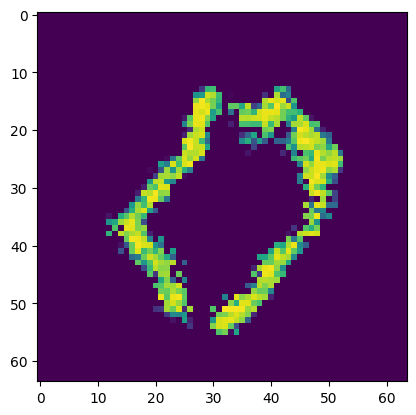

Epoch [36/50] Batch 500/938                   Loss D: -19016.9922, loss G: 151182.3594
tensor([0, 9, 4, 9, 0, 9, 4, 7, 9, 1, 1, 7, 5, 2, 4, 8, 4, 6, 6, 5, 4, 1, 0, 6,
        9, 3, 5, 3, 5, 0, 0, 8, 4, 9, 8, 9, 2, 9, 9, 6, 5, 7, 2, 0, 4, 8, 0, 2,
        2, 8, 9, 9, 0, 8, 1, 0, 7, 1, 4, 5, 5, 0, 4, 9], device='cuda:0')


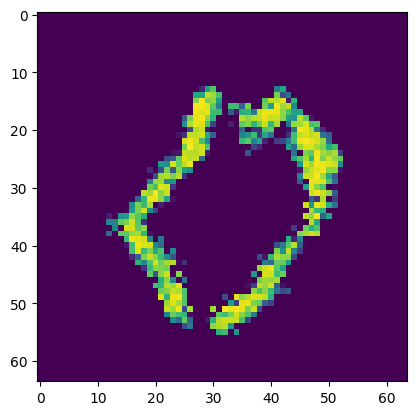

Epoch [36/50] Batch 600/938                   Loss D: -424857.2812, loss G: 200175.5625
tensor([8, 8, 8, 0, 0, 4, 8, 7, 7, 6, 9, 7, 0, 9, 0, 0, 1, 7, 5, 8, 4, 3, 3, 9,
        7, 9, 0, 1, 7, 6, 8, 8, 0, 6, 9, 9, 7, 5, 4, 3, 3, 4, 6, 5, 9, 8, 9, 3,
        3, 6, 7, 6, 0, 6, 1, 2, 9, 0, 6, 5, 5, 9, 1, 4], device='cuda:0')


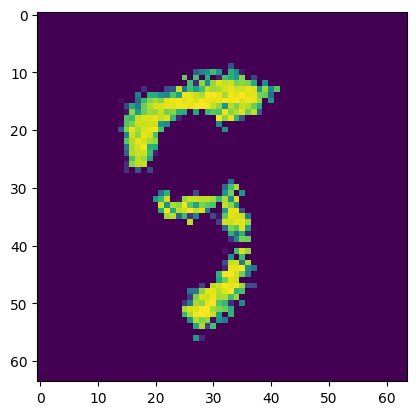

Epoch [36/50] Batch 700/938                   Loss D: -406710.8438, loss G: 190054.0781
tensor([5, 6, 1, 4, 3, 2, 0, 7, 8, 0, 7, 1, 7, 7, 7, 8, 6, 3, 2, 6, 2, 1, 3, 3,
        5, 0, 0, 6, 1, 4, 7, 2, 4, 6, 1, 4, 0, 3, 8, 5, 1, 1, 7, 3, 3, 0, 5, 6,
        8, 0, 3, 1, 7, 1, 3, 4, 4, 9, 1, 6, 6, 8, 2, 2], device='cuda:0')


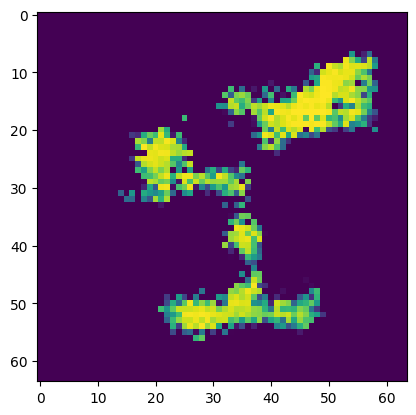

Epoch [36/50] Batch 800/938                   Loss D: -403971.9375, loss G: 197894.2656
tensor([7, 1, 2, 2, 6, 7, 9, 3, 8, 7, 1, 2, 1, 8, 9, 0, 8, 9, 7, 7, 8, 9, 8, 9,
        9, 2, 2, 7, 0, 8, 8, 2, 7, 3, 3, 5, 3, 9, 3, 8, 1, 4, 2, 6, 6, 6, 2, 2,
        1, 2, 9, 9, 1, 5, 0, 2, 9, 9, 0, 0, 6, 3, 9, 0], device='cuda:0')


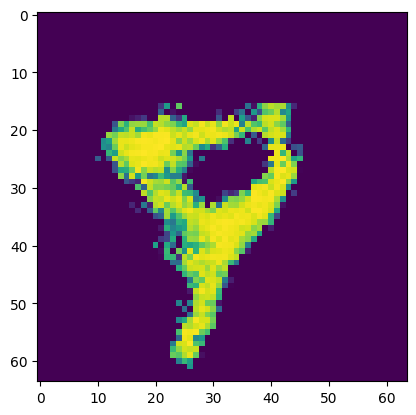

Epoch [36/50] Batch 900/938                   Loss D: -434324.8438, loss G: 204758.4375
tensor([3, 1, 3, 0, 2, 6, 9, 8, 3, 4, 5, 4, 4, 9, 7, 6, 3, 9, 8, 6, 5, 3, 8, 3,
        7, 2, 5, 1, 9, 7, 0, 1, 5, 9, 8, 0, 5, 2, 8, 0, 9, 6, 5, 8, 7, 4, 9, 1,
        4, 2, 8, 5, 0, 6, 7, 0, 1, 3, 6, 0, 1, 8, 2, 9], device='cuda:0')


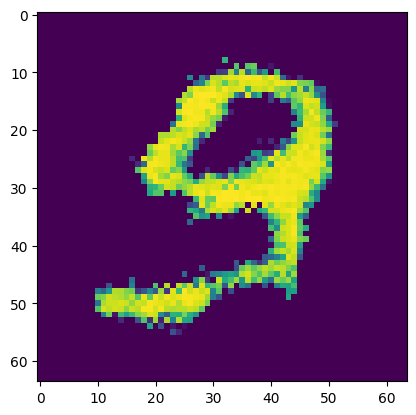

Epoch [37/50] Batch 100/938                   Loss D: -433789.6875, loss G: 204199.8125
tensor([4, 3, 7, 2, 7, 0, 7, 2, 0, 3, 2, 9, 8, 0, 0, 8, 9, 6, 7, 8, 4, 3, 2, 6,
        0, 0, 8, 6, 6, 4, 0, 9, 7, 4, 3, 5, 2, 4, 3, 1, 7, 9, 3, 3, 2, 4, 4, 4,
        2, 3, 7, 6, 7, 6, 1, 4, 6, 4, 4, 8, 0, 3, 5, 9], device='cuda:0')


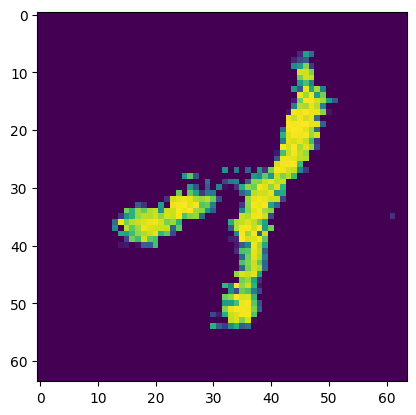

Epoch [37/50] Batch 200/938                   Loss D: -445837.8125, loss G: 208018.2812
tensor([6, 7, 4, 1, 5, 0, 4, 1, 3, 7, 8, 5, 8, 8, 0, 1, 2, 9, 7, 4, 0, 3, 9, 2,
        8, 4, 5, 3, 0, 2, 1, 9, 6, 1, 1, 6, 5, 2, 4, 5, 9, 4, 2, 8, 5, 1, 0, 7,
        4, 6, 1, 2, 5, 8, 2, 4, 0, 1, 7, 2, 2, 3, 0, 9], device='cuda:0')


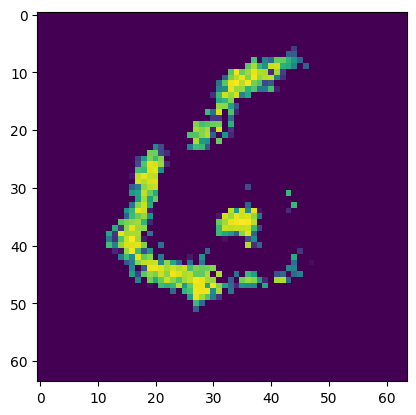

Epoch [37/50] Batch 300/938                   Loss D: -445088.8438, loss G: 209816.6719
tensor([2, 6, 5, 1, 5, 9, 8, 4, 2, 0, 1, 4, 8, 2, 2, 5, 4, 4, 3, 8, 8, 7, 2, 2,
        1, 6, 3, 2, 0, 7, 5, 8, 5, 5, 9, 7, 7, 4, 7, 4, 7, 6, 1, 2, 5, 2, 1, 7,
        3, 6, 6, 8, 9, 8, 6, 5, 1, 2, 8, 3, 6, 8, 9, 9], device='cuda:0')


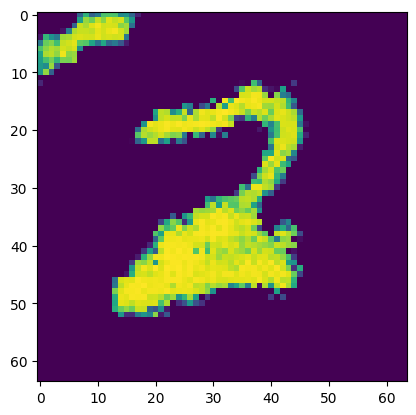

Epoch [37/50] Batch 400/938                   Loss D: -450538.3750, loss G: 211086.8125
tensor([1, 9, 0, 8, 4, 1, 3, 2, 7, 0, 6, 1, 5, 8, 4, 9, 8, 6, 1, 8, 0, 1, 4, 7,
        7, 9, 5, 8, 9, 7, 7, 2, 2, 7, 5, 2, 3, 2, 6, 4, 9, 5, 2, 4, 3, 2, 7, 1,
        6, 0, 0, 5, 3, 9, 3, 8, 3, 1, 8, 4, 0, 9, 0, 5], device='cuda:0')


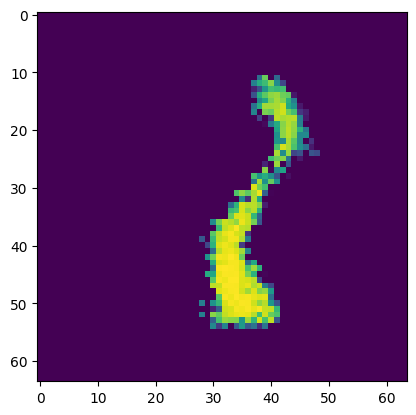

Epoch [37/50] Batch 500/938                   Loss D: -453949.1562, loss G: 213023.0156
tensor([0, 8, 6, 7, 4, 1, 0, 6, 7, 4, 5, 7, 9, 8, 5, 7, 8, 4, 4, 1, 3, 0, 5, 1,
        7, 7, 0, 9, 3, 3, 4, 2, 5, 3, 8, 1, 6, 1, 1, 0, 3, 9, 7, 2, 3, 5, 6, 5,
        0, 2, 3, 0, 3, 0, 9, 6, 2, 4, 4, 1, 4, 9, 7, 4], device='cuda:0')


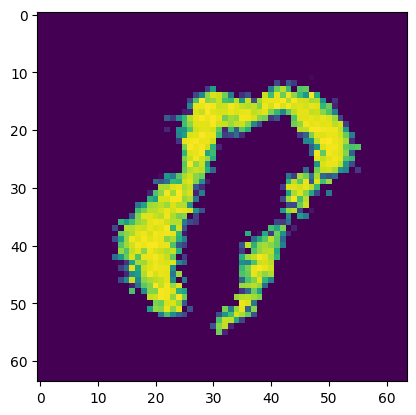

Epoch [37/50] Batch 600/938                   Loss D: -456700.9375, loss G: 214846.9219
tensor([5, 5, 2, 9, 7, 1, 6, 5, 2, 8, 2, 8, 9, 3, 8, 0, 3, 5, 6, 4, 1, 6, 7, 8,
        8, 5, 4, 4, 5, 7, 1, 8, 3, 3, 5, 9, 9, 6, 8, 5, 4, 9, 4, 1, 0, 8, 9, 1,
        1, 0, 3, 4, 5, 0, 1, 5, 3, 1, 0, 5, 9, 5, 1, 9], device='cuda:0')


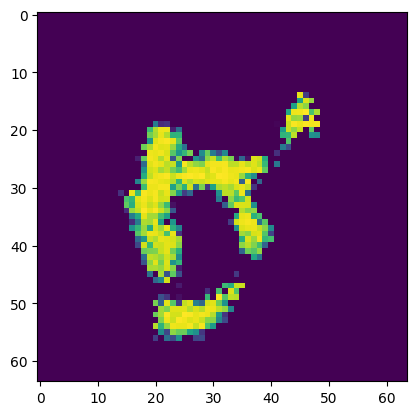

Epoch [37/50] Batch 700/938                   Loss D: -433337.4062, loss G: 211912.1875
tensor([5, 0, 4, 5, 0, 4, 0, 6, 7, 2, 5, 0, 9, 7, 4, 3, 3, 3, 0, 9, 6, 7, 8, 6,
        1, 2, 3, 8, 0, 3, 6, 9, 9, 8, 8, 8, 5, 6, 4, 5, 0, 5, 1, 0, 1, 6, 0, 8,
        7, 5, 8, 3, 4, 9, 2, 2, 7, 3, 5, 3, 3, 8, 5, 3], device='cuda:0')


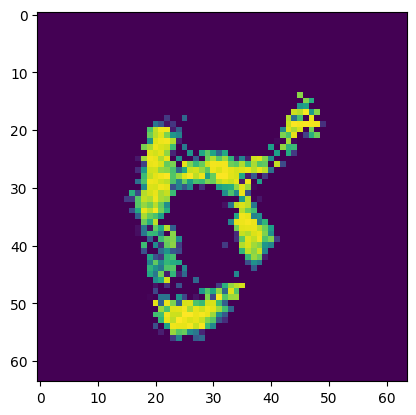

Epoch [37/50] Batch 800/938                   Loss D: -448095.1875, loss G: 214271.1406
tensor([1, 0, 3, 5, 6, 4, 5, 6, 0, 6, 8, 5, 1, 3, 2, 2, 1, 7, 9, 8, 9, 8, 8, 8,
        0, 1, 9, 2, 7, 3, 2, 2, 3, 9, 2, 3, 0, 1, 1, 1, 5, 5, 7, 2, 5, 3, 8, 9,
        6, 1, 4, 0, 4, 7, 7, 7, 1, 6, 0, 1, 3, 8, 8, 5], device='cuda:0')


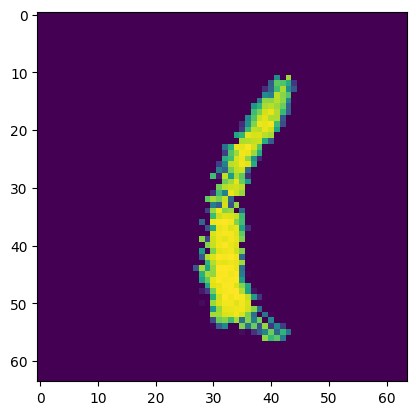

Epoch [37/50] Batch 900/938                   Loss D: -463089.8750, loss G: 218057.3438
tensor([8, 6, 5, 0, 1, 0, 9, 3, 5, 6, 6, 4, 3, 5, 3, 1, 2, 9, 7, 5, 3, 9, 5, 0,
        0, 8, 6, 3, 9, 7, 2, 8, 5, 3, 8, 1, 6, 5, 3, 3, 7, 7, 0, 9, 8, 2, 7, 7,
        9, 8, 6, 3, 1, 8, 9, 5, 9, 0, 6, 1, 2, 7, 0, 1], device='cuda:0')


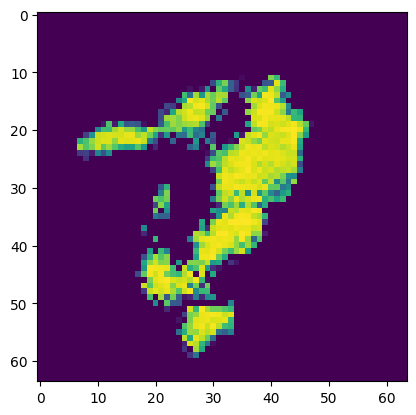

Epoch [38/50] Batch 100/938                   Loss D: -463896.3750, loss G: 218515.1719
tensor([1, 7, 7, 1, 7, 7, 6, 2, 3, 8, 0, 0, 1, 5, 6, 4, 4, 5, 1, 1, 1, 5, 7, 0,
        1, 6, 8, 6, 2, 9, 1, 1, 9, 0, 1, 7, 5, 5, 1, 7, 6, 5, 2, 5, 8, 2, 7, 1,
        7, 5, 3, 1, 8, 8, 4, 0, 9, 8, 3, 8, 5, 2, 2, 3], device='cuda:0')


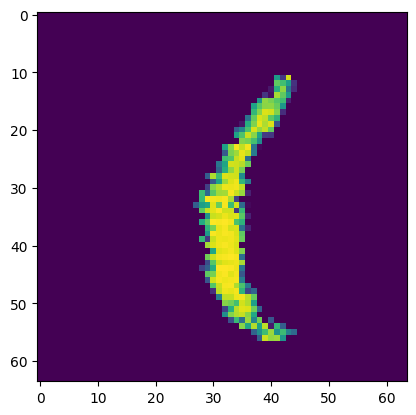

Epoch [38/50] Batch 200/938                   Loss D: -470542.0312, loss G: 220718.4375
tensor([7, 1, 2, 1, 3, 9, 7, 7, 6, 7, 5, 9, 6, 4, 6, 5, 9, 3, 3, 7, 1, 5, 6, 7,
        7, 6, 6, 9, 9, 2, 0, 6, 4, 5, 6, 7, 5, 0, 9, 8, 6, 2, 3, 0, 2, 1, 6, 6,
        0, 4, 0, 7, 7, 6, 1, 5, 2, 2, 1, 2, 3, 5, 9, 6], device='cuda:0')


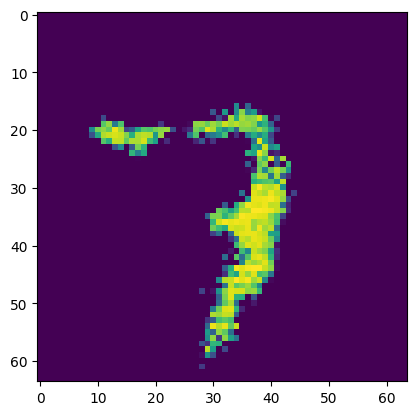

Epoch [38/50] Batch 300/938                   Loss D: 1737.5955, loss G: 221641.2969
tensor([9, 8, 1, 4, 3, 4, 0, 3, 0, 2, 6, 6, 2, 8, 2, 4, 5, 5, 0, 8, 6, 7, 6, 3,
        6, 3, 9, 1, 2, 5, 9, 8, 7, 8, 3, 0, 1, 1, 4, 6, 0, 6, 6, 9, 2, 9, 1, 3,
        4, 5, 1, 2, 1, 0, 5, 0, 3, 2, 9, 7, 2, 0, 5, 4], device='cuda:0')


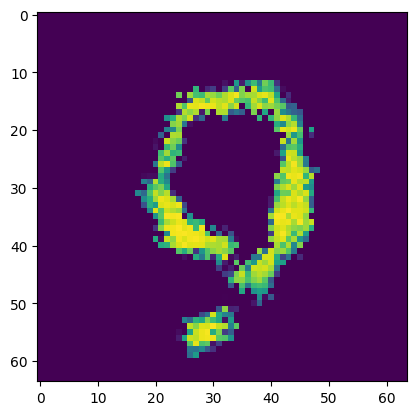

Epoch [38/50] Batch 400/938                   Loss D: -472654.3750, loss G: 223439.9062
tensor([1, 8, 3, 1, 5, 6, 9, 6, 5, 0, 1, 3, 0, 8, 1, 1, 0, 0, 9, 2, 2, 1, 6, 4,
        2, 0, 6, 5, 4, 2, 5, 9, 9, 1, 2, 7, 2, 1, 3, 2, 1, 1, 8, 1, 9, 2, 4, 0,
        2, 8, 6, 7, 9, 5, 9, 9, 0, 0, 9, 5, 8, 8, 8, 6], device='cuda:0')


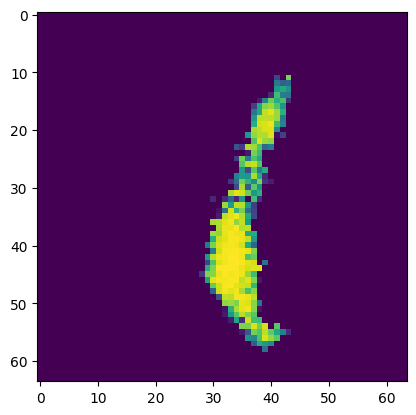

Epoch [38/50] Batch 500/938                   Loss D: -469317.8438, loss G: 222951.3594
tensor([4, 3, 6, 6, 9, 0, 7, 3, 2, 7, 6, 3, 0, 2, 0, 0, 8, 0, 6, 3, 4, 0, 1, 5,
        0, 3, 8, 4, 3, 8, 2, 0, 1, 5, 5, 7, 2, 8, 1, 3, 5, 1, 9, 2, 6, 5, 6, 5,
        4, 9, 6, 3, 1, 0, 8, 7, 9, 5, 2, 5, 2, 2, 0, 5], device='cuda:0')


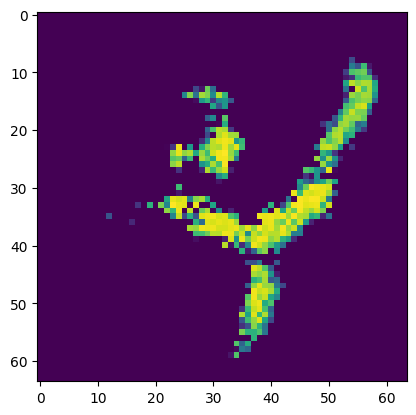

Epoch [38/50] Batch 600/938                   Loss D: -467593.2500, loss G: 223379.8438
tensor([0, 3, 3, 3, 3, 2, 1, 8, 4, 6, 7, 1, 6, 6, 1, 7, 0, 6, 2, 8, 1, 0, 6, 9,
        2, 8, 3, 8, 5, 2, 6, 0, 3, 9, 1, 8, 2, 7, 0, 5, 6, 1, 4, 0, 7, 5, 9, 9,
        4, 9, 8, 6, 6, 4, 6, 3, 1, 3, 5, 7, 7, 9, 5, 1], device='cuda:0')


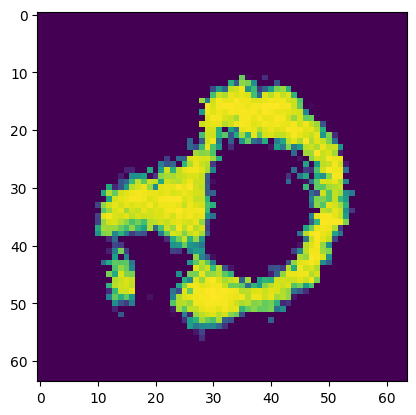

Epoch [38/50] Batch 700/938                   Loss D: -479353.1875, loss G: 225663.6250
tensor([7, 0, 5, 4, 4, 6, 3, 0, 6, 2, 4, 9, 4, 8, 2, 6, 0, 6, 1, 2, 7, 2, 2, 0,
        2, 0, 6, 2, 4, 4, 3, 9, 4, 2, 6, 9, 1, 8, 9, 5, 7, 3, 0, 2, 1, 1, 1, 1,
        6, 7, 8, 1, 3, 3, 6, 4, 5, 1, 1, 1, 0, 6, 0, 3], device='cuda:0')


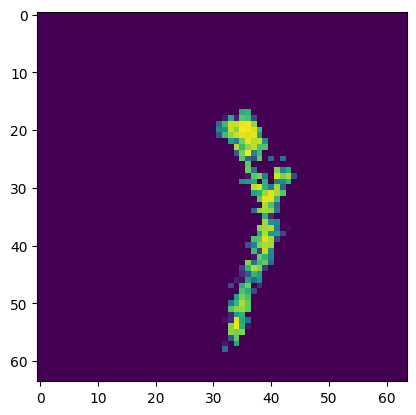

Epoch [38/50] Batch 800/938                   Loss D: -483562.3125, loss G: 227920.2500
tensor([7, 4, 4, 7, 3, 6, 1, 9, 6, 8, 4, 6, 1, 8, 5, 2, 5, 8, 1, 4, 2, 6, 8, 6,
        4, 2, 1, 5, 1, 3, 9, 2, 3, 6, 4, 9, 7, 7, 9, 8, 8, 3, 6, 6, 5, 3, 8, 5,
        3, 4, 7, 8, 8, 3, 4, 0, 1, 4, 4, 5, 3, 5, 9, 4], device='cuda:0')


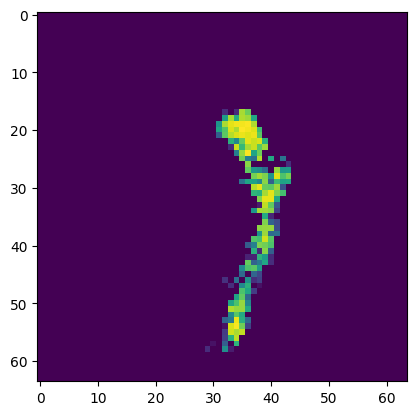

Epoch [38/50] Batch 900/938                   Loss D: -478676.5000, loss G: 225044.6250
tensor([9, 1, 1, 3, 2, 8, 7, 8, 3, 8, 8, 8, 8, 0, 6, 1, 7, 6, 8, 4, 2, 6, 7, 3,
        9, 7, 5, 3, 6, 3, 9, 1, 0, 9, 8, 0, 1, 4, 3, 3, 6, 5, 4, 7, 9, 4, 7, 6,
        8, 5, 9, 9, 2, 9, 1, 1, 1, 4, 5, 4, 2, 2, 1, 5], device='cuda:0')


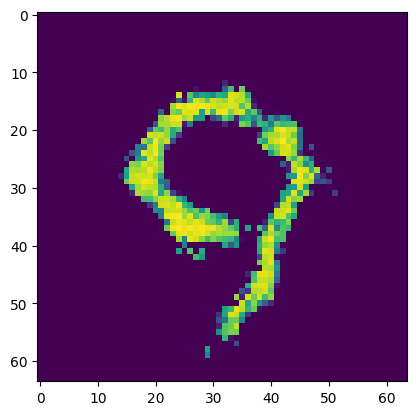

Epoch [39/50] Batch 100/938                   Loss D: -499831.0000, loss G: 233028.1562
tensor([8, 5, 7, 9, 9, 7, 6, 2, 7, 7, 3, 9, 8, 2, 8, 0, 0, 1, 5, 6, 3, 5, 0, 9,
        0, 3, 2, 7, 7, 0, 3, 9, 9, 4, 8, 4, 4, 1, 5, 7, 5, 8, 1, 0, 8, 3, 7, 6,
        0, 7, 5, 7, 4, 7, 9, 9, 9, 4, 0, 2, 3, 3, 5, 3], device='cuda:0')


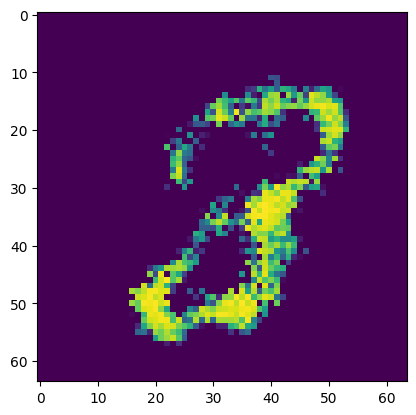

Epoch [39/50] Batch 200/938                   Loss D: -504398.8125, loss G: 235326.9375
tensor([4, 3, 9, 5, 0, 9, 6, 3, 2, 1, 9, 0, 1, 6, 1, 9, 4, 5, 3, 0, 7, 7, 7, 4,
        6, 4, 3, 7, 4, 4, 1, 6, 7, 7, 1, 3, 4, 2, 7, 3, 3, 9, 1, 9, 9, 1, 1, 5,
        1, 4, 9, 4, 3, 7, 6, 0, 5, 7, 1, 7, 7, 7, 9, 3], device='cuda:0')


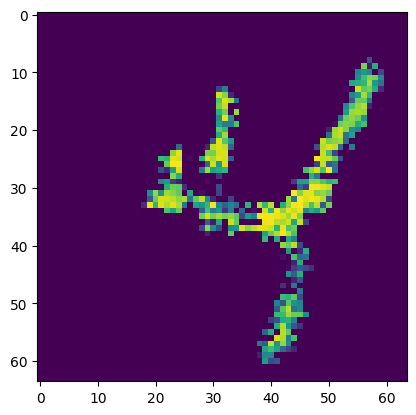

Epoch [39/50] Batch 300/938                   Loss D: -508508.0625, loss G: 237349.6875
tensor([1, 0, 5, 0, 7, 8, 2, 0, 2, 6, 9, 2, 0, 2, 9, 7, 1, 9, 2, 1, 1, 1, 2, 4,
        7, 8, 4, 2, 7, 7, 6, 4, 2, 5, 8, 6, 9, 7, 7, 7, 3, 2, 4, 9, 1, 5, 2, 4,
        1, 4, 2, 6, 1, 4, 7, 4, 8, 3, 0, 6, 0, 3, 3, 8], device='cuda:0')


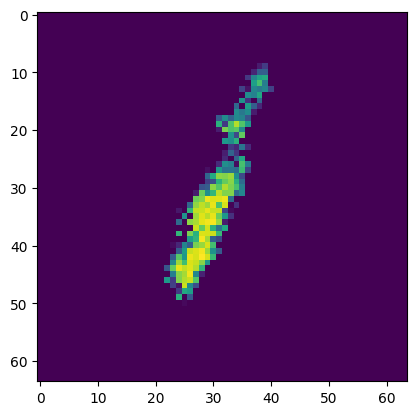

Epoch [39/50] Batch 400/938                   Loss D: -489559.3438, loss G: 225500.3281
tensor([8, 4, 3, 1, 1, 8, 5, 9, 7, 3, 7, 9, 2, 6, 6, 2, 4, 6, 0, 4, 7, 4, 6, 2,
        7, 3, 7, 4, 0, 4, 1, 6, 8, 2, 9, 8, 7, 0, 6, 1, 8, 5, 7, 1, 6, 3, 0, 1,
        3, 3, 9, 0, 0, 2, 2, 3, 3, 6, 6, 5, 2, 9, 8, 7], device='cuda:0')


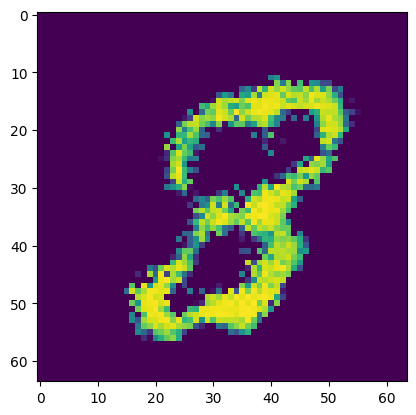

Epoch [39/50] Batch 500/938                   Loss D: -513965.8438, loss G: 240834.3906
tensor([7, 3, 6, 2, 9, 9, 1, 1, 1, 8, 3, 3, 5, 9, 6, 8, 1, 5, 5, 8, 3, 3, 1, 8,
        0, 1, 6, 7, 2, 8, 4, 8, 6, 9, 4, 6, 4, 4, 1, 2, 0, 6, 4, 8, 6, 5, 2, 8,
        9, 4, 4, 4, 6, 7, 2, 6, 0, 0, 8, 8, 3, 4, 3, 5], device='cuda:0')


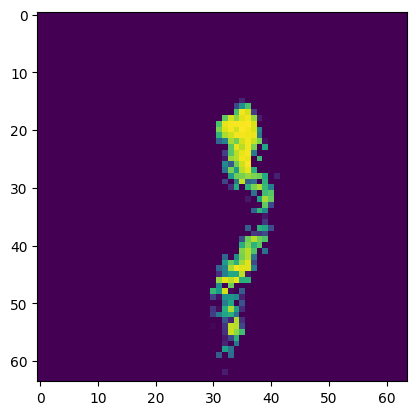

Epoch [39/50] Batch 600/938                   Loss D: -519597.8438, loss G: 242941.3125
tensor([5, 9, 9, 0, 7, 3, 9, 7, 0, 5, 9, 0, 5, 4, 3, 0, 5, 2, 1, 7, 9, 0, 5, 0,
        0, 4, 8, 0, 5, 0, 0, 4, 4, 0, 7, 5, 9, 0, 1, 0, 4, 6, 9, 6, 9, 5, 2, 5,
        9, 5, 2, 5, 4, 5, 4, 9, 1, 6, 3, 1, 1, 3, 1, 1], device='cuda:0')


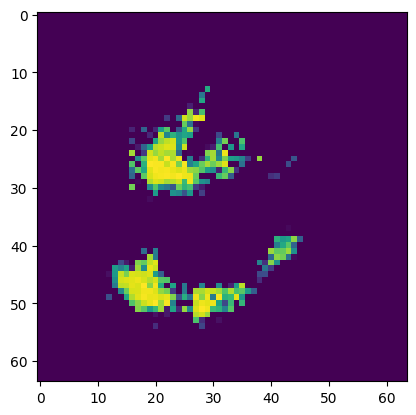

Epoch [39/50] Batch 700/938                   Loss D: -510275.4688, loss G: 240295.7812
tensor([9, 2, 0, 7, 4, 3, 4, 8, 6, 1, 3, 7, 1, 3, 1, 4, 7, 8, 3, 4, 9, 0, 1, 1,
        0, 7, 4, 1, 8, 6, 7, 5, 1, 7, 9, 3, 6, 0, 1, 9, 0, 6, 0, 4, 6, 0, 7, 2,
        8, 0, 9, 8, 5, 2, 7, 8, 2, 5, 7, 7, 4, 6, 0, 1], device='cuda:0')


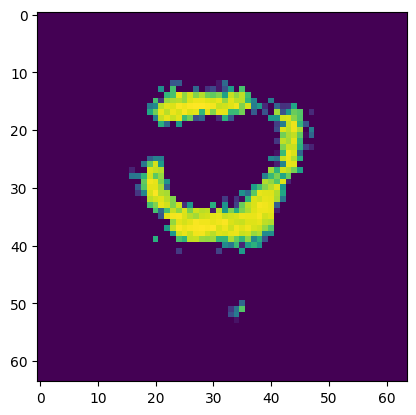

Epoch [39/50] Batch 800/938                   Loss D: 2089.2664, loss G: 244251.9062
tensor([1, 8, 3, 0, 6, 0, 6, 3, 5, 1, 8, 3, 0, 8, 8, 1, 9, 5, 2, 6, 7, 7, 5, 3,
        8, 1, 4, 3, 9, 4, 3, 6, 7, 7, 6, 2, 8, 5, 7, 9, 0, 8, 6, 2, 1, 2, 0, 9,
        4, 0, 7, 5, 8, 8, 9, 9, 8, 5, 2, 1, 9, 6, 4, 0], device='cuda:0')


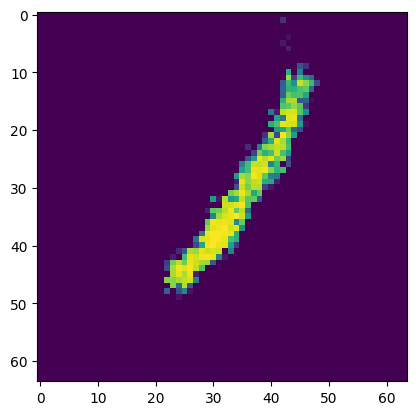

Epoch [39/50] Batch 900/938                   Loss D: -525769.0625, loss G: 246677.7812
tensor([8, 9, 3, 1, 5, 7, 9, 0, 3, 9, 1, 1, 4, 4, 6, 9, 5, 8, 2, 8, 1, 0, 1, 2,
        7, 0, 8, 5, 7, 8, 0, 2, 7, 0, 7, 4, 6, 8, 6, 3, 9, 2, 6, 5, 0, 8, 8, 2,
        8, 6, 3, 3, 9, 7, 6, 0, 1, 1, 0, 0, 5, 2, 5, 0], device='cuda:0')


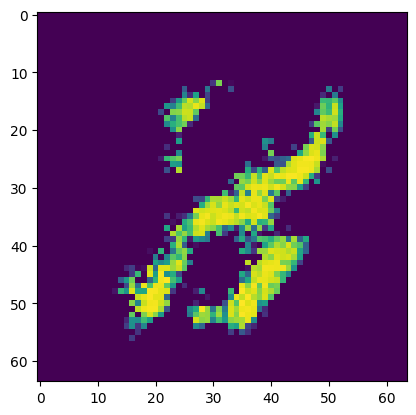

Epoch [40/50] Batch 100/938                   Loss D: -521460.0625, loss G: 247082.1562
tensor([1, 6, 5, 1, 1, 7, 0, 4, 0, 6, 4, 9, 4, 2, 4, 4, 0, 5, 8, 5, 9, 9, 6, 5,
        5, 7, 3, 6, 3, 8, 1, 6, 1, 7, 3, 8, 7, 5, 7, 5, 0, 2, 7, 0, 7, 7, 6, 8,
        5, 7, 5, 7, 1, 2, 5, 8, 3, 6, 4, 2, 8, 2, 9, 8], device='cuda:0')


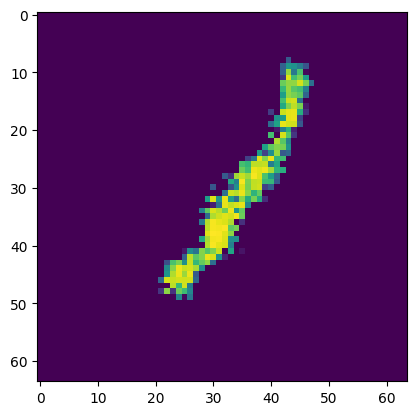

Epoch [40/50] Batch 200/938                   Loss D: -534215.8750, loss G: 250562.8750
tensor([6, 3, 6, 4, 9, 8, 0, 7, 8, 2, 8, 0, 0, 0, 6, 5, 4, 0, 5, 7, 0, 6, 1, 9,
        3, 4, 5, 7, 0, 7, 1, 8, 9, 2, 6, 1, 1, 3, 8, 9, 6, 8, 2, 0, 8, 1, 3, 7,
        0, 1, 5, 3, 7, 1, 1, 0, 8, 7, 9, 6, 7, 0, 0, 6], device='cuda:0')


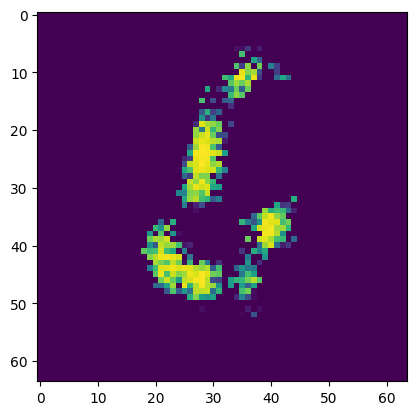

Epoch [40/50] Batch 300/938                   Loss D: -538031.0625, loss G: 252798.0625
tensor([3, 6, 6, 2, 6, 5, 7, 9, 9, 7, 2, 2, 7, 0, 3, 8, 7, 7, 1, 0, 5, 4, 2, 1,
        6, 5, 5, 9, 2, 1, 9, 4, 4, 7, 1, 9, 9, 0, 3, 5, 4, 1, 3, 5, 9, 3, 2, 2,
        4, 3, 0, 5, 6, 3, 3, 3, 1, 0, 0, 6, 9, 1, 4, 8], device='cuda:0')


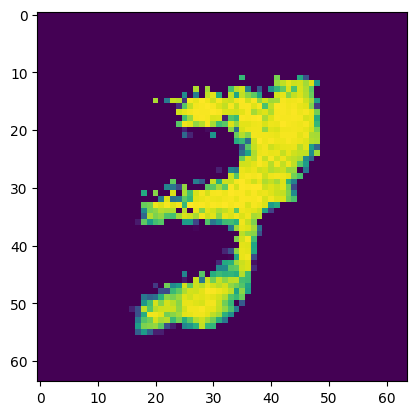

Epoch [40/50] Batch 400/938                   Loss D: -531204.3125, loss G: 253582.9219
tensor([8, 7, 2, 5, 6, 1, 6, 8, 1, 6, 9, 4, 6, 1, 7, 2, 3, 5, 8, 9, 2, 4, 1, 4,
        9, 4, 4, 0, 6, 4, 2, 0, 7, 8, 6, 5, 2, 1, 9, 2, 4, 7, 7, 9, 1, 2, 7, 4,
        9, 8, 6, 1, 1, 9, 8, 5, 0, 6, 5, 7, 6, 8, 4, 3], device='cuda:0')


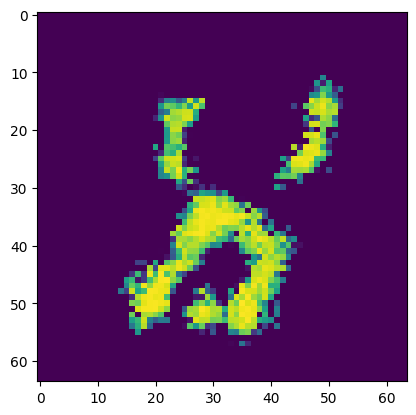

Epoch [40/50] Batch 500/938                   Loss D: -547356.2500, loss G: 256701.0312
tensor([4, 0, 3, 0, 1, 6, 5, 7, 1, 0, 2, 4, 3, 5, 2, 0, 8, 2, 5, 2, 1, 4, 0, 0,
        3, 9, 5, 5, 2, 6, 0, 7, 6, 1, 3, 4, 9, 4, 2, 5, 4, 4, 6, 5, 4, 8, 7, 7,
        1, 7, 9, 3, 9, 6, 9, 5, 0, 4, 5, 9, 2, 6, 4, 8], device='cuda:0')


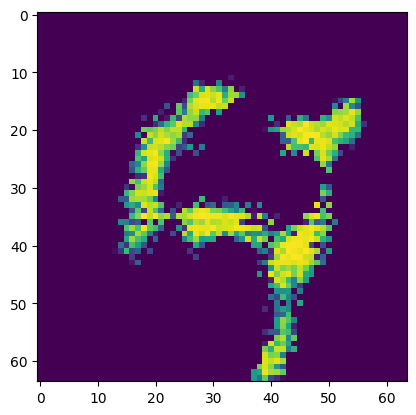

Epoch [40/50] Batch 600/938                   Loss D: -544065.5000, loss G: 255498.5781
tensor([2, 6, 3, 3, 6, 0, 0, 6, 3, 8, 3, 7, 5, 9, 7, 0, 1, 2, 7, 8, 4, 4, 8, 7,
        3, 0, 7, 0, 7, 7, 0, 5, 3, 4, 1, 3, 8, 4, 1, 6, 3, 7, 5, 8, 0, 6, 3, 8,
        7, 4, 4, 9, 8, 9, 9, 5, 4, 1, 2, 1, 1, 7, 4, 5], device='cuda:0')


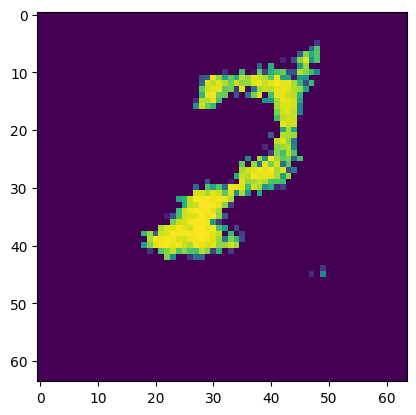

Epoch [40/50] Batch 700/938                   Loss D: -541524.5625, loss G: 257147.7188
tensor([4, 4, 8, 4, 1, 7, 6, 7, 4, 2, 7, 8, 0, 1, 4, 0, 1, 8, 5, 0, 1, 3, 8, 4,
        9, 9, 5, 4, 4, 9, 2, 4, 4, 6, 7, 3, 4, 7, 6, 9, 9, 9, 5, 9, 0, 3, 7, 3,
        2, 5, 1, 1, 4, 9, 3, 1, 8, 8, 3, 4, 1, 7, 3, 6], device='cuda:0')


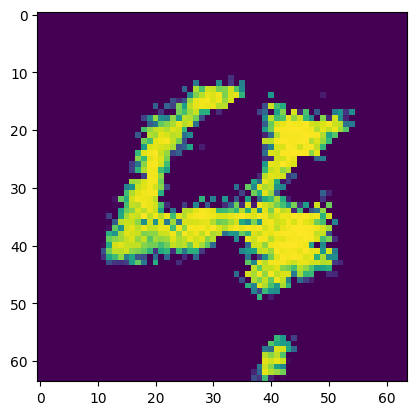

Epoch [40/50] Batch 800/938                   Loss D: -261.0732, loss G: 257893.1719
tensor([4, 7, 7, 2, 4, 4, 2, 1, 2, 8, 1, 3, 7, 1, 8, 2, 8, 0, 4, 1, 4, 2, 4, 7,
        6, 6, 8, 6, 9, 8, 4, 9, 9, 9, 2, 2, 7, 0, 3, 8, 3, 8, 7, 5, 8, 1, 6, 5,
        4, 2, 9, 2, 0, 8, 6, 9, 4, 9, 2, 6, 4, 8, 1, 5], device='cuda:0')


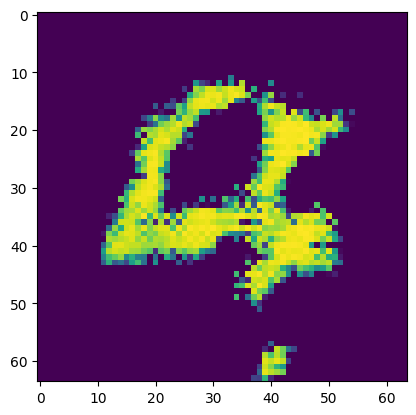

Epoch [40/50] Batch 900/938                   Loss D: 277.0231, loss G: 261555.5938
tensor([3, 8, 3, 1, 4, 3, 9, 2, 2, 4, 3, 5, 6, 7, 9, 4, 4, 1, 8, 0, 4, 0, 9, 4,
        1, 0, 8, 2, 6, 6, 9, 7, 1, 4, 3, 1, 4, 9, 2, 8, 2, 4, 9, 4, 9, 1, 8, 1,
        8, 1, 7, 6, 7, 8, 3, 6, 5, 4, 8, 7, 6, 0, 5, 5], device='cuda:0')


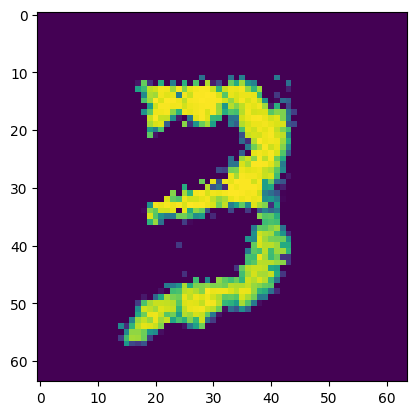

Epoch [41/50] Batch 100/938                   Loss D: -534925.5000, loss G: 258322.8906
tensor([3, 3, 4, 8, 2, 4, 9, 4, 0, 8, 1, 0, 7, 3, 9, 1, 0, 6, 3, 3, 8, 9, 9, 8,
        1, 0, 1, 8, 7, 2, 2, 3, 8, 0, 8, 5, 9, 0, 0, 7, 4, 4, 2, 7, 2, 8, 6, 8,
        9, 0, 7, 8, 6, 3, 7, 7, 0, 7, 0, 4, 4, 5, 9, 6], device='cuda:0')


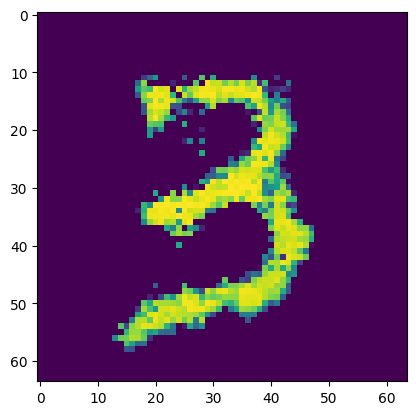

Epoch [41/50] Batch 200/938                   Loss D: -559712.8125, loss G: 264861.5000
tensor([3, 0, 5, 2, 3, 2, 4, 7, 3, 2, 1, 7, 4, 0, 6, 5, 5, 5, 4, 4, 4, 6, 4, 5,
        1, 2, 8, 5, 9, 9, 1, 6, 6, 1, 6, 8, 8, 2, 8, 1, 7, 9, 5, 7, 7, 1, 8, 6,
        2, 4, 8, 2, 3, 6, 1, 2, 3, 8, 2, 9, 8, 6, 2, 4], device='cuda:0')


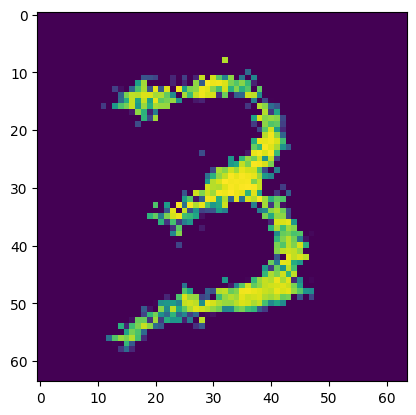

Epoch [41/50] Batch 300/938                   Loss D: -554047.5625, loss G: 261996.0781
tensor([8, 7, 2, 7, 6, 5, 0, 6, 1, 7, 2, 1, 0, 0, 8, 1, 0, 0, 0, 3, 8, 6, 8, 1,
        8, 9, 3, 8, 5, 3, 9, 8, 6, 7, 2, 8, 3, 4, 2, 1, 7, 8, 1, 4, 0, 2, 0, 2,
        4, 9, 3, 7, 4, 9, 4, 5, 9, 0, 2, 2, 2, 9, 7, 1], device='cuda:0')


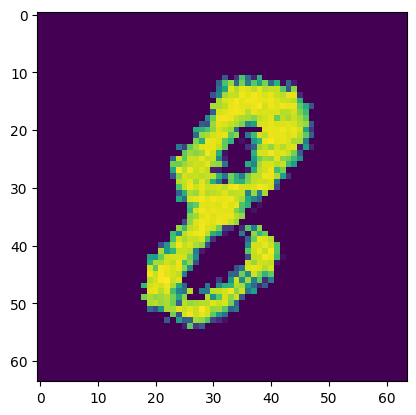

Epoch [41/50] Batch 400/938                   Loss D: -483482.1562, loss G: 241256.7344
tensor([5, 7, 8, 8, 3, 2, 9, 5, 4, 5, 0, 5, 6, 6, 1, 7, 6, 8, 0, 6, 4, 7, 5, 2,
        7, 5, 2, 9, 8, 5, 5, 2, 4, 5, 0, 3, 0, 1, 1, 0, 3, 8, 5, 8, 7, 2, 4, 5,
        7, 0, 9, 2, 0, 0, 4, 1, 5, 5, 3, 4, 7, 5, 7, 1], device='cuda:0')


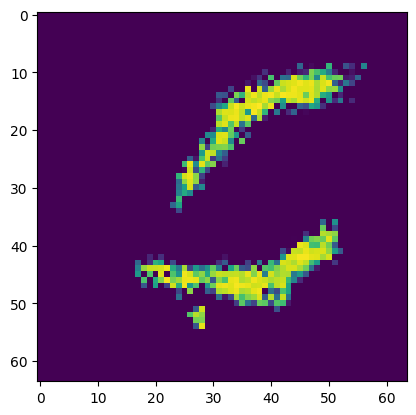

Epoch [41/50] Batch 500/938                   Loss D: 23637.9199, loss G: 265950.6250
tensor([1, 0, 3, 3, 3, 8, 9, 2, 3, 7, 2, 0, 7, 9, 3, 3, 6, 5, 2, 1, 3, 1, 8, 8,
        6, 7, 0, 3, 8, 8, 8, 5, 6, 6, 2, 3, 9, 5, 9, 4, 4, 4, 3, 3, 1, 1, 4, 0,
        7, 5, 8, 8, 9, 6, 5, 1, 5, 8, 2, 6, 1, 1, 7, 4], device='cuda:0')


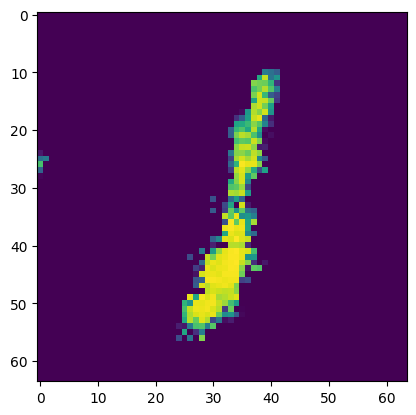

Epoch [41/50] Batch 600/938                   Loss D: -562191.0625, loss G: 269089.8125
tensor([7, 6, 6, 9, 2, 3, 7, 9, 2, 3, 6, 6, 6, 9, 1, 9, 5, 5, 5, 5, 2, 9, 8, 9,
        1, 7, 5, 9, 9, 5, 6, 3, 5, 0, 0, 9, 5, 5, 9, 4, 1, 9, 5, 1, 2, 1, 3, 0,
        6, 9, 4, 2, 7, 0, 4, 9, 7, 1, 0, 5, 6, 0, 6, 4], device='cuda:0')


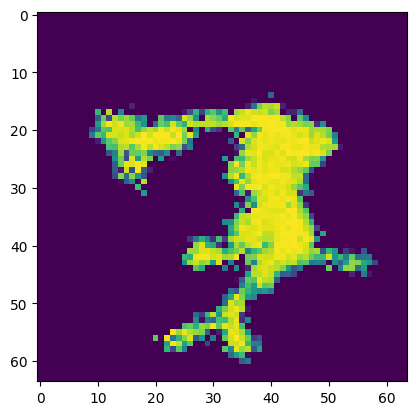

Epoch [41/50] Batch 700/938                   Loss D: 1529.5000, loss G: 272045.6250
tensor([0, 3, 3, 2, 5, 2, 6, 3, 9, 3, 8, 4, 8, 7, 3, 9, 7, 9, 4, 9, 2, 5, 4, 6,
        8, 7, 4, 3, 2, 5, 6, 4, 1, 2, 0, 9, 8, 2, 3, 1, 4, 8, 3, 8, 3, 1, 4, 3,
        1, 4, 1, 1, 0, 4, 1, 3, 0, 4, 7, 5, 9, 8, 7, 3], device='cuda:0')


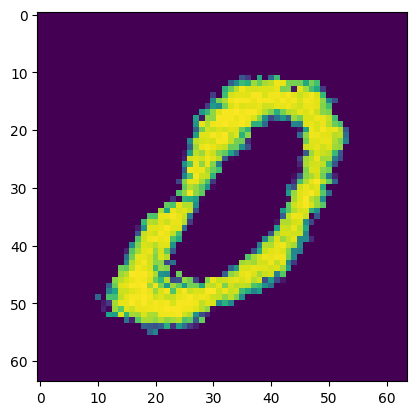

Epoch [41/50] Batch 800/938                   Loss D: -581537.5000, loss G: 273406.2500
tensor([2, 6, 6, 4, 5, 5, 8, 9, 3, 9, 0, 8, 4, 8, 8, 0, 0, 0, 9, 4, 6, 6, 9, 3,
        7, 6, 0, 8, 5, 9, 9, 1, 7, 2, 2, 0, 1, 1, 8, 2, 4, 3, 0, 3, 3, 2, 5, 8,
        1, 8, 3, 6, 4, 5, 9, 2, 7, 9, 0, 4, 3, 1, 1, 5], device='cuda:0')


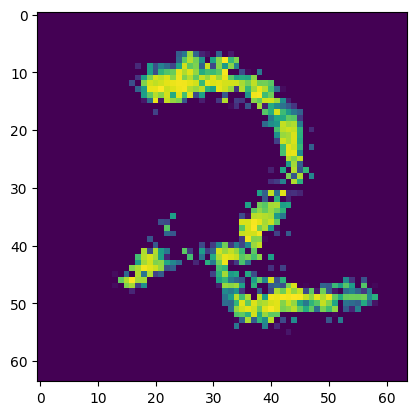

Epoch [41/50] Batch 900/938                   Loss D: -585446.1875, loss G: 275487.6562
tensor([5, 4, 6, 3, 0, 5, 2, 3, 4, 3, 0, 1, 0, 8, 5, 6, 8, 9, 7, 1, 9, 6, 8, 2,
        0, 7, 2, 6, 1, 5, 2, 9, 6, 3, 0, 1, 6, 9, 4, 3, 4, 0, 0, 4, 3, 0, 6, 0,
        2, 5, 5, 0, 5, 2, 1, 2, 4, 0, 8, 3, 1, 9, 9, 9], device='cuda:0')


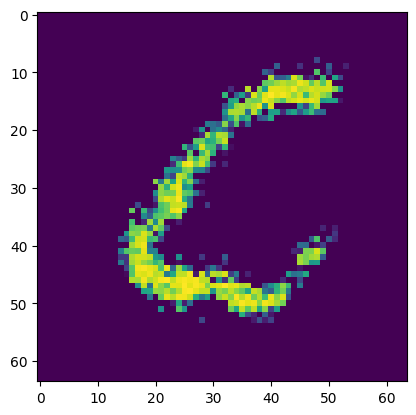

Epoch [42/50] Batch 100/938                   Loss D: -338031.5938, loss G: -24400.2656
tensor([7, 9, 5, 5, 4, 7, 2, 7, 8, 9, 9, 4, 8, 4, 6, 2, 6, 7, 7, 7, 1, 0, 9, 5,
        0, 0, 7, 1, 1, 1, 6, 9, 3, 2, 6, 2, 2, 1, 2, 1, 4, 6, 9, 0, 3, 2, 9, 7,
        0, 6, 4, 9, 6, 3, 3, 0, 2, 5, 0, 3, 5, 0, 0, 4], device='cuda:0')


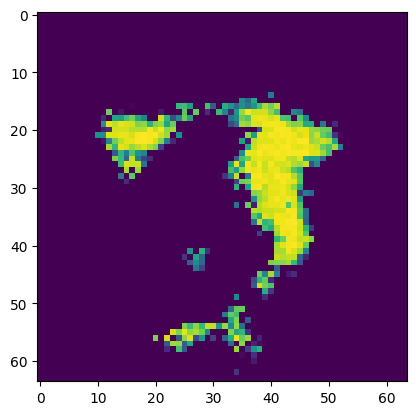

Epoch [42/50] Batch 200/938                   Loss D: -573733.3125, loss G: 275649.7188
tensor([2, 5, 3, 1, 0, 9, 7, 4, 8, 2, 7, 3, 4, 3, 4, 9, 1, 6, 8, 0, 0, 1, 5, 6,
        9, 8, 9, 9, 7, 5, 1, 6, 2, 1, 2, 8, 2, 2, 9, 6, 6, 7, 3, 0, 1, 1, 7, 9,
        3, 5, 2, 7, 9, 4, 3, 6, 3, 9, 3, 8, 4, 3, 9, 6], device='cuda:0')


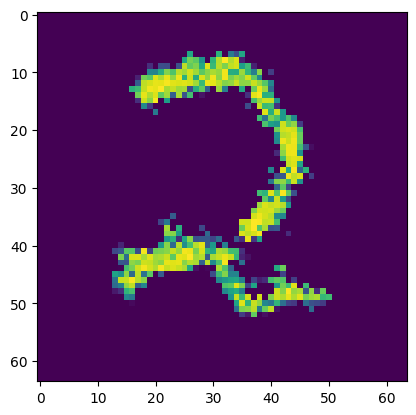

Epoch [42/50] Batch 300/938                   Loss D: -521910.0312, loss G: 275389.8750
tensor([4, 7, 6, 6, 0, 0, 3, 5, 1, 0, 7, 0, 1, 6, 4, 5, 2, 3, 7, 9, 4, 9, 8, 2,
        9, 8, 5, 0, 2, 0, 1, 1, 8, 4, 0, 5, 7, 5, 4, 9, 8, 9, 2, 6, 3, 1, 3, 2,
        5, 5, 7, 4, 0, 6, 5, 6, 2, 0, 8, 7, 3, 7, 6, 9], device='cuda:0')


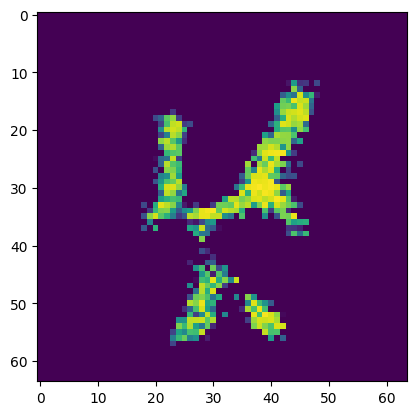

Epoch [42/50] Batch 400/938                   Loss D: -581474.1875, loss G: 277979.3750
tensor([5, 4, 0, 8, 8, 6, 5, 2, 4, 9, 9, 9, 7, 2, 2, 0, 7, 4, 3, 1, 9, 6, 6, 9,
        6, 8, 6, 8, 1, 8, 9, 6, 8, 3, 2, 9, 5, 5, 9, 9, 7, 8, 8, 0, 2, 5, 6, 9,
        7, 9, 9, 0, 2, 2, 9, 3, 9, 9, 2, 6, 3, 1, 3, 4], device='cuda:0')


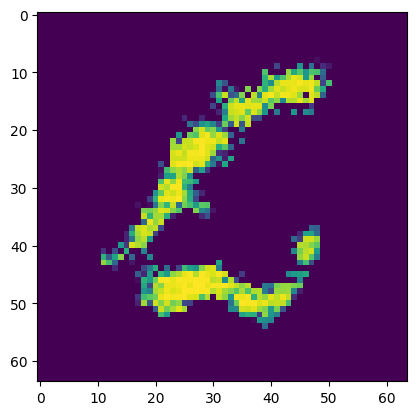

Epoch [42/50] Batch 500/938                   Loss D: -557980.8750, loss G: 272395.1875
tensor([3, 1, 9, 1, 8, 9, 1, 7, 5, 2, 4, 5, 7, 1, 6, 5, 1, 8, 1, 1, 1, 0, 4, 1,
        7, 1, 4, 7, 2, 4, 2, 1, 6, 6, 1, 4, 3, 1, 6, 4, 1, 8, 9, 3, 6, 6, 1, 9,
        3, 2, 6, 6, 6, 0, 8, 1, 1, 6, 1, 9, 4, 8, 1, 5], device='cuda:0')


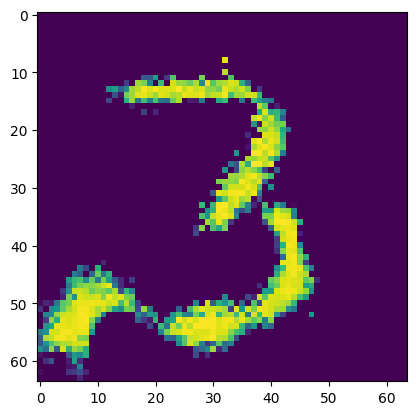

Epoch [42/50] Batch 600/938                   Loss D: 3645.9719, loss G: 282607.1875
tensor([7, 6, 1, 6, 8, 9, 5, 4, 1, 9, 8, 6, 0, 6, 6, 9, 7, 8, 0, 9, 8, 4, 9, 7,
        7, 9, 0, 0, 0, 8, 1, 1, 3, 4, 6, 4, 6, 6, 4, 7, 2, 0, 7, 4, 3, 3, 6, 4,
        3, 6, 1, 1, 5, 1, 8, 9, 9, 1, 8, 1, 1, 6, 2, 1], device='cuda:0')


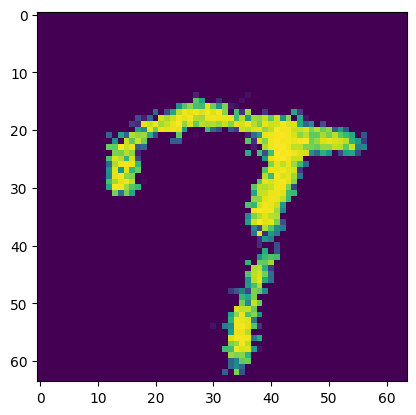

Epoch [42/50] Batch 700/938                   Loss D: 1997.1602, loss G: 284162.3125
tensor([6, 2, 6, 9, 8, 7, 8, 8, 7, 9, 0, 0, 8, 4, 8, 1, 2, 3, 9, 4, 7, 0, 0, 9,
        5, 7, 8, 6, 9, 7, 7, 4, 3, 2, 3, 0, 4, 6, 4, 7, 9, 0, 3, 1, 3, 2, 3, 5,
        1, 6, 5, 1, 6, 0, 9, 1, 0, 3, 4, 4, 3, 6, 9, 6], device='cuda:0')


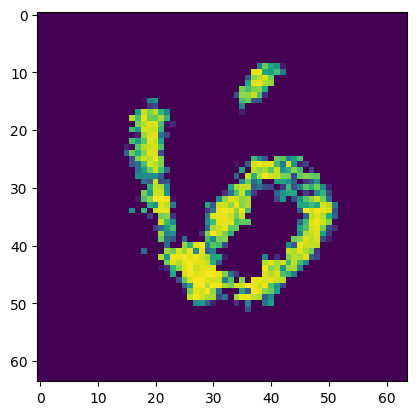

Epoch [42/50] Batch 800/938                   Loss D: -590376.8750, loss G: 284099.7188
tensor([4, 7, 4, 5, 5, 7, 0, 1, 2, 0, 5, 5, 9, 1, 1, 7, 0, 3, 0, 2, 7, 3, 0, 0,
        4, 5, 3, 8, 5, 2, 8, 5, 4, 2, 3, 3, 6, 4, 9, 2, 7, 8, 9, 2, 0, 5, 2, 7,
        6, 1, 4, 6, 3, 9, 6, 3, 8, 1, 7, 2, 9, 6, 4, 0], device='cuda:0')


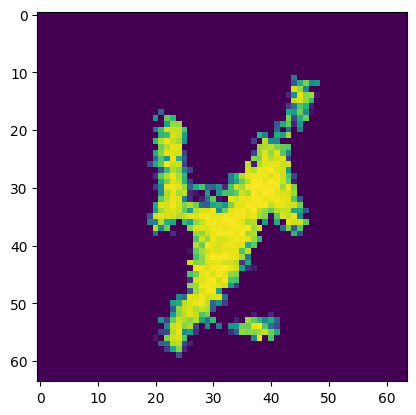

Epoch [42/50] Batch 900/938                   Loss D: -572537.0625, loss G: 274855.0000
tensor([6, 6, 4, 4, 3, 8, 3, 4, 0, 9, 0, 6, 8, 5, 7, 8, 3, 6, 3, 5, 9, 9, 9, 8,
        3, 4, 9, 8, 6, 7, 5, 5, 9, 7, 5, 0, 5, 5, 8, 5, 1, 9, 7, 4, 6, 2, 5, 0,
        9, 9, 8, 4, 3, 7, 1, 2, 8, 5, 1, 3, 5, 0, 4, 7], device='cuda:0')


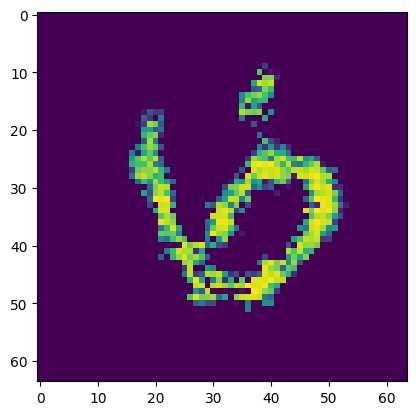

Epoch [43/50] Batch 100/938                   Loss D: -600523.1250, loss G: 287300.1250
tensor([4, 7, 7, 6, 3, 8, 6, 5, 2, 6, 0, 9, 3, 2, 9, 9, 8, 1, 8, 0, 0, 7, 2, 4,
        0, 4, 9, 2, 6, 1, 3, 3, 8, 1, 1, 6, 7, 7, 3, 7, 0, 7, 6, 7, 6, 6, 6, 3,
        3, 0, 2, 1, 5, 3, 2, 1, 4, 0, 9, 1, 8, 5, 3, 1], device='cuda:0')


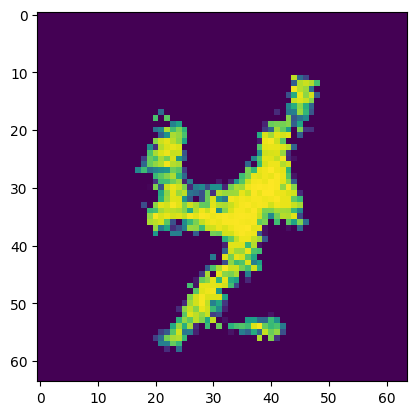

Epoch [43/50] Batch 200/938                   Loss D: -620411.0625, loss G: 291234.4375
tensor([2, 1, 8, 7, 8, 1, 5, 6, 8, 6, 9, 1, 0, 7, 7, 5, 7, 2, 3, 0, 9, 9, 9, 6,
        8, 0, 0, 3, 0, 2, 8, 5, 8, 1, 6, 8, 1, 2, 7, 6, 6, 2, 2, 1, 6, 5, 0, 1,
        5, 7, 8, 6, 9, 8, 3, 3, 2, 3, 1, 3, 0, 2, 5, 8], device='cuda:0')


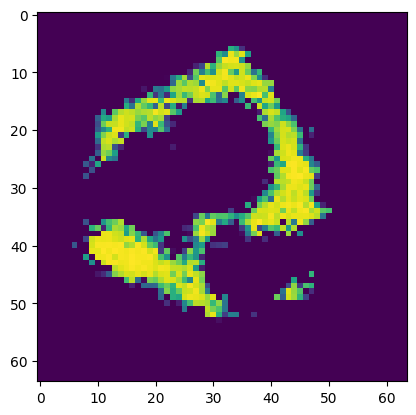

Epoch [43/50] Batch 300/938                   Loss D: -613508.2500, loss G: 290978.4688
tensor([7, 0, 8, 9, 7, 4, 3, 6, 4, 1, 4, 9, 3, 7, 0, 6, 4, 2, 3, 1, 0, 2, 9, 5,
        8, 6, 5, 1, 7, 2, 6, 3, 2, 3, 4, 3, 4, 5, 3, 0, 4, 5, 8, 7, 6, 2, 0, 5,
        4, 4, 6, 7, 8, 8, 1, 3, 7, 0, 2, 2, 0, 1, 3, 2], device='cuda:0')


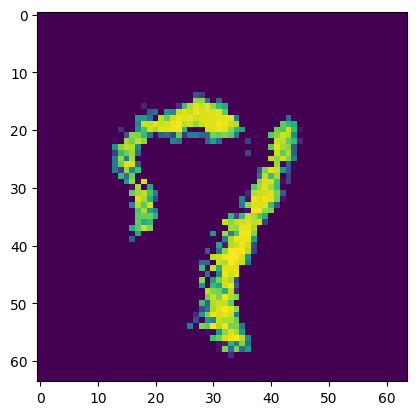

Epoch [43/50] Batch 400/938                   Loss D: -627719.2500, loss G: 294921.3750
tensor([7, 6, 1, 4, 7, 8, 9, 3, 6, 2, 1, 2, 8, 4, 5, 4, 9, 1, 2, 8, 1, 4, 6, 9,
        9, 2, 7, 5, 9, 7, 6, 5, 9, 6, 2, 2, 8, 4, 1, 1, 6, 4, 8, 6, 3, 5, 8, 2,
        3, 7, 3, 3, 7, 1, 0, 6, 6, 1, 1, 7, 4, 8, 5, 1], device='cuda:0')


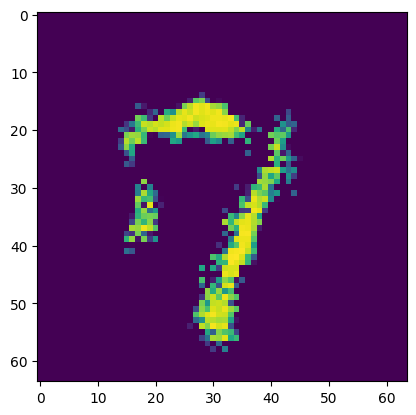

Epoch [43/50] Batch 500/938                   Loss D: -420765.4688, loss G: 53985.6406
tensor([6, 3, 4, 1, 5, 7, 6, 1, 5, 0, 5, 8, 4, 8, 9, 9, 9, 5, 0, 3, 4, 8, 3, 1,
        1, 7, 8, 0, 5, 1, 0, 6, 9, 0, 6, 1, 9, 0, 5, 3, 7, 1, 3, 0, 7, 1, 4, 8,
        2, 6, 9, 6, 1, 4, 3, 1, 2, 1, 5, 3, 4, 2, 0, 7], device='cuda:0')


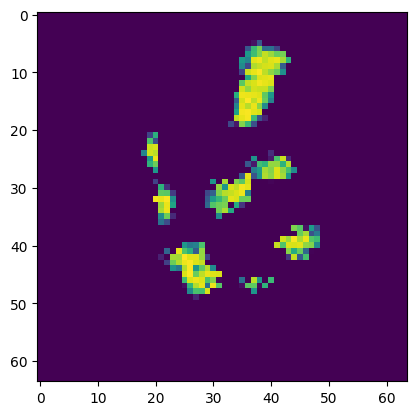

Epoch [43/50] Batch 600/938                   Loss D: -630700.1250, loss G: 298435.2500
tensor([2, 9, 6, 6, 6, 8, 2, 6, 0, 2, 7, 9, 7, 1, 8, 2, 7, 4, 1, 7, 7, 8, 0, 5,
        2, 8, 9, 3, 9, 2, 5, 8, 7, 2, 7, 5, 8, 5, 4, 1, 9, 7, 3, 8, 3, 0, 3, 7,
        8, 5, 7, 2, 9, 2, 0, 7, 0, 9, 0, 9, 1, 5, 2, 3], device='cuda:0')


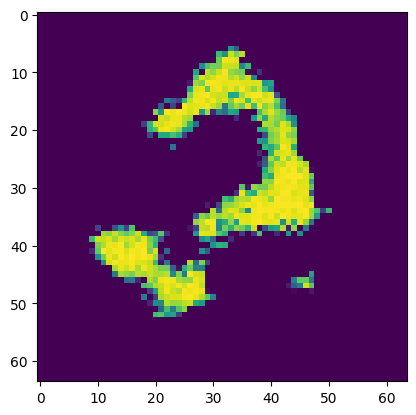

Epoch [43/50] Batch 700/938                   Loss D: -638374.0625, loss G: 300682.0625
tensor([3, 2, 2, 8, 2, 2, 5, 1, 8, 8, 3, 9, 9, 4, 3, 6, 8, 9, 6, 1, 7, 0, 1, 2,
        9, 2, 0, 9, 2, 2, 8, 9, 8, 0, 5, 4, 6, 8, 7, 6, 6, 3, 0, 2, 8, 2, 7, 7,
        3, 7, 1, 3, 6, 6, 0, 2, 3, 3, 2, 8, 8, 3, 2, 8], device='cuda:0')


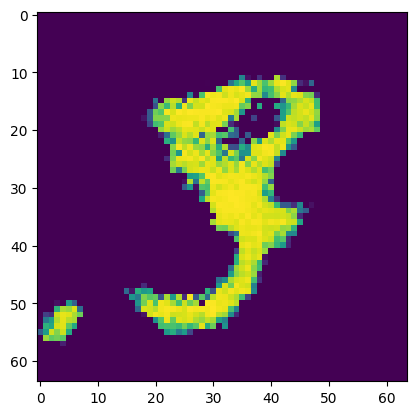

Epoch [43/50] Batch 800/938                   Loss D: -7444.7944, loss G: 299747.9688
tensor([7, 3, 7, 4, 4, 2, 1, 8, 7, 6, 1, 8, 1, 9, 0, 3, 1, 6, 7, 4, 1, 0, 6, 7,
        6, 1, 2, 3, 5, 8, 9, 6, 8, 9, 5, 6, 5, 6, 3, 1, 8, 1, 3, 6, 2, 6, 5, 6,
        2, 1, 0, 7, 3, 4, 7, 5, 9, 4, 6, 7, 2, 9, 6, 7], device='cuda:0')


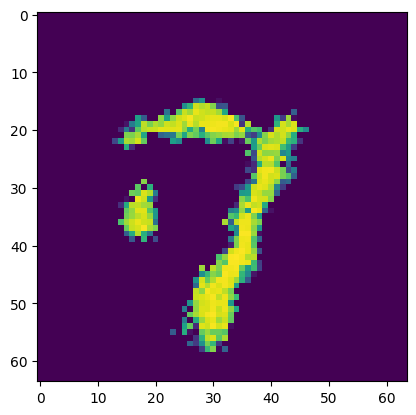

Epoch [43/50] Batch 900/938                   Loss D: -640063.2500, loss G: 303459.9375
tensor([3, 9, 7, 3, 2, 4, 9, 0, 1, 0, 3, 6, 2, 3, 1, 1, 4, 7, 7, 3, 8, 0, 5, 5,
        9, 3, 6, 5, 7, 5, 7, 9, 0, 4, 4, 3, 8, 3, 1, 3, 4, 8, 1, 7, 8, 5, 9, 8,
        9, 6, 5, 8, 4, 2, 4, 6, 8, 2, 1, 6, 9, 7, 1, 7], device='cuda:0')


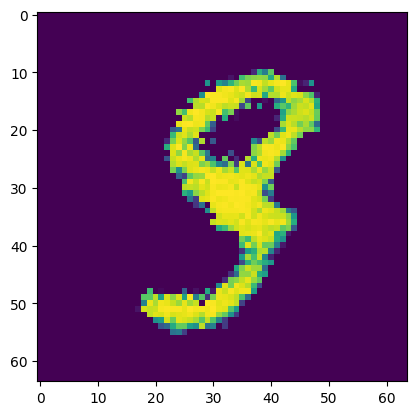

Epoch [44/50] Batch 100/938                   Loss D: -629791.6250, loss G: 300042.3125
tensor([2, 7, 5, 2, 4, 3, 4, 0, 6, 8, 8, 6, 6, 1, 5, 3, 9, 3, 2, 1, 7, 9, 1, 1,
        4, 7, 3, 8, 4, 2, 6, 4, 8, 0, 2, 8, 4, 6, 7, 4, 1, 5, 5, 1, 4, 3, 7, 0,
        5, 5, 3, 8, 8, 3, 5, 3, 2, 3, 3, 7, 4, 3, 8, 3], device='cuda:0')


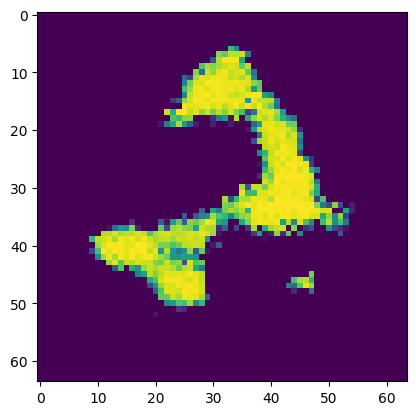

Epoch [44/50] Batch 200/938                   Loss D: -621019.4375, loss G: 293566.7500
tensor([0, 3, 3, 4, 9, 0, 4, 6, 8, 4, 7, 8, 5, 4, 4, 5, 2, 9, 1, 2, 1, 0, 7, 2,
        3, 7, 2, 7, 2, 3, 1, 8, 9, 2, 6, 4, 4, 5, 0, 6, 4, 1, 1, 9, 5, 5, 1, 1,
        1, 5, 2, 9, 2, 6, 7, 2, 2, 4, 0, 1, 2, 5, 6, 4], device='cuda:0')


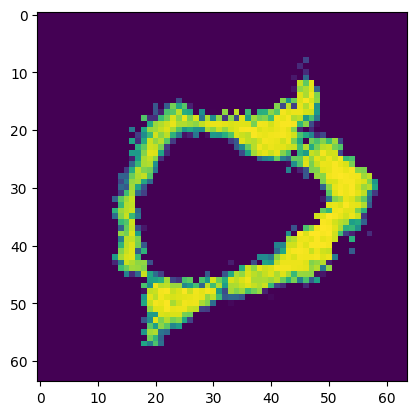

Epoch [44/50] Batch 300/938                   Loss D: -650992.6875, loss G: 306810.3125
tensor([1, 7, 6, 4, 0, 2, 7, 2, 3, 7, 4, 1, 3, 3, 1, 9, 6, 8, 9, 5, 1, 6, 8, 5,
        9, 3, 1, 4, 7, 4, 6, 3, 5, 7, 4, 9, 6, 3, 8, 6, 0, 3, 8, 4, 7, 0, 2, 9,
        0, 6, 5, 7, 6, 1, 4, 5, 3, 6, 8, 8, 8, 2, 3, 9], device='cuda:0')


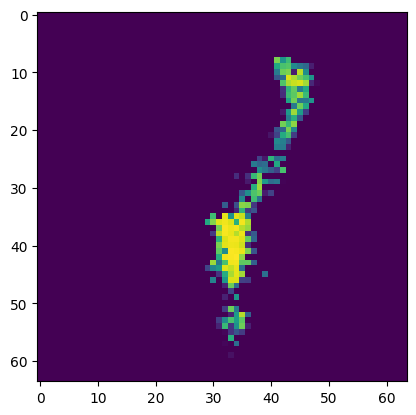

Epoch [44/50] Batch 400/938                   Loss D: -658705.8125, loss G: 309643.3125
tensor([7, 9, 2, 0, 6, 2, 9, 0, 7, 6, 5, 5, 6, 2, 0, 5, 0, 3, 0, 9, 7, 6, 8, 8,
        3, 2, 6, 6, 9, 0, 8, 9, 8, 7, 7, 8, 0, 9, 3, 0, 1, 0, 5, 2, 5, 8, 8, 8,
        3, 4, 1, 8, 0, 0, 7, 5, 3, 9, 1, 6, 8, 2, 4, 1], device='cuda:0')


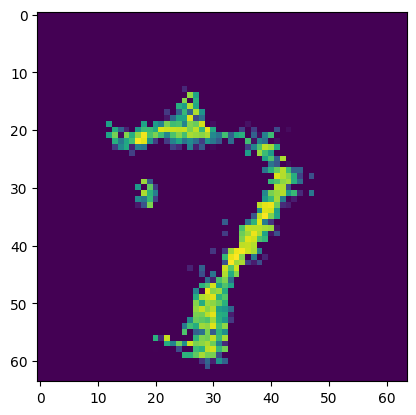

Epoch [44/50] Batch 500/938                   Loss D: -652880.5000, loss G: 309967.3750
tensor([0, 0, 9, 0, 5, 6, 2, 3, 0, 7, 5, 1, 7, 4, 6, 5, 9, 9, 2, 2, 3, 4, 3, 8,
        1, 1, 9, 9, 8, 1, 9, 3, 8, 7, 5, 2, 8, 0, 3, 6, 5, 5, 1, 9, 5, 8, 8, 5,
        0, 7, 4, 8, 7, 1, 2, 1, 6, 7, 5, 9, 8, 3, 0, 2], device='cuda:0')


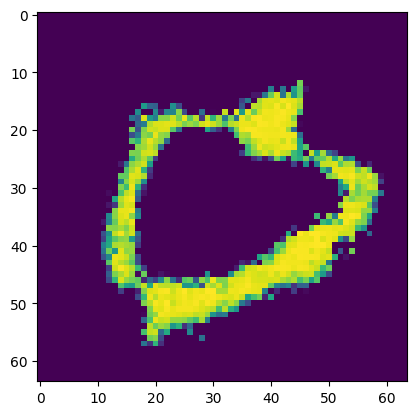

Epoch [44/50] Batch 600/938                   Loss D: -631245.9375, loss G: 304716.3750
tensor([0, 4, 7, 4, 9, 8, 1, 7, 8, 3, 2, 1, 7, 4, 4, 6, 7, 2, 3, 4, 4, 8, 9, 8,
        6, 1, 1, 1, 4, 6, 1, 6, 4, 5, 6, 2, 8, 0, 0, 7, 0, 2, 1, 6, 5, 5, 8, 7,
        5, 7, 6, 2, 6, 8, 3, 9, 6, 6, 3, 3, 5, 3, 6, 5], device='cuda:0')


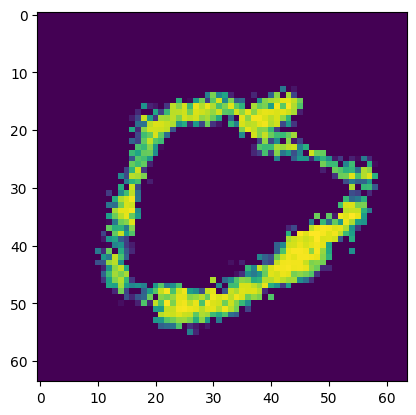

Epoch [44/50] Batch 700/938                   Loss D: -629304.6875, loss G: 308708.5000
tensor([5, 7, 8, 5, 2, 0, 5, 5, 4, 6, 1, 3, 3, 7, 7, 6, 5, 5, 2, 5, 6, 2, 8, 8,
        5, 8, 6, 0, 2, 2, 7, 9, 6, 3, 7, 3, 9, 2, 3, 6, 9, 9, 2, 5, 1, 9, 8, 3,
        3, 9, 3, 9, 7, 5, 5, 3, 1, 1, 9, 8, 1, 1, 4, 6], device='cuda:0')


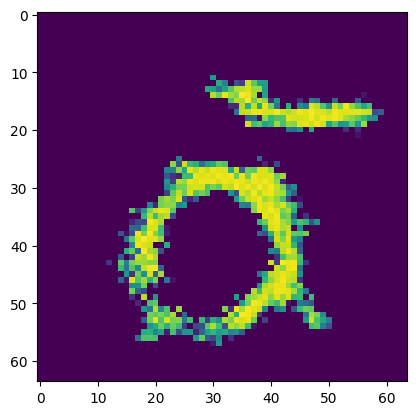

Epoch [44/50] Batch 800/938                   Loss D: -646540.3750, loss G: 308513.5000
tensor([0, 3, 8, 8, 2, 2, 7, 4, 2, 7, 3, 9, 1, 7, 0, 0, 6, 1, 5, 0, 9, 8, 8, 0,
        9, 6, 1, 9, 6, 6, 1, 9, 9, 5, 3, 7, 4, 5, 3, 5, 1, 9, 1, 1, 5, 1, 5, 6,
        1, 5, 6, 6, 1, 0, 5, 9, 6, 5, 6, 6, 3, 5, 8, 8], device='cuda:0')


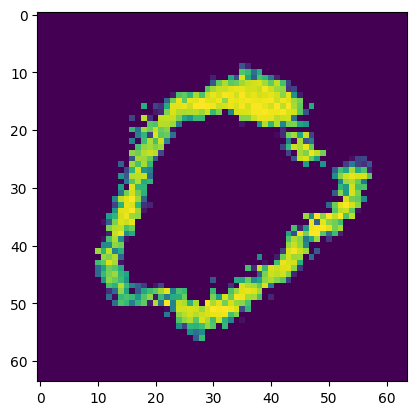

Epoch [44/50] Batch 900/938                   Loss D: -655720.1250, loss G: 313761.0625
tensor([1, 7, 4, 8, 9, 6, 7, 0, 7, 4, 9, 8, 7, 3, 6, 9, 0, 3, 2, 6, 2, 6, 8, 2,
        7, 1, 9, 9, 0, 7, 8, 1, 8, 7, 3, 0, 5, 5, 6, 3, 9, 0, 5, 1, 1, 4, 3, 6,
        6, 5, 5, 1, 0, 1, 0, 9, 1, 8, 7, 7, 3, 7, 4, 5], device='cuda:0')


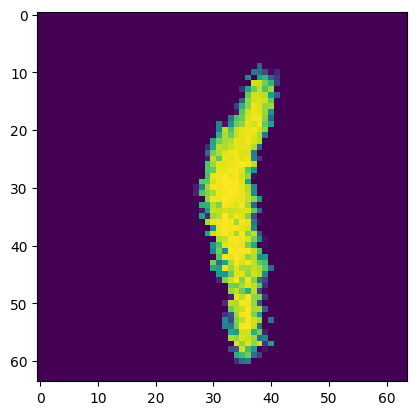

Epoch [45/50] Batch 100/938                   Loss D: -662975.1250, loss G: 315492.7500
tensor([2, 0, 2, 6, 5, 9, 7, 6, 7, 2, 0, 2, 8, 1, 2, 6, 3, 5, 2, 3, 4, 9, 5, 4,
        9, 7, 1, 9, 4, 6, 2, 8, 8, 0, 0, 6, 6, 6, 9, 5, 7, 5, 2, 2, 1, 0, 2, 6,
        6, 2, 8, 0, 2, 0, 6, 9, 7, 8, 0, 5, 2, 8, 9, 8], device='cuda:0')


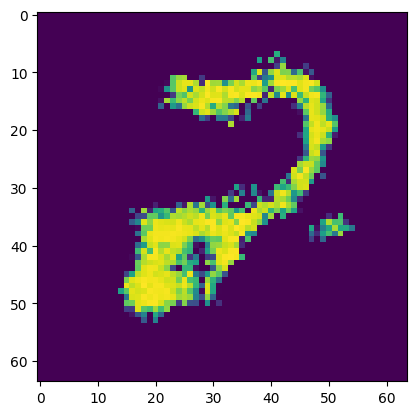

Epoch [45/50] Batch 200/938                   Loss D: -675912.1250, loss G: 318976.2188
tensor([6, 4, 7, 3, 6, 6, 5, 5, 1, 3, 1, 8, 6, 1, 8, 4, 5, 7, 4, 7, 6, 1, 8, 0,
        3, 8, 6, 8, 4, 6, 0, 6, 2, 8, 4, 4, 1, 2, 0, 7, 1, 9, 0, 5, 2, 0, 1, 4,
        8, 4, 9, 4, 3, 2, 8, 6, 0, 2, 1, 0, 8, 7, 2, 1], device='cuda:0')


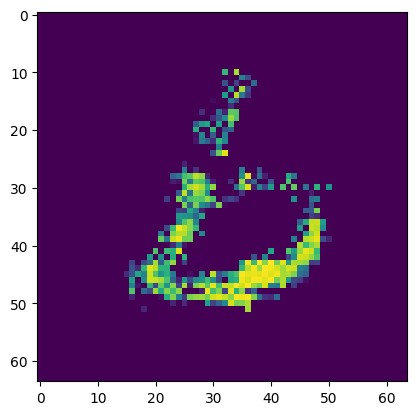

Epoch [45/50] Batch 300/938                   Loss D: -683935.8750, loss G: 321426.4062
tensor([1, 4, 5, 4, 4, 4, 4, 7, 7, 3, 8, 3, 8, 5, 6, 8, 7, 6, 3, 3, 5, 7, 5, 4,
        3, 1, 6, 2, 1, 1, 9, 0, 7, 2, 9, 9, 7, 0, 1, 3, 6, 8, 4, 5, 9, 1, 0, 7,
        5, 1, 4, 5, 0, 9, 6, 9, 6, 1, 2, 6, 4, 0, 4, 8], device='cuda:0')


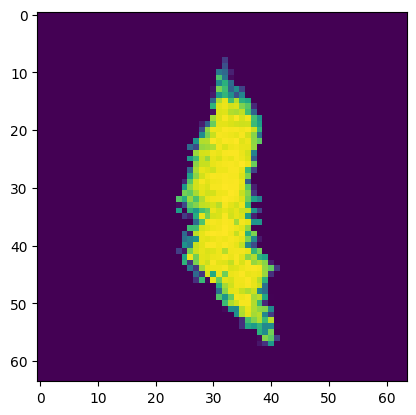

Epoch [45/50] Batch 400/938                   Loss D: -675267.9375, loss G: 320896.8750
tensor([9, 8, 8, 6, 6, 0, 3, 6, 8, 8, 5, 5, 6, 2, 7, 8, 6, 7, 1, 4, 6, 3, 0, 6,
        4, 8, 3, 7, 4, 1, 9, 6, 7, 4, 0, 3, 9, 4, 4, 8, 2, 9, 2, 2, 2, 4, 9, 0,
        8, 1, 3, 7, 3, 9, 8, 9, 7, 8, 7, 7, 5, 9, 1, 6], device='cuda:0')


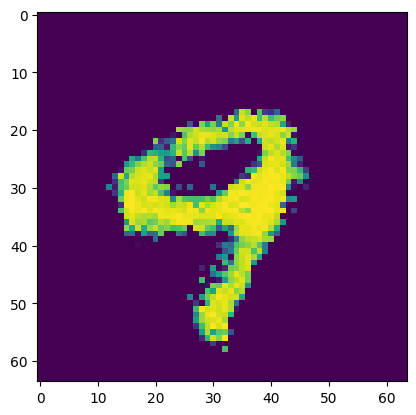

Epoch [45/50] Batch 500/938                   Loss D: -633910.6250, loss G: 318028.9375
tensor([0, 5, 3, 7, 9, 4, 2, 9, 9, 4, 8, 8, 3, 2, 9, 8, 7, 7, 5, 6, 5, 8, 4, 4,
        3, 0, 3, 5, 6, 3, 4, 3, 6, 2, 5, 0, 9, 5, 8, 7, 9, 3, 3, 8, 3, 2, 6, 7,
        3, 2, 2, 5, 9, 8, 9, 5, 4, 3, 7, 8, 9, 6, 4, 6], device='cuda:0')


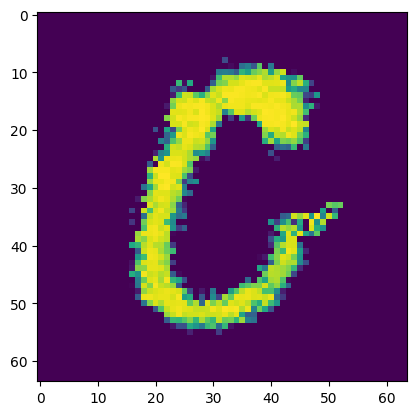

Epoch [45/50] Batch 600/938                   Loss D: 1283.6567, loss G: 325277.8750
tensor([7, 3, 4, 3, 4, 4, 9, 5, 5, 5, 4, 3, 5, 8, 4, 9, 6, 3, 8, 8, 1, 4, 7, 7,
        5, 0, 2, 9, 2, 9, 3, 9, 4, 1, 7, 5, 3, 9, 0, 6, 1, 5, 4, 0, 7, 1, 5, 9,
        2, 4, 2, 8, 1, 2, 9, 8, 0, 6, 6, 0, 7, 8, 1, 4], device='cuda:0')


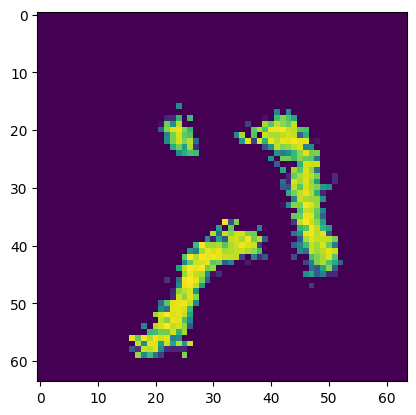

Epoch [45/50] Batch 700/938                   Loss D: -680641.8125, loss G: 325691.1875
tensor([9, 6, 6, 5, 1, 9, 2, 4, 3, 7, 8, 2, 0, 7, 7, 3, 1, 5, 8, 1, 5, 3, 6, 6,
        4, 6, 3, 8, 4, 6, 3, 6, 5, 4, 3, 1, 7, 1, 5, 1, 4, 4, 3, 5, 6, 4, 7, 2,
        5, 0, 9, 9, 9, 3, 0, 1, 8, 7, 0, 8, 6, 5, 5, 6], device='cuda:0')


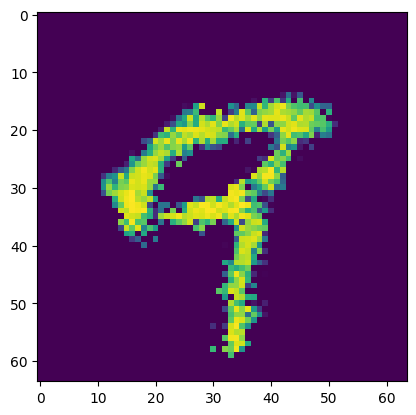

Epoch [45/50] Batch 800/938                   Loss D: 178129.4688, loss G: 327668.3125
tensor([1, 5, 7, 3, 0, 3, 1, 4, 9, 0, 4, 9, 2, 9, 1, 9, 0, 7, 0, 7, 2, 9, 7, 7,
        4, 3, 8, 3, 4, 9, 1, 7, 2, 2, 3, 2, 0, 7, 6, 1, 3, 4, 3, 5, 2, 1, 2, 8,
        5, 8, 1, 8, 2, 7, 1, 3, 7, 1, 2, 0, 7, 7, 7, 7], device='cuda:0')


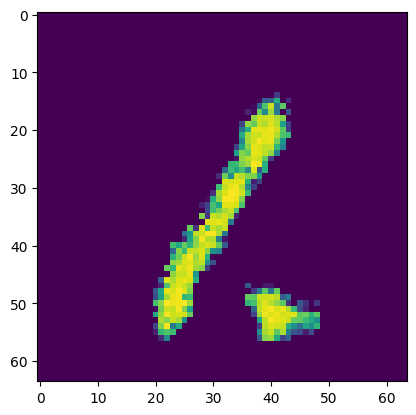

Epoch [45/50] Batch 900/938                   Loss D: -704672.8125, loss G: 331398.0625
tensor([1, 5, 5, 8, 5, 9, 3, 4, 4, 8, 2, 8, 2, 4, 9, 9, 3, 9, 7, 8, 9, 2, 0, 9,
        6, 0, 2, 0, 9, 8, 7, 2, 1, 4, 1, 3, 2, 7, 6, 7, 8, 8, 9, 3, 1, 8, 5, 4,
        6, 5, 2, 2, 2, 4, 9, 6, 0, 8, 3, 0, 8, 5, 1, 7], device='cuda:0')


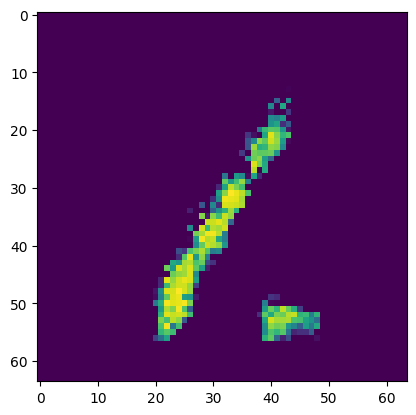

Epoch [46/50] Batch 100/938                   Loss D: -712330.2500, loss G: 334707.4375
tensor([9, 8, 6, 0, 0, 9, 2, 5, 1, 1, 6, 5, 2, 1, 5, 6, 2, 5, 1, 6, 7, 9, 2, 3,
        1, 0, 2, 6, 6, 0, 9, 7, 8, 2, 8, 0, 9, 0, 8, 2, 4, 5, 3, 8, 5, 9, 9, 8,
        1, 9, 2, 7, 8, 9, 2, 6, 8, 9, 3, 5, 2, 2, 8, 1], device='cuda:0')


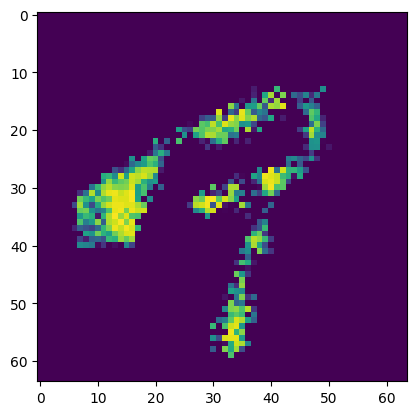

Epoch [46/50] Batch 200/938                   Loss D: 775.3239, loss G: 336571.8750
tensor([7, 4, 2, 6, 1, 1, 9, 4, 9, 1, 5, 1, 8, 4, 1, 0, 1, 1, 7, 6, 2, 9, 3, 3,
        9, 9, 6, 7, 4, 2, 9, 6, 4, 1, 7, 0, 8, 8, 4, 7, 0, 2, 7, 4, 8, 1, 5, 7,
        2, 1, 3, 7, 0, 7, 4, 6, 5, 1, 7, 6, 6, 3, 0, 6], device='cuda:0')


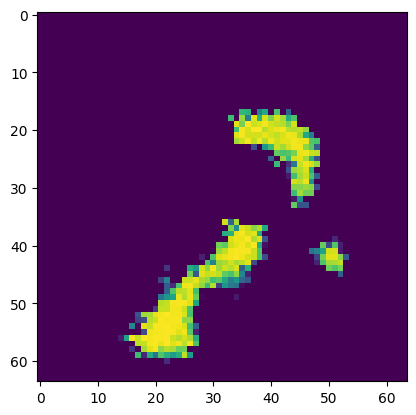

Epoch [46/50] Batch 300/938                   Loss D: -713798.5625, loss G: 337336.2188
tensor([4, 6, 3, 1, 1, 8, 1, 8, 1, 1, 9, 7, 8, 9, 0, 3, 7, 0, 7, 5, 6, 7, 5, 6,
        2, 2, 3, 7, 5, 8, 3, 6, 6, 0, 4, 5, 1, 0, 6, 0, 8, 0, 1, 0, 4, 2, 7, 8,
        2, 5, 1, 1, 6, 4, 1, 1, 3, 4, 2, 4, 0, 4, 2, 0], device='cuda:0')


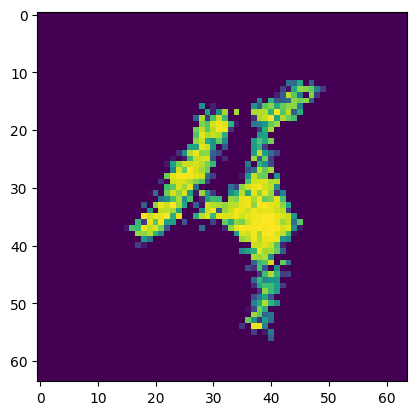

Epoch [46/50] Batch 400/938                   Loss D: -710850.6250, loss G: 337527.0625
tensor([3, 0, 0, 0, 3, 8, 2, 5, 6, 9, 1, 4, 0, 9, 0, 3, 1, 3, 3, 8, 4, 1, 9, 6,
        4, 2, 3, 8, 4, 5, 1, 2, 6, 4, 7, 9, 2, 6, 1, 0, 4, 9, 6, 7, 8, 3, 1, 9,
        6, 1, 6, 5, 7, 6, 9, 8, 3, 3, 9, 8, 3, 8, 4, 3], device='cuda:0')


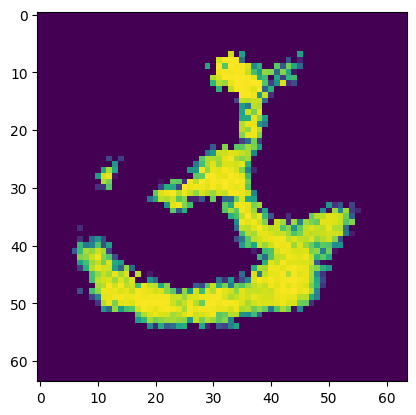

Epoch [46/50] Batch 500/938                   Loss D: -712827.9375, loss G: 340675.8125
tensor([4, 8, 7, 6, 3, 6, 0, 7, 1, 7, 8, 1, 1, 5, 7, 8, 2, 1, 4, 2, 8, 6, 3, 5,
        8, 7, 0, 0, 4, 0, 8, 7, 2, 9, 9, 1, 3, 0, 1, 0, 3, 6, 2, 4, 4, 7, 9, 5,
        9, 4, 9, 4, 7, 7, 0, 0, 8, 2, 3, 9, 1, 7, 5, 5], device='cuda:0')


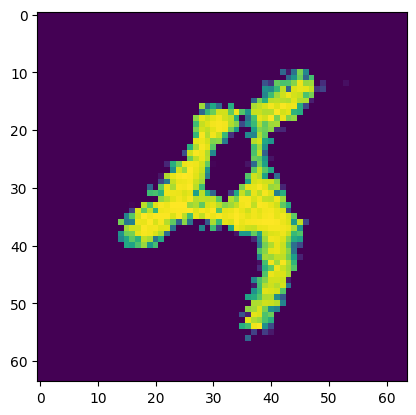

Epoch [46/50] Batch 600/938                   Loss D: -251122.8281, loss G: 287664.5000
tensor([2, 0, 0, 7, 0, 3, 3, 9, 9, 0, 9, 1, 0, 4, 6, 1, 5, 4, 7, 0, 6, 0, 7, 3,
        9, 0, 0, 1, 0, 8, 0, 5, 2, 3, 1, 6, 1, 7, 7, 0, 5, 2, 3, 8, 5, 3, 6, 9,
        8, 0, 8, 9, 8, 2, 4, 3, 1, 1, 6, 9, 5, 3, 4, 8], device='cuda:0')


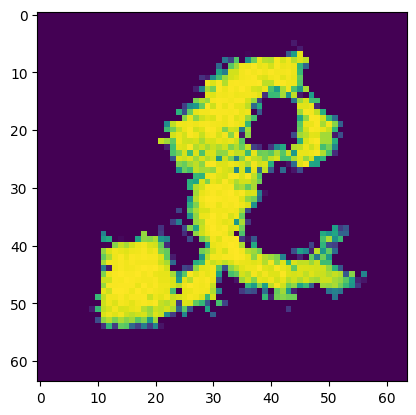

Epoch [46/50] Batch 700/938                   Loss D: -732052.8750, loss G: 345220.4375
tensor([9, 8, 1, 3, 8, 0, 3, 0, 9, 9, 4, 6, 9, 3, 9, 8, 1, 9, 3, 4, 5, 8, 7, 7,
        5, 1, 1, 2, 5, 3, 7, 0, 3, 0, 5, 2, 9, 1, 8, 5, 4, 1, 0, 5, 6, 8, 2, 0,
        6, 1, 3, 0, 3, 9, 7, 8, 5, 0, 2, 5, 0, 5, 1, 1], device='cuda:0')


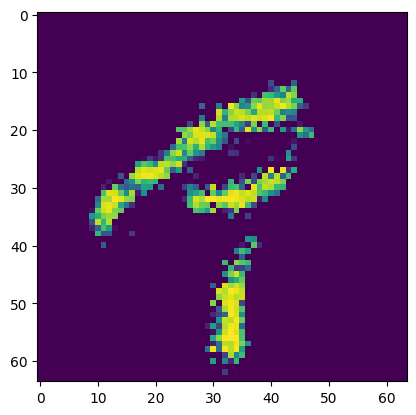

Epoch [46/50] Batch 800/938                   Loss D: -726962.0000, loss G: 345415.3438
tensor([2, 7, 3, 3, 2, 9, 3, 1, 1, 4, 4, 8, 1, 7, 3, 5, 3, 0, 7, 5, 9, 4, 1, 1,
        8, 8, 8, 9, 1, 9, 8, 6, 8, 7, 2, 9, 7, 9, 0, 0, 7, 8, 3, 8, 7, 4, 1, 7,
        7, 1, 5, 0, 3, 0, 9, 5, 6, 6, 6, 7, 0, 0, 2, 9], device='cuda:0')


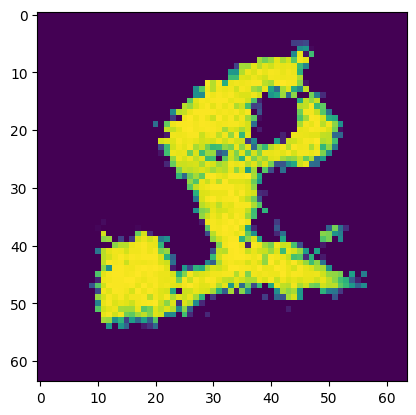

Epoch [46/50] Batch 900/938                   Loss D: -734593.8750, loss G: 348946.4688
tensor([4, 5, 6, 0, 1, 8, 6, 4, 9, 7, 6, 1, 1, 0, 8, 0, 3, 8, 3, 9, 3, 7, 4, 4,
        4, 9, 6, 9, 0, 2, 4, 0, 8, 6, 2, 0, 3, 6, 4, 3, 2, 8, 3, 6, 7, 1, 1, 4,
        8, 2, 2, 8, 9, 7, 7, 8, 4, 0, 9, 2, 5, 8, 4, 1], device='cuda:0')


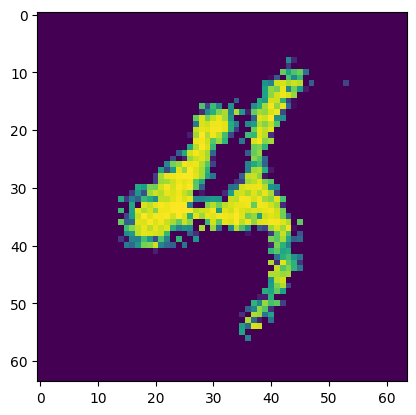

Epoch [47/50] Batch 100/938                   Loss D: -673789.6250, loss G: 333338.5000
tensor([7, 1, 7, 0, 0, 1, 9, 8, 9, 1, 1, 0, 5, 3, 7, 2, 3, 3, 6, 6, 4, 8, 7, 5,
        7, 7, 3, 6, 0, 8, 6, 2, 3, 3, 5, 6, 7, 4, 6, 9, 3, 1, 6, 5, 2, 6, 0, 7,
        1, 6, 7, 1, 3, 0, 3, 7, 1, 1, 8, 5, 3, 5, 7, 7], device='cuda:0')


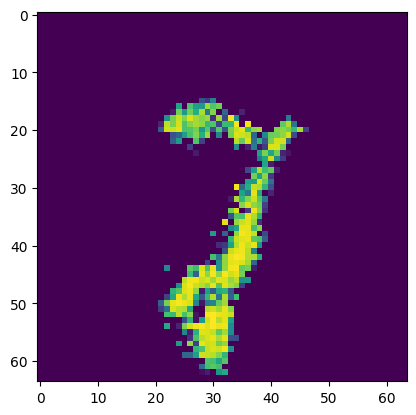

Epoch [47/50] Batch 200/938                   Loss D: -715904.8750, loss G: 343892.9375
tensor([5, 1, 8, 4, 6, 4, 3, 6, 0, 1, 5, 0, 9, 8, 2, 4, 4, 3, 7, 1, 1, 4, 5, 9,
        6, 0, 8, 6, 2, 2, 0, 3, 7, 4, 2, 7, 2, 1, 6, 7, 6, 9, 7, 4, 6, 2, 9, 9,
        2, 3, 2, 8, 6, 7, 5, 0, 0, 1, 1, 3, 0, 9, 1, 9], device='cuda:0')


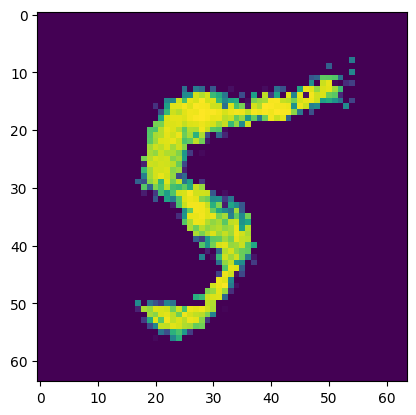

Epoch [47/50] Batch 300/938                   Loss D: -716454.7500, loss G: 347964.2500
tensor([1, 8, 7, 2, 7, 7, 1, 6, 9, 7, 4, 1, 2, 2, 1, 4, 5, 3, 8, 0, 1, 0, 5, 1,
        6, 9, 4, 4, 0, 9, 3, 5, 3, 8, 5, 3, 6, 7, 8, 5, 7, 1, 4, 7, 7, 0, 9, 9,
        6, 6, 4, 3, 0, 2, 6, 5, 6, 2, 5, 7, 8, 4, 7, 8], device='cuda:0')


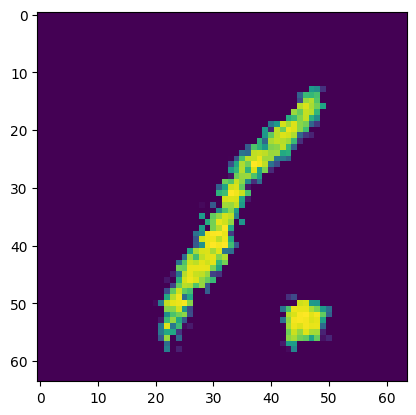

Epoch [47/50] Batch 400/938                   Loss D: -745854.5625, loss G: 355137.0625
tensor([9, 5, 0, 3, 5, 7, 5, 5, 3, 6, 6, 4, 4, 6, 8, 7, 4, 6, 5, 5, 0, 4, 7, 7,
        0, 7, 0, 5, 7, 1, 9, 8, 2, 6, 2, 6, 5, 2, 9, 8, 7, 2, 7, 3, 9, 8, 3, 2,
        1, 0, 4, 4, 4, 6, 1, 7, 1, 3, 1, 5, 0, 2, 2, 8], device='cuda:0')


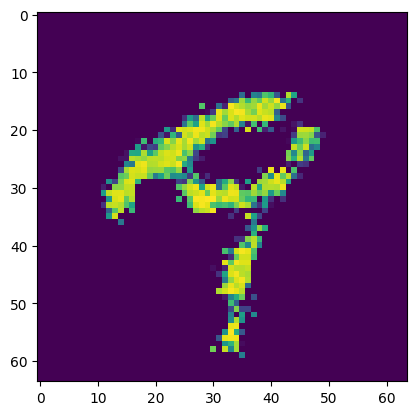

Epoch [47/50] Batch 500/938                   Loss D: -762580.1250, loss G: 359435.6250
tensor([8, 5, 6, 1, 1, 7, 8, 5, 1, 0, 1, 6, 1, 0, 7, 8, 7, 0, 0, 3, 8, 7, 3, 3,
        9, 9, 1, 7, 5, 0, 1, 4, 4, 0, 3, 8, 6, 3, 1, 5, 7, 5, 2, 9, 3, 7, 1, 0,
        6, 0, 1, 9, 4, 8, 9, 9, 4, 3, 8, 2, 9, 5, 7, 9], device='cuda:0')


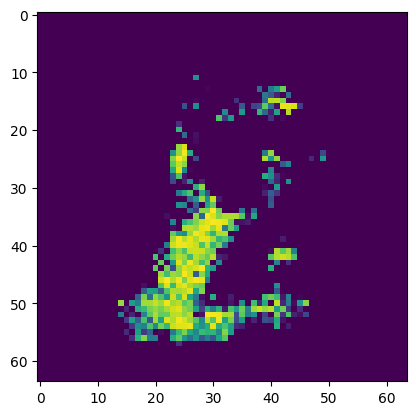

Epoch [47/50] Batch 600/938                   Loss D: -769342.0625, loss G: 362173.8750
tensor([6, 3, 9, 4, 2, 4, 8, 4, 1, 5, 0, 9, 0, 9, 3, 6, 1, 6, 5, 1, 7, 1, 0, 7,
        1, 2, 8, 0, 0, 9, 9, 1, 3, 0, 1, 0, 8, 0, 1, 1, 8, 7, 9, 4, 0, 8, 0, 6,
        1, 3, 9, 6, 5, 0, 7, 5, 9, 0, 2, 7, 7, 1, 3, 8], device='cuda:0')


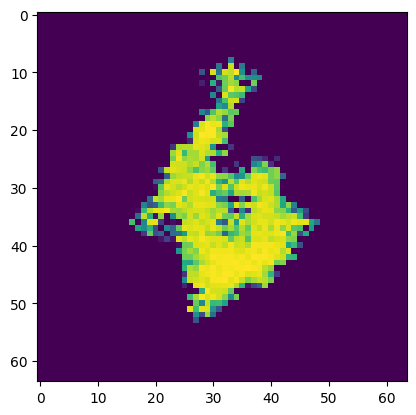

Epoch [47/50] Batch 700/938                   Loss D: -759623.0625, loss G: 361840.5312
tensor([0, 1, 7, 8, 7, 0, 6, 0, 1, 3, 8, 9, 8, 4, 2, 3, 9, 5, 4, 4, 6, 8, 6, 9,
        0, 1, 4, 0, 7, 5, 1, 0, 9, 8, 9, 4, 7, 7, 5, 8, 6, 7, 0, 7, 4, 9, 2, 0,
        5, 2, 6, 7, 7, 3, 8, 5, 5, 7, 7, 3, 5, 3, 8, 7], device='cuda:0')


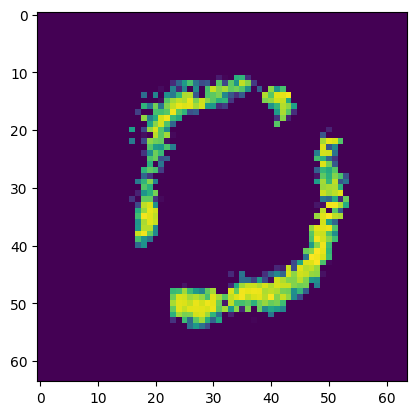

Epoch [47/50] Batch 800/938                   Loss D: -774629.0625, loss G: 366106.1875
tensor([4, 1, 3, 4, 2, 0, 2, 6, 9, 9, 4, 6, 1, 5, 7, 9, 3, 1, 1, 1, 9, 2, 6, 9,
        3, 7, 7, 1, 2, 9, 1, 6, 6, 3, 3, 0, 2, 8, 6, 0, 7, 9, 6, 3, 9, 5, 4, 7,
        5, 2, 1, 0, 3, 7, 9, 7, 7, 0, 7, 6, 0, 9, 1, 5], device='cuda:0')


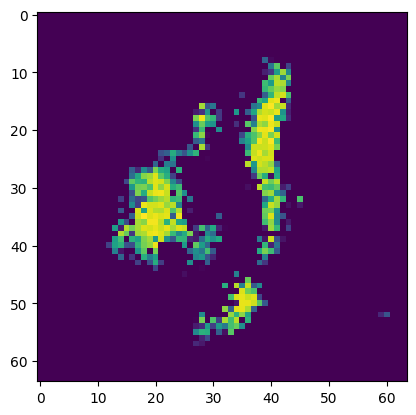

Epoch [47/50] Batch 900/938                   Loss D: -782280.9375, loss G: 368484.9062
tensor([2, 4, 1, 8, 3, 8, 1, 6, 1, 9, 0, 9, 3, 0, 2, 2, 8, 2, 5, 8, 5, 1, 2, 2,
        7, 7, 0, 8, 2, 9, 4, 0, 1, 1, 8, 4, 4, 8, 6, 4, 3, 9, 2, 1, 6, 0, 5, 9,
        2, 2, 0, 3, 0, 7, 1, 3, 0, 4, 6, 2, 5, 4, 5, 2], device='cuda:0')


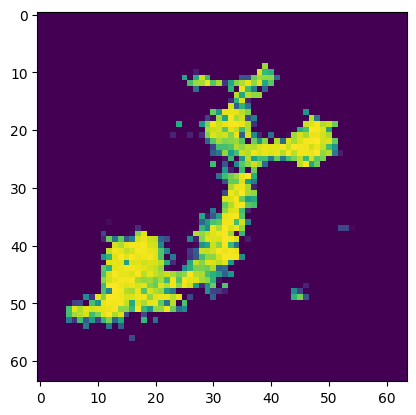

Epoch [48/50] Batch 100/938                   Loss D: 2203.3850, loss G: 368778.6250
tensor([6, 0, 5, 8, 2, 2, 4, 0, 1, 4, 9, 4, 9, 9, 7, 1, 5, 3, 7, 5, 8, 1, 9, 5,
        7, 5, 6, 6, 0, 9, 3, 8, 2, 0, 3, 4, 7, 2, 2, 4, 7, 6, 0, 8, 4, 9, 3, 7,
        8, 1, 4, 1, 7, 1, 8, 2, 9, 8, 3, 1, 7, 6, 8, 3], device='cuda:0')


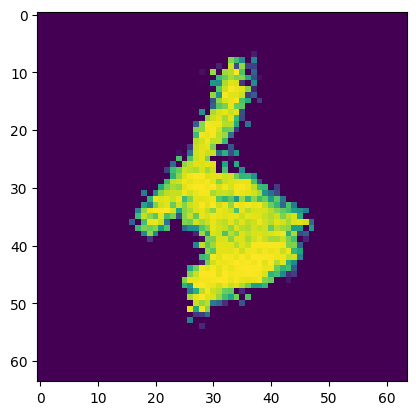

Epoch [48/50] Batch 200/938                   Loss D: -782033.7500, loss G: 371767.6250
tensor([3, 0, 0, 6, 9, 0, 7, 8, 0, 5, 7, 9, 9, 0, 3, 7, 0, 3, 8, 1, 5, 8, 4, 3,
        5, 4, 2, 7, 0, 3, 2, 0, 5, 9, 7, 9, 0, 2, 6, 7, 7, 5, 7, 9, 1, 4, 4, 5,
        6, 7, 3, 9, 7, 9, 7, 0, 0, 5, 0, 1, 5, 3, 3, 2], device='cuda:0')


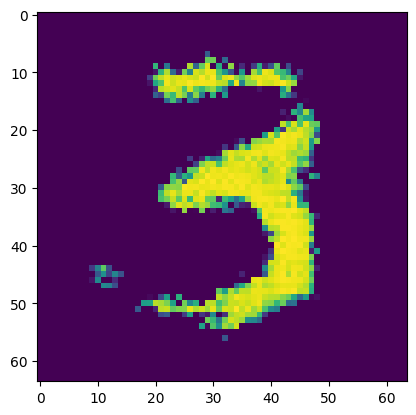

Epoch [48/50] Batch 300/938                   Loss D: -781121.5000, loss G: 372436.5000
tensor([8, 9, 5, 3, 0, 8, 1, 5, 8, 9, 4, 4, 2, 9, 9, 1, 0, 0, 9, 4, 4, 7, 7, 5,
        5, 1, 2, 1, 3, 1, 8, 0, 3, 0, 6, 7, 6, 0, 5, 5, 5, 4, 0, 2, 8, 3, 6, 9,
        2, 7, 0, 7, 0, 6, 1, 9, 5, 8, 3, 7, 1, 2, 6, 5], device='cuda:0')


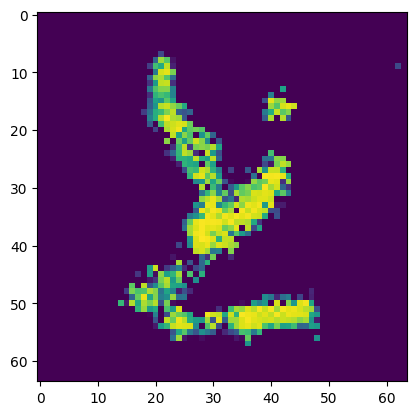

Epoch [48/50] Batch 400/938                   Loss D: -794143.8125, loss G: 375245.3750
tensor([2, 7, 0, 9, 5, 2, 1, 6, 4, 9, 0, 4, 2, 5, 5, 7, 7, 2, 8, 2, 9, 6, 4, 9,
        5, 8, 2, 6, 3, 6, 7, 7, 8, 7, 7, 0, 1, 1, 8, 1, 3, 9, 3, 6, 8, 7, 0, 9,
        1, 0, 4, 9, 4, 5, 4, 3, 7, 8, 8, 0, 1, 4, 6, 2], device='cuda:0')


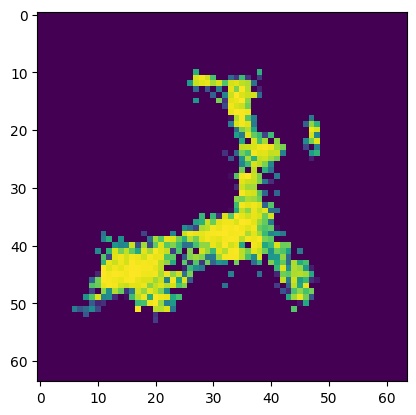

Epoch [48/50] Batch 500/938                   Loss D: -789861.5000, loss G: 375594.1250
tensor([7, 8, 9, 4, 2, 6, 9, 3, 4, 1, 6, 6, 0, 8, 1, 0, 1, 5, 4, 1, 1, 6, 1, 1,
        4, 6, 0, 0, 8, 8, 0, 6, 3, 7, 9, 6, 5, 3, 2, 9, 3, 5, 7, 3, 9, 1, 9, 4,
        3, 3, 7, 5, 4, 3, 2, 8, 0, 8, 5, 3, 8, 8, 4, 8], device='cuda:0')


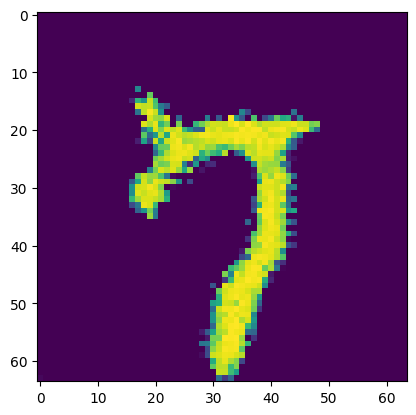

Epoch [48/50] Batch 600/938                   Loss D: -801927.5000, loss G: 379010.8750
tensor([8, 1, 7, 2, 3, 0, 8, 6, 0, 7, 1, 1, 5, 9, 2, 7, 5, 8, 3, 3, 5, 3, 0, 6,
        5, 3, 7, 9, 8, 0, 3, 1, 1, 5, 0, 7, 1, 9, 2, 9, 5, 7, 9, 8, 0, 5, 7, 2,
        9, 4, 6, 7, 9, 2, 9, 3, 4, 9, 3, 8, 4, 1, 3, 3], device='cuda:0')


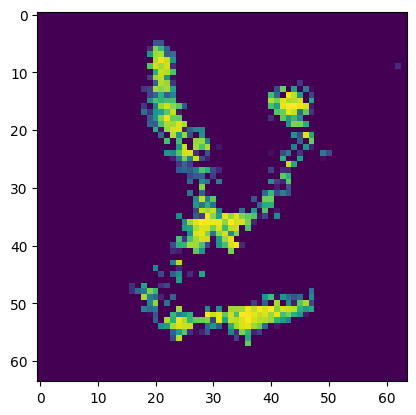

Epoch [48/50] Batch 700/938                   Loss D: -808602.9375, loss G: 381394.8750
tensor([7, 7, 5, 8, 7, 9, 9, 2, 7, 8, 3, 5, 6, 9, 5, 1, 4, 2, 8, 6, 7, 0, 5, 2,
        3, 0, 3, 5, 8, 6, 2, 2, 1, 4, 7, 4, 0, 6, 9, 9, 3, 2, 2, 6, 7, 3, 2, 9,
        6, 4, 1, 5, 4, 7, 8, 2, 9, 9, 5, 3, 7, 6, 2, 5], device='cuda:0')


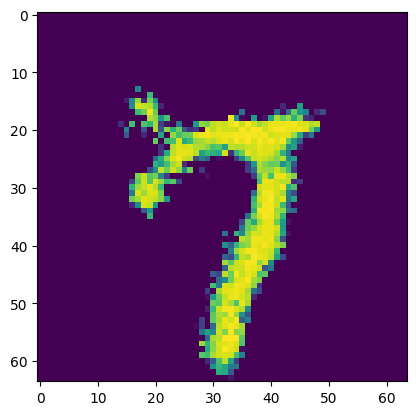

Epoch [48/50] Batch 800/938                   Loss D: -706208.1875, loss G: 359247.0000
tensor([6, 7, 9, 4, 2, 1, 0, 9, 8, 6, 6, 4, 9, 0, 6, 8, 0, 5, 6, 5, 0, 0, 1, 7,
        9, 1, 1, 9, 5, 4, 6, 3, 0, 6, 0, 5, 9, 3, 8, 4, 0, 0, 0, 5, 0, 3, 9, 0,
        6, 9, 4, 2, 8, 4, 1, 4, 8, 9, 5, 3, 0, 3, 9, 6], device='cuda:0')


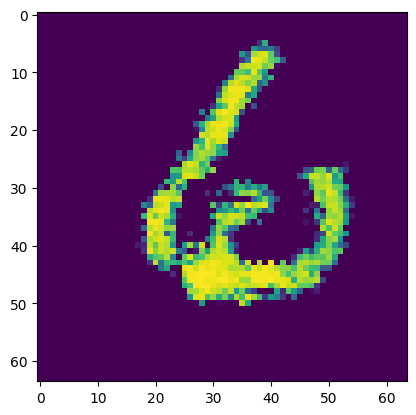

Epoch [48/50] Batch 900/938                   Loss D: -805750.2500, loss G: 384542.6250
tensor([1, 4, 4, 7, 3, 7, 3, 3, 8, 6, 7, 3, 3, 5, 3, 8, 3, 4, 2, 4, 7, 0, 0, 4,
        3, 5, 7, 1, 6, 7, 7, 1, 2, 4, 7, 5, 7, 9, 1, 3, 0, 0, 5, 6, 8, 3, 1, 7,
        5, 9, 5, 8, 1, 9, 3, 6, 0, 8, 6, 8, 3, 4, 6, 3], device='cuda:0')


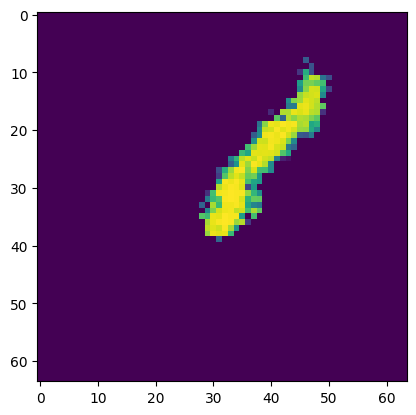

Epoch [49/50] Batch 100/938                   Loss D: -822403.0625, loss G: 388361.6875
tensor([4, 4, 0, 6, 0, 8, 4, 1, 3, 0, 2, 0, 1, 7, 1, 6, 4, 1, 6, 3, 0, 4, 7, 1,
        2, 4, 7, 0, 7, 8, 8, 1, 9, 7, 7, 8, 6, 4, 4, 6, 1, 4, 0, 1, 3, 7, 9, 3,
        0, 6, 5, 6, 2, 4, 0, 8, 7, 9, 9, 1, 0, 6, 8, 5], device='cuda:0')


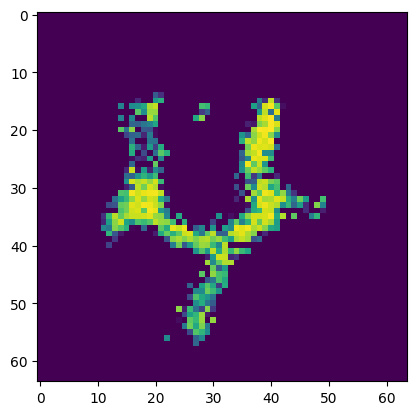

Epoch [49/50] Batch 200/938                   Loss D: -808448.7500, loss G: 390673.3438
tensor([1, 2, 0, 0, 5, 2, 9, 9, 7, 1, 8, 3, 6, 9, 6, 9, 3, 8, 1, 5, 3, 7, 4, 6,
        9, 8, 8, 6, 0, 8, 1, 0, 3, 9, 6, 5, 3, 3, 4, 1, 6, 3, 1, 7, 6, 3, 4, 1,
        8, 6, 3, 8, 8, 6, 9, 3, 0, 1, 3, 2, 0, 5, 7, 6], device='cuda:0')


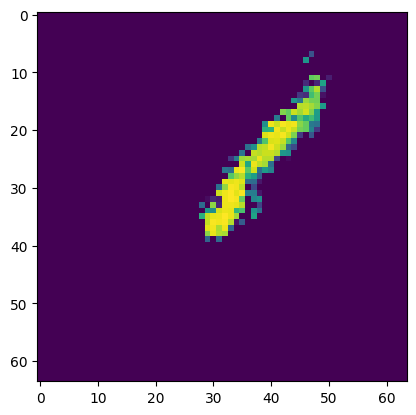

Epoch [49/50] Batch 300/938                   Loss D: -835049.1875, loss G: 393626.3438
tensor([9, 3, 2, 5, 3, 3, 1, 3, 1, 7, 6, 9, 4, 6, 4, 2, 0, 7, 3, 5, 3, 5, 6, 2,
        9, 8, 1, 4, 7, 4, 6, 3, 4, 1, 4, 8, 8, 8, 8, 5, 5, 8, 7, 0, 3, 2, 7, 7,
        2, 4, 7, 1, 1, 9, 3, 7, 3, 9, 3, 9, 5, 1, 4, 9], device='cuda:0')


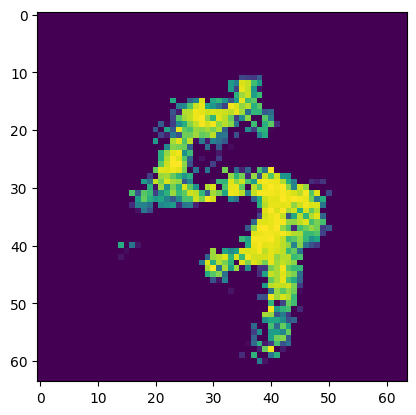

Epoch [49/50] Batch 400/938                   Loss D: -224.2587, loss G: 394829.6250
tensor([4, 0, 3, 7, 1, 1, 9, 7, 2, 3, 6, 5, 1, 6, 2, 1, 3, 2, 4, 3, 4, 9, 4, 6,
        7, 3, 2, 2, 1, 4, 1, 2, 1, 7, 4, 2, 1, 2, 8, 6, 2, 7, 4, 5, 1, 1, 9, 4,
        1, 0, 9, 0, 6, 8, 0, 5, 3, 6, 0, 7, 0, 4, 2, 9], device='cuda:0')


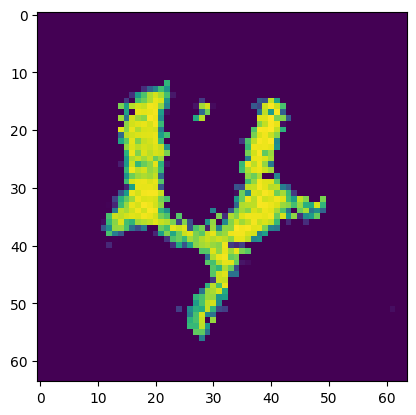

Epoch [49/50] Batch 500/938                   Loss D: -819622.8750, loss G: 393483.0312
tensor([7, 3, 5, 2, 8, 2, 4, 2, 3, 9, 4, 1, 2, 3, 3, 4, 6, 4, 7, 1, 3, 0, 9, 7,
        8, 8, 5, 7, 8, 9, 2, 8, 5, 7, 9, 6, 3, 3, 4, 7, 3, 7, 4, 4, 7, 7, 7, 3,
        3, 2, 1, 1, 3, 3, 8, 8, 9, 1, 7, 8, 3, 2, 5, 1], device='cuda:0')


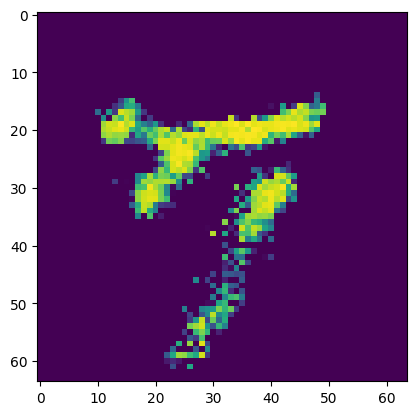

Epoch [49/50] Batch 600/938                   Loss D: -829491.6875, loss G: 395575.8750
tensor([0, 4, 4, 4, 9, 7, 1, 1, 8, 6, 9, 8, 1, 0, 8, 1, 9, 8, 3, 4, 3, 4, 8, 3,
        4, 1, 3, 1, 0, 0, 7, 5, 3, 1, 8, 2, 8, 8, 4, 6, 6, 6, 0, 1, 5, 5, 4, 0,
        0, 4, 5, 5, 6, 4, 5, 1, 0, 4, 0, 4, 1, 0, 1, 1], device='cuda:0')


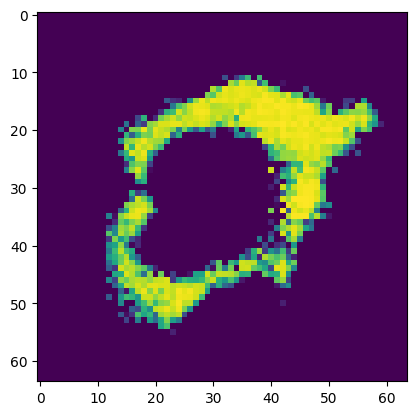

Epoch [49/50] Batch 700/938                   Loss D: -833753.6875, loss G: 396810.5938
tensor([0, 1, 7, 1, 9, 0, 2, 2, 3, 0, 5, 1, 6, 1, 0, 7, 3, 0, 6, 1, 5, 1, 3, 6,
        9, 9, 3, 7, 1, 0, 0, 7, 1, 8, 7, 0, 4, 4, 6, 3, 7, 7, 7, 0, 2, 4, 7, 5,
        2, 9, 0, 6, 4, 2, 2, 0, 0, 8, 5, 3, 4, 3, 9, 7], device='cuda:0')


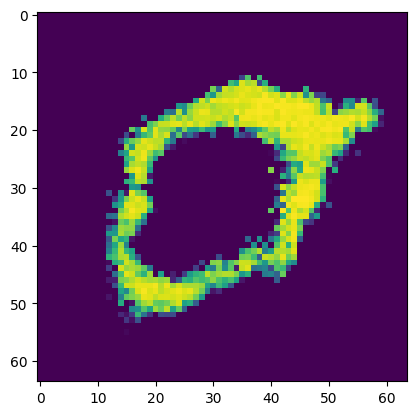

Epoch [49/50] Batch 800/938                   Loss D: -847518.1875, loss G: 400585.5000
tensor([2, 6, 1, 5, 0, 5, 1, 7, 9, 9, 6, 1, 2, 9, 5, 8, 6, 1, 6, 0, 5, 0, 4, 6,
        7, 4, 2, 9, 9, 2, 2, 4, 5, 3, 7, 7, 7, 2, 6, 6, 3, 3, 2, 1, 3, 2, 4, 5,
        4, 0, 2, 7, 1, 6, 1, 5, 7, 3, 7, 3, 5, 7, 6, 2], device='cuda:0')


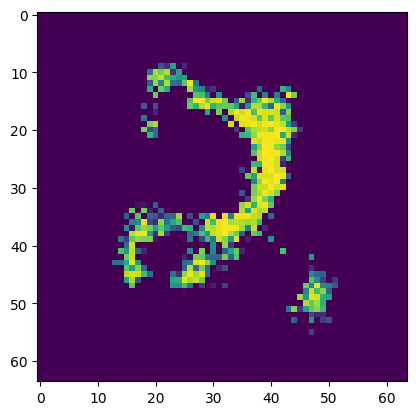

Epoch [49/50] Batch 900/938                   Loss D: -835947.8750, loss G: 400534.4688
tensor([3, 2, 1, 1, 4, 1, 0, 9, 2, 3, 7, 4, 3, 6, 7, 5, 2, 1, 5, 2, 7, 9, 0, 5,
        6, 6, 4, 3, 3, 3, 1, 3, 5, 6, 5, 0, 7, 7, 9, 4, 3, 7, 6, 2, 2, 6, 8, 7,
        8, 8, 8, 7, 0, 0, 2, 8, 8, 9, 6, 6, 2, 9, 6, 2], device='cuda:0')


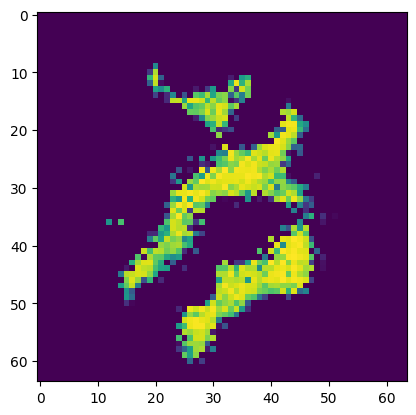

In [10]:
disc = Discriminator(channel_img , feature_critic , nums_classes , image_size).cuda()
gen = Generator(z, channel_img , feature_gen, nums_classes , image_size , gen_embedding ).cuda()

opt_gen = optim.RMSprop(gen.parameters(), lr=lr)
opt_critic = optim.RMSprop(disc.parameters(), lr=lr)

writer_real = SummaryWriter(f"logs/GAN_MNIST/real")
writer_fake = SummaryWriter(f"logs/GAN_MNIST/fake")


fixed_noise = torch.randn(64,z,1,1).cuda()
gen.train()
disc.train()
LAMBDA_GP = 10
step = 0
img_list = []
WEIGHT_CLIP = 0.01
G_losses_wgan = []
D_losses_wgan = []

for epoch in range(num_epochs):
  for batch_idx, (real , labels) in enumerate(dataloader):
    real = real.cuda()
    batch_size = real.shape[0]
    labels = labels.cuda()

    for _ in range(critic_iterations):
      noise = torch.randn(batch_size , z , 1 , 1).cuda()
      fake = gen(noise , labels)
      #print(fake.shape)
      #print(real.shape)
      #print(labels.shape)
      critic_real = disc(real , labels).reshape(-1)
      #print(critic_real.shape)
      critic_fake = disc(fake , labels).reshape(-1)
    
      gp = gradient_penalty(disc, labels,  real, fake, device='cuda')
      loss_critic = (-(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp)
      disc.zero_grad()
      loss_critic.backward(retain_graph=True)
      opt_critic.step()

    noise = torch.randn(batch_size , z , 1 , 1).cuda()
    fake = gen(noise , labels)
    gen_fake = disc(fake , labels).reshape(-1)
    loss_gen = -torch.mean(gen_fake)
    gen.zero_grad()
    G_losses_wgan.append(loss_gen.item())
    D_losses_wgan.append(loss_critic.item())
    loss_gen.backward()
    opt_gen.step()
    if batch_idx % 100 == 0 and batch_idx > 0:
            print(
                f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )
            with torch.no_grad():
                fake = gen(fixed_noise , labels).detach().cpu()
                print(labels)

                image_np = fake[0].numpy()
                img_np = np.transpose(image_np, (1, 2, 0)).clip(0,1)
                plt.imshow(img_np)
                plt.show()
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)
                img_list.append(fake)

            step += 1



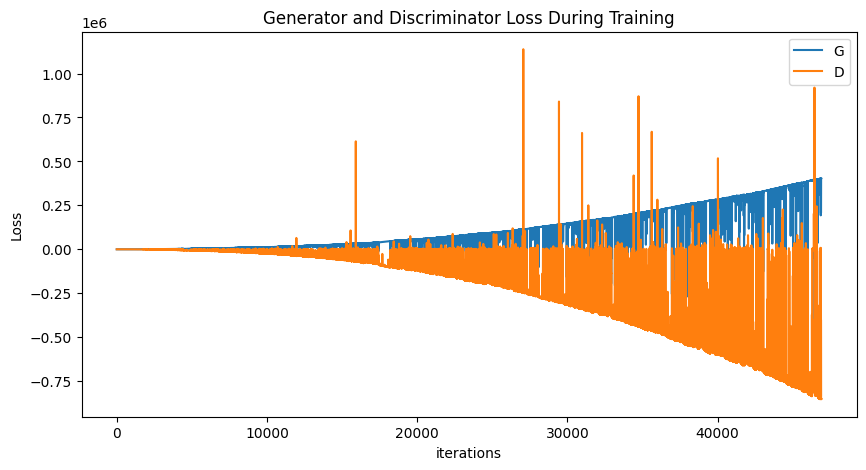

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses_wgan,label="G")
plt.plot(D_losses_wgan,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [12]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [13]:
%load_ext tensorboard

In [ ]:
%reload_ext tensorboard

In [14]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [15]:
!rm -rf fake_images_gan

In [16]:
!rm -rf real_images_gan

In [17]:
import os
from torchvision import transforms
from PIL import Image

if not os.path.exists("real_images_gan"):
    os.makedirs("real_images_gan")


all_images = []

for batch_images in dataloader:
    all_images.extend(batch_images)

all_real = all_images[0:1000]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [18]:
real_path_list_gan = []
for i, tensor in enumerate(all_real):
    # Check if the tensor has the correct dimensions
    if tensor[0].ndimension() in {2, 3}:
        # convert the tensor to a PIL image
        pil_image = transforms.ToPILImage()(tensor[0])

        # create a unique file name based on the loop variable 'i'
        file_name = f"real_image_{i}.jpg"

        # define the path to save the image
        save_path = os.path.join("real_images_gan", file_name)
        real_path_list_gan.append(save_path)

        # save the image
        pil_image.save(save_path)
    else:
        print(f"Skipping tensor {i} because its a label {tensor[0].shape}")

Skipping tensor 1 because its a label torch.Size([])
Skipping tensor 3 because its a label torch.Size([])
Skipping tensor 5 because its a label torch.Size([])
Skipping tensor 7 because its a label torch.Size([])
Skipping tensor 9 because its a label torch.Size([])
Skipping tensor 11 because its a label torch.Size([])
Skipping tensor 13 because its a label torch.Size([])
Skipping tensor 15 because its a label torch.Size([])
Skipping tensor 17 because its a label torch.Size([])
Skipping tensor 19 because its a label torch.Size([])
Skipping tensor 21 because its a label torch.Size([])
Skipping tensor 23 because its a label torch.Size([])
Skipping tensor 25 because its a label torch.Size([])
Skipping tensor 27 because its a label torch.Size([])
Skipping tensor 29 because its a label torch.Size([])
Skipping tensor 31 because its a label torch.Size([])
Skipping tensor 33 because its a label torch.Size([])
Skipping tensor 35 because its a label torch.Size([])
Skipping tensor 37 because its a 

In [19]:
# Create a new list containing only tensors with the same shape as the first tensor in the list
same_shape_images = [batch for batch in img_list if batch.shape == img_list[0].shape]

# Stack the tensors in the new list
generated_images = torch.stack(same_shape_images)

all_fake_images = []

for batch_images in generated_images:
    all_fake_images.extend(batch_images)

l = len(all_fake_images)

In [20]:
import os
if not os.path.exists("fake_images_gan"):
    os.makedirs("fake_images_gan")



fake_images = all_fake_images[l-1-1000:l-1]
fake_image_gan = []

#print(fake_images)
for i, tensor in enumerate(all_fake_images):
    if tensor[0].ndimension() in {2, 3}:
        # convert the tensor to a PIL image
        pil_image = transforms.ToPILImage()(tensor[0])

        # create a unique file name based on the loop variable 'i'
        file_name = f"fa_image_{i}.jpg"

        # define the path to save the image
        save_path = os.path.join("real_images_gan", file_name)
        fake_image_gan.append(save_path)

        # save the image
        pil_image.save(save_path)
    else:
        print(f"Skipping tensor {i} because its a label {tensor[0].shape}")

In [22]:
!pip install pytorch-fid

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [23]:
from IPython.display import HTML
import time
from pytorch_fid.fid_score import calculate_activation_statistics, calculate_frechet_distance
from pytorch_fid.inception import InceptionV3
from pytorch_fid import fid_score

In [24]:
dims = 2048
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[dims]
model = InceptionV3([block_idx]).cuda()

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:01<00:00, 52.7MB/s]


In [25]:
m1, s1 = calculate_activation_statistics(real_path_list_gan, model, device='cuda')

100%|██████████| 10/10 [00:02<00:00,  4.66it/s]


In [26]:
m2, s2 = calculate_activation_statistics(fake_image_gan, model, device='cuda')

100%|██████████| 576/576 [01:54<00:00,  5.01it/s]


In [27]:
fid_value = calculate_frechet_distance(m1, s1, m2, s2)

In [28]:
print(f'FID: {fid_value:.2f}')

FID: 211.16
